In [1]:
import os
import sys

import numpy as np
import math
import uproot as uproot
import pickle
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
from matplotlib import gridspec

# Add the head direcoty to sys.path
workspace_root = "/exp/sbnd/app/users/amoor/cafpyana/cafpyana/analysis_village/sample_validations/202503"  
sys.path.insert(0, workspace_root + "/../../../")

# import this repo's classes
import pyanalib.pandas_helpers as ph
from makedf.util import *
import pyanalib.pandas_helpers as ph
import pyanalib.split_df_helpers as splh
import pyanalib.stat_helpers as sh

In [2]:
#get sample file paths
#need four for the analysis standard: data (BNB + fixed light dev, intime cosmic), mc (BNB + light, low + threshold BNB + light) 

#input_path = "/exp/sbnd/data/users/amoor/cafpyana_samples/2025Cb/"
input_path = "/exp/sbnd/data/users/apapadop/dfs/v10_14_00/"
#mc_file = input_path + "mc_2025B_Oct25_afm.df"        #mc BNB + light?
#data_file = input_path + "data_2025B_Oct25_afm.df"    #data BNB + fixed light

#mc_bnb_cosmic_file = input_path + "list_mc_MCP2025C_FallValidationII_prodgenie_corsika_proton_rockbox0p1_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Dec25b.df"
##mc_rockbox_dirt_file = input_path + "mc_MCP2025B_prodgenie_corsika_proton_rockbox_lowenergydirt_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Nov25.df"
#data_offbeam_light_file = input_path + "list_data_MCP2025C_FallValidationII_RollingDev_offbeamlight_v10_14_00_flatcaf_sbnd_afm_Dec25b.df"
#data_bnb_light_dev_file = input_path + "list_data_MCP2025C_FallValidationII_RollingDev_bnblight_v10_14_00_flatcaf_sbnd_afm_Dec25b.df"

mc_bnb_cosmic_file = "/exp/sbnd/data/users/sungbino/dfs/v10_14_00/mc_MCP2025C_FallValidationII_prodgenie_corsika_proton_rockbox0p1_sbnd_CV_caf_flat_caf_sbnd_general_dfs.df"
data_offbeam_light_file = input_path + "data_MCP2025C_FallValidationII_RollingDev_offbeamlight_v10_14_00_flatcaf_sbnd.df"
data_bnb_light_dev_file = input_path + "data_MCP2025C_FallValidationII_RollingDev_bnblight_v10_14_00_flatcaf_sbnd.df"

In [3]:
sample_str = "v10_14_00"

In [4]:
## Check keys in each file
print("keys in mc_bnb_cosmic_file")
splh.print_keys(mc_bnb_cosmic_file)

print("keys in data_offbeam_light_file")
splh.print_keys(data_offbeam_light_file)

print("keys in data_bnb_light_dev_file")
splh.print_keys(data_bnb_light_dev_file)

keys in mc_bnb_cosmic_file
Keys: ['/evt_0', '/evt_1', '/evt_10', '/evt_11', '/evt_12', '/evt_13', '/evt_14', '/evt_15', '/evt_16', '/evt_17', '/evt_18', '/evt_19', '/evt_2', '/evt_20', '/evt_21', '/evt_3', '/evt_4', '/evt_5', '/evt_6', '/evt_7', '/evt_8', '/evt_9', '/hdr_0', '/hdr_1', '/hdr_10', '/hdr_11', '/hdr_12', '/hdr_13', '/hdr_14', '/hdr_15', '/hdr_16', '/hdr_17', '/hdr_18', '/hdr_19', '/hdr_2', '/hdr_20', '/hdr_21', '/hdr_3', '/hdr_4', '/hdr_5', '/hdr_6', '/hdr_7', '/hdr_8', '/hdr_9', '/histpotdf_0', '/histpotdf_1', '/histpotdf_10', '/histpotdf_11', '/histpotdf_12', '/histpotdf_13', '/histpotdf_14', '/histpotdf_15', '/histpotdf_16', '/histpotdf_17', '/histpotdf_18', '/histpotdf_19', '/histpotdf_2', '/histpotdf_20', '/histpotdf_21', '/histpotdf_3', '/histpotdf_4', '/histpotdf_5', '/histpotdf_6', '/histpotdf_7', '/histpotdf_8', '/histpotdf_9', '/mcnu_0', '/mcnu_1', '/mcnu_10', '/mcnu_11', '/mcnu_12', '/mcnu_13', '/mcnu_14', '/mcnu_15', '/mcnu_16', '/mcnu_17', '/mcnu_18', '/mcnu_1

In [5]:
## Check split multiplicity
print("mc_bnb_cosmic_file n_split: %d" %splh.get_n_split(mc_bnb_cosmic_file))
#print("mc_rockbox_dirt_file n_split: %d" %splh.get_n_split(mc_rockbox_dirt_file))
print("data_offbeam_light_file n_split: %d" %splh.get_n_split(data_offbeam_light_file))
print("data_bnb_light_dev_file n_split: %d" %splh.get_n_split(data_bnb_light_dev_file))

mc_bnb_cosmic_file n_split: 22
data_offbeam_light_file n_split: 2
data_bnb_light_dev_file n_split: 4


In [6]:
## Define keys to load
n_max_concat = 4 ## for big files, each key would have more than one split
keys2load = ['opflash', 'hdr', 'pot', 'evt', 'mcnu']

## Load DataFrames
mc_bnb_cosmic_dfs = splh.load_dfs(mc_bnb_cosmic_file, keys2load, n_max_concat)
#mc_rockbox_dirt_dfs = splh.load_dfs(mc_rockbox_dirt_file, keys2load, n_max_concat)
data_offbeam_light_dfs = splh.load_dfs(data_offbeam_light_file, keys2load, n_max_concat)
data_bnb_light_dfs = splh.load_dfs(data_bnb_light_dev_file, keys2load, n_max_concat)

In [7]:
data_offbeam_light_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

## Check for duplication

In [8]:
def find_duplicate_run_evt_combinations(df):
    """
    Given a DataFrame with a MultiIndex of (__ntuple, entry), find all rows
    where (run, evt) combinations are duplicated.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex and columns 'run' and 'evt'.

    Returns:
        pd.DataFrame: Filtered DataFrame containing only duplicated (run, evt) combinations,
                      including the original (__ntuple, entry) indices.
    """
    # Reset index to access MultiIndex as columns
    df_reset = df.reset_index()

    # Find duplicated (run, evt) combinations
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Extract duplicates
    duplicates = df_reset[dup_mask]

    # Sort for readability
    duplicates_sorted = duplicates.sort_values(by=['run', 'subrun', 'evt'])

    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

    print(duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']])
    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

def plot_duplicate_run_subrun_evt_distribution(df, title=""):
    """
    Computes and plots the distribution of how many times each (run, subrun, evt) combination appears.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex (__ntuple, entry)
                           and columns including 'run', 'subrun', and 'evt'.
        title (str): Title for the plot (optional).
    
    Returns:
        pd.Series: Duplication count distribution 
                   (index = count, value = number of (run, subrun, evt) with that count)
    """
    # Reset index to work with columns
    df_reset = df.reset_index()

    # Count occurrences of each (run, subrun, evt)
    combo_counts = df_reset.groupby(['run', 'subrun', 'evt']).size()

    # Get distribution of these counts
    distribution = combo_counts.value_counts().sort_index()

    # Plotting
    plt.figure(figsize=(8, 5))
    distribution.plot(kind='bar', log=True)
    plt.xlabel('Number of times (run, subrun, evt) appears')
    plt.ylabel('Entries (spills)')
    plt.title(title)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def filter_unique_events(df):
    # If your index includes '__ntuple' and 'entry', reset to access them as columns
    df_reset = df.reset_index()

    # Find duplicated (run, subrun, evt) — keep=False marks *all* occurrences as duplicates
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Keep only rows that are NOT duplicated
    unique_df = df_reset[~dup_mask]

    # Optional: set index back if needed
    return unique_df.set_index(df.index.names)

def filter_using_hdr(df, hdrdf):
    allowed_keys = set(hdrdf.index)

    ntuples = df.index.get_level_values('__ntuple').to_numpy()
    entries = df.index.get_level_values('entry').to_numpy()
    keys = np.column_stack((ntuples, entries))

    # Create mask using list comprehension (faster than pure zip for large data)
    mask = [(nt, en) in allowed_keys for nt, en in keys]

    return df[mask]

In [9]:
print("duplication for MC BNB + Cosmic sample")
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])

print("\n")
print("duplication for Off-beam + light sample")
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])

print("\n")
print("duplication for BNB + light sample")
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

duplication for MC BNB + Cosmic sample
       __ntuple  entry  run  subrun  evt
52387       123    336   57      60   40
59796       135    156   57      60   40
52389       123    338   57      60   43
59797       135    157   57      60   43
52390       123    339   57      60   46
59799       135    159   57      60   46
10275        70    370  310      68    1
60885       154    377  310      68    1
10279        70    374  310      68    8
60888       154    380  310      68    8
10281        70    376  310      68   17
60889       154    381  310      68   17
10282        70    377  310      68   18
60890       154    382  310      68   18
10283        70    378  310      68   22
60894       154    386  310      68   22
10286        70    381  310      68   31
60898       154    390  310      68   31
10291        70    386  310      68   49
60900       154    392  310      68   49


duplication for Off-beam + light sample
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, ev

In [10]:
### Filter the hdr DataFrame first, then filter other DataFrames by matching with the hdr DataFrame
mc_bnb_cosmic_dfs["hdr"] = filter_unique_events(mc_bnb_cosmic_dfs["hdr"])
data_offbeam_light_dfs["hdr"] = filter_unique_events(data_offbeam_light_dfs["hdr"])
data_bnb_light_dfs["hdr"] = filter_unique_events(data_bnb_light_dfs["hdr"])

In [11]:
## Double check if it is filtered
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []


In [12]:
mc_bnb_cosmic_dfs["evt"] = filter_using_hdr(mc_bnb_cosmic_dfs["evt"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["opflash"] = filter_using_hdr(mc_bnb_cosmic_dfs["opflash"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["pot"] = filter_using_hdr(mc_bnb_cosmic_dfs["pot"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["mcnu"] = filter_using_hdr(mc_bnb_cosmic_dfs["mcnu"], mc_bnb_cosmic_dfs["hdr"])

data_offbeam_light_dfs["evt"] = filter_using_hdr(data_offbeam_light_dfs["evt"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["opflash"] = filter_using_hdr(data_offbeam_light_dfs["opflash"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["pot"] = filter_using_hdr(data_offbeam_light_dfs["pot"], data_offbeam_light_dfs["hdr"])

data_bnb_light_dfs["evt"] = filter_using_hdr(data_bnb_light_dfs["evt"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["opflash"] = filter_using_hdr(data_bnb_light_dfs["opflash"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["pot"] = filter_using_hdr(data_bnb_light_dfs["pot"], data_bnb_light_dfs["hdr"])

## Normalisation

In [13]:
def get_n_evt(df):
    unique_count = df.index.droplevel(
        list(df.index.names[2:])  # drop everything except first two levels
    ).nunique()
    return unique_count

In [14]:
##remove these

## Collect the offbeam data fudge factor and scale for offbeam data
n_record_spill_data = get_n_evt(data_bnb_light_dfs['hdr'])
print("n_record_spill_data", n_record_spill_data)
n_gates_data =  len(data_bnb_light_dfs["pot"])
print("n_gates_data", n_gates_data)

n_record_spill_offbeam_data = get_n_evt(data_offbeam_light_dfs['hdr'])
print("n_record_spill_offbeam_data", n_record_spill_offbeam_data)
n_gates_offbeam_data = data_offbeam_light_dfs["hdr"][data_offbeam_light_dfs["hdr"]['first_in_subrun'] == 1]['noffbeambnb'].sum()
print("n_gates_offbeam_data", n_gates_offbeam_data)

p_trig_data = n_record_spill_data / n_gates_data
p_trig_offbeam_data = n_record_spill_offbeam_data / n_gates_offbeam_data

f_factor = (p_trig_data - p_trig_offbeam_data) / (1 - p_trig_offbeam_data)
print("f_factor: %f" %f_factor)

intime_gate_scale = (1. - f_factor) * (n_gates_data + 0.) / (n_gates_offbeam_data + 0.)
print("intime_gate_scale: %f" %intime_gate_scale)
intime_gate_scale = 0
print("intime_gate_scale: %f" %intime_gate_scale)

n_record_spill_data 63855
n_gates_data 709166
n_record_spill_offbeam_data 33080
n_gates_offbeam_data 0.0
f_factor: nan
intime_gate_scale: nan
intime_gate_scale: 0.000000


/tmp/ipykernel_1536/1901335783.py:15: RuntimeWarning: divide by zero encountered in scalar divide
  p_trig_offbeam_data = n_record_spill_offbeam_data / n_gates_offbeam_data
/tmp/ipykernel_1536/1901335783.py:17: RuntimeWarning: invalid value encountered in scalar divide
  f_factor = (p_trig_data - p_trig_offbeam_data) / (1 - p_trig_offbeam_data)


In [15]:
## Collect pot scale for MC
mc_tot_pot = mc_bnb_cosmic_dfs["hdr"]['pot'].sum()
#n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])

data_tot_pot = data_bnb_light_dfs["hdr"]['pot'].sum()
#data_tot_TOR860 = data_bnb_light_dfs["pot"]['TOR860'].sum()
#data_tot_TOR875 = data_bnb_light_dfs["pot"]['TOR875'].sum()

print("mc_tot_pot: %e" %(mc_tot_pot))
#print("n_evt_mc: %e" %(n_evt_mc))

print("data_tot_pot: %e" %(data_tot_pot))
#n_evt_data = get_n_evt(data_bnb_light_dfs["hdr"])
#print(n_evt_data)
#print("data_tot_TOR860: %e" %(data_tot_TOR860))
#print("data_tot_TOR875: %e" %(data_tot_TOR875))

target_pot = data_tot_pot
#ignore data for now, look at Lynn's POT
#target_pot = 3.5e20
mc_pot_scale = target_pot / mc_tot_pot
#print(mc_pot_scale)
#print(mc_low_th_scale)
print("MC POT scale: %.3f" %(mc_pot_scale))

mc_tot_pot: 4.575711e+18
data_tot_pot: 3.279966e+18
MC POT scale: 0.717


In [16]:
## Comparison between observed and expected total number of recorded spills
n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])

#intime_gate_scale = 1 #fudge for 0 POT

print("n_evt_data_onbeam: %d" %n_record_spill_data)
print("n_evt_exp.: %f" %(n_evt_mc * mc_pot_scale + n_record_spill_offbeam_data** intime_gate_scale))
print("- n_evt_mc: %f" %(n_evt_mc * mc_pot_scale))
print("- n_evt_data_offbeam: %f" %(n_record_spill_offbeam_data * intime_gate_scale))

n_evt_data_onbeam: 63855
n_evt_exp.: 60296.409694
- n_evt_mc: 60295.409694
- n_evt_data_offbeam: 0.000000


## OpFlash and light timing cut

## Define FV

In [17]:
def InFV_trk(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (data.x > xmin) & (data.x < xmax) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InFV(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InAV(data): # cm
    xmin = -200.
    ymin = -200.
    zmin = 0.
    xmax = 200.
    ymax =  200.
    zmax =  500.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)


def InFV_xy(data): # cm
    xmin = 10.
    ymin = -190.
    xmax = 190.
    ymax =  190.
    return (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.y > ymin) & (data.y < ymax)

## Vetoing high y and high z region
def InFV_nohiyz(data):
    xmin = 10.
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y

def InFV_nohiyz_trk(data):
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y


def InFV_nohiyz_pm10(data):
    xmin = -190.
    xmax = 190.
    zmin = 10.
    zmax = 450.
    pass_xz = (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (data.z > 10) & (np.abs(data.y) < 190)) | ((data.z < 450) & (data.z > 250) & (data.y < 100) & (data.y > -190))
    return pass_xz & pass_y

## Match truth and MC and create categories

In [18]:
def get_true_t(df):
    t = (df.E - df.mu.genE - df.cpi.genE)**2 - (df.momentum.x - df.mu.genp.x - df.cpi.genp.x)**2 - (df.momentum.y - df.mu.genp.y - df.cpi.genp.y)**2 - (df.momentum.z - df.mu.genp.z - df.cpi.genp.z)**2
    return np.abs(t)

In [19]:
true_t = get_true_t(mc_bnb_cosmic_dfs['mcnu']).fillna(999999)
mc_bnb_cosmic_dfs['mcnu']['true_t'] = true_t

In [20]:
mc_bnb_cosmic_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

In [21]:
mc_bnb_cosmic_dfs["mcnu"].columns.values

array([('E', '', ''), ('baseline', '', ''), ('time', '', ''),
       ('bjorkenX', '', ''), ('inelasticityY', '', ''), ('Q2', '', ''),
       ('w', '', ''), ('momentum', 'x', ''), ('momentum', 'y', ''),
       ('momentum', 'z', ''), ('position', 'x', ''),
       ('position', 'y', ''), ('position', 'z', ''), ('pdg', '', ''),
       ('iscc', '', ''), ('genie_mode', '', ''), ('parent_pdg', '', ''),
       ('parent_dcy_E', '', ''), ('genie_evtrec_idx', '', ''),
       ('max_proton_ke', '', ''), ('nn', '', ''), ('np', '', ''),
       ('nmu', '', ''), ('npi', '', ''), ('npi0', '', ''), ('ng', '', ''),
       ('nk', '', ''), ('nk0', '', ''), ('nsm', '', ''), ('nsp', '', ''),
       ('nmu_27MeV', '', ''), ('np_20MeV', '', ''), ('np_50MeV', '', ''),
       ('npi_30MeV', '', ''), ('nn_0MeV', '', ''), ('mu', 'genE', ''),
       ('mu', 'length', ''), ('mu', 'pdg', ''), ('mu', 'genp', 'x'),
       ('mu', 'genp', 'y'), ('mu', 'genp', 'z'), ('mu', 'start', 'x'),
       ('mu', 'start', 'y'), ('mu', 'st

In [22]:
mc_bnb_cosmic_dfs["mcnu"].e.genE

__ntuple  entry  rec.mc.nu..index
58        0      0                  NaN
                 1                  NaN
                 2                  NaN
          1      0                  NaN
                 1                  NaN
                                     ..
193       465    0                  NaN
                 1                  NaN
                 2                  NaN
          466    0                  NaN
                 1                  NaN
Name: genE, Length: 149844, dtype: float32

In [23]:
## For MC BNB + cosmic sample
is_fv = InFV_nohiyz_pm10(mc_bnb_cosmic_dfs['mcnu'].position)     #based on the true position
is_cc = mc_bnb_cosmic_dfs['mcnu'].iscc               #based on truth CC info
genie_mode = mc_bnb_cosmic_dfs['mcnu'].genie_mode    #based on true interaction category
w = mc_bnb_cosmic_dfs['mcnu'].w
true_pdg = mc_bnb_cosmic_dfs['mcnu'].pdg
electron_energy = mc_bnb_cosmic_dfs["mcnu"].e.genE

try :
    nuint_categ = pd.Series(8, index=mc_bnb_cosmic_dfs['mcnu'].index)
except Exception as e:
    print(f"Error init nuint_categ")

nuint_categ[~is_fv] = -1  # Out of FV
nuint_categ[is_fv & is_cc & ((true_pdg == 12) & (electron_energy > 0.5))] = 1 # Signal
nuint_categ[is_fv & ~is_cc] = 0  # NC
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 3)] = 2  #  CCCOH
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 0)] = 3  # CCQE
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 10)] = 4  # 2p2h
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w < 1.4) | (genie_mode == 1))] = 5  # RES
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w > 2.0) | (genie_mode == 2))] = 6  # DIS

mc_bnb_cosmic_dfs['mcnu']['nuint_categ'] = nuint_categ

In [24]:
def get_n_trkshr_per_slc(df):
    trackScore_series = df.pfp.trackScore
    this_df = trackScore_series.reset_index()
    
    tracks = this_df[this_df["trackScore"] > 0.5]
    showers = this_df[this_df["trackScore"] < 0.5]
    
    tracks_counts = tracks.groupby(["__ntuple", "entry", "rec.slc..index"]).size().rename("n_tracks")
    showers_counts = showers.groupby(["__ntuple", "entry", "rec.slc..index"]).size().rename("n_showers")
    
    print(tracks_counts)
    print("")
    print(showers_counts)

    this_df = this_df.merge(tracks_counts, on=["__ntuple", "entry", "rec.slc..index"], how="left")
    this_df = this_df.merge(showers_counts, on=["__ntuple", "entry", "rec.slc..index"], how="left")

    this_df["n_tracks"] = this_df["n_tracks"].fillna(0).astype(int)
    this_df["n_showers"] = this_df["n_showers"].fillna(0).astype(int)

    this_df.set_index(["__ntuple", "entry", "rec.slc..index", "rec.slc.reco.pfp..index"], inplace=True)

    df[('track_counter', '', '', '', '', '')] = this_df.n_tracks
    df[('shower_counter', '', '', '', '', '')] = this_df.n_showers

    return df

In [25]:
mc_bnb_cosmic_dfs["evt"] = get_n_trkshr_per_slc(mc_bnb_cosmic_dfs["evt"])
data_offbeam_light_dfs["evt"] = get_n_trkshr_per_slc(data_offbeam_light_dfs["evt"])
data_bnb_light_dfs["evt"] = get_n_trkshr_per_slc(data_bnb_light_dfs["evt"])

__ntuple  entry  rec.slc..index
0         1      0                 2
                 1                 1
                 2                 1
          2      0                 2
          3      0                 1
                                  ..
193       464    2                 3
          465    0                 2
                 1                 1
                 2                 1
          466    0                 2
Name: n_tracks, Length: 157255, dtype: int64

__ntuple  entry  rec.slc..index
0         0      0                  3
                 1                 10
                 2                 10
                 3                 10
                 4                  5
                                   ..
193       466    2                  4
                 3                  4
                 4                  6
                 5                  2
                 6                  3
Name: n_showers, Length: 732708, dtype: int64
__ntuple  entry  re

In [26]:
mc_bnb_cosmic_dfs["evt"].track_counter.value_counts()

track_counter
0     3467173
1      252045
2      137834
3       50573
4       18733
5        5561
6        1979
7         708
8         225
10         24
9          23
Name: count, dtype: int64

In [27]:
mc_bnb_cosmic_dfs["evt"].shower_counter.value_counts()

shower_counter
2     390732
3     319027
4     293685
5     284136
6     272960
       ...  
59        59
58        58
55        55
53        53
49        49
Name: count, Length: 61, dtype: int64

In [28]:
## Since evt DataFrame has more level in labels, we should make a mask for considering the difference
def get_evt_pe_mask(mask, df):
    sel_idx = mask[mask].index
    #pairs = df.index.droplevel([-2, -1])
    pairs = df.index
    mask2 = pairs.isin(sel_idx)
    return mask2

In [29]:
tsdf_cut = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.trackScore < 0.6)].sort_values(mc_bnb_cosmic_dfs["evt"].pfp.index.names[:-1] + [('pfp','trackScore','','','','')], ascending=True).groupby(level=[0,1]).nth(0)
print(tsdf_cut.pfp.trackScore)

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
0         0      0               2                         -5.0
          1      0               2                         -5.0
          2      0               3                         -5.0
          3      0               1                         -5.0
          4      0               2                         -5.0
                                                           ... 
193       462    0               6                         -5.0
          463    0               6                         -5.0
          464    0               4                         -5.0
          465    0               2                         -5.0
          466    0               2                         -5.0
Name: trackScore, Length: 84097, dtype: float32


In [30]:
tsdf_cut = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.trackScore < 0.6)].sort_values(mc_bnb_cosmic_dfs["evt"].pfp.index.names[:-1] + [('pfp','trackScore','','','','')], ascending=True).groupby(level=[0,1]).nth(0)
type(tsdf_cut)
tsdf_mask = (tsdf_cut == True)

mc_bnb_cosmic_evt_tsdf_mask = get_evt_pe_mask(tsdf_mask, mc_bnb_cosmic_dfs["evt"])
mc_bnb_cosmic_dfs["evt"][('m06_trackScore_in_slc', '', '', '', '', '')] = mc_bnb_cosmic_evt_tsdf_mask

In [31]:
mc_bnb_cosmic_dfs["evt"].m06_trackScore_in_slc

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
58        0      0               0                          False
                                 1                          False
                                 2                           True
                 1               0                          False
                                 1                          False
                                                            ...  
193       466    5               0                          False
                                 1                          False
                 6               0                          False
                                 1                          False
                                 2                          False
Name: m06_trackScore_in_slc, Length: 3934878, dtype: bool

In [32]:
mc_bnb_cosmic_dfs["evt"].pfp.trackScore

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
58        0      0               0                          0.644515
                                 1                          0.569678
                                 2                         -5.000000
                 1               0                         -5.000000
                                 1                         -5.000000
                                                              ...   
193       466    5               0                         -5.000000
                                 1                         -5.000000
                 6               0                         -5.000000
                                 1                         -5.000000
                                 2                         -5.000000
Name: trackScore, Length: 3934878, dtype: float32

In [33]:
valid_slices = mc_bnb_cosmic_dfs["evt"].m06_trackScore_in_slc[mc_bnb_cosmic_dfs["evt"].m06_trackScore_in_slc == True]
print(valid_slices)

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
58        0      0               2                          True
          1      0               3                          True
          2      0               2                          True
          3      0               2                          True
          4      0               1                          True
                                                            ... 
193       462    0               6                          True
          463    0               6                          True
          464    0               4                          True
          465    0               2                          True
          466    0               2                          True
Name: m06_trackScore_in_slc, Length: 84097, dtype: bool


In [34]:
#### 1) Merging is based on matching between slc.tmatch.idx of evtdf and rec.mc.nu..index of mcnudf.
####    For each entry (readout window), there could be multiple truth neutrino interactions and reconstructed slices
####    We want to match each truth neutrino interaction to a corresponding slice

#It matches the levels of the two datasets to be merged, and then merges them (so all columns and rows join the dataset)


# match for mc bnb cosmic
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([('gen',) + col if isinstance(col, tuple) else ('gen', col) for col in mc_bnb_cosmic_dfs["mcnu"].columns])
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([
    col + ('',) * (6 - len(col)) for col in mc_bnb_cosmic_dfs["mcnu"].columns
])
mc_bnb_cosmic_dfs["evt"] = ph.multicol_merge(mc_bnb_cosmic_dfs["evt"].reset_index(), mc_bnb_cosmic_dfs["mcnu"].reset_index(),
                                            left_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('slc','tmatch', 'idx', '', '', '')],
                                            right_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('rec.mc.nu..index', '','', '', '', '')], 
                                            how="left") ## -- save all sllices
mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"].set_index(["__ntuple", "entry", "rec.slc..index", "rec.slc.reco.pfp..index"], verify_integrity=True)
mc_bnb_cosmic_dfs["evt"].loc[mc_bnb_cosmic_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')].isna(), [('gen', 'nuint_categ', '', '', '', '')]] = -2

data_offbeam_light_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')] = -3

In [35]:
## Check 
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64

In [36]:
mc_bnb_cosmic_dfs["mcnu"].gen.iscc.value_counts()

iscc
1    106754
0     43090
Name: count, dtype: int64

values =  [      0.  505395. 3429483.       0.]
sum values =  3934878.0


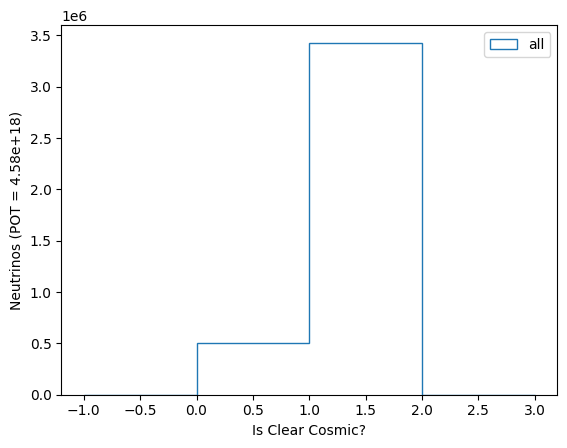

In [37]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic 
values, bins, patches = plt.hist(var, bins=np.linspace(-1., 3., 5), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("Is Clear Cosmic?")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

In [38]:
mc_bnb_cosmic_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

In [39]:
mc_bnb_cosmic_dfs["evt"].slc.barycenterFM

chargeTotal  \
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        41488.691406   
                              1                        41488.691406   
                              2                        41488.691406   
               1              0                        -9999.000000   
                              1                        -9999.000000   
...                                                             ...   
193      466   5              0                        65226.507812   
                              1                        65226.507812   
               6              0                        53121.050781   
                              1                        53121.050781   
                              2                        53121.050781   

                                                         flashTime  \
                                                                     
                                                                     
                                                                     
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                
58       0     0              0                           1.123172   
                              1                           1.123172   
                              2                           1.123172   
               1              0                       -9999.000000   
                              1                       -9999.000000   
...                                                            ...   
193      466   5              0                           0.434118   
                              1                           0.434118   
               6              0                           0.855140   
                              1                           0.855140   
                              2                           0.855140   

                                                           flashPEs  \
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        11756.978516   
                              1                        11756.978516   
                              2                        11756.978516   
               1              0                        -9999.000000   
                              1                        -9999.000000   
...                                                             ...   
193      466   5              0                         2756.051514   
                              1                         2756.051514   
               6              0                        10546.672852   
                              1                        10546.672852   
                              2                        10546.672852   

                                                            chi2        score  \
                                                                                
                                                                                
                                                                                
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                           
58       0     0              0                        1000000.0     0.000001   
                              1                        1000000.0     0.000001   
                              2                        1000000.0     0.000001   
             

## Set up plotting

In [40]:

mode_list = [1, 2, 0, 3, 4, 5, 6, -1, -2, -3]
mode_labels = ["Signal", "CC COH (non. Sig)", "NC (non. Sig)", "QE (non. Sig)", "2p2h (non. Sig)", "RES (non. Sig)", "DIS (non. Sig)", "Non-FV (non. Sig)", "Others (non. Sig)", "Intime Cosmics (non. Sig)"]
colors = ['#d62728',  # Red            Signal
          '#1f77b4',  # Blue           NS CCCOH
          '#ff7f0e',  # Orange          NC
          '#2ca02c',  # Green           QE
          '#17becf',  # Teal           2p2h
          '#9467bd',  # Purple         RES
          '#8c564b',  # Brown           DIS
          '#e377c2',  # Pink            NON FV
          '#7f7f7f',  # Gray             Other
          '#bcbd22']  # Yellow-green      In time cosmics

def draw_reco_stacked_hist(var_mc, var_offbeam_data, is_logx, is_logy,
                           title_x, title_y, x_min, x_max, nbins, outname,
                           data_overlay=False, var_data=[], draw_density=False):
    
    ## Define the output figure to have two pads
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)
    
    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')        
    if is_logy:
        ax_main.set_yscale('log')


    ax_main.set_xlabel("")  # Only bottom has x-label
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize = 20)

    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.set_ylim(0.5, 1.5)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    ## Defind binning
    if is_logx:
        bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
        bin_centers = np.sqrt(bins[:-1] * bins[1:])
    else:
        bins = np.linspace(x_min, x_max, nbins + 1)
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

    ## Define data for MC
    all_mc_data = var_mc + var_offbeam_data
    #print("all_mc_data ", all_mc_data)
    #all_weights = (
    #    [np.ones_like(data) * mc_pot_scale for data in var_mc] + 
    #    [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    #)
    all_weights = (
        [np.ones_like(data) * 1 for data in var_mc] + 
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )
    each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    ## Plot stacked MC
    hist_data, bins, _ = ax_main.hist(all_mc_data,
                                      bins=bins,
                                      weights=all_weights,
                                      stacked=True,
                                      color=colors,
                                      label=mode_labels,
                                      edgecolor='none',
                                      linewidth=0,
                                      density=draw_density,
                                      histtype='stepfilled')

    max_y = np.max(total_mc)

    ## Plot MC stat error box
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ax_main.tick_params(width=2, length=10)
    for spine in ax_main.spines.values():
        spine.set_linewidth(2)

    ## Draw Ratio error bar
    mc_stat_err_ratio = mc_stat_err / total_mc
    mc_content_ratio = total_mc / total_mc
    mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
    mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
    ax_ratio.bar(
        bin_centers,
        2*mc_stat_err_ratio,
        width=np.diff(bins),
        bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ## Draw data too
    if data_overlay:
        ax_main.set_ylabel("Events (POT = %.2e)" % target_pot)
        if draw_density:
            ax_main.set_ylabel("A.U.")

        ## Define data histogram
        counts, _ = np.histogram(var_data, bins=bins)

        bin_widths = np.diff(bins)
        total_data = np.sum(counts)
        print("total data = ", total_data)
        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)

        if draw_density:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)
            data_eyhigh = data_eyhigh / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)

        errors = data_eylow + data_eyhigh
        
        ## Plot data points on main histogram
        #ax_main.errorbar(bin_centers, norm_counts, yerr=errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)
        
        ax_main.errorbar(bin_centers, norm_counts,
                 yerr=np.vstack((data_eylow, data_eyhigh)),
                 fmt='o', color='black', label='Data',
                 markersize=5, capsize=3, linewidth=1.5)
        
        max_y_data = np.max(norm_counts + data_eyhigh)
        #print("max_y: %f" %(max_y))
        #print("max_y_data: %f" %(max_y_data))
        max_y = max(max_y, max_y_data)
        #print("max_y: %f" %(max_y))

        ## Make data/mc ratio plot
        data_ratio = norm_counts / total_mc
        print(norm_counts)
        print(total_mc)
        print("data ratio ", data_ratio)
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_ratio.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black', label='Data',
                  markersize=5, capsize=3, linewidth=1.5)

    ## Set ax_main axes variables
    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.0, max_y * 1.5)
    if is_logy:
        ax_main.set_ylim(0.1, max_y * 600)
    
    # Legend with fractions
    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    print("mode sums = ", individual_sums)
    print("fractions = ", fractions)
    print("total sums = ", total_sum)
    print(mode_labels)
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]
    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")
            #legend_labels.append(f"Data ({total_data:.0f})")
    ax_main.legend(legend_labels, loc='upper left', fontsize=8, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    legend_labels_ratio = ["y=1", "MC (Stat. Only)", "Data/MC"]
    ax_ratio.legend(legend_labels_ratio, loc='upper left', fontsize=6, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))


    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig("./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/" + outname + ".pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

In [41]:
def draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    #mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc.reco.pfp..index')])[[column, nuint_categ_col]].first()
    #data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc.reco.pfp..index')])[[column, nuint_categ_col]].first()
    #data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc.reco.pfp..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    #so this line matches up the reco df and says if the mode is the same as in truth, keep it
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    #print(var_mc_bnb_cosmic)
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]
    draw_reco_stacked_hist(var_mc_bnb_cosmic, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data)


In [42]:
### For drawing data blind plots: this function does not draw data points in bins with singal contribution greater than 10%
def draw_reco_stacked_hist_blind(
    var_mc, var_offbeam_data, is_logx, is_logy,
    title_x, title_y, x_min, x_max, nbins, outname,
    data_overlay=False, var_data=[], draw_density=False,
    blind=True, blind_req=0.1
):
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)

    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')
    if is_logy:
        ax_main.set_yscale('log')

    ax_main.set_xlabel("")
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylim(0.4, 1.6)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])

    all_mc_data = var_mc + var_offbeam_data
    all_weights = (
        [np.ones_like(data) * mc_pot_scale for data in var_mc] +
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )

    each_mc_hist_data = [
        np.histogram(data, bins=bins, weights=w)[0]
        for data, w in zip(all_mc_data, all_weights)
    ]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    hist_data, bins, _ = ax_main.hist(
        all_mc_data, bins=bins, weights=all_weights,
        stacked=True, color=colors, label=mode_labels,
        edgecolor='none', linewidth=0, density=draw_density, histtype='stepfilled'
    )

    max_y = np.max(total_mc)
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
        bin_centers, 2 * mc_stat_err,
        width=np.diff(bins), bottom=total_mc - mc_stat_err,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    mc_stat_err_ratio = np.nan_to_num(mc_stat_err / total_mc, nan=0.)
    mc_content_ratio = np.nan_to_num(total_mc / total_mc, nan=-999.)
    ax_ratio.bar(
        bin_centers, 2 * mc_stat_err_ratio,
        width=np.diff(bins), bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    if data_overlay:
        ax_main.set_ylabel("A.U." if draw_density else f"Events (POT = {target_pot:.2e})")

        counts, _ = np.histogram(var_data, bins=bins)
        bin_widths = np.diff(bins)
        total_data = np.sum(counts)

        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)
        if draw_density and total_data > 0:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths)
            data_eyhigh = data_eyhigh / (total_data * bin_widths)
        elif draw_density:
            norm_counts[:] = 0
            data_eylow[:] = 0
            data_eyhigh[:] = 0

        ### --> Apply blinding to bins where Signal fraction > blind_req
        if blind:
            signal_mc = each_mc_hist_data[0]  # index 0 = "Signal"
            signal_frac = np.nan_to_num(signal_mc / total_mc, nan=0.)
            blind_bins = signal_frac > blind_req
            norm_counts[blind_bins] = -1
            data_eylow[blind_bins] = 0
            data_eyhigh[blind_bins] = 0

        ax_main.errorbar(
            bin_centers, norm_counts,
            yerr=np.vstack((data_eylow, data_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

        max_y_data = np.max(norm_counts + data_eyhigh)
        max_y = max(max_y, max_y_data)

        data_ratio = np.nan_to_num(norm_counts / total_mc, nan=-1.)
        data_ratio_eylow = np.nan_to_num(data_eylow / total_mc, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_eyhigh / total_mc, nan=0.)

        ax_ratio.errorbar(
            bin_centers, data_ratio,
            yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.1 if is_logy else 0.0, max_y * (600 if is_logy else 1.5))

    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i+1] - accum_sum[i] for i in range(len(accum_sum)-1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]

    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")

    ax_main.legend(legend_labels, loc='upper left', fontsize=10, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))
    ax_ratio.legend(["y=1", "MC (Stat. Only)", "Data/MC"], loc='upper left', fontsize=7, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig(f"./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/{outname}.pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

def draw_mc_data_shape_comp_per_slc_blind(mc_bnb_cosmic_df,  data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False, blind = True, blind_req = 0.1):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]

    draw_reco_stacked_hist_blind(var_mc_bnb_cosmic, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data, False, blind, blind_req)

In [43]:
#Draw plots for a number of variables

def draw_reco_valid_plots(mc_bnb_cosmic_df, data_offbeam_df, data_df, suffix, is_logx = False, is_logy = False):
    ## draw 1) clear cosmic, 2) nu score, 3) vertex x,y and z

    ## Neutrino Candidate Selection
    ## -- 1) PE Mask
    opt0_score_col = ('pemask', '', '', '', '', '')
    fractions_opt0_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, opt0_score_col, "PE Mask > 2000", "A.U.", -0.5, 1.5, 2, suffix + "_slc_opt0_score", is_logx, is_logy)

    ## -- 2) Beam Spill Flash
    bary_flash_col = ('slc', 'barycenterFM', 'flashTime', '', '', '')
    fractions_bary_flash = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, bary_flash_col, "Bary Flash Time", "A.U.", -5, 5, 20, suffix + "_bary_flash", is_logx, is_logy)

    ## -- 3) Clear cosmic
    clear_cosmic_col = ('slc', 'is_clear_cosmic', '', '', '', '')
    draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, clear_cosmic_col, "Is Clear Cosmic", "A.U.", -0.5, 1.5, 2, suffix + "_slc_is_clear_cosmic", is_logx, is_logy)
    
    ## -- 4) vertex x,y,z
    vtx_x_col = ('slc', 'vertex', 'x', '', '', '')
    vtx_y_col = ('slc', 'vertex', 'y', '', '', '')
    vtx_z_col = ('slc', 'vertex', 'z', '', '', '')
    fractions_vtx_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_x_col, "Slice Vertex X [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_x", is_logx, is_logy)
    fractions_vtx_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_y_col, "Slice Vertex Y [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_y", is_logx, is_logy)
    fractions_vtx_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_z_col, "Slice Vertex Z [cm]", "A.U.", -100, 600, 100, suffix + "_slc_vtx_z", is_logx, is_logy)

    ## -- 4) nu score
    nu_score_col = ('slc', 'nu_score', '', '', '', '')
    fractions_nu_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, nu_score_col, "Nu Score", "A.U.", 0, 1., 50, suffix + "_slc_nu_score", is_logx, is_logy)

    ## -- 5) barycenterFM
    bary_score_col = ('slc', 'barycenterFM', 'score', '', '', '')
    fractions_bary_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, bary_score_col, "Barycentre Flash Score", "A.U.", 0, 2, 40, suffix + "_bary_score", is_logx, is_logy)

    ## -- 6a) track score
    trk_score_col = ('pfp', 'trackScore', '', '', '', '')
    fractions_trk_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_score_col, "Track Score", "A.U.", 0, 1, 50, suffix + "_pfp_trk_score", is_logx, is_logy)

    ## -- 6b) reconstructed shower energy
    shr_recoE_col = ('pfp', 'shw', 'bestplane_energy', '', '', '')
    fractions_dedx_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_recoE_col, "Shower Energy [GeV]", "A.U.", 0, 2.5, 25, suffix + "_shr_e", is_logx, is_logy)
    
    ##Electron Selection
    ## -- 7) track length
    trk_len_col = ('pfp', 'trk', 'len', '', '', '')
    fractions_trk_len = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_len_col, "Track Length [cm]", "A.U.", 0, 400, 40, suffix + "_pfp_trk_len", is_logx, is_logy)

    ## -- 8) shower conversion cap
    shr_conv_col = ('pfp', 'shw', 'conversion_gap', '', '', '')
    fractions_sonv_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_conv_col, "Shower Conversion Gap [cm]", "A.U.", 0, 20, 40, suffix + "_shr_conv", is_logx, is_logy)

    ## -- 9) shower dE/dx
    shr_dedx_col = ('pfp', 'shw', 'bestplane_dEdx', '', '', '')
    fractions_dedx_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_dedx_col, "Shower dEdx [MeV/cm]", "A.U.", 0, 20, 40, suffix + "_shr_dedx", is_logx, is_logy)
    
    ## -- 10) shower opening angle
    shr_angle_col = ('pfp', 'shw', 'open_angle', '', '', '')
    fractions_ang_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_angle_col, "Shower Angle [rad]", "A.U.", -1, 1, 40, suffix + "_shr_angle", is_logx, is_logy)

    ## -- 11) shower length
    shr_len_col = ('pfp', 'shw', 'len', '', '', '')
    fractions_len_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_len_col, "Shower Length [cm]", "A.U.", 0, 300, 150, suffix + "_shr_len", is_logx, is_logy)
    

In [44]:
data_bnb_light_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

In [45]:
#how many pfps in a slice
group_levels = ['entry', 'rec.slc..index']
pfp_counts = mc_bnb_cosmic_dfs["evt"].groupby(level=group_levels).size()

In [46]:

#mc_bnb_cosmic_dfs["evt"][('npfp', '', '', '', '', '')] = mc_bnb_cosmic_dfs["evt"].groupby(level=group_levels).size()
#data_bnb_light_dfs["evt"][('npfp', '', '', '', '', '')] = data_bnb_light_dfs["evt"].groupby(level=group_levels).size()
#data_offbeam_light_dfs["evt"][('npfp', '', '', '', '', '')] = data_offbeam_light_dfs["evt"].groupby(level=group_levels).size()

In [47]:
mc_bnb_cosmic_dfs["evt"].groupby(level=group_levels).size()

entry  rec.slc..index
0      0                  678
       1                 1038
       2                 1230
       3                 1308
       4                 1144
                         ... 
490    5                    8
       6                    9
       7                    5
       8                   10
       9                    2
Length: 9209, dtype: int64

## OpFlash and light timing cut

In [48]:
def draw_a_distribution(df, col, title_x, x_min, x_max, nbins, title_y = "", is_logx = False, is_logy = False, label_top = ""):
    var = df[col]
    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(var, bins, weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
    if is_logy:
        ax.yscale('log')
    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y)
    ax.legend()
    ax.text(1.0, 1.02, label_top, transform=ax.transAxes, fontsize=14, fontweight='bold', ha='right') 
    plt.show()

def abs_comp_total_pe_two_mc_stack(
    df_mc, df_data_bnb_light, df_data_offbeam_light,
    col_mc, col_data, title_x, x_min, x_max, nbins,
    title_y = "", is_logx = False, is_logy = False, label_top = "",
    mc_scale = 1.533, intime_scale = 1.
):
    mc_var = df_mc[col_mc]
    data_bnb_light_var = df_data_bnb_light[col_data]
    data_offbeam_light_var = df_data_offbeam_light[col_data]

    # (kept for reference; override via intime_scale argument)
    #data_offbeam_light_scale = 0.103

    # Binning
    bins = (np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
            if is_logx else np.linspace(x_min, x_max, nbins + 1))
    bin_centers = (np.sqrt(bins[:-1] * bins[1:])
                   if is_logx else 0.5 * (bins[:-1] + bins[1:]))
    bin_widths = np.diff(bins)

    fig, ax = plt.subplots(figsize=(8, 5))

    # --- Data histogram (BNB light) ---
    ax.hist(
        data_bnb_light_var, bins=bins,
        histtype="step", color="black", linewidth=2,
        label="BNB + light data"
    )

    # --- Components: compute binned counts ---
    mc_hist, _ = np.histogram(mc_var, bins=bins)
    offbeam_hist, _ = np.histogram(data_offbeam_light_var, bins=bins)

    # Apply scales
    mc_hist = mc_hist * mc_scale
    offbeam_hist = offbeam_hist

    # --- Stack components as bars (to show contributions) ---
    # Bottoms for stacking
    bottom0 = np.zeros_like(mc_hist, dtype=float)
    h1 = mc_hist
    h3 = offbeam_hist * intime_scale

    # Use bars so stack works in both linear and log-x; they also respect log-y.
    # (We avoid specifying colors explicitly so you can theme globally if you like.)
    ax.bar(bins[:-1], h1, width=bin_widths, align="edge",
           alpha=0.45, edgecolor="none", label="MC (BNB+cosmic)")
    ax.bar(bins[:-1], h3, width=bin_widths, align="edge",
           bottom=h1, alpha=0.45, edgecolor="none", label="Off-beam light")

    # --- Total prediction overlay (dashed step) ---
    pred_hist = h1 + h3
    ax.step(bin_centers, pred_hist, where="mid", linewidth=2, linestyle="--",
            label="Total prediction", color='red')

    # Scales, labels, cosmetics
    if is_logx:
        ax.set_xscale("log")
    if is_logy:
        ax.set_yscale("log")

    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y if title_y else "Events")
    ax.set_xlim(x_min, x_max)

    # Legend: put data first, then components, then total
    # (Matplotlib collects in order added; this already matches that.)
    ax.legend(frameon=False)

    if label_top:
        ax.text(1.0, 1.02, label_top, transform=ax.transAxes,
                fontsize=14, fontweight='bold', ha='right')

    plt.tight_layout()
    plt.show()
    

In [49]:
mc_bnb_cosmic_opflash_df = mc_bnb_cosmic_dfs['opflash']
data_bnb_light_opflash_df = data_bnb_light_dfs['opflash']
data_offbeam_light_opflash_df = data_offbeam_light_dfs['opflash']

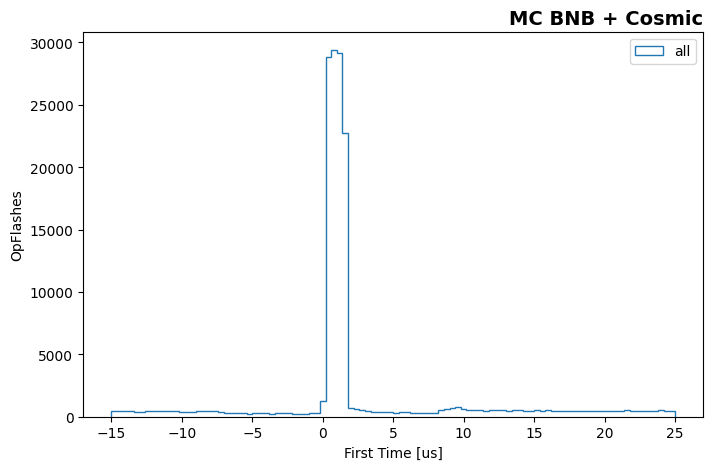

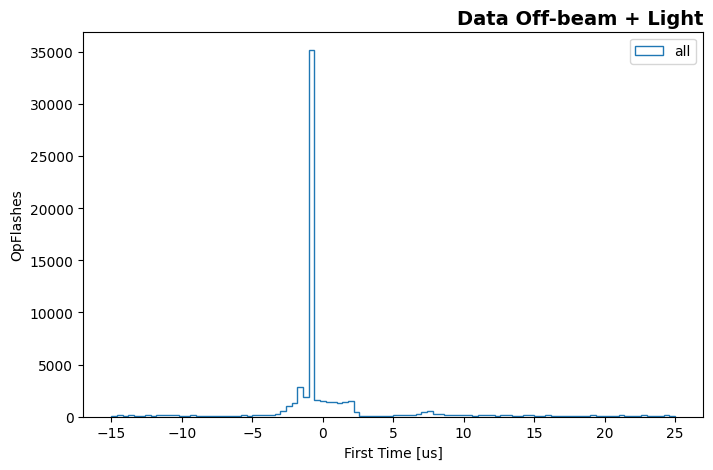

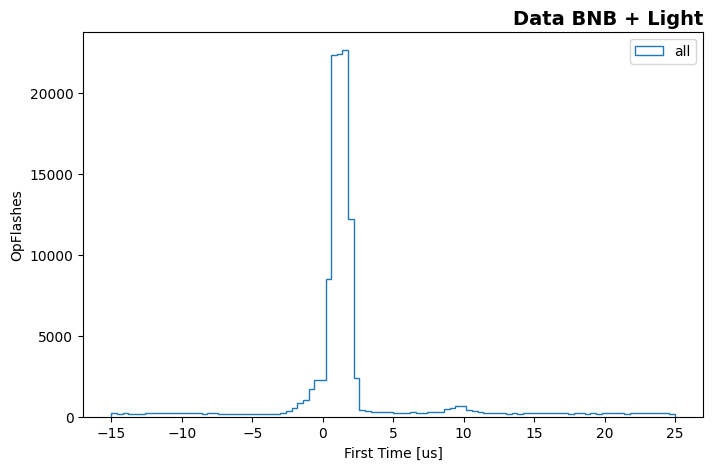

In [50]:
## Check OpFlash First Time distributions
draw_a_distribution(mc_bnb_cosmic_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "MC BNB + Cosmic")
draw_a_distribution(data_offbeam_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data BNB + Light")

In [51]:
## Based on the previous block's result, we use [-5 us, +5 us] window for collecting OpFlashes corresponding to the trigger

mc_bnb_light_opflash_time_cut_df = mc_bnb_cosmic_opflash_df[(mc_bnb_cosmic_opflash_df.firsttime > -5.) & (mc_bnb_cosmic_opflash_df.firsttime < 5.)]
data_offbeam_light_opflash_df = data_offbeam_light_opflash_df[(data_offbeam_light_opflash_df.firsttime > -5.) & (data_offbeam_light_opflash_df.firsttime < 5.)]
data_bnb_light_opflash_df = data_bnb_light_opflash_df[(data_bnb_light_opflash_df.firsttime > -5.) & (data_bnb_light_opflash_df.firsttime < 5.)]

In [52]:
## Sum PEs for OpFlashes within the timing window

mc_bnb_cosmic_totalpe_sum_time_cut=(mc_bnb_light_opflash_time_cut_df.groupby(level=[0, 1])["totalpe"].sum())
data_offbeam_light_totalpe_sum_time_cut=(data_offbeam_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())
data_bnb_light_totalpe_sum_time_cut=(data_bnb_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())

In [53]:
## Add the total PE column to the hdr DataFrames, and fill empty (NaN) entries with 0.

mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = mc_bnb_cosmic_totalpe_sum_time_cut
mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = (mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_offbeam_light_dfs['hdr']['totalpe_timecut'] = data_offbeam_light_totalpe_sum_time_cut
data_offbeam_light_dfs['hdr']['totalpe_timecut'] = (data_offbeam_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_bnb_light_dfs['hdr']['totalpe_timecut'] = data_bnb_light_totalpe_sum_time_cut
data_bnb_light_dfs['hdr']['totalpe_timecut'] = (data_bnb_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

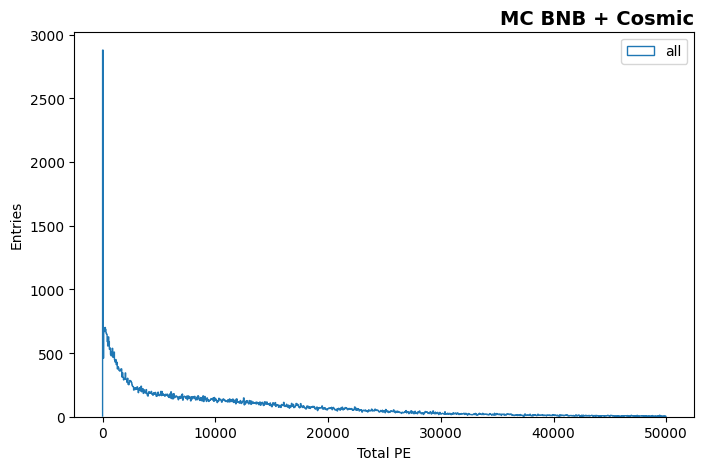

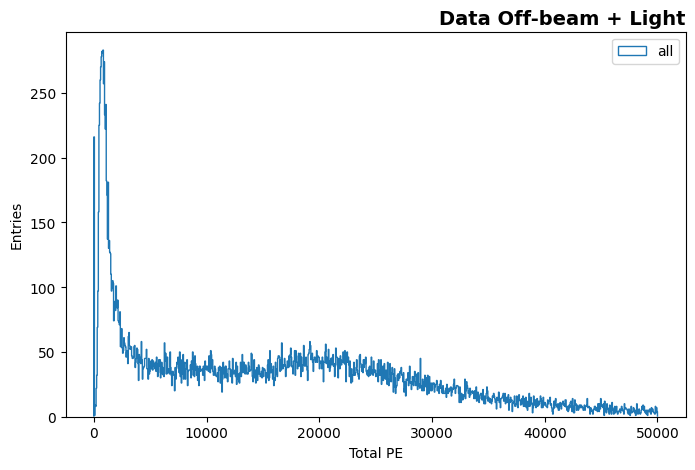

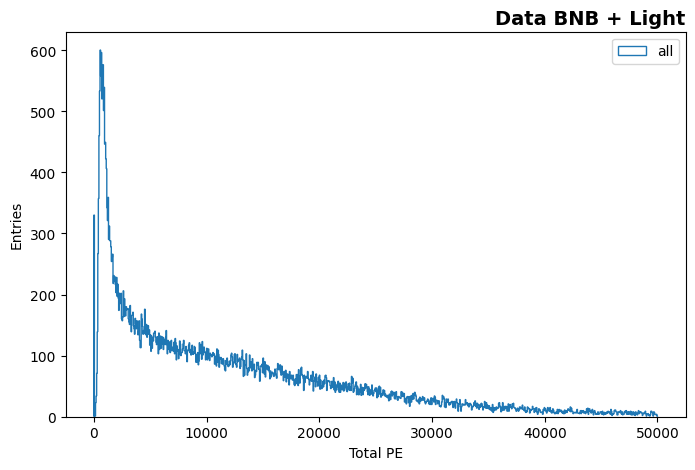

In [54]:
## Check the total PE distributions

draw_a_distribution(mc_bnb_cosmic_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "MC BNB + Cosmic")
draw_a_distribution(data_offbeam_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data BNB + Light")

In [55]:
## Apply a scale to MC total PE
mc_bnb_cosmic_hdr_df = mc_bnb_cosmic_dfs['hdr']
#mc_bnb_cosmic_hdr_df['totalpe_timecut_0p66'] = mc_bnb_cosmic_hdr_df['totalpe_timecut'] * 0.66

data_offbeam_light_hdr_df = data_offbeam_light_dfs['hdr']
data_bnb_light_hdr_df = data_bnb_light_dfs['hdr']

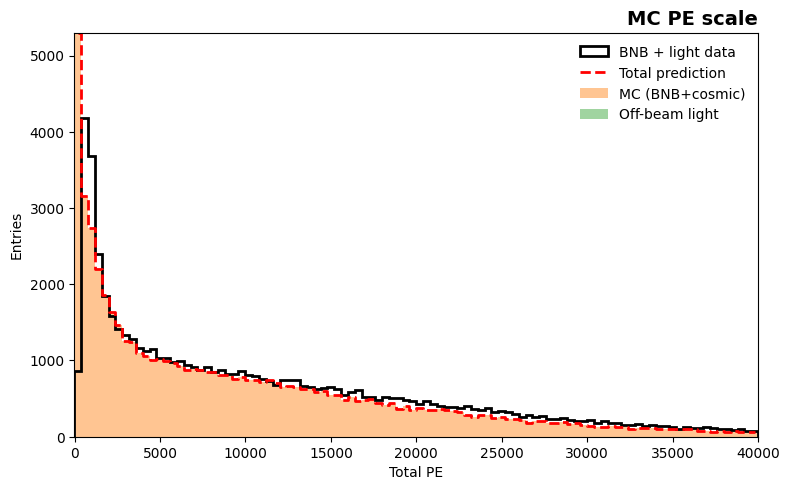

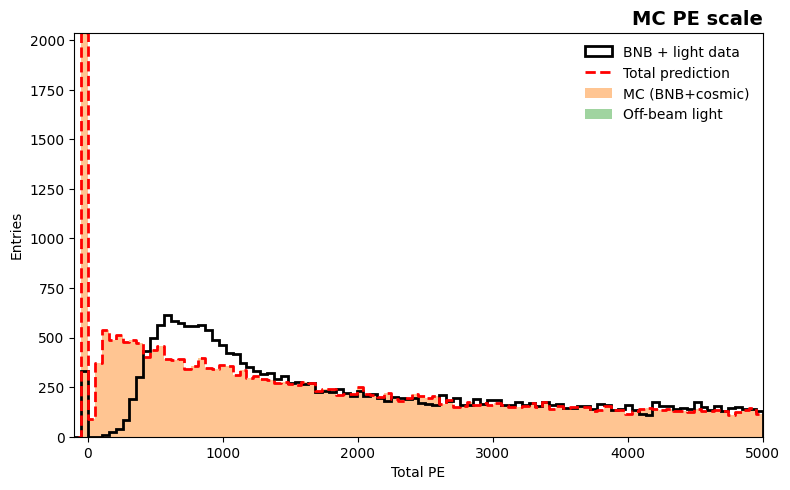

In [56]:
## Check total PE distribution
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut'), ('totalpe_timecut'), "Total PE", -10., 40000, 100, "Entries", False, False, "MC PE scale", mc_pot_scale, intime_gate_scale)
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut'), ('totalpe_timecut'), "Total PE", -100, 5000, 100, "Entries", False, False, "MC PE scale", mc_pot_scale, intime_gate_scale)

In [57]:
## DEFINE PE CUT
total_pe_cut = 2000.
mc_bnb_cosmic_pe_mask = mc_bnb_cosmic_hdr_df["totalpe_timecut"] > total_pe_cut
data_offbeam_pe_mask = data_offbeam_light_hdr_df['totalpe_timecut'] > total_pe_cut
data_bnb_light_pe_mask = data_bnb_light_hdr_df['totalpe_timecut'] > total_pe_cut

In [58]:
## Since evt DataFrame has more level in labels, we should make a mask for considering the difference
def get_evt_pe_mask(mask, df):
    sel_idx = mask[mask].index
    pairs = df.index.droplevel([-2, -1])
    mask2 = pairs.isin(sel_idx)
    return mask2

In [59]:
mc_bnb_cosmic_evt_pe_mask = get_evt_pe_mask(mc_bnb_cosmic_pe_mask, mc_bnb_cosmic_dfs["evt"])
data_offbeam_evt_pe_mask = get_evt_pe_mask(data_offbeam_pe_mask, data_offbeam_light_dfs["evt"])
data_bnb_light_evt_pe_mask = get_evt_pe_mask(data_bnb_light_pe_mask, data_bnb_light_dfs["evt"])

In [60]:
## Double checking for legnths of evt DataFrame and the mask array
print("mc_bnb_cosmic_dfs['evt'] length: %d" %len(mc_bnb_cosmic_dfs['evt']))
print("mc_bnb_cosmic_evt_pe_mask length: %d" %len(mc_bnb_cosmic_evt_pe_mask))

print("data_offbeam_light_dfs['evt'] length: %d" %len(data_offbeam_light_dfs['evt']))
print("data_offbeam_evt_pe_mask length: %d" %len(data_offbeam_evt_pe_mask))

print("data_bnb_light_dfs['evt'] length: %d" %len(data_bnb_light_dfs['evt']))
print("data_bnb_light_evt_pe_mask length: %d" %len(data_bnb_light_evt_pe_mask))

mc_bnb_cosmic_dfs['evt'] length: 3934878
mc_bnb_cosmic_evt_pe_mask length: 3934878
data_offbeam_light_dfs['evt'] length: 1836403
data_offbeam_evt_pe_mask length: 1836403
data_bnb_light_dfs['evt'] length: 3408174
data_bnb_light_evt_pe_mask length: 3408174


In [61]:
## Add PE cut decision (boolean) column to evt DataFrame
mc_bnb_cosmic_dfs["evt"][('pemask', '', '', '', '', '')] = mc_bnb_cosmic_evt_pe_mask
data_bnb_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_bnb_light_evt_pe_mask
data_offbeam_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_offbeam_evt_pe_mask

#need to actually apply this???

/tmp/ipykernel_1536/2468786910.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mc_bnb_cosmic_dfs["evt"][('pemask', '', '', '', '', '')] = mc_bnb_cosmic_evt_pe_mask


## Apply selection

/tmp/ipykernel_1536/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_1536/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_1536/1280684055.py:88: RuntimeWarning

total data =  588960
[111839 477121]
[175016 557692]
data ratio  [0.63902158 0.85552778]
mode sums =  [111.0, 39.0, 4887.0, 10651.0, 2885.0, 6137.0, 1301.0, 25583.0, 681114.0, 0.0]
fractions =  [0.015149281842152671, 0.00532272064724283, 0.6669778411045055, 1.4536486567636766, 0.3937448478793735, 0.8375778618494679, 0.177560501591357, 3.491568264574701, 92.95845002374752, 0.0]
total sums =  732708.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


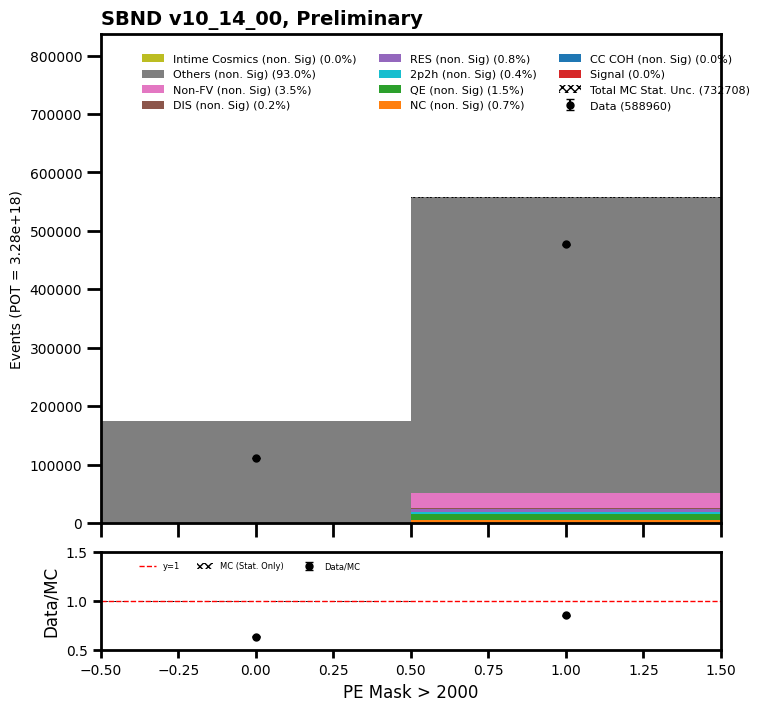

total data =  521082
[   996    990   1054   1080   1932   3067   5869   4554 450901   8404
   8170  10273   9180   6051   2201   1322   1433   1324   1135   1146]
[  1488.   1428.   1359.   1413.   1752.   1406.   1404.   1387.   1554.
   1556. 111660. 185689. 184296.  87489.   3011.   2773.   2328.   1845.
   1833.   1868.]
data ratio  [6.69354839e-01 6.93277311e-01 7.75570272e-01 7.64331210e-01
 1.10273973e+00 2.18136558e+00 4.18019943e+00 3.28334535e+00
 2.90155084e+02 5.40102828e+00 7.31685474e-02 5.53236864e-02
 4.98111733e-02 6.91629805e-02 7.30986383e-01 4.76739993e-01
 6.15549828e-01 7.17615176e-01 6.19203492e-01 6.13490364e-01]
mode sums =  [111.0, 39.0, 4825.0, 10608.0, 2875.0, 6118.0, 1299.0, 25365.0, 546299.0, 0.0]
fractions =  [0.018576193353069842, 0.00652677063756508, 0.8074786750320899, 1.7752816134177014, 0.48114014315383596, 1.023866224631363, 0.2173916681588984, 4.2449112108163645, 91.42482750079911, 0.0]
total sums =  597539.0
['Signal', 'CC COH (non. Sig)', 'NC (n

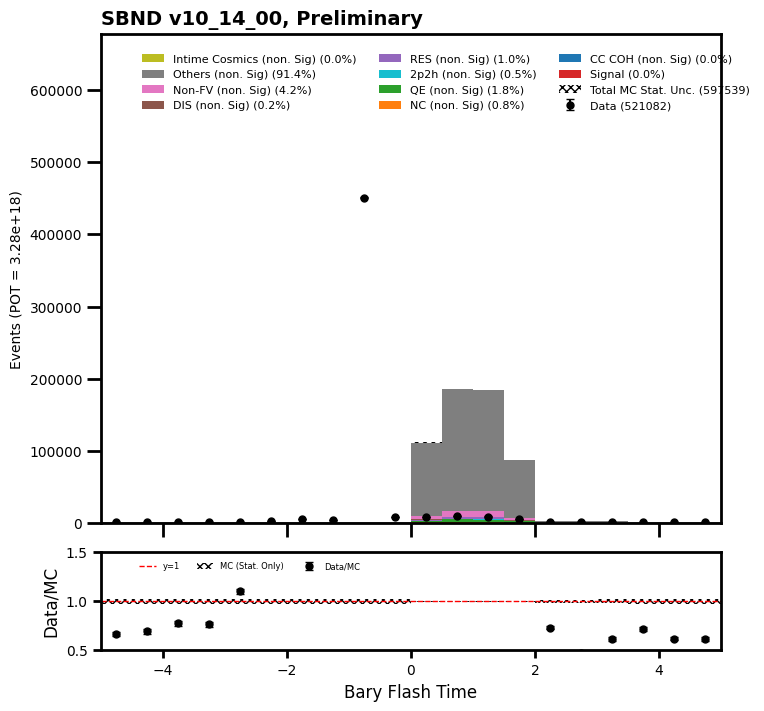

total data =  588960
[147355 441605]
[211 337]
data ratio  [ 698.36492891 1310.40059347]
mode sums =  [111.0, 39.0, 23.0, -101.0, 69.0, -7.0, 21.0, 239.0, 154.0, 0.0]
fractions =  [20.255474452554743, 7.116788321167883, 4.197080291970803, -18.43065693430657, 12.59124087591241, -1.2773722627737227, 3.832116788321168, 43.613138686131386, 28.102189781021895, 0.0]
total sums =  548.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


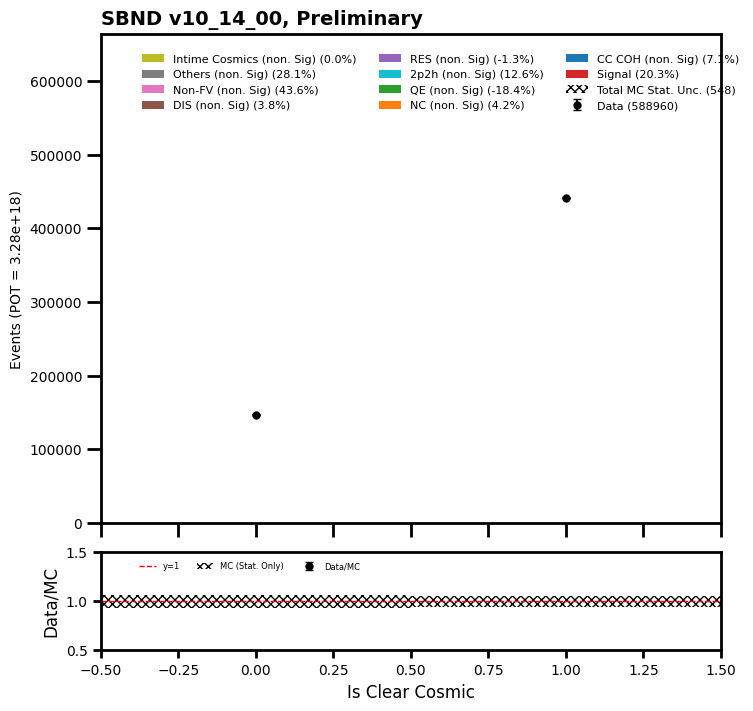

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588820
[    0     0     0     0     0     0     0     0     0     0   144 17036
  2948  3350  3590  3416  8879  5008  4922  4914  5022  5071  5320  5426
  5509  5566  5595  5542  5766  5770  5788  5834  5960  6093  6284  6318
  6400  6589  6500  6814  6768  6938  7002  7264 39216 10940 11663 11981
 11684 10569 10063 11388 11541 11413 10956 39514  7152  7327  7063  6971
  6761  6757  6378  6526  6312  6259  6099  6002  5876  6000  5823  5578
  5622  5632  5431  5391  5246  5083  5036  4902  4829  4885  4820  8231
  3337  3609  3368  3084 16925   231     0     0     0     0     0     0
     0     0     0     0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 1.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00 1.4800e+02 2.0844e+04
 3.8040e+03 3.9670e+03 4.1580e+03 3.9700e+03 1.0564e+04 6.0170e+03
 6.1630e+03 6.2030e+03 6.2220e+03 6.3880e+03 6.2530e+03 6.7870e+03
 6.9680e+03 6.9630e+03 7.0720e+03 7.1230e+03 7.1530e+03 7.3500e+03
 7.4890e+03 7.5050e+03 7.6600e+03 

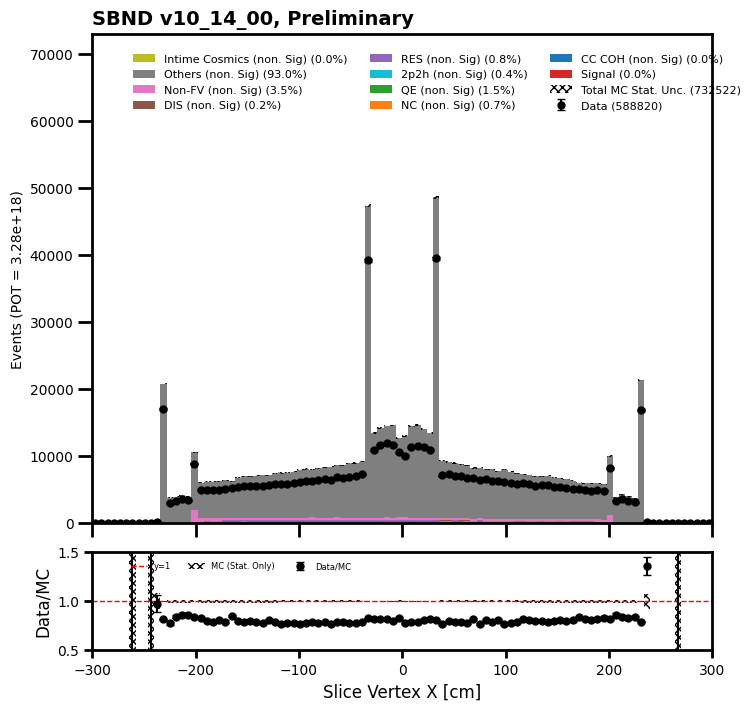

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  588805
[     0      0      0      0      0      0      0      0      2      1
      0      1      0      0      0     21   8491   2812   2605   3042
   3174   3425   3550   3670   3887   3947   4168   4118   4201   4357
   4659   4586   4427   4554   4715   4955   4746   4766   4858   4771
   5084   5153   4955   5110   5059   5639   5058   5059   5274   6373
   5302   5107   5802   5268   5476   5488   5957   5544   5699   5800
   5780   5779   5818   6080   6072   6236   6069   6130   6344   6565
   6629   6710   6600   6977   7121   7084   7293   7643   7798   8035
   8421  10019  15347 197415  13939     70     35     32      8      4
      8      5      8      3      7      1      0      1      0      3]
[1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 1.00000e+00
 0.00000e+00 1.00000e+00 1.00000e+00 2.92000e+02 8.67800e+03 2.13200e+03
 2.71800e+03 3.21100e+03 3.55100e+03 3.88500e+03 

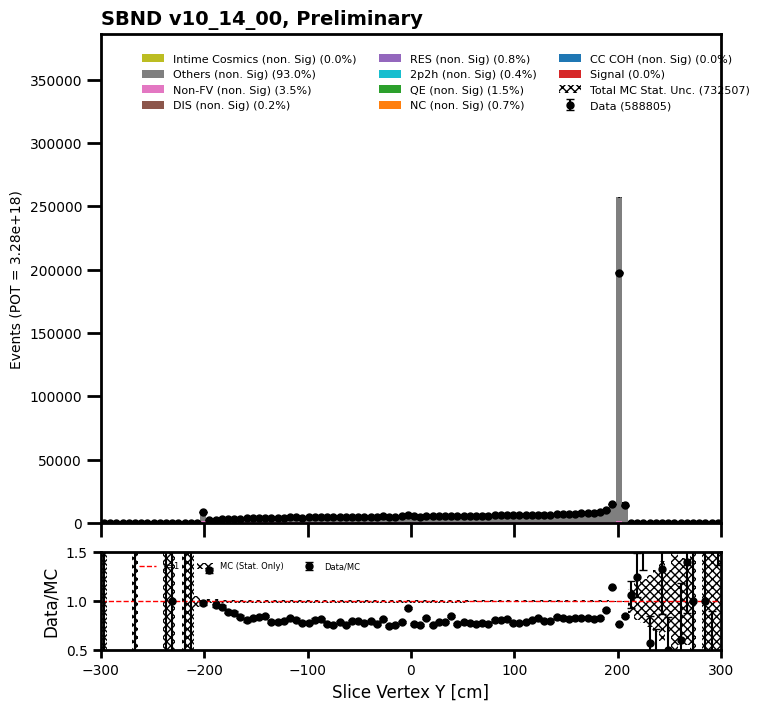

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  588813
[    2     0     0     1     0     0     0     2     0     1     1     6
     9 12279 37602  6428  6473  6561  6984  6955  7048  7048  7075  6737
  6667  7229  7032  7059  7116  7146  7245  6999  7133  7154  7206  6969
  7528  7106  7296  7356  7164  7292  7082  7179  7150  7256  7155  7127
  6194  6720  8005  7951  7806  7433  7367  7396  7273  7348  7229  7483
  7375  7292  7324  7340  7262  7201  7438  7513  7117  7245  7558  7419
  7390  7287  7525  7358  7291  7466  7448  7321  7387  7590  7590  7836
  7590 20487 12083    11     0     2     0     0     0     1     0     0
     0     2     1     0]
[0.0000e+00 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 1.0000e+00 3.0000e+00 1.0000e+00 4.0000e+00 5.0000e+00
 1.0000e+01 6.4750e+03 5.3213e+04 8.1560e+03 8.2340e+03 8.5610e+03
 8.8420e+03 8.6090e+03 8.8410e+03 8.6690e+03 8.9700e+03 8.5270e+03
 8.7700e+03 8.9540e+03 8.9980e+03 9.1520e+03 8.9830e+03 8.9430e+03
 9.0460e+03 8.9150e+03 9.1760e+03 

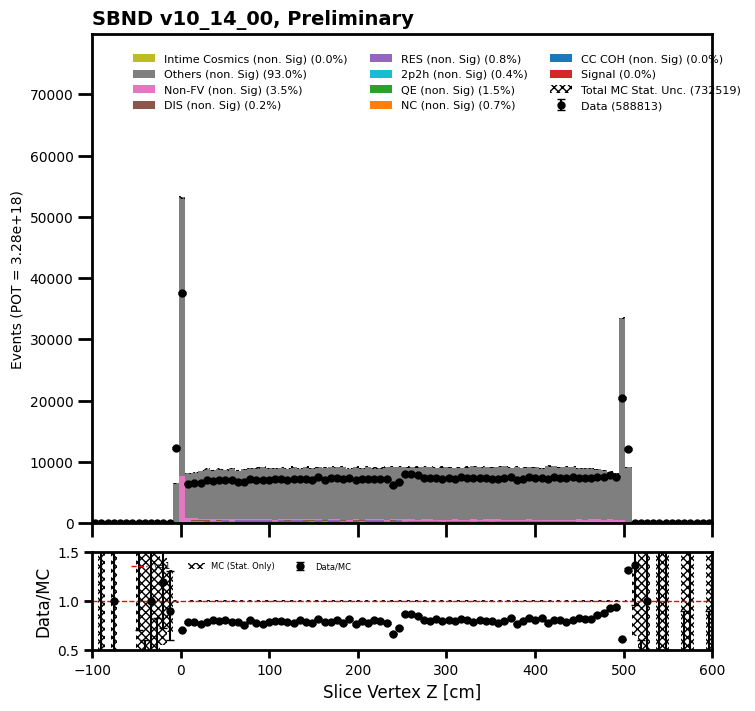

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147355
[    0     0     0     0     0     0     0     0     0     4    33   127
   438  1181  2482  4213  6416  9228 12049 13666 14747 13869 12663 10798
  8291  6637  5901  4810  4203  3489  3023  2739  2267  1876  1299   622
   237    41     6     0     0     0     0     0     0     0     0     0
     0     0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 3.0000e+00 1.5000e+01 1.0400e+02 3.7500e+02
 1.1080e+03 2.5300e+03 4.5240e+03 6.9940e+03 9.5280e+03 1.1957e+04
 1.4526e+04 1.4786e+04 1.5290e+04 1.4318e+04 1.2460e+04 1.0333e+04
 8.7360e+03 7.3530e+03 6.0260e+03 5.2340e+03 4.8350e+03 4.2440e+03
 3.7720e+03 3.3850e+03 3.0020e+03 2.6040e+03 1.9030e+03 9.9900e+02
 4.2700e+02 9.0000e+01 1.2000e+01 2.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         

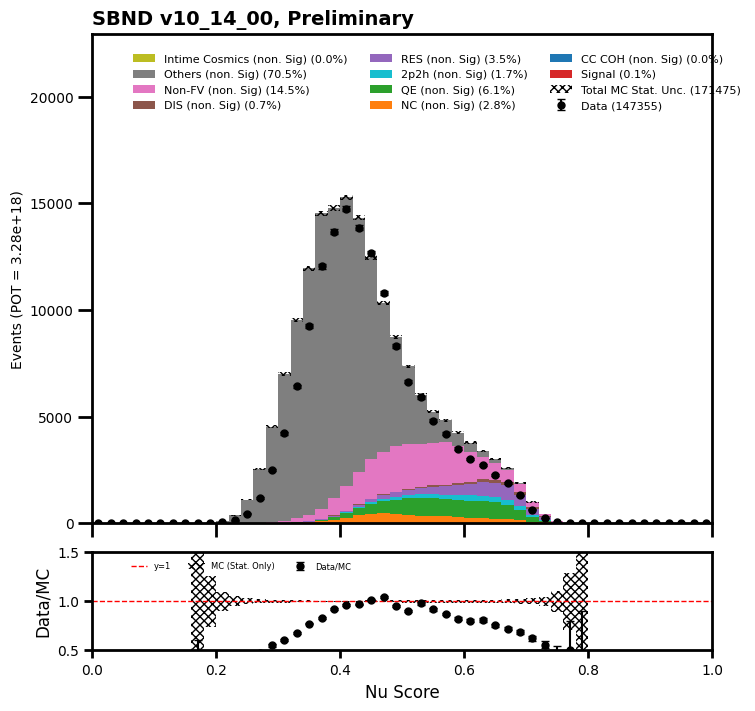

total data =  519784
[474977  13442   7825   4949   3466   2476   2019   1565   1214    979
    870    725    598    539    487    367    328    280    267    240
    234    214    192    151    144    140    117     92    106    101
    102     83     92     70     59     67     57     47     53     50]
[5.50036e+05 1.81020e+04 9.15600e+03 5.29400e+03 3.38200e+03 2.39800e+03
 1.69300e+03 1.22600e+03 9.57000e+02 7.07000e+02 6.01000e+02 4.63000e+02
 4.06000e+02 3.12000e+02 2.89000e+02 2.34000e+02 2.18000e+02 2.01000e+02
 1.57000e+02 1.30000e+02 1.20000e+02 1.16000e+02 8.80000e+01 7.30000e+01
 7.40000e+01 6.50000e+01 7.60000e+01 5.70000e+01 5.50000e+01 3.50000e+01
 4.50000e+01 4.30000e+01 3.30000e+01 3.70000e+01 3.10000e+01 2.60000e+01
 2.80000e+01 1.70000e+01 2.50000e+01 1.90000e+01]
data ratio  [0.86353802 0.74256988 0.85463084 0.93483189 1.02483737 1.03252711
 1.19255759 1.27650897 1.26854754 1.38472419 1.44758735 1.56587473
 1.4729064  1.7275641  1.68512111 1.56837607 1.50458716 1.39

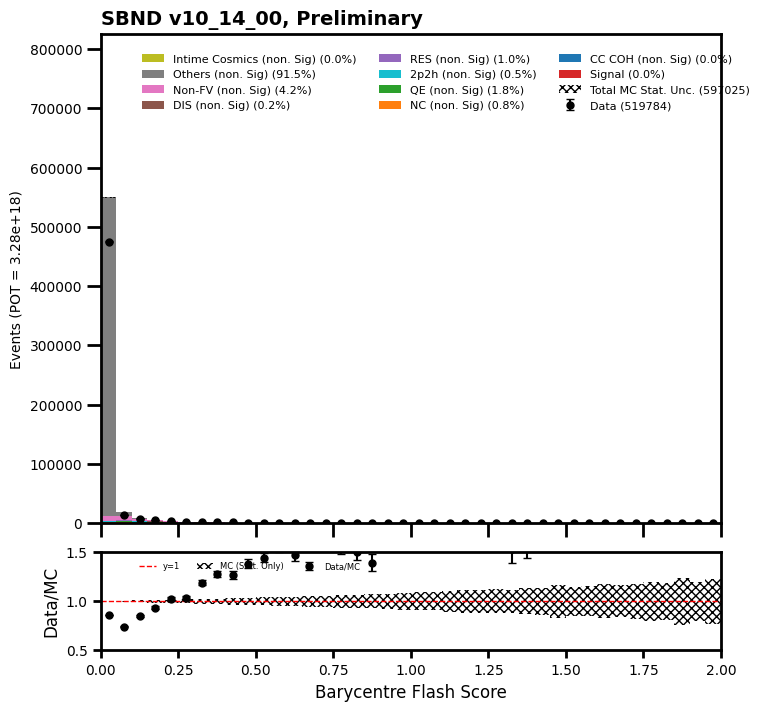

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147317
[   0    0    0    0    0    0    0    0    0    0   16   36   68  118
  199  277  414  539  787 1101 1606 2447 3649 4138 3992 3943 4787 5883
 6727 6779 6888 6828 6676 6795 6816 7297 7514 7830 7455 7636 7222 7124
 6512 5185 1931  102    0    0    0    0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 5.000e+00 1.600e+01 3.200e+01 8.700e+01 1.360e+02
 2.400e+02 3.420e+02 5.830e+02 8.560e+02 1.199e+03 1.679e+03 2.307e+03
 3.206e+03 4.596e+03 4.987e+03 4.324e+03 3.879e+03 4.466e+03 5.882e+03
 7.277e+03 7.596e+03 7.943e+03 7.718e+03 7.498e+03 7.676e+03 7.926e+03
 8.300e+03 8.728e+03 9.201e+03 8.944e+03 8.863e+03 8.743e+03 8.726e+03
 8.196e+03 6.528e+03 2.611e+03 1.350e+02 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         0.         1.         1.125
 0.7816092  0.86764706 0.82916667 0.80994152 0.71012007 0.6296729
 0.65638

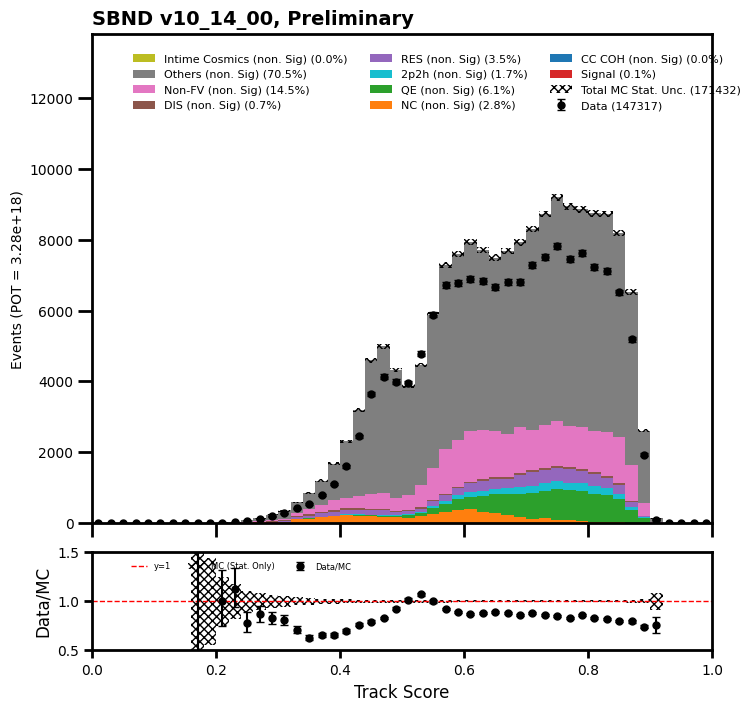

total data =  588418
[79657 87475 78260 67215 56220 45103 35658 29779 33180 35041 20437 10171
  5082  2612  1217   531   246   153    88    66    69    51    45    30
    32]
[8.68490e+04 1.06652e+05 9.95640e+04 8.74810e+04 7.36650e+04 5.91490e+04
 4.64750e+04 3.97670e+04 4.76350e+04 4.19460e+04 2.17120e+04 1.06970e+04
 5.47300e+03 2.64200e+03 1.13800e+03 5.21000e+02 2.66000e+02 1.52000e+02
 1.07000e+02 7.20000e+01 7.00000e+01 4.10000e+01 4.40000e+01 4.50000e+01
 3.50000e+01]
data ratio  [0.9171896  0.8201909  0.78602708 0.76833827 0.76318469 0.76253191
 0.76725121 0.74883698 0.69654666 0.83538359 0.94127671 0.95082733
 0.92855838 0.98864497 1.06942004 1.01919386 0.92481203 1.00657895
 0.82242991 0.91666667 0.98571429 1.24390244 1.02272727 0.66666667
 0.91428571]
mode sums =  [108.0, 39.0, 4875.0, 10645.0, 2882.0, 6132.0, 1299.0, 25564.0, 680654.0, 0.0]
fractions =  [0.014750108577188137, 0.005326428097317939, 0.6658035121647423, 1.4538417204089604, 0.3936093788838538, 0.83747838699368

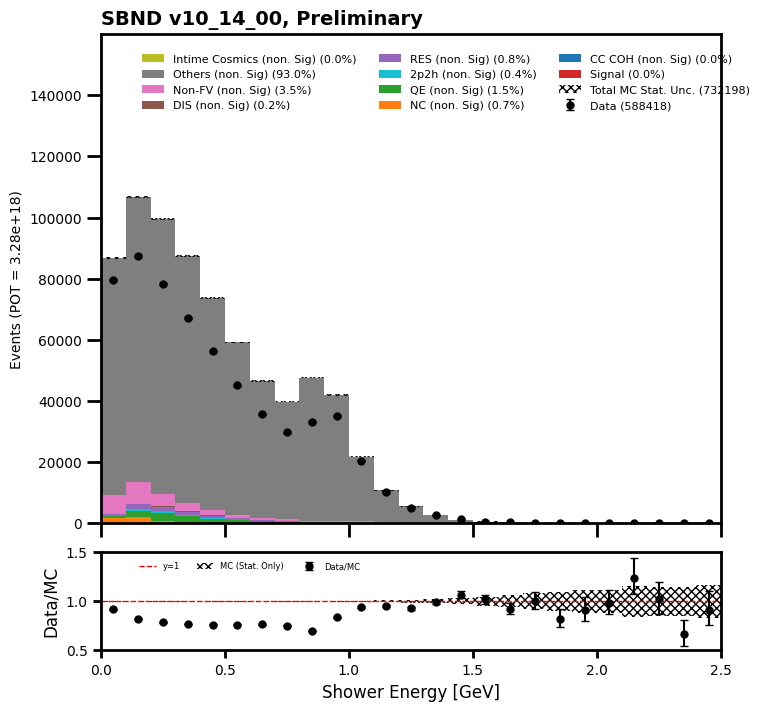

total data =  501014
[13995 24413 19753 18975 18965 18592 18440 18229 17977 17623 17185 16776
 16220 15777 15388 14882 14541 14103 13124 12971 12676 12012 11310 10830
 10461  9732  9239  8847  8397  7794  7405  7032  6915  6469  6352  5929
  5479  5392  5078  5736]
[18290. 28090. 20463. 20279. 20932. 21386. 21494. 21313. 21316. 21440.
 21137. 20489. 20254. 19813. 19457. 19082. 18359. 17760. 17243. 16586.
 16127. 15577. 14656. 13862. 13204. 12621. 12128. 11634. 10738. 10182.
  9815.  9264.  9130.  8602.  8136.  7708.  7477.  7018.  6788.  6759.]
data ratio  [0.76517223 0.86909932 0.96530323 0.93569703 0.90602905 0.86935378
 0.85791384 0.85529958 0.8433571  0.82196828 0.81302929 0.81878081
 0.80082947 0.79629536 0.79087218 0.77989729 0.7920366  0.79408784
 0.76112045 0.7820451  0.78601104 0.77113693 0.7716976  0.78127254
 0.79225992 0.77109579 0.7617909  0.76044353 0.7819892  0.76546847
 0.75445746 0.75906736 0.75739321 0.75203441 0.78072763 0.76920083
 0.73278053 0.76831006 0.74808486 0

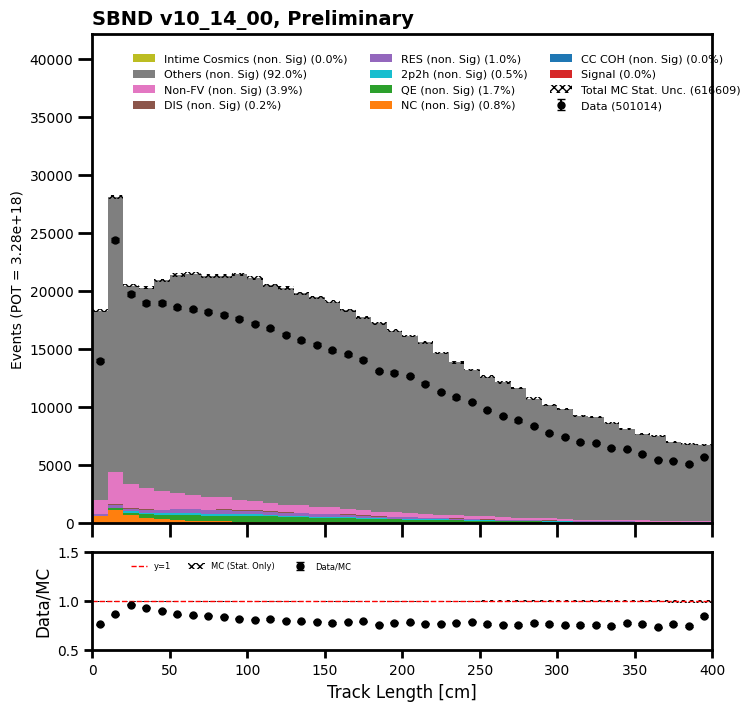

total data =  583122
[531693  30961   8269   2642   1533   1086    882    641    466    390
    338    309    271    245    239    208    195    179    162    183
    149    139    158    132    146    150    133    112    110    108
     93    109     82    101     84     95     99     68     93     69]
[6.75936e+05 2.73990e+04 8.19400e+03 2.98600e+03 1.68700e+03 1.18100e+03
 8.90000e+02 7.36000e+02 5.70000e+02 4.61000e+02 3.64000e+02 3.27000e+02
 2.72000e+02 2.96000e+02 2.74000e+02 2.64000e+02 2.39000e+02 2.12000e+02
 1.72000e+02 1.84000e+02 2.02000e+02 2.11000e+02 1.83000e+02 2.05000e+02
 1.66000e+02 1.51000e+02 1.57000e+02 1.50000e+02 1.46000e+02 1.21000e+02
 1.35000e+02 1.11000e+02 1.30000e+02 1.23000e+02 1.09000e+02 1.19000e+02
 1.10000e+02 9.80000e+01 1.06000e+02 8.70000e+01]
data ratio  [0.78660258 1.13000474 1.00915304 0.88479571 0.90871369 0.9195597
 0.99101124 0.87092391 0.81754386 0.84598698 0.92857143 0.94495413
 0.99632353 0.8277027  0.87226277 0.78787879 0.81589958 0.844

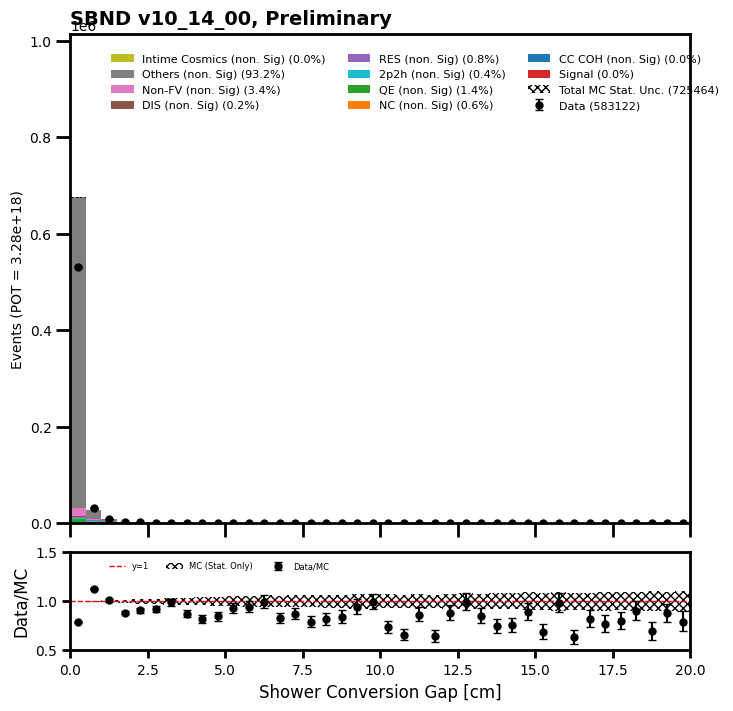

total data =  362189
[   864  10588  61358 175192  49626  15451   9028   7470   7286   6234
   5010   3524   2303   1481    986    711    586    442    418    337
    324    344    316    335    289    295    215    208    147    140
     98     97     90     70     65     62     51     53     61     34]
[3.6400e+02 3.1510e+03 5.2313e+04 2.9576e+05 5.3336e+04 1.6453e+04
 1.0819e+04 1.1189e+04 1.0136e+04 8.7330e+03 7.1100e+03 4.5490e+03
 2.8540e+03 1.9040e+03 1.3320e+03 9.7600e+02 6.9900e+02 6.0000e+02
 5.7900e+02 4.4300e+02 3.8300e+02 4.2700e+02 4.2400e+02 5.0800e+02
 5.7000e+02 6.1200e+02 5.1600e+02 4.6000e+02 3.3800e+02 2.2300e+02
 1.9200e+02 1.6000e+02 1.2800e+02 1.1000e+02 9.4000e+01 8.9000e+01
 8.9000e+01 6.8000e+01 6.0000e+01 6.2000e+01]
data ratio  [2.37362637 3.36020311 1.17290157 0.59234514 0.93044098 0.93909925
 0.8344579  0.66761998 0.71882399 0.71384404 0.70464135 0.77467575
 0.80693763 0.77783613 0.74024024 0.72848361 0.83834049 0.73666667
 0.72193437 0.76072235 0.845953  

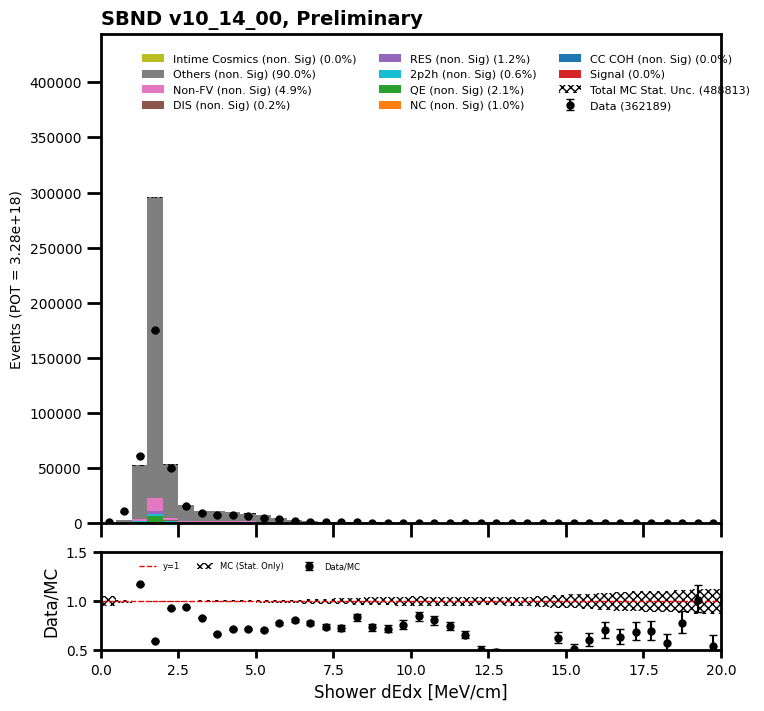

/tmp/ipykernel_1536/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1536/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1536/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1536/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1536/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588642
[     0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
 533000  34115   8371   4410   2558   1668   1143    827    572    458
    368    256    224    161    152    112     98     53     58     38]
[0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 6.70994e+05 3.50990e+04 9.81400e+03 5.54200e+03
 3.26500e+03 2.06000e+03 1.45300e+03 9.81000e+02 7.24000e+02 5.53000e+02
 4.05000e+02 3.31000e+02 2.50000e+02 2.17000e+02 1.67000e+02 1.49000e+02
 8.90000e+01 9.90000e+01 5.40000e+01 4.40000e+01]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan     

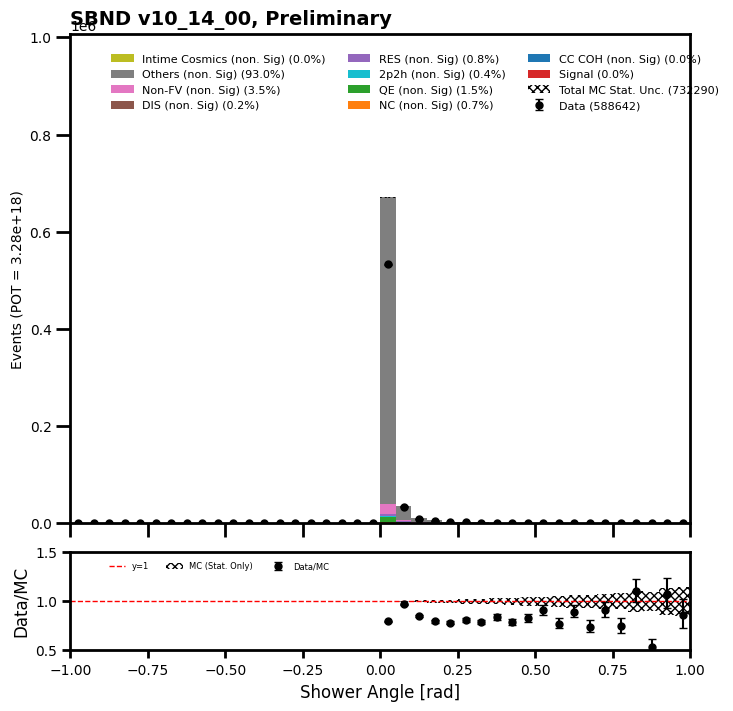

total data =  464049
[ 302 1788 3644 5539 6223 6350 5715 5106 4758 4707 4568 4544 4509 4251
 4246 4310 4242 4337 4346 4350 4355 4237 4128 4037 4306 4099 4196 4258
 4113 4120 4113 4047 4050 4052 4120 4081 3952 4145 4020 3971 3866 4014
 4033 3938 3821 3921 3829 3707 3815 3858 3671 3759 3711 3665 3664 3662
 3515 3496 3484 3599 3482 3494 3478 3428 3405 3386 3449 3393 3359 3241
 3245 3213 3267 3233 3098 3282 3222 3110 3047 3077 3084 2911 2898 3005
 2874 2848 2951 2844 2899 2807 2779 2850 2795 2836 2694 2604 2692 2688
 2465 2575 2539 2451 2478 2405 2515 2387 2339 2354 2324 2270 2219 2292
 2277 2103 2185 2121 2118 2119 2091 2124 1978 1990 1857 1957 1954 1956
 1854 1793 1861 1858 1791 1756 1757 1707 1644 1685 1630 1616 1655 1588
 1562 1528 1571 1588 1491 1525 1537 1496 1471 1411]
[ 356. 2524. 4836. 6906. 7863. 7527. 6556. 5657. 5232. 4954. 4773. 4601.
 4591. 4590. 4568. 4540. 4603. 4679. 4764. 4731. 4739. 4700. 4655. 4814.
 4830. 4958. 4773. 4882. 4905. 4711. 4765. 4921. 4821. 4719. 4816. 4796

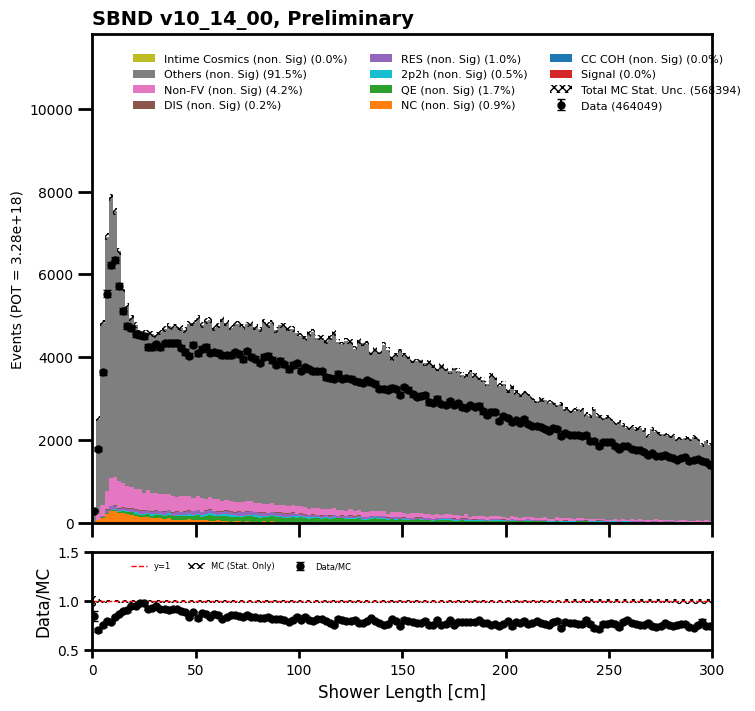

In [62]:
## Reco 0) Nocut
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "no_cut")

In [64]:
purity = 79.56706237792969/525590.3338040113
efficiency = 79.56706237792969/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.02 % and efficiency =  100.0 %


In [65]:
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64

In [66]:
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts().sum()

149844

In [67]:
103/149844

0.0006873815434718775

In [85]:
mc_bnb_cosmic_dfs["evt"]

slc  \
                                                       barycenterFM   
                                                        chargeTotal   
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        41488.691406   
                              1                        41488.691406   
                              2                        41488.691406   
               1              0                        -9999.000000   
                              1                        -9999.000000   
..                                                              ...   
193      466   5              0                        65226.507812   
                              1                        65226.507812   
               6              0                        53121.050781   
                              1                        53121.050781   
                              2                        53121.050781   

                                                                    \
                                                                     
                                                         flashTime   
                                                                     
                                                                     
                                                                     
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                
58       0     0              0                           1.123172   
                              1                           1.123172   
                              2                           1.123172   
               1              0                       -9999.000000   
                              1                       -9999.000000   
..                                                             ...   
193      466   5              0                           0.434118   
                              1                           0.434118   
               6              0                           0.855140   
                              1                           0.855140   
                              2                           0.855140   

                                                                     \
                                                                      
                                                           flashPEs   
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        11756.978516   
                              1                        11756.978516   
                              2                        11756.978516   
               1              0                        -9999.000000   
                              1                        -9999.000000   
..                                                              ...   
193      466   5              0                         2756.051514   
                              1                         2756.051514   
               6              0                        10546.672852   
                              1                        10546.672852   
                              2                        10546.672852   

                                                                               \
                                                                                
                                                            chi2        score   
  

In [68]:
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts()

nuint_categ
-2.0    3758259
-1.0      76482
 3.0      34953
 5.0      29496
 0.0      16471
 4.0      11059
 6.0       7490
 1.0        504
 2.0        164
Name: count, dtype: int64

In [79]:
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts().sum()

3934878

In [69]:
nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')
column = ('pfp', 'shw', 'len', '', '', '')
mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()

pfp         gen
                                      shw nuint_categ
                                      len            
                                                     
                                                     
                                                     
__ntuple entry rec.slc..index                        
0        0     0                -5.000000        -2.0
               1               462.565491        -2.0
               2               500.572113        -2.0
               3               437.741028        -2.0
               4               354.807526        -2.0
..                                    ...         ...
193      466   2               345.653687        -2.0
               3               202.503143        -2.0
               4               158.557571        -2.0
               5                50.527519        -2.0
               6                50.021416        -2.0

[732708 rows x 2 columns]

In [71]:
len(mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first())

732708

In [75]:
mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc.reco.pfp..index')])[[column, nuint_categ_col]].first()

pfp         gen
                                             shw nuint_categ
                                             len            
                                                            
                                                            
                                                            
__ntuple entry rec.slc.reco.pfp..index                      
0        0     0                       -5.000000        -2.0
               1                        1.169812        -2.0
               2                       -5.000000        -2.0
               3                        4.396811        -2.0
               4                        4.753359        -2.0
..                                           ...         ...
193      466   1                        6.165287         3.0
               2                       -5.000000         3.0
               3                        1.206579        -2.0
               4                        0.978071        -2.0
               5                        0.518678        -2.0

[1072262 rows x 2 columns]

In [77]:
mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc.reco.pfp..index')])[[column, nuint_categ_col]].first()

In [80]:
mode_list_mc = [m for m in mode_list if ((m == 1))]
#so this line matches up the reco df and says if the mode is the same as in truth, keep it
var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]

In [81]:
var_mc_bnb_cosmic

[__ntuple  entry  rec.slc.reco.pfp..index
 1         192    0                           86.950394
                  1                           12.730591
                  2                           -5.000000
 2         237    0                           95.506454
                  1                           42.725063
                                                ...    
 184       256    2                           18.381721
                  3                           -5.000000
 192       3      0                          119.557190
                  1                            6.419141
                  2                           -5.000000
 Name: (pfp, shw, len, , , ), Length: 312, dtype: float32]

In [82]:
mc_bnb_cosmic_df_per_slc2 = mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()

In [86]:
mc_bnb_cosmic_df_per_slc2

pfp         gen
                                      shw nuint_categ
                                      len            
                                                     
                                                     
                                                     
__ntuple entry rec.slc..index                        
0        0     0                -5.000000        -2.0
               1               462.565491        -2.0
               2               500.572113        -2.0
               3               437.741028        -2.0
               4               354.807526        -2.0
..                                    ...         ...
193      466   2               345.653687        -2.0
               3               202.503143        -2.0
               4               158.557571        -2.0
               5                50.527519        -2.0
               6                50.021416        -2.0

[732708 rows x 2 columns]

In [83]:
mode_list_mc = [m for m in mode_list if ((m == 1))]
#so this line matches up the reco df and says if the mode is the same as in truth, keep it
var_mc_bnb_cosmic2 = [mc_bnb_cosmic_df_per_slc2[mc_bnb_cosmic_df_per_slc2[nuint_categ_col] == mode][column]for mode in mode_list_mc]

In [84]:
var_mc_bnb_cosmic2

[__ntuple  entry  rec.slc..index
 1         192    0                  86.950394
 2         237    0                  95.506454
 3         127    1                 122.932526
 4         51     1                  75.079437
 7         113    1                  87.043144
                                       ...    
 184       208    0                 116.395798
           256    1                 118.720291
 186       14     1                 136.230850
 192       3      0                 119.557190
           116    1                  96.026375
 Name: (pfp, shw, len, , , ), Length: 111, dtype: float32]

In [103]:
mc_bnb_cosmic_dfs["mcnu"].columns.values

array([('gen', 'E', '', '', '', ''), ('gen', 'baseline', '', '', '', ''),
       ('gen', 'time', '', '', '', ''),
       ('gen', 'bjorkenX', '', '', '', ''),
       ('gen', 'inelasticityY', '', '', '', ''),
       ('gen', 'Q2', '', '', '', ''), ('gen', 'w', '', '', '', ''),
       ('gen', 'momentum', 'x', '', '', ''),
       ('gen', 'momentum', 'y', '', '', ''),
       ('gen', 'momentum', 'z', '', '', ''),
       ('gen', 'position', 'x', '', '', ''),
       ('gen', 'position', 'y', '', '', ''),
       ('gen', 'position', 'z', '', '', ''),
       ('gen', 'pdg', '', '', '', ''), ('gen', 'iscc', '', '', '', ''),
       ('gen', 'genie_mode', '', '', '', ''),
       ('gen', 'parent_pdg', '', '', '', ''),
       ('gen', 'parent_dcy_E', '', '', '', ''),
       ('gen', 'genie_evtrec_idx', '', '', '', ''),
       ('gen', 'max_proton_ke', '', '', '', ''),
       ('gen', 'nn', '', '', '', ''), ('gen', 'np', '', '', '', ''),
       ('gen', 'nmu', '', '', '', ''), ('gen', 'npi', '', '', '', ''),
  

In [106]:
nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')
column = ('gen', 'E', '', '', '', '')
mc_bnb_cosmic_df_per_slc3 = mc_bnb_cosmic_dfs["mcnu"].groupby([('__ntuple'), ('entry'), ('rec.mc.nu..index')])[[column, nuint_categ_col]].first()

In [107]:
mc_bnb_cosmic_df_per_slc3

gen            
                                        E nuint_categ
                                                     
                                                     
                                                     
                                                     
__ntuple entry rec.mc.nu..index                      
0        0     0                 0.579421          -1
               1                 0.503305          -1
         1     0                 1.285203           3
         2     0                 0.248573          -1
               1                 0.910181           3
..                                    ...         ...
193      465   0                 1.260529           0
               1                 0.598006          -1
               2                 1.513412          -1
         466   0                 0.655115           3
               1                 3.555851          -1

[149844 rows x 2 columns]

In [110]:
mode_list_mc = [m for m in mode_list if ((m == 1) or (m == -2))]
#so this line matches up the reco df and says if the mode is the same as in truth, keep it
var_mc_bnb_cosmic3 = [mc_bnb_cosmic_df_per_slc3[mc_bnb_cosmic_df_per_slc3[nuint_categ_col] == mode][column]for mode in mode_list_mc]

In [111]:
var_mc_bnb_cosmic3

[__ntuple  entry  rec.mc.nu..index
 1         192    1                   0.754730
 2         237    1                   1.816277
 3         127    1                   2.723053
 4         51     1                   1.733562
           77     0                   1.741047
                                        ...   
 184       208    0                   1.661961
           256    1                   1.410987
 186       14     0                   2.466397
 192       3      0                   1.649119
           116    0                   1.718606
 Name: (gen, E, , , , ), Length: 103, dtype: float32,
 Series([], Name: (gen, E, , , , ), dtype: float32)]

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  477121
[     0 477121]
[     0 557692]
data ratio  [       nan 0.85552778]
mode sums =  [111.0, 39.0, 4798.0, 10596.0, 2876.0, 6119.0, 1299.0, 24916.0, 506938.0, 0.0]
fractions =  [0.01990345925708097, 0.006993107306541962, 0.8603315091484188, 1.8999734620543238, 0.5156968362465303, 1.0972006053520582, 0.2329242664409746, 4.467699016661526, 90.89927773753254, 0.0]
total sums =  557692.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


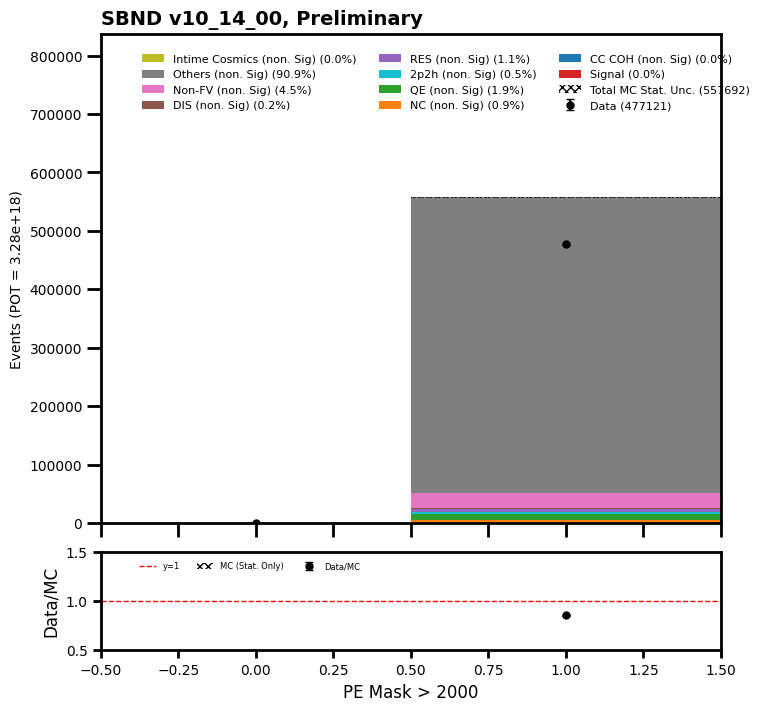

total data =  435975
[   958    957    967   1017   1859   2977   5767   4404 375739   7162
   7145   8577   7572   5003   1822   1024    961    783    603    678]
[  1299.   1312.   1248.   1305.   1621.   1314.   1243.   1251.   1428.
   1434.  89773. 147461. 147376.  70232.   2201.   2128.   1851.   1561.
   1658.   1675.]
data ratio  [7.37490377e-01 7.29420732e-01 7.74839744e-01 7.79310345e-01
 1.14682295e+00 2.26560122e+00 4.63958166e+00 3.52038369e+00
 2.63122549e+02 4.99442120e+00 7.95896316e-02 5.81645316e-02
 5.13787862e-02 7.12353343e-02 8.27805543e-01 4.81203008e-01
 5.19178822e-01 5.01601537e-01 3.63691194e-01 4.04776119e-01]
mode sums =  [111.0, 39.0, 4766.0, 10594.0, 2875.0, 6114.0, 1299.0, 24874.0, 428699.0, 0.0]
fractions =  [0.02315534314758298, 0.008135661105907533, 0.9942195084809051, 2.2099793270765233, 0.5997442481919014, 1.2754213333722733, 0.27098009683522783, 5.18888293200882, 89.42948154978086, 0.0]
total sums =  479371.0
['Signal', 'CC COH (non. Sig)', 'NC (no

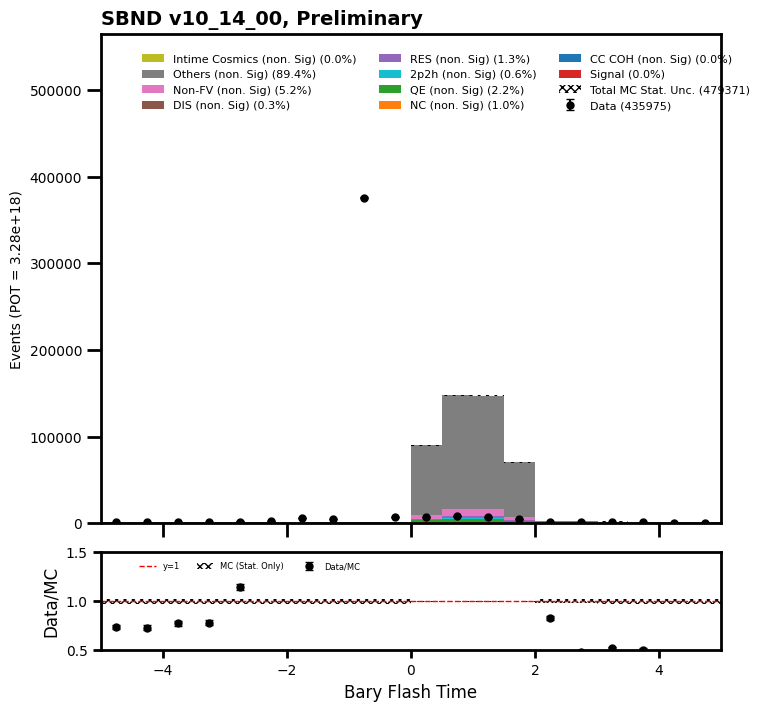

/tmp/ipykernel_3794/1280684055.py:94: RuntimeWarning: invalid value encountered in sqrt
  mc_stat_err = np.sqrt(total_mc_err2)


total data =  477121
[123361 353760]
[-40 164]
data ratio  [-3084.025       2157.07317073]


ValueError: 'yerr' must not contain negative values

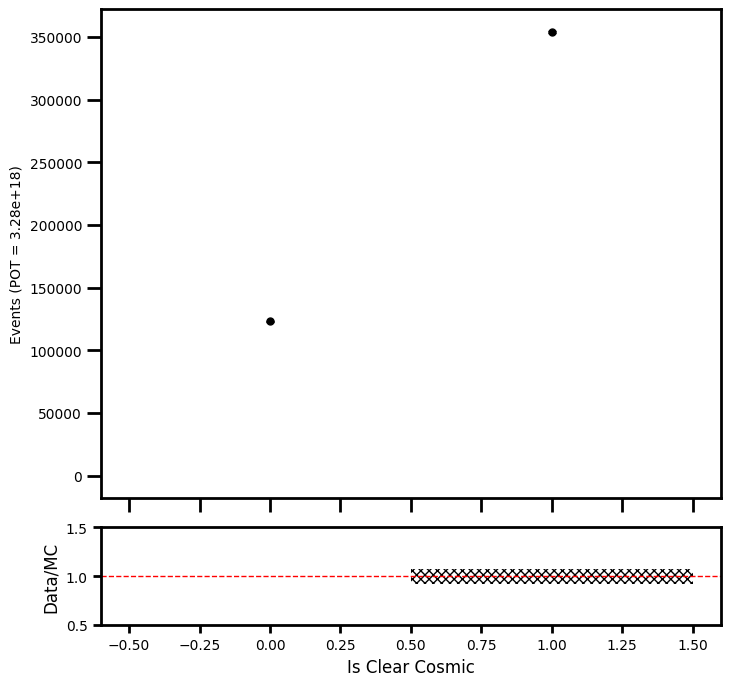

In [108]:
## PE Count > 2000

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].pemask]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].pemask]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].pemask]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_a_b_pe_cut")

In [65]:
purity = 79.56706237792969/400027.99867630005
efficiency = 79.56706237792969/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.02 % and efficiency =  100.0 %


In [109]:
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  24798
[    0 24798]
[     0 413544]
data ratio  [      nan 0.0599646]
mode sums =  [104.0, 34.0, 4281.0, 9553.0, 2576.0, 5517.0, 1171.0, 22369.0, 367939.0, 0.0]
fractions =  [0.02514847271390711, 0.008221616079546554, 1.0351981893099647, 2.310032306114948, 0.6229083241444683, 1.3340781150252452, 0.28316213026908865, 5.409097943628731, 88.9721529027141, 0.0]
total sums =  413544.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


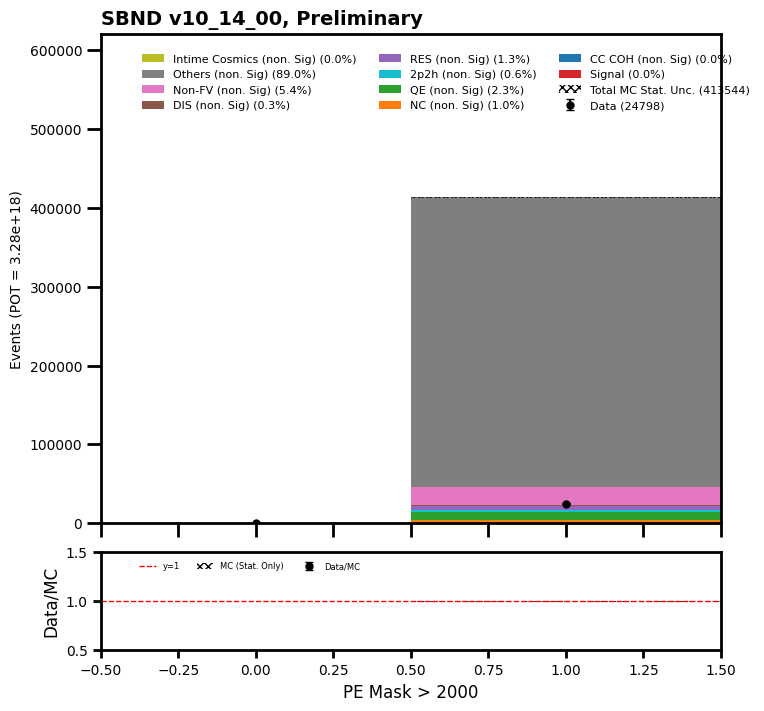

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  24798
[   0    0    0    0    0    0    0    0    0    0 7145 8577 7572 1504
    0    0    0    0    0    0]
[     0.      0.      0.      0.      0.      0.      0.      0.      0.
      0.  89773. 147461. 147376.  28934.      0.      0.      0.      0.
      0.      0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.07958963 0.05816453
 0.05137879 0.05198037        nan        nan        nan        nan
        nan        nan]
mode sums =  [104.0, 34.0, 4281.0, 9553.0, 2576.0, 5517.0, 1171.0, 22369.0, 367939.0, 0.0]
fractions =  [0.02514847271390711, 0.008221616079546554, 1.0351981893099647, 2.310032306114948, 0.6229083241444683, 1.3340781150252452, 0.28316213026908865, 5.409097943628731, 88.9721529027141, 0.0]
total sums =  413544.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 

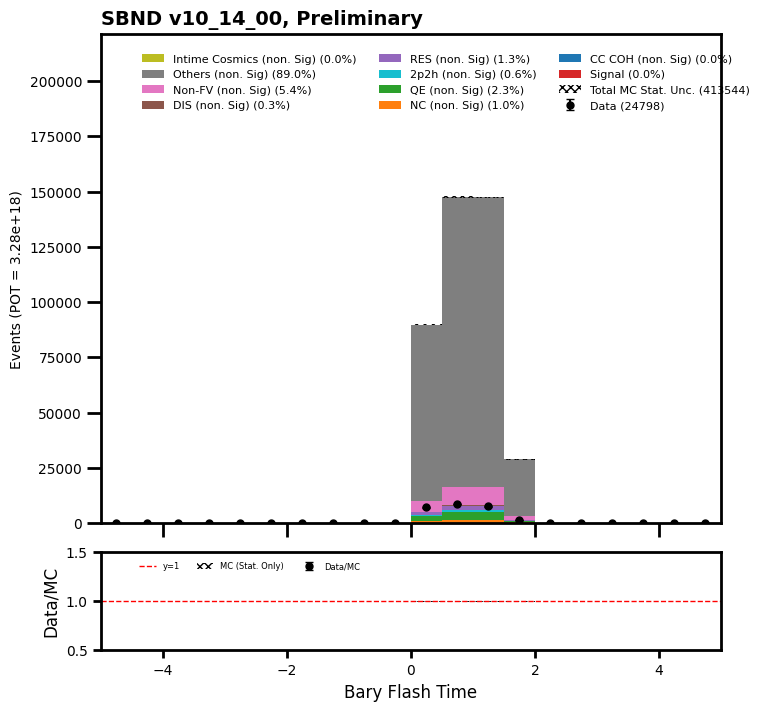

total data =  24798
[ 6752 18046]
[220 140]
data ratio  [ 30.69090909 128.9       ]
mode sums =  [104.0, 34.0, -71.0, 81.0, 16.0, 141.0, -109.0, 97.0, 67.0, 0.0]
fractions =  [28.888888888888886, 9.444444444444445, -19.72222222222222, 22.5, 4.444444444444445, 39.166666666666664, -30.277777777777775, 26.944444444444443, 18.61111111111111, 0.0]
total sums =  360.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


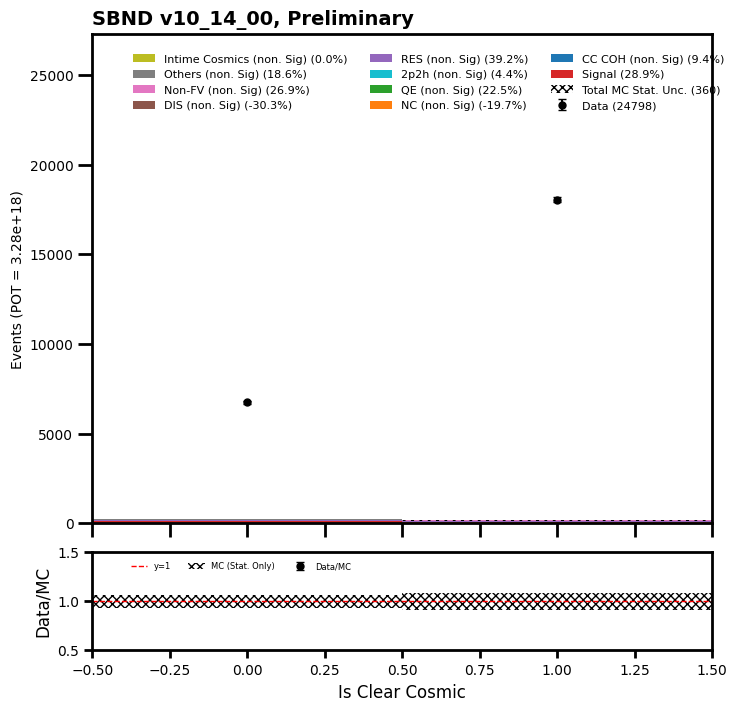

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  24796
[   0    0    0    0    0    0    0    0    0    0    6  723  101  119
  143  139  361  222  237  202  213  232  236  228  248  253  248  215
  262  254  248  252  270  251  270  252  264  261  256  294  280  303
  296  286 1602  476  507  480  486  458  417  490  463  513  454 1578
  266  309  296  287  285  278  258  283  268  277  274  279  265  247
  257  231  223  241  219  219  210  191  233  208  234  215  224  397
  140  148  153  128  696    8    0    0    0    0    0    0    0    0
    0    0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 7.9000e+01 1.0369e+04
 1.9140e+03 1.9810e+03 2.0710e+03 1.9870e+03 6.4760e+03 3.4260e+03
 3.4720e+03 3.3820e+03 3.4640e+03 3.5890e+03 3.5160e+03 3.8260e+03
 4.0130e+03 3.9860e+03 4.0710e+03 4.0400e+03 4.1490e+03 4.2240e+03
 4.3120e+03 4.3720e+03 4.4940e+03 4.6310e+03 4.7390e+03 4.7590e+03
 4.8240e+03 4.9450e+03 5.0170e+03 5.2360e+03 5.1700e+03 5.3060e+03
 5

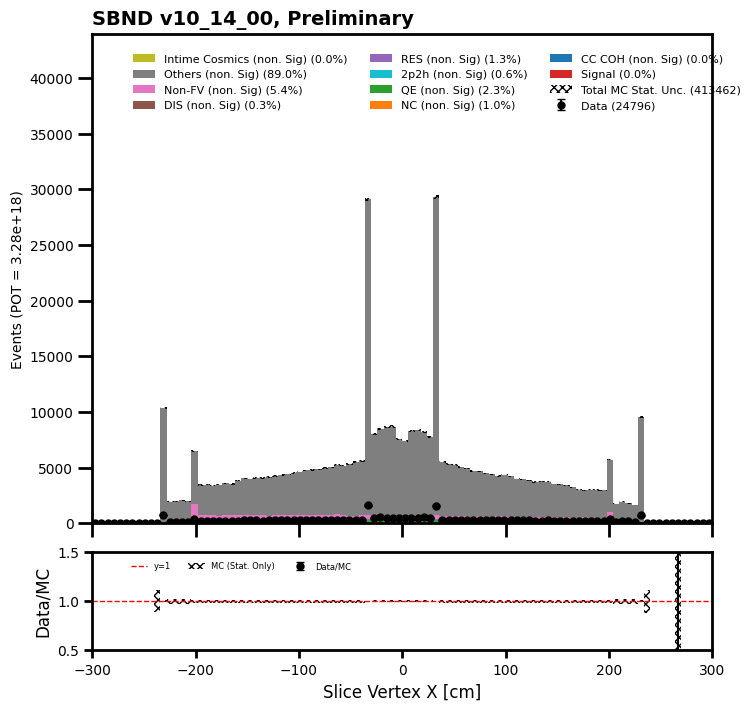

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  24796
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    2  352  116  127  131  134  164  141  158  167  168  167  177
  172  176  195  208  191  207  196  240  210  216  216  209  228  207
  234  212  199  241  220  230  213  264  216  200  260  226  207  229
  262  243  239  262  241  258  260  226  235  275  243  258  250  239
  257  268  286  285  310  288  322  339  338  330  350  430  661 8222
  584    5    0    1    0    0    0    1    0    1    1    0    0    0
    0    0]
[0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 1.00000e+00
 0.00000e+00 1.00000e+00 1.00000e+00 1.12000e+02 4.69700e+03 1.27100e+03
 1.60300e+03 1.80800e+03 2.03600e+03 2.18000e+03 2.38100e+03 2.57500e+03
 2.64600e+03 2.66600e+03 2.77000e+03 3.03200e+03 3.06600e+03 3.07000e+03
 3.21800e+03 3.26800e+03 3.27100e+03 3.34900e+03 3.29700e+03 3.44100e+03
 3.61500e+03 3.64900e+03 3.59800e

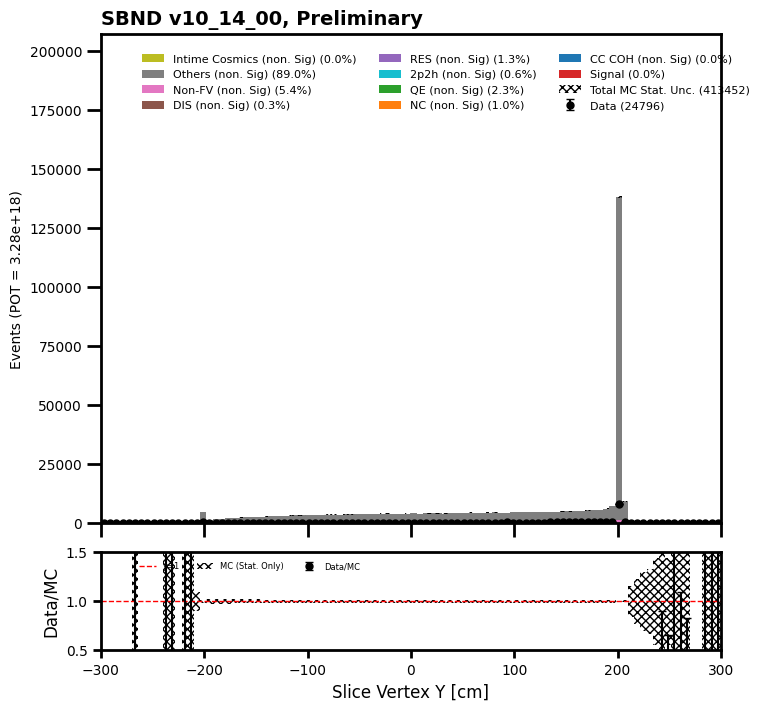

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  24795
[   0    0    0    0    0    0    0    0    0    0    0    2    0  536
 1691  253  286  283  263  303  315  320  298  294  276  316  307  288
  289  315  323  284  311  305  300  311  306  321  324  294  284  318
  326  299  306  319  273  293  251  277  340  325  324  305  313  310
  308  307  298  347  292  302  301  297  279  308  315  324  278  309
  326  332  300  324  303  292  300  321  296  293  287  322  305  314
  339  811  488    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 2.0000e+00 1.0000e+00 2.0000e+00 3.0000e+00
 5.0000e+00 3.5120e+03 3.0174e+04 4.5350e+03 4.5640e+03 4.7510e+03
 4.9700e+03 4.8280e+03 5.0090e+03 4.8660e+03 5.0600e+03 4.8640e+03
 5.0780e+03 5.0160e+03 5.0630e+03 5.1480e+03 5.1170e+03 4.9810e+03
 5.1330e+03 5.0560e+03 5.2400e+03 5.1250e+03 5.2780e+03 5.0920e+03
 5.2570e+03 5.1770e+03 5.2560e+03 5.2470e+03 5.2480e+03 5.0170e+03
 5

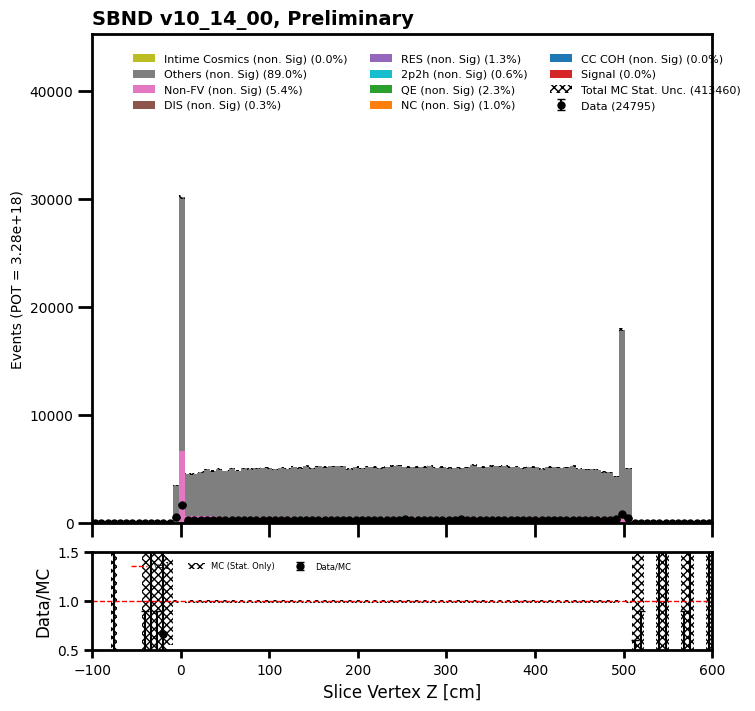

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  6752
[  0   0   0   0   0   0   0   0   0   0   3   5  16  55 104 174 264 374
 483 662 660 642 527 485 346 294 308 262 211 156 174 163 141 113  78  37
  14   0   1   0   0   0   0   0   0   0   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 5.000e+00 5.300e+01 1.800e+02 5.460e+02 1.201e+03
 2.117e+03 3.329e+03 4.544e+03 5.811e+03 6.978e+03 7.262e+03 7.842e+03
 7.588e+03 6.988e+03 6.094e+03 5.523e+03 4.959e+03 4.312e+03 4.035e+03
 3.851e+03 3.556e+03 3.175e+03 2.924e+03 2.615e+03 2.309e+03 1.683e+03
 8.860e+02 3.760e+02 7.300e+01 1.000e+01 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         0.         0.05660377 0.02777778
 0.02930403 0.04579517 0.04912612 0.05226795 0.05809859 0.0643607
 0.06921754 0.09115946 0.0841622  0.08460727 0.075415   

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


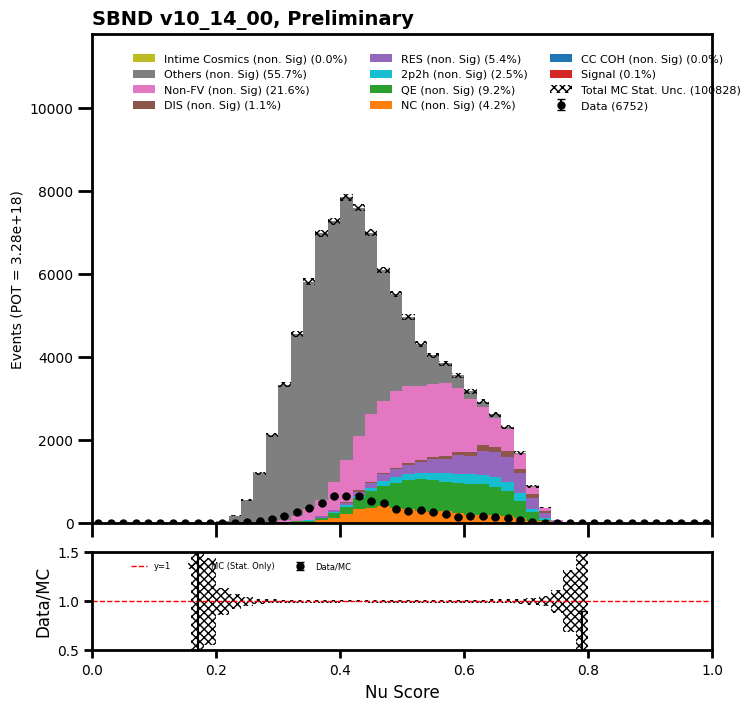

total data =  24726
[22479   667   376   274   184   117   105    84    63    41    40    43
    32    19    35    10    11    14    16    11    12    13     8     3
     8     8     3     6     2     3     4     4     8     6     1     2
     3     3     4     4]
[3.72473e+05 1.54920e+04 7.92800e+03 4.59800e+03 2.95300e+03 2.10000e+03
 1.47700e+03 1.07900e+03 8.48000e+02 6.18000e+02 5.16000e+02 4.03000e+02
 3.59000e+02 2.70000e+02 2.48000e+02 2.07000e+02 1.89000e+02 1.71000e+02
 1.34000e+02 1.12000e+02 1.07000e+02 1.08000e+02 7.30000e+01 6.30000e+01
 6.40000e+01 5.30000e+01 6.50000e+01 5.00000e+01 5.10000e+01 3.10000e+01
 3.80000e+01 3.50000e+01 2.50000e+01 3.10000e+01 2.70000e+01 2.40000e+01
 2.40000e+01 1.50000e+01 2.00000e+01 1.50000e+01]
data ratio  [0.06035068 0.04305448 0.04742684 0.05959113 0.06230952 0.05571429
 0.07109005 0.07784986 0.07429245 0.06634304 0.07751938 0.10669975
 0.08913649 0.07037037 0.14112903 0.04830918 0.05820106 0.08187135
 0.11940299 0.09821429 0.11214953 

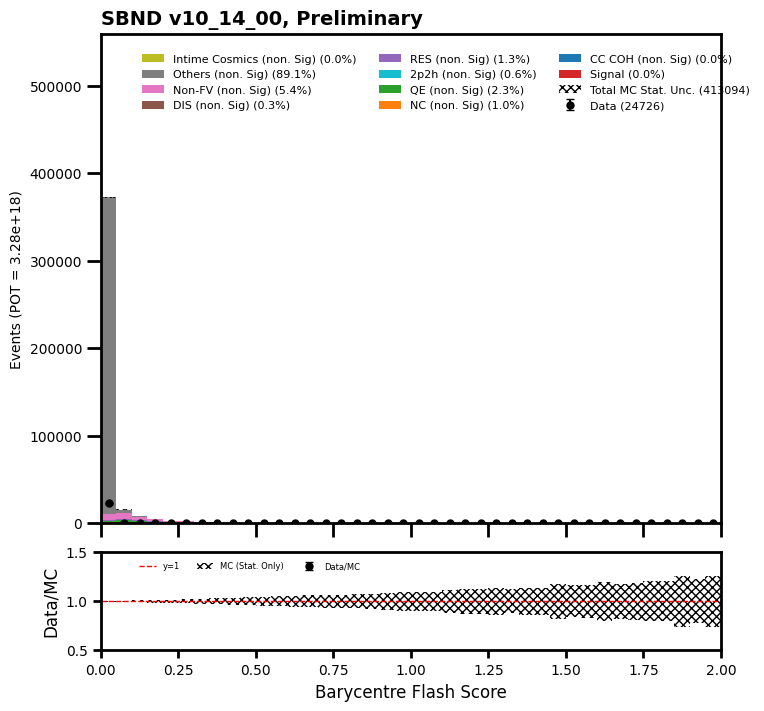

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6751
[  0   0   0   0   0   0   0   0   0   0   1   0   1   1  10  15  22  19
  38  56  86 100 163 189 180 179 196 249 323 312 317 307 288 307 351 330
 343 358 331 369 336 318 325 223 102   6   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.000e+00 1.300e+01 2.100e+01 5.600e+01 8.300e+01
 1.420e+02 2.210e+02 3.890e+02 5.710e+02 7.610e+02 1.043e+03 1.382e+03
 1.776e+03 2.399e+03 2.571e+03 2.205e+03 2.042e+03 2.424e+03 3.255e+03
 4.212e+03 4.532e+03 4.732e+03 4.685e+03 4.573e+03 4.675e+03 4.928e+03
 4.998e+03 5.249e+03 5.491e+03 5.382e+03 5.347e+03 5.279e+03 5.219e+03
 4.879e+03 3.755e+03 1.452e+03 6.300e+01 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         0.         0.07692308 0.
 0.01785714 0.01204819 0.07042254 0.0678733  0.05655527 0.03327496
 0.0499343  0.05369128 0.06222865 0.05630631 0.06794498 0.07351

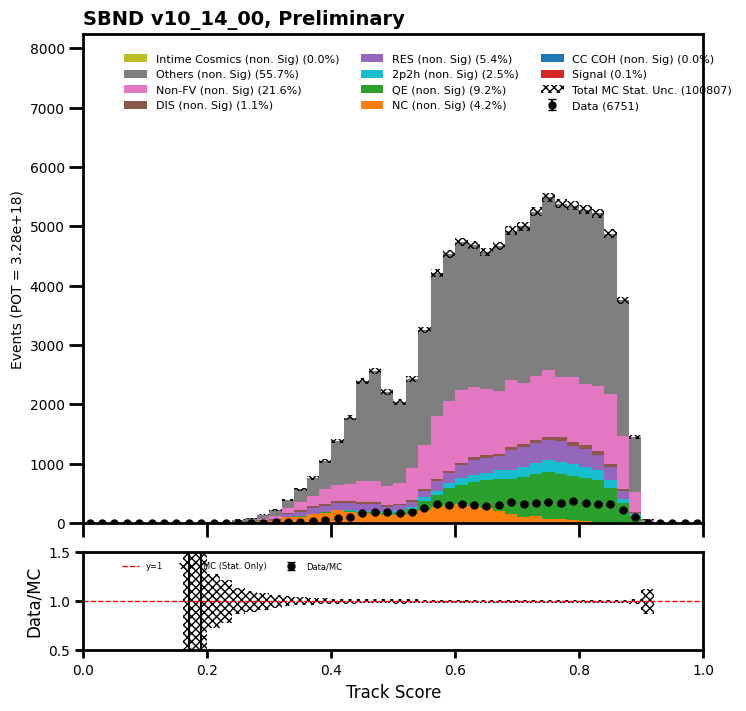

total data =  24780
[3415 3716 3360 2881 2421 1761 1494 1226 1332 1489  852  426  193  109
   50   24    7    7    2    6    2    4    2    0    1]
[4.4201e+04 6.0003e+04 5.7122e+04 5.0194e+04 4.2572e+04 3.4169e+04
 2.6839e+04 2.2739e+04 2.6534e+04 2.3607e+04 1.2758e+04 6.3100e+03
 3.2100e+03 1.5300e+03 6.7100e+02 2.9500e+02 1.5000e+02 9.8000e+01
 6.2000e+01 3.5000e+01 4.8000e+01 2.1000e+01 3.2000e+01 2.4000e+01
 2.1000e+01]
data ratio  [0.0772607  0.06193024 0.05882147 0.0573973  0.05686836 0.05153794
 0.05566526 0.05391618 0.05019974 0.06307451 0.06678163 0.06751189
 0.06012461 0.07124183 0.07451565 0.08135593 0.04666667 0.07142857
 0.03225806 0.17142857 0.04166667 0.19047619 0.0625     0.
 0.04761905]
mode sums =  [101.0, 34.0, 4271.0, 9547.0, 2574.0, 5514.0, 1169.0, 22351.0, 367684.0, 0.0]
fractions =  [0.024440707086595122, 0.0082275647618241, 1.0335273264044331, 2.3102517876804316, 0.6228750499098598, 1.3343174146087673, 0.2828830354874227, 5.408655882103837, 88.97482123195682, 0

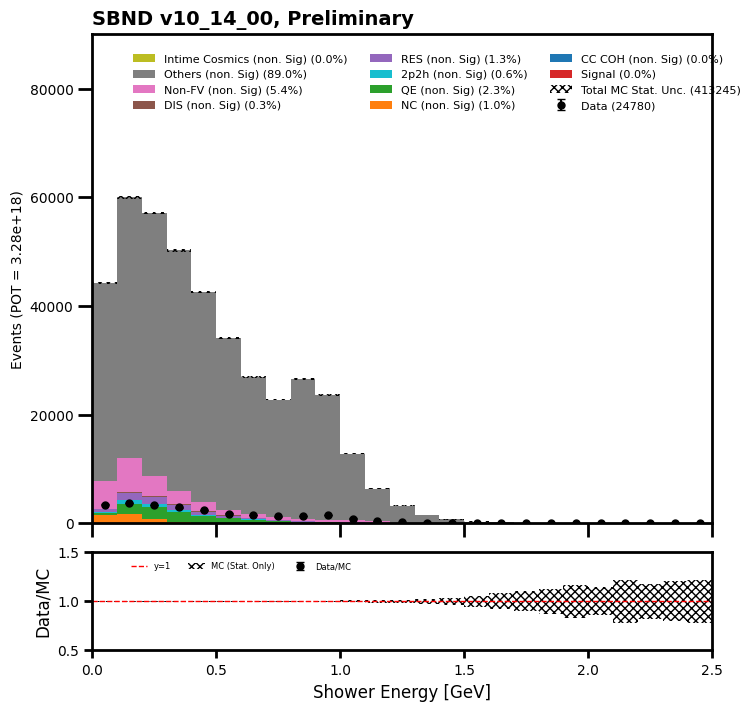

total data =  21151
[ 579 1079  896  821  788  796  773  772  764  719  748  722  654  712
  631  628  654  605  552  542  511  513  520  448  381  374  371  354
  375  316  305  295  290  285  248  255  222  198  216  239]
[ 8494. 14924. 11167. 10958. 11414. 11799. 12147. 12036. 12124. 12090.
 12099. 11794. 11596. 11265. 11207. 10873. 10512. 10223.  9886.  9629.
  9335.  8901.  8505.  8035.  7621.  7192.  7009.  6746.  6248.  5704.
  5655.  5302.  5256.  4939.  4609.  4442.  4282.  4040.  3999.  3861.]
data ratio  [0.06816576 0.07229965 0.08023641 0.07492243 0.06903802 0.06746334
 0.06363711 0.06414091 0.06301551 0.05947064 0.06182329 0.06121757
 0.05639876 0.06320462 0.0563041  0.05775775 0.06221461 0.05918028
 0.05583654 0.0562883  0.05474022 0.05763397 0.06114051 0.05575607
 0.04999344 0.05200222 0.05293194 0.05247554 0.06001921 0.05539972
 0.05393457 0.05563938 0.05517504 0.05770399 0.05380777 0.05740657
 0.05184493 0.0490099  0.0540135  0.06190106]
mode sums =  [99.0, 32.0, 4234.

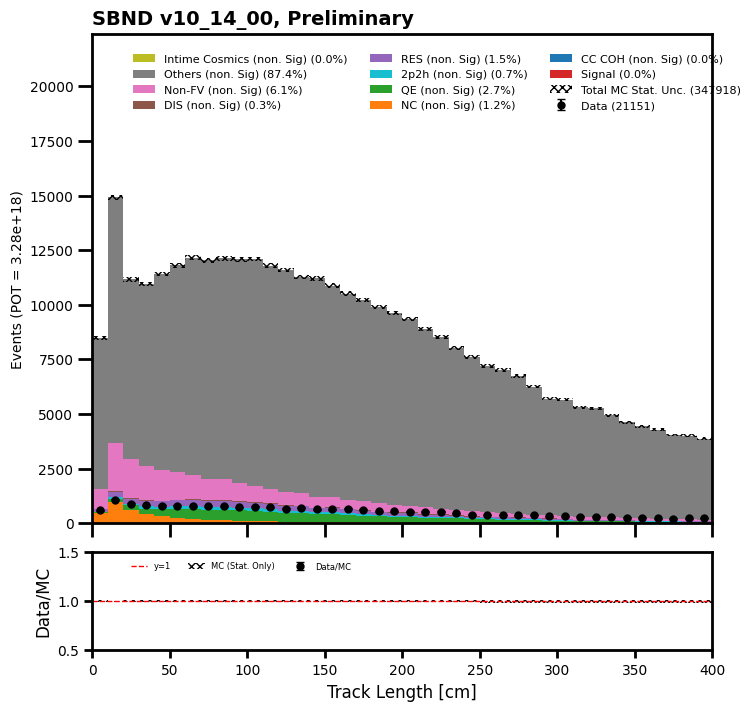

total data =  24534
[22184  1443   380   119    63    45    48    23    23    14    10    16
     8     8    12     3     9     8     5     6     6     8     9     4
    11     5     6     6     3     2     5     5     4     2    10     7
     2     2     7     3]
[3.78989e+05 1.66200e+04 5.07200e+03 1.87600e+03 1.04000e+03 7.08000e+02
 5.47000e+02 4.36000e+02 3.41000e+02 2.82000e+02 2.22000e+02 2.07000e+02
 1.61000e+02 1.79000e+02 1.67000e+02 1.70000e+02 1.60000e+02 1.33000e+02
 1.04000e+02 1.14000e+02 1.18000e+02 1.34000e+02 1.18000e+02 1.28000e+02
 1.05000e+02 9.40000e+01 9.30000e+01 8.90000e+01 8.60000e+01 7.70000e+01
 8.60000e+01 7.30000e+01 7.70000e+01 7.20000e+01 7.10000e+01 8.10000e+01
 6.60000e+01 6.40000e+01 6.20000e+01 5.50000e+01]
data ratio  [0.05853468 0.0868231  0.07492114 0.06343284 0.06057692 0.06355932
 0.08775137 0.05275229 0.06744868 0.04964539 0.04504505 0.07729469
 0.04968944 0.04469274 0.07185629 0.01764706 0.05625    0.06015038
 0.04807692 0.05263158 0.05084746 

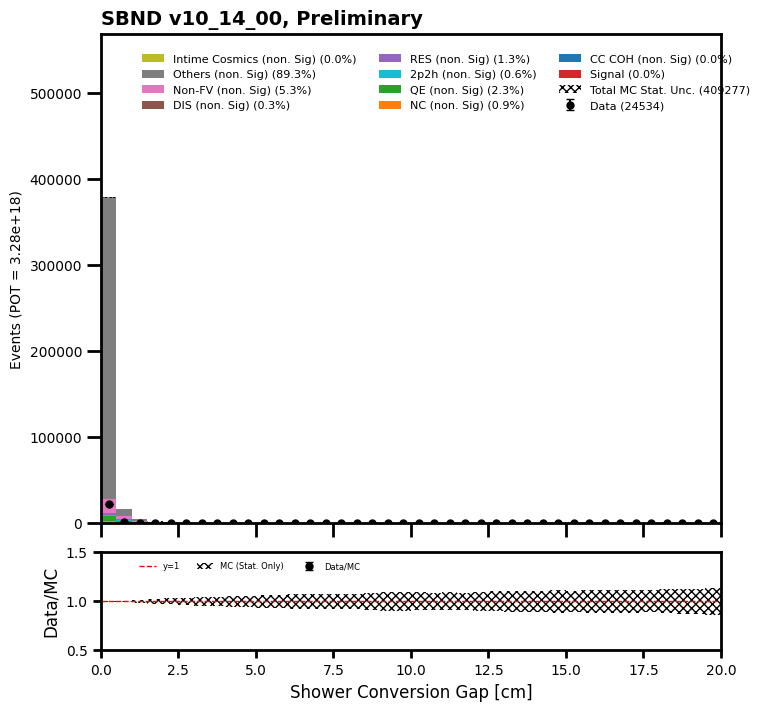

total data =  15453
[  34  438 2506 7481 2148  622  390  345  344  296  229  157   94   66
   37   30   37   23   17   12   13   11   15    8   22   10   11   13
    6    9    4    4    5    2    2    3    2    0    4    3]
[2.32000e+02 1.93200e+03 3.16180e+04 1.68792e+05 3.00890e+04 9.51500e+03
 6.28100e+03 6.48200e+03 5.89000e+03 4.87500e+03 4.00600e+03 2.60400e+03
 1.62100e+03 1.17100e+03 7.76000e+02 5.92000e+02 4.24000e+02 3.64000e+02
 3.38000e+02 2.53000e+02 2.45000e+02 2.62000e+02 2.64000e+02 3.15000e+02
 3.44000e+02 3.63000e+02 3.19000e+02 2.68000e+02 2.04000e+02 1.34000e+02
 1.30000e+02 1.14000e+02 8.70000e+01 7.30000e+01 6.30000e+01 6.10000e+01
 5.60000e+01 5.00000e+01 4.40000e+01 4.80000e+01]
data ratio  [0.14655172 0.22670807 0.07925865 0.04432082 0.07138821 0.06537047
 0.06209202 0.05322431 0.05840407 0.06071795 0.05716425 0.06029186
 0.0579889  0.05636208 0.04768041 0.05067568 0.08726415 0.06318681
 0.05029586 0.04743083 0.05306122 0.04198473 0.05681818 0.02539683
 0.06395

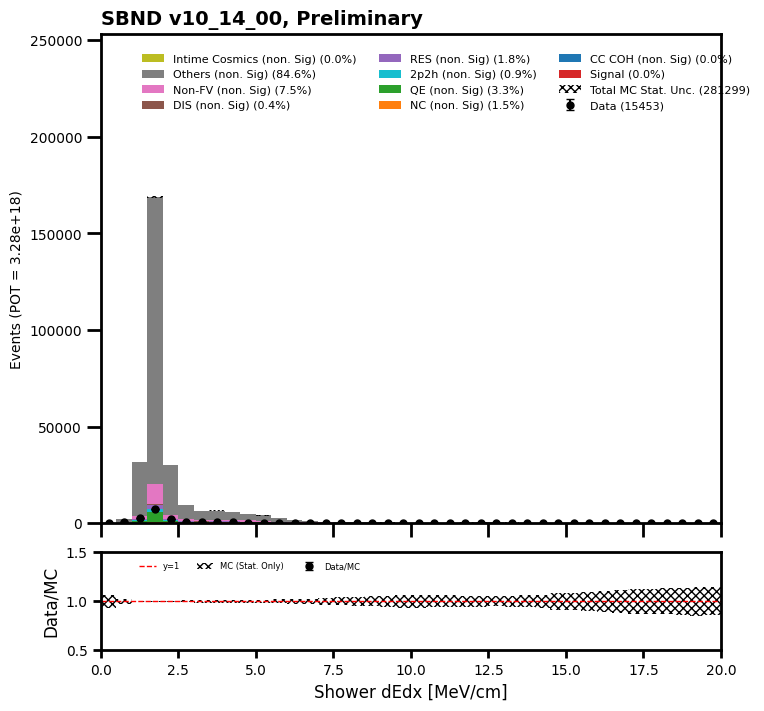

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  24785
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0 22305  1534   391   194
   115    83    38    33    25    14    16     9     7     2     2     5
     4     6     2     0]
[0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.79249e+05 1.99170e+04 5.40400e+03 2.94900e+03
 1.76200e+03 1.10400e+03 7.74000e+02 5.35000e+02 3.83000e+02 3.02000e+02
 2.13000e+02 1.73000e+02 1.39000e+02 1.19000e+02 9.30000e+01 7.20000e+01
 5.10000e+01 5.40000e+01 2.70000e+01 2.10000e+01]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.0588136  

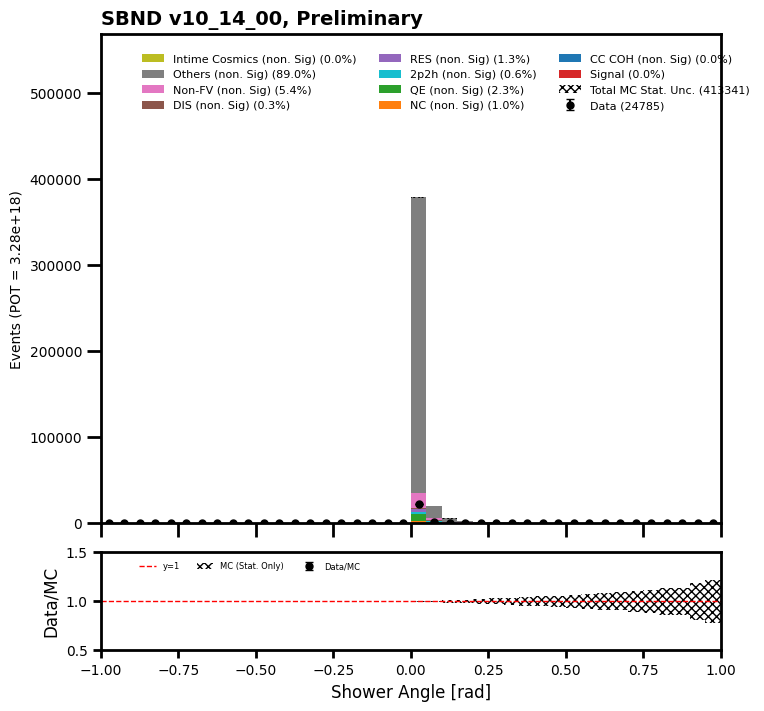

total data =  19633
[ 15  65 152 237 255 270 262 225 222 198 216 203 216 173 195 180 195 186
 179 180 189 172 162 162 197 152 179 188 167 169 190 171 169 182 146 181
 185 180 159 174 157 168 153 170 177 154 155 147 178 194 162 168 161 140
 168 128 132 153 146 154 151 159 170 137 140 140 147 140 149 123 128 148
 147 156 139 144 154 132 135 121 120 114 127 125 124 134 114 114 127 107
 126 105 105 113 115 121 107 119 105 123 101 123 111  94 104 107 106  84
  83  98  91  76  70  83  79  74  81  82  78  86 102  82  68  86  76  78
  69  79  78  99  86  66  66  72  58  73  66  73  74  66  69  64  77  51
  68  53  71  53  64  67]
[ 150.  977. 2105. 3368. 4040. 3968. 3484. 3088. 2817. 2691. 2628. 2527.
 2535. 2451. 2538. 2438. 2527. 2543. 2694. 2574. 2547. 2617. 2556. 2665.
 2610. 2774. 2697. 2715. 2830. 2703. 2724. 2717. 2760. 2696. 2727. 2727.
 2683. 2688. 2757. 2716. 2644. 2747. 2712. 2710. 2666. 2751. 2771. 2714.
 2637. 2580. 2601. 2583. 2634. 2598. 2578. 2533. 2535. 2623. 2556. 2475.
 2506

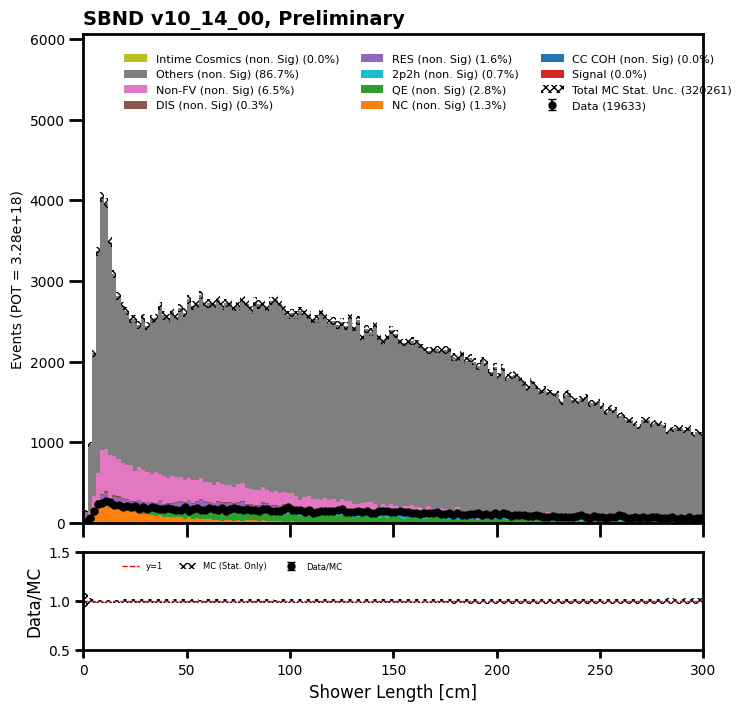

In [110]:
#bary flash time

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][ (mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.flashTime > 0.00)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.barycenterFM.flashTime > 0.00)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.barycenterFM.flashTime > 0.00)]
mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][ (mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.flashTime < 1.6)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.barycenterFM.flashTime < 1.6)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.barycenterFM.flashTime < 1.6)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_bflashTime")

In [67]:
purity = 74.54932403564453/296620.8665561676
efficiency = 74.549324035644532/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.03 % and efficiency =  93.69 %


In [111]:
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  6752
[   0 6752]
[     0 100828]
data ratio  [       nan 0.06696553]
mode sums =  [101.0, 34.0, 4247.0, 9325.0, 2545.0, 5449.0, 1152.0, 21829.0, 56146.0, 0.0]
fractions =  [0.10017058753520848, 0.033720791843535526, 4.212123616455746, 9.248423057087317, 2.524100448288174, 5.404252786924267, 1.1425397706986153, 21.649740151545206, 55.684928789621935, 0.0]
total sums =  100828.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


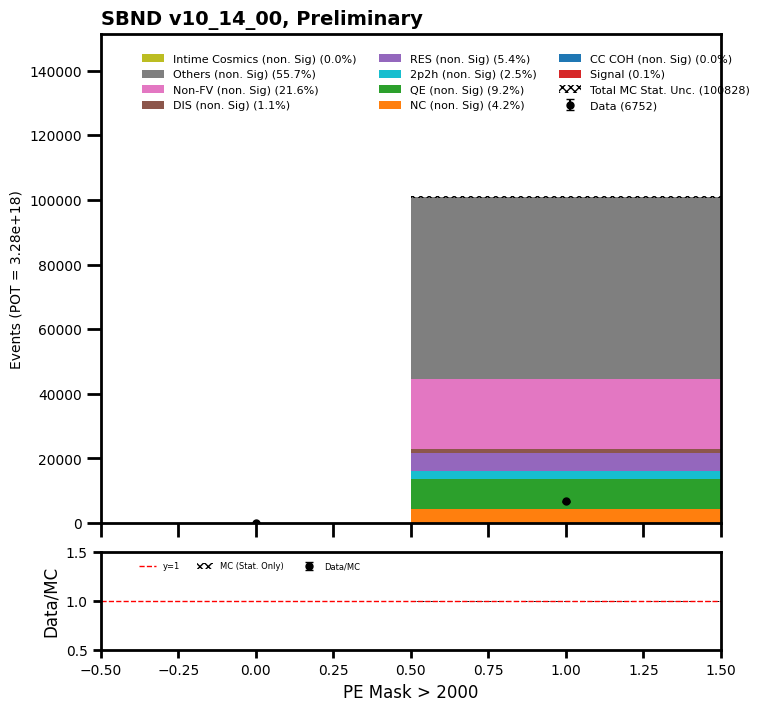

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6752
[   0    0    0    0    0    0    0    0    0    0 2003 2325 2030  394
    0    0    0    0    0    0]
[    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 21828. 35811. 36134.  7055.     0.     0.     0.     0.     0.     0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.09176287 0.06492419
 0.05617978 0.05584692        nan        nan        nan        nan
        nan        nan]
mode sums =  [101.0, 34.0, 4247.0, 9325.0, 2545.0, 5449.0, 1152.0, 21829.0, 56146.0, 0.0]
fractions =  [0.10017058753520848, 0.033720791843535526, 4.212123616455746, 9.248423057087317, 2.524100448288174, 5.404252786924267, 1.1425397706986153, 21.649740151545206, 55.684928789621935, 0.0]
total sums =  100828.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Si

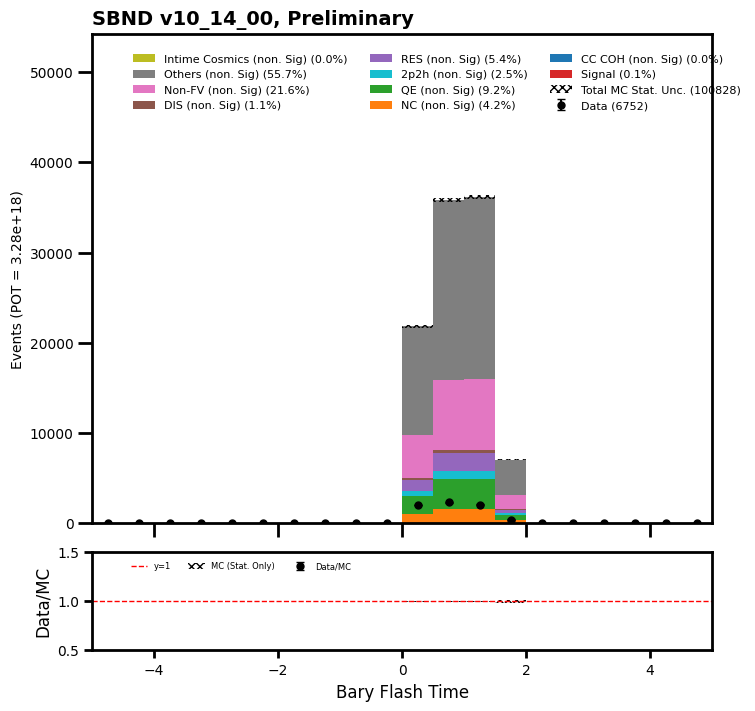

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6752
[6752    0]
[220   0]
data ratio  [30.69090909         nan]
mode sums =  [101.0, 34.0, -105.0, 109.0, -15.0, 73.0, -128.0, 69.0, 82.0, 0.0]
fractions =  [45.909090909090914, 15.454545454545453, -47.72727272727273, 49.54545454545455, -6.8181818181818175, 33.18181818181819, -58.18181818181818, 31.363636363636367, 37.27272727272727, 0.0]
total sums =  220.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


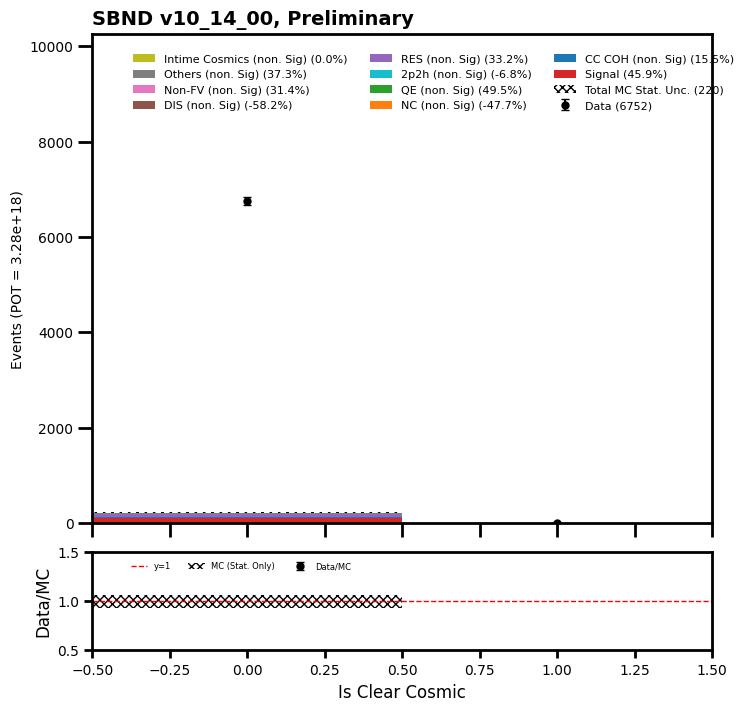

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6752
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 173  90
 109  96  93 112 103 113 114 116 124  95 114 109  96 118 109  92 116  88
 104  90 107 112  85 105 101  97  99  91  98  93  89 113  85  88  86  88
 102  90  94  96  89  99  92  79 101 100 101  99 117 104  89  93  91  85
  85  92  92  90  85  72  99  94  91  97  73 150   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0. 2491. 1476. 1500. 1518. 1469. 1549. 1599. 1597.
 1640. 1551. 1630. 1559. 1609. 1604. 1635. 1623. 1681. 1680. 1642. 1640.
 1660. 1608. 1588. 1647. 1493. 1543. 1546. 1561. 1515. 1421. 1513. 1490.
 1402. 1693. 1594. 1257. 1389. 1414. 1399. 1438. 1395. 1464. 1489. 1445.
 1343. 1396. 1466. 1359. 1360. 1387. 1459. 1448. 1329. 1346. 1368. 1296.
 1329. 1371. 1325. 1302. 1272. 1306. 1243. 1185. 1238. 1195. 1146. 1702.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   

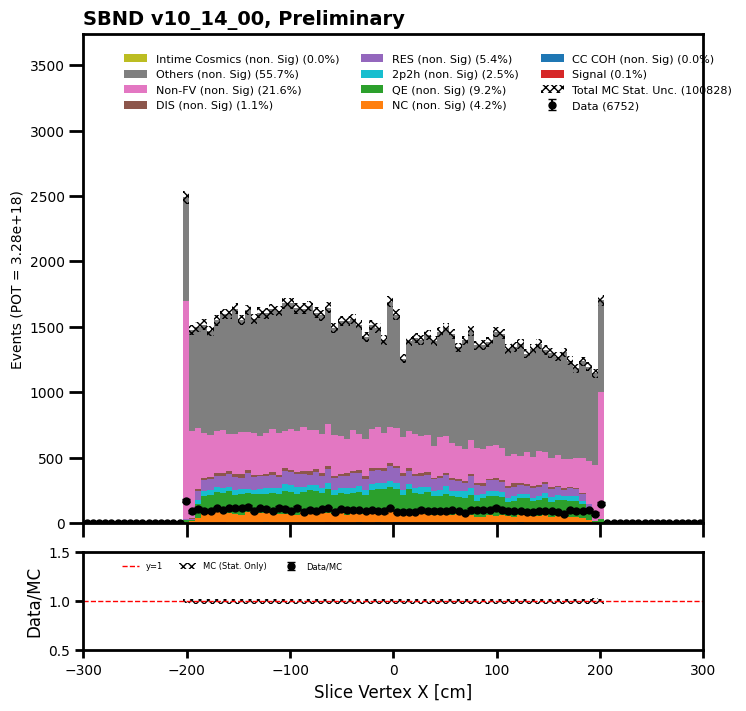

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6752
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   2 346  91
  69  59  63  77  64  62  62  67  56  64  46  52  56  76  58  72  57  81
  65  54  74  72  70  70  66  63  66  79  70  80  68  83  69  76  88  83
  62  60  71  67  74  78  80  81  75  67  79  94  78  98  79  75  94  98
 109  89 102 101 107 113 123 135 164 180 229 982  32   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00 1.0000e+00
 0.0000e+00 1.0000e+00 1.0000e+00 1.1200e+02 4.6530e+03 1.0100e+03
 1.0330e+03 9.6400e+02 9.6000e+02 9.9500e+02 9.8100e+02 1.0090e+03
 1.0340e+03 9.7800e+02 9.6800e+02 1.1100e+03 1.1050e+03 1.0560e+03
 1.0630e+03 1.1110e+03 1.0260e+03 1.0940e+03 1.0820e+03 1.0820e+03
 1.1090e+03 1.1350e+03 1.1200e+03 1.1670e+03 1.1370e+03 1.1960e+03
 1.1080e+03 1.1640e+03 1.1680e+03 1.1870e+03 1.2200e+03 1.2090e+03
 1.1910e+03 1.2350e+03 1.2280e+03 1.13

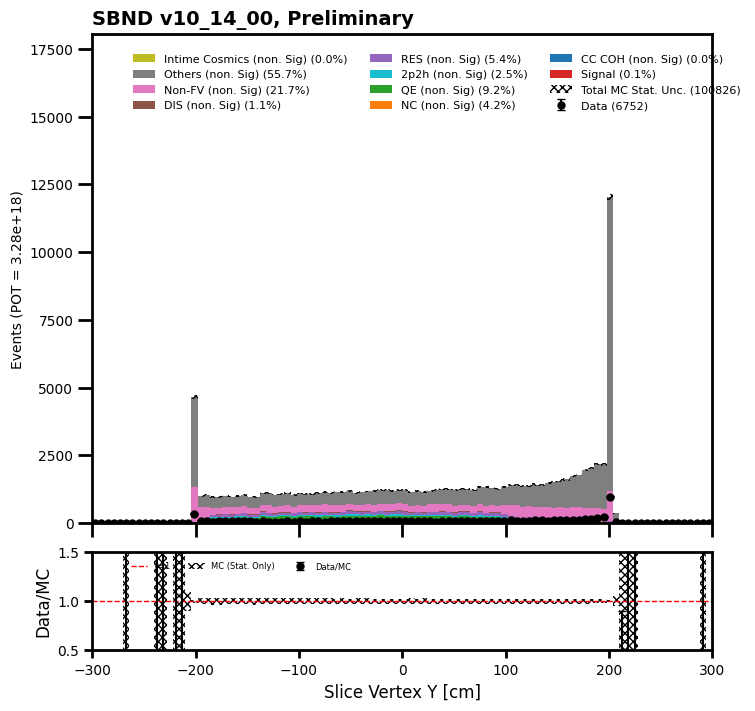

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  6752
[  0   0   0   0   0   0   0   0   0   0   0   1   0 200 904 101 101  85
  60  80  84  94  60  61  63  82  76  79  60  70  84  55  76  73  76  76
  80  75  75  72  69  65  77  65  68  87  66  74  65  63  84  60  86  60
  86  84  68  75  82  96  75  77  80  68  74  94  94  76  66  90  80  78
  76  80  89  63  77  80  74 103  87 102  93 120 134 122  17   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 8.930e+02
 1.392e+04 1.541e+03 1.412e+03 1.342e+03 1.362e+03 1.304e+03 1.266e+03
 1.270e+03 1.126e+03 1.235e+03 1.204e+03 1.216e+03 1.211e+03 1.236e+03
 1.152e+03 1.145e+03 1.217e+03 1.188e+03 1.194e+03 1.228e+03 1.175e+03
 1.117e+03 1.214e+03 1.118e+03 1.217e+03 1.191e+03 1.152e+03 1.113e+03
 1.155e+03 1.120e+03 1.198e+03 1.165e+03 1.148e+03 1.193e+03 1.219e+03
 1.191e+03 1.185e+03 1.227e+03 1.154e+03 1.184e+03 1.233e+03 1.154e+03
 1.158

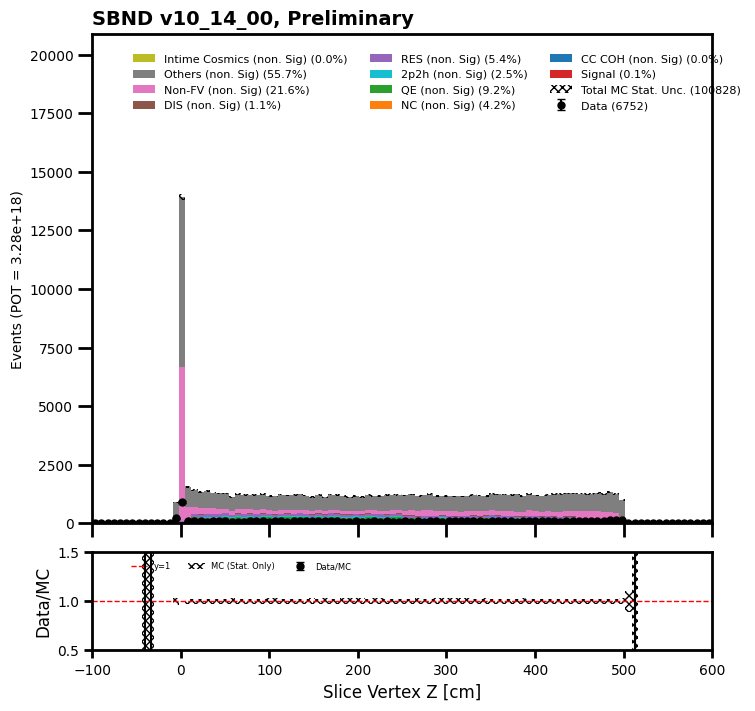

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6752
[  0   0   0   0   0   0   0   0   0   0   3   5  16  55 104 174 264 374
 483 662 660 642 527 485 346 294 308 262 211 156 174 163 141 113  78  37
  14   0   1   0   0   0   0   0   0   0   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 5.000e+00 5.300e+01 1.800e+02 5.460e+02 1.201e+03
 2.117e+03 3.329e+03 4.544e+03 5.811e+03 6.978e+03 7.262e+03 7.842e+03
 7.588e+03 6.988e+03 6.094e+03 5.523e+03 4.959e+03 4.312e+03 4.035e+03
 3.851e+03 3.556e+03 3.175e+03 2.924e+03 2.615e+03 2.309e+03 1.683e+03
 8.860e+02 3.760e+02 7.300e+01 1.000e+01 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         0.         0.05660377 0.02777778
 0.02930403 0.04579517 0.04912612 0.05226795 0.05809859 0.0643607
 0.06921754 0.09115946 0.0841622  0.08460727 0.075415   

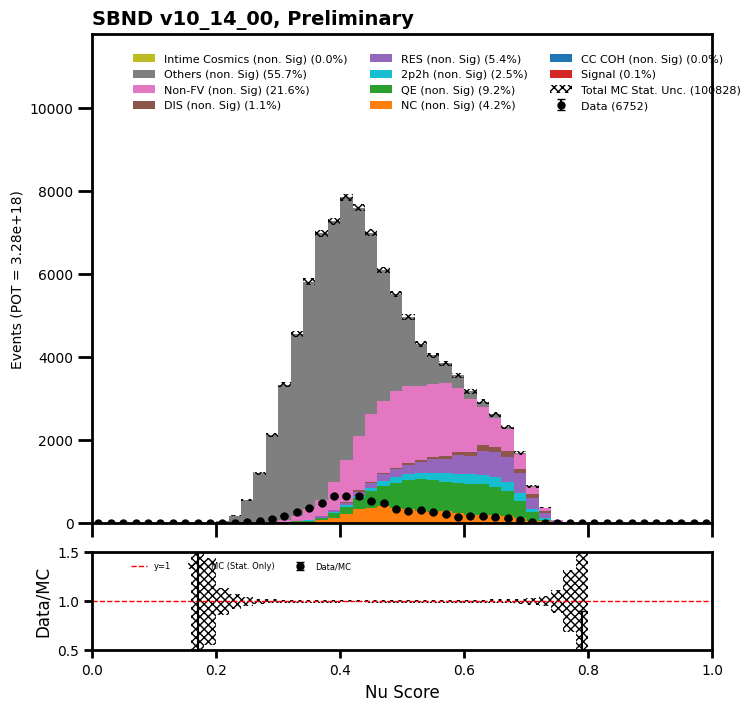

total data =  6692
[4941  451  295  221  156   99   89   71   55   31   33   37   28   17
   34   10    6   12   11   10   10    9    8    3    7    4    3    5
    2    2    4    3    4    5    1    2    3    3    3    4]
[6.4928e+04 1.1751e+04 7.1760e+03 4.3000e+03 2.8080e+03 2.0340e+03
 1.4420e+03 1.0560e+03 8.2100e+02 6.0000e+02 5.1000e+02 3.9700e+02
 3.5200e+02 2.6400e+02 2.4300e+02 2.0400e+02 1.8400e+02 1.6600e+02
 1.3300e+02 1.1200e+02 1.0400e+02 1.0400e+02 7.1000e+01 6.1000e+01
 6.3000e+01 5.2000e+01 6.4000e+01 5.0000e+01 5.0000e+01 3.1000e+01
 3.8000e+01 3.4000e+01 2.4000e+01 3.0000e+01 2.7000e+01 2.4000e+01
 2.4000e+01 1.5000e+01 2.0000e+01 1.5000e+01]
data ratio  [0.07609968 0.03837971 0.04110925 0.05139535 0.05555556 0.04867257
 0.06171983 0.06723485 0.06699147 0.05166667 0.06470588 0.09319899
 0.07954545 0.06439394 0.1399177  0.04901961 0.0326087  0.07228916
 0.08270677 0.08928571 0.09615385 0.08653846 0.11267606 0.04918033
 0.11111111 0.07692308 0.046875   0.1        0.04

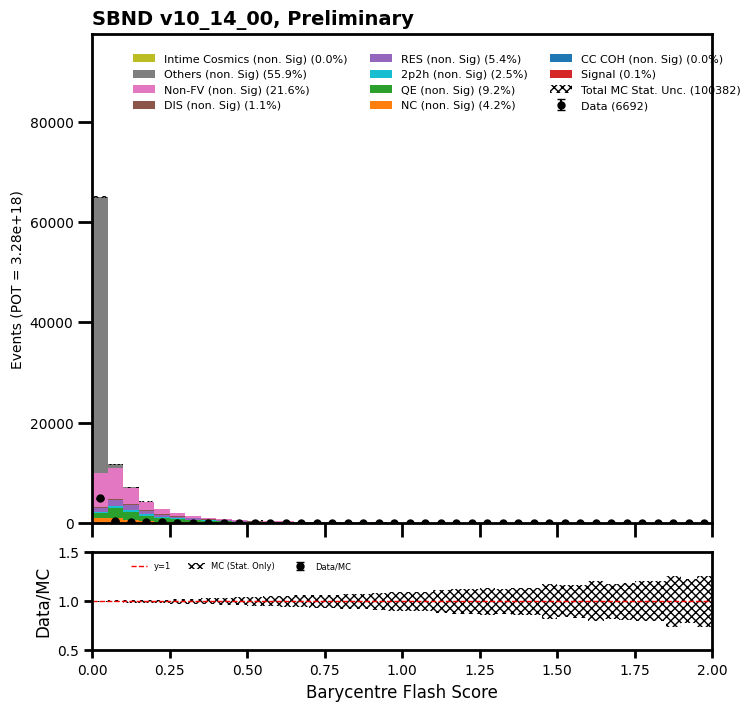

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6751
[  0   0   0   0   0   0   0   0   0   0   1   0   1   1  10  15  22  19
  38  56  86 100 163 189 180 179 196 249 323 312 317 307 288 307 351 330
 343 358 331 369 336 318 325 223 102   6   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.000e+00 1.300e+01 2.100e+01 5.600e+01 8.300e+01
 1.420e+02 2.210e+02 3.890e+02 5.710e+02 7.610e+02 1.043e+03 1.382e+03
 1.776e+03 2.399e+03 2.571e+03 2.205e+03 2.042e+03 2.424e+03 3.255e+03
 4.212e+03 4.532e+03 4.732e+03 4.685e+03 4.573e+03 4.675e+03 4.928e+03
 4.998e+03 5.249e+03 5.491e+03 5.382e+03 5.347e+03 5.279e+03 5.219e+03
 4.879e+03 3.755e+03 1.452e+03 6.300e+01 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan 0.         0.         0.07692308 0.
 0.01785714 0.01204819 0.07042254 0.0678733  0.05655527 0.03327496
 0.0499343  0.05369128 0.06222865 0.05630631 0.06794498 0.07351

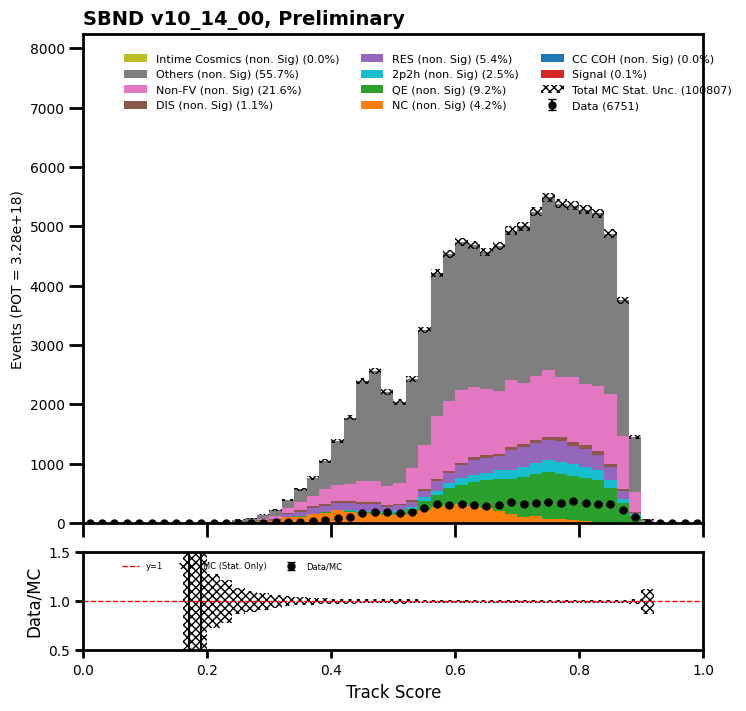

total data =  6737
[1648 1412 1012  713  557  367  316  231  153  110   67   60   37   21
   13    5    1    3    1    3    1    4    1    0    1]
[2.2459e+04 2.2258e+04 1.6130e+04 1.1876e+04 8.3760e+03 5.9000e+03
 4.2910e+03 3.1400e+03 2.0710e+03 1.1900e+03 1.0420e+03 7.4900e+02
 4.4500e+02 2.7600e+02 1.5100e+02 6.9000e+01 3.2000e+01 3.0000e+01
 2.8000e+01 1.4000e+01 2.0000e+01 1.0000e+01 2.2000e+01 2.0000e+01
 1.3000e+01]
data ratio  [0.07337816 0.06343787 0.06274024 0.06003705 0.06649952 0.06220339
 0.07364251 0.07356688 0.07387735 0.09243697 0.06429942 0.08010681
 0.08314607 0.07608696 0.08609272 0.07246377 0.03125    0.1
 0.03571429 0.21428571 0.05       0.4        0.04545455 0.
 0.07692308]
mode sums =  [98.0, 34.0, 4237.0, 9319.0, 2543.0, 5446.0, 1150.0, 21813.0, 55972.0, 0.0]
fractions =  [0.09740388820419035, 0.03379318570349461, 4.211227288991372, 9.262314634437244, 2.527531507176082, 5.412873215918578, 1.1430048105593766, 21.680316463244942, 55.63153500576472, 0.0]
total sum

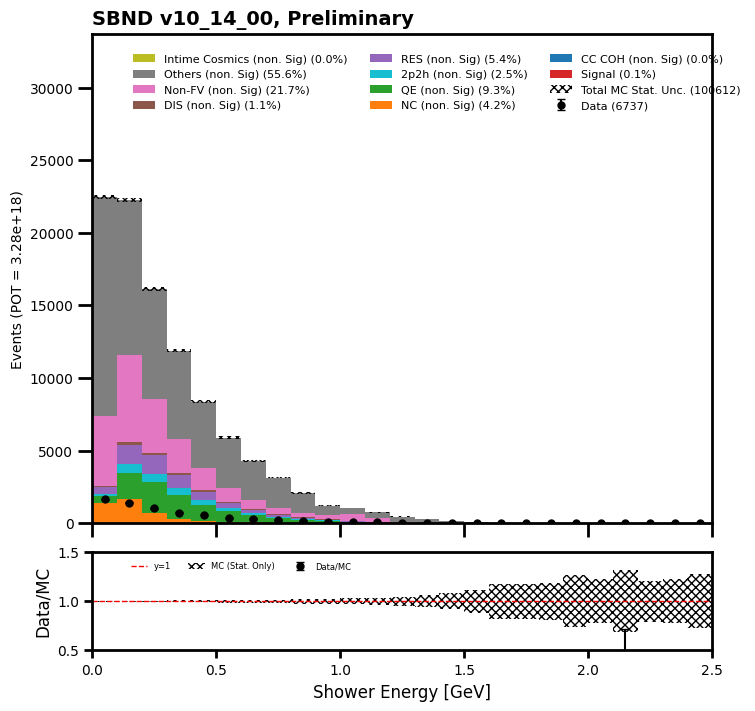

total data =  6461
[372 617 447 363 342 318 276 259 242 243 206 193 168 204 157 155 155 128
  99 133 113 123 108 101  89  72  66  76  93  66  59  54  55  61  43  52
  39  44  35  35]
[5900. 9755. 5925. 5190. 4803. 4498. 4185. 3888. 3724. 3517. 3323. 3076.
 2872. 2722. 2536. 2484. 2313. 2190. 1952. 1884. 1769. 1667. 1464. 1444.
 1304. 1244. 1140. 1084.  994.  927.  922.  762.  763.  753.  684.  657.
  594.  574.  549.  471.]
data ratio  [0.06305085 0.06324962 0.07544304 0.0699422  0.0712055  0.07069809
 0.06594982 0.06661523 0.06498389 0.06909298 0.06199218 0.06274382
 0.05849582 0.07494489 0.06190852 0.06239936 0.06701254 0.05844749
 0.05071721 0.07059448 0.0638779  0.07378524 0.07377049 0.0699446
 0.06825153 0.05787781 0.05789474 0.0701107  0.09356137 0.07119741
 0.06399132 0.07086614 0.07208388 0.0810093  0.0628655  0.07914764
 0.06565657 0.07665505 0.06375228 0.07430998]
mode sums =  [96.0, 32.0, 4200.0, 9061.0, 2466.0, 5299.0, 1047.0, 20622.0, 53680.0, 0.0]
fractions =  [0.09947877

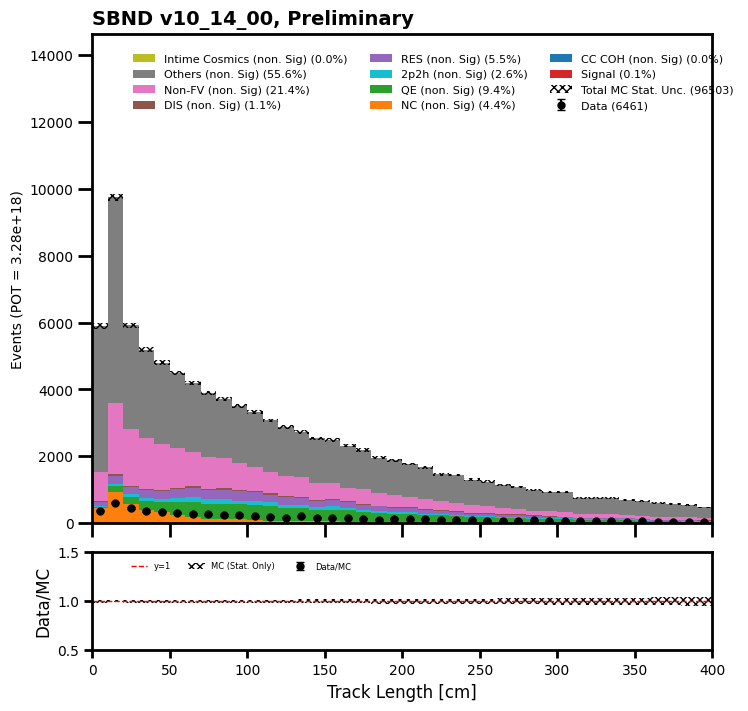

total data =  6504
[4200 1433  377  118   63   41   46   22   22   13    9   14    8    7
   10    2    8    8    5    5    5    7    7    4    9    4    4    6
    3    2    5    5    4    1    9    6    1    2    7    2]
[6.7190e+04 1.6512e+04 5.0230e+03 1.8570e+03 1.0290e+03 6.9800e+02
 5.3200e+02 4.2400e+02 3.2600e+02 2.6000e+02 2.0300e+02 1.7700e+02
 1.4900e+02 1.6400e+02 1.5200e+02 1.5300e+02 1.4600e+02 1.1900e+02
 9.1000e+01 1.0200e+02 1.0500e+02 1.1800e+02 1.0700e+02 1.1600e+02
 9.6000e+01 8.0000e+01 8.0000e+01 8.1000e+01 7.9000e+01 7.1000e+01
 7.8000e+01 6.8000e+01 6.9000e+01 5.9000e+01 6.2000e+01 6.9000e+01
 5.7000e+01 5.8000e+01 5.5000e+01 5.0000e+01]
data ratio  [0.0625093  0.08678537 0.07505475 0.06354335 0.06122449 0.05873926
 0.08646617 0.05188679 0.06748466 0.05       0.04433498 0.07909605
 0.05369128 0.04268293 0.06578947 0.0130719  0.05479452 0.06722689
 0.05494505 0.04901961 0.04761905 0.05932203 0.06542056 0.03448276
 0.09375    0.05       0.05       0.07407407 0.03

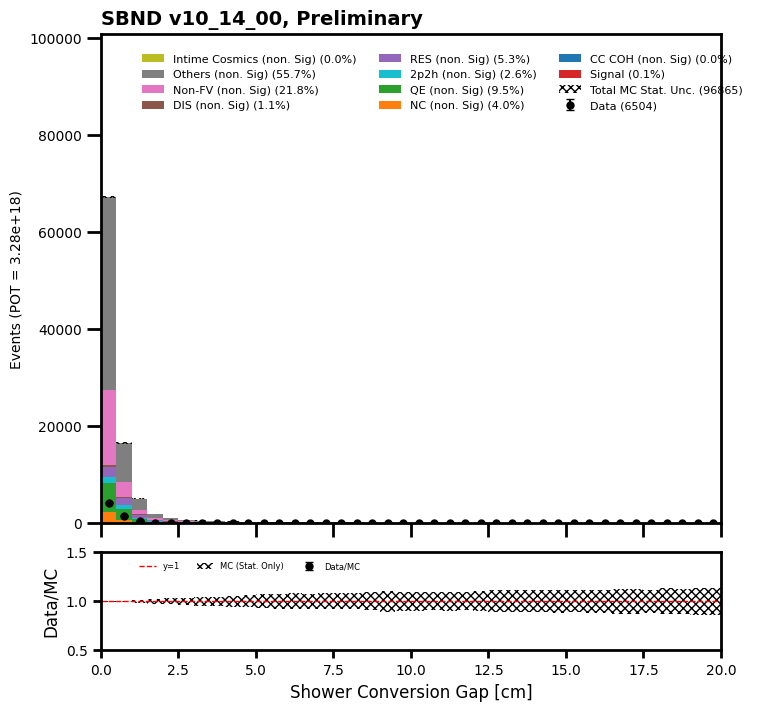

total data =  5771
[  14  111  630 2350  779  276  209  220  248  245  198  122   75   47
   30   24   29   16   14    8   10    7   13    8   21    9    9   12
    4    8    3    4    4    2    2    3    1    0    4    2]
[1.5900e+02 6.0800e+02 6.8590e+03 4.3118e+04 1.0422e+04 4.5480e+03
 3.2010e+03 3.4440e+03 3.7220e+03 3.7120e+03 3.3500e+03 2.2110e+03
 1.3360e+03 9.4700e+02 6.3000e+02 4.5400e+02 3.3700e+02 2.9000e+02
 2.7300e+02 2.1800e+02 1.9800e+02 2.3000e+02 2.2900e+02 2.8400e+02
 3.1500e+02 3.3900e+02 2.9900e+02 2.4800e+02 1.8900e+02 1.2300e+02
 1.1800e+02 1.0200e+02 8.1000e+01 6.7000e+01 5.6000e+01 5.3000e+01
 5.3000e+01 4.5000e+01 4.0000e+01 4.5000e+01]
data ratio  [0.08805031 0.18256579 0.09185012 0.0545016  0.07474573 0.06068602
 0.0652921  0.06387921 0.06663084 0.06600216 0.05910448 0.05517865
 0.05613772 0.04963041 0.04761905 0.05286344 0.08605341 0.05517241
 0.05128205 0.03669725 0.05050505 0.03043478 0.05676856 0.02816901
 0.06666667 0.02654867 0.03010033 0.0483871  0.02

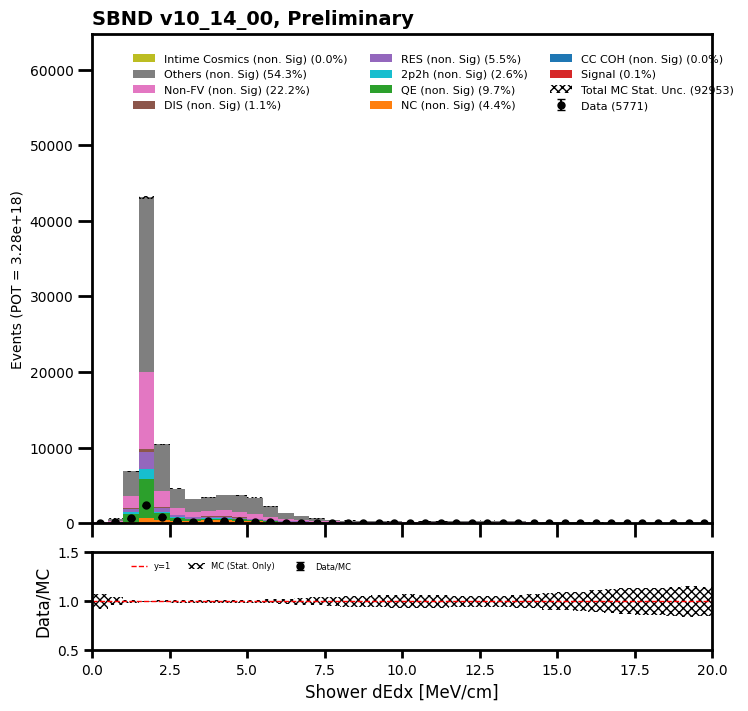

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  6746
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0 4983  982  319  167  102   67   30   22
   23   12   14    7    5    2    1    3    1    4    2    0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 7.5060e+04 1.3464e+04 4.5600e+03 2.5960e+03
 1.5800e+03 9.9300e+02 6.7800e+02 4.7200e+02 3.3000e+02 2.6100e+02
 1.6600e+02 1.3600e+02 1.1400e+02 9.4000e+01 7.0000e+01 5.6000e+01
 4.1000e+01 4.0000e+01 1.7000e+01 1.6000e+01]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.06638689 0.07293523 0.06995614 0.06432974
 0.06455696 0.06747231 0.04424779 0.04661017 0.06

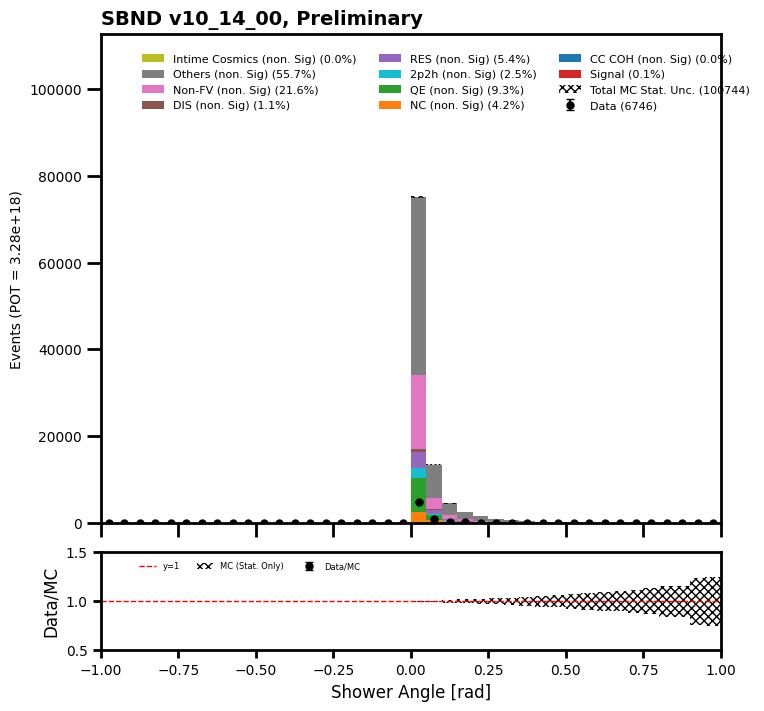

total data =  6216
[  8  29  74 174 191 171 147 126 102 112 110 103 106  76  97  94  79  84
  86  79  83  78  69  55  67  58  80  70  56  68  64  63  63  70  38  58
  59  68  48  61  46  59  54  57  53  40  48  36  39  64  42  40  39  42
  51  29  29  37  43  56  36  40  40  41  35  37  37  35  32  27  32  29
  42  34  33  32  27  33  24  26  24  20  19  34  23  24  32  18  25  26
  32  25  21  23  24  26  26  29  26  27  25  17  21  22  30  21  23  15
  17  27  19  14  15  10  20  12  18  11  14  16  21  20  13  17  14  16
  17  22  18  25  11  14  10  18  17  13  14  11  14  12  11  14  12  10
   9  11  19  11  16  15]
[  91.  549. 1237. 2514. 3148. 2830. 2218. 1924. 1654. 1533. 1482. 1353.
 1347. 1314. 1288. 1205. 1211. 1169. 1229. 1088. 1100. 1120. 1080. 1108.
 1006. 1067. 1015. 1013. 1020.  966.  948.  897.  973.  877.  895.  878.
  848.  846.  930.  778.  780.  815.  787.  822.  791.  745.  775.  722.
  713.  706.  678.  667.  650.  666.  647.  626.  643.  599.  602.  587.
  575.

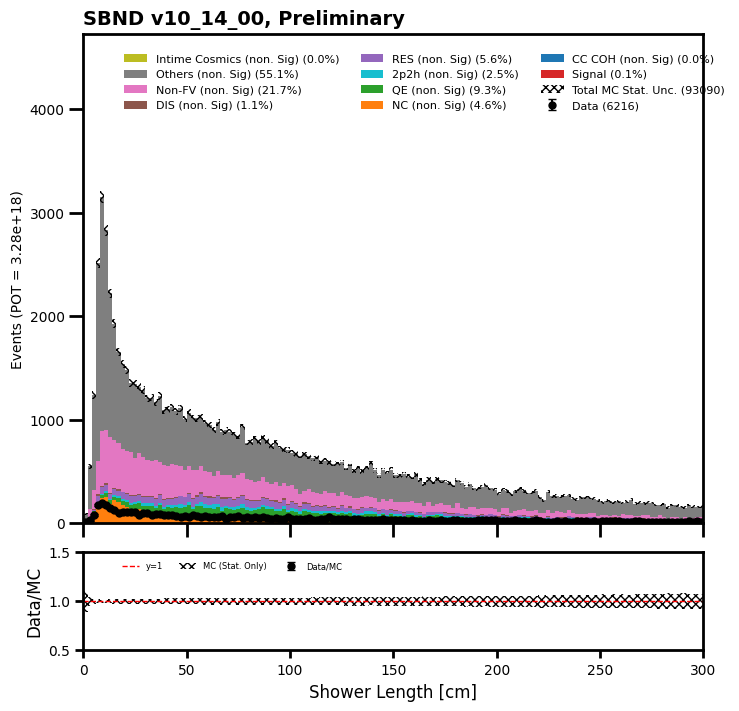

In [112]:
#Clear cosmic

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic == 0]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].slc.is_clear_cosmic == 0]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].slc.is_clear_cosmic == 0]


draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic")

In [69]:
purity = 72.39886474609375/72293.71609687805
efficiency = 72.39886474609375/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.1 % and efficiency =  90.99 %


In [70]:
mc_bnb_cosmic_dfs["evt"].track_counter.value_counts()

track_counter
1     137647
2      89733
3      38870
0      19295
4      15678
5       4457
6       1597
7        600
8        155
10        24
9         23
Name: count, dtype: int64

In [71]:
mc_bnb_cosmic_dfs["evt"].shower_counter.value_counts()

shower_counter
1     151789
2      94258
3      38670
4      15036
5       5412
6       1910
7        602
8        290
9         89
10        23
Name: count, dtype: int64

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  2485
[   0 2485]
[    0 44756]
data ratio  [       nan 0.05552328]
mode sums =  [100.0, 33.0, 3959.0, 9043.0, 2491.0, 5325.0, 1114.0, 2703.0, 19988.0, 0.0]
fractions =  [0.22343372955581373, 0.07373313075341853, 8.845741353114667, 20.205112163732235, 5.56573420323532, 11.897846098847081, 2.4890517472517653, 6.039413709893646, 44.659933863616054, 0.0]
total sums =  44756.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


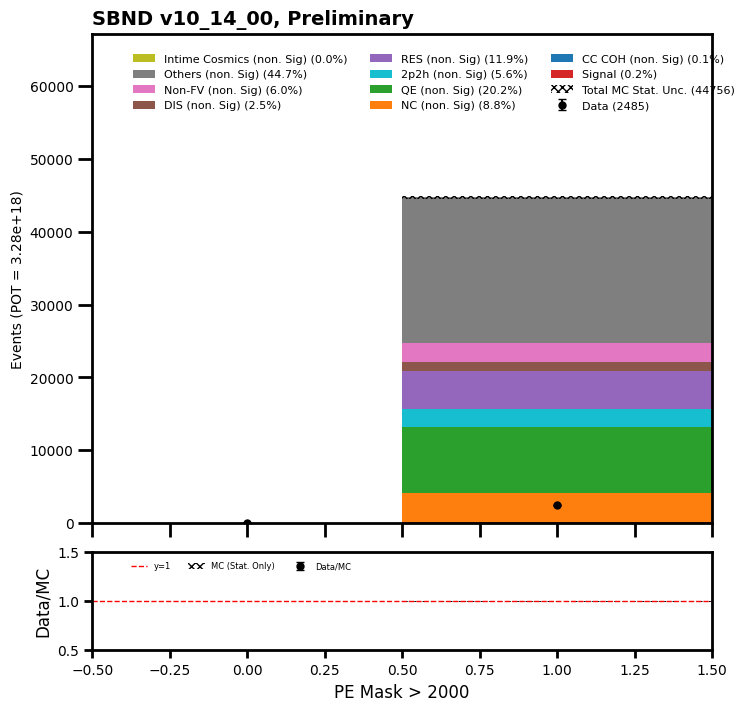

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[  0   0   0   0   0   0   0   0   0   0 724 877 735 149   0   0   0   0
   0   0]
[    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  9769. 15970. 15948.  3069.     0.     0.     0.     0.     0.     0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.07411199 0.05491547
 0.04608728 0.04855002        nan        nan        nan        nan
        nan        nan]
mode sums =  [100.0, 33.0, 3959.0, 9043.0, 2491.0, 5325.0, 1114.0, 2703.0, 19988.0, 0.0]
fractions =  [0.22343372955581373, 0.07373313075341853, 8.845741353114667, 20.205112163732235, 5.56573420323532, 11.897846098847081, 2.4890517472517653, 6.039413709893646, 44.659933863616054, 0.0]
total sums =  44756.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


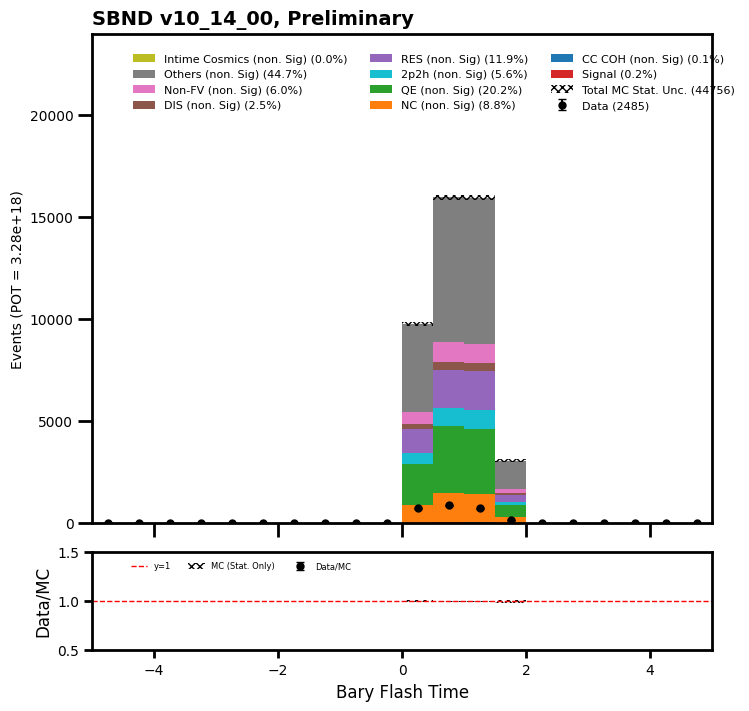

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[2485    0]
[212   0]
data ratio  [11.72169811         nan]
mode sums =  [100.0, 33.0, 119.0, 83.0, -69.0, -51.0, 90.0, -113.0, 20.0, 0.0]
fractions =  [47.16981132075472, 15.566037735849056, 56.132075471698116, 39.15094339622642, -32.54716981132076, -24.056603773584907, 42.45283018867924, -53.301886792452834, 9.433962264150944, 0.0]
total sums =  212.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


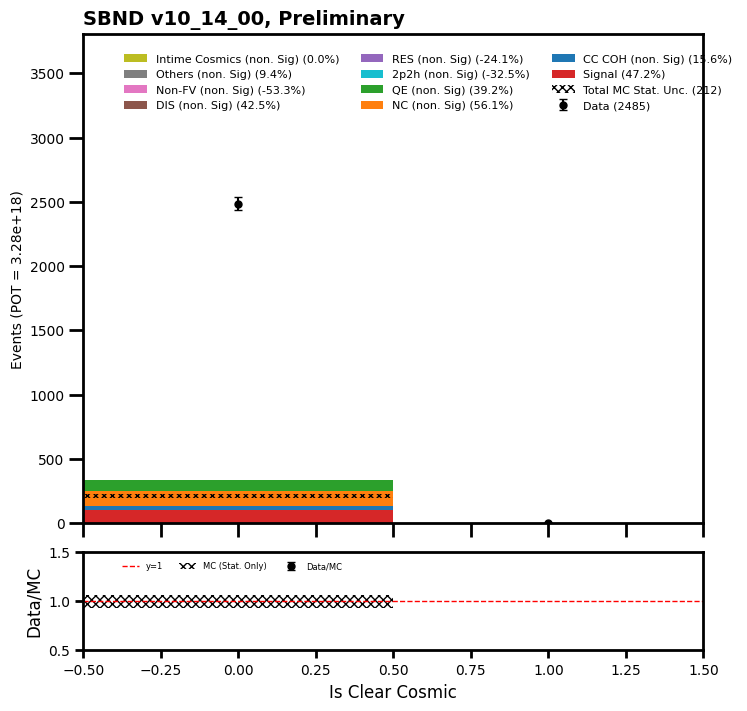

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 30 38 42 51 46 51
 49 57 57 39 43 53 41 52 47 48 58 31 46 38 54 39 32 38 37 28 34 32 45 36
 33 35 23 31 29 36 39 33 39 37 38 46 32 29 33 32 41 38 41 42 40 37 31 31
 33 39 32 35 39 30 39 37 36 27  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0. 552. 795. 763. 840. 805. 825. 797. 767. 809. 768.
 787. 774. 788. 756. 830. 800. 771. 740. 789. 751. 712. 787. 670. 704.
 727. 722. 719. 630. 715. 710. 678. 809. 745. 609. 673. 662. 643. 674.
 655. 635. 717. 661. 652. 639. 703. 623. 647. 638. 717. 696. 640. 647.
 659. 634. 642. 632. 669. 636. 627. 627. 632. 600. 632. 400.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

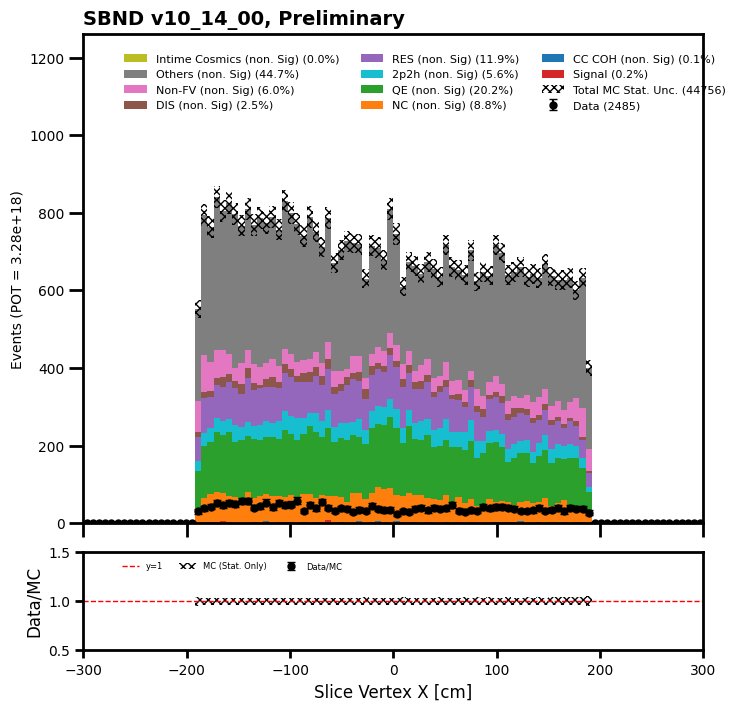

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 28 36 36 51 41 36
 33 41 31 37 30 31 39 38 33 35 35 45 29 32 48 46 40 39 41 33 40 41 41 43
 43 50 40 39 50 55 34 40 38 37 40 51 48 42 49 39 47 56 37 33 29 24 26 31
 33 25 39 33 32 44 35 42 59 36  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0. 438. 644. 621. 637. 641. 639. 703. 596. 587. 738.
 657. 665. 674. 703. 644. 700. 682. 699. 693. 717. 722. 725. 746. 777.
 717. 769. 758. 784. 768. 772. 791. 805. 783. 722. 779. 764. 763. 779.
 799. 811. 795. 832. 872. 783. 844. 859. 839. 833. 726. 523. 535. 506.
 501. 537. 531. 539. 598. 577. 600. 661. 707. 749. 835. 562.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

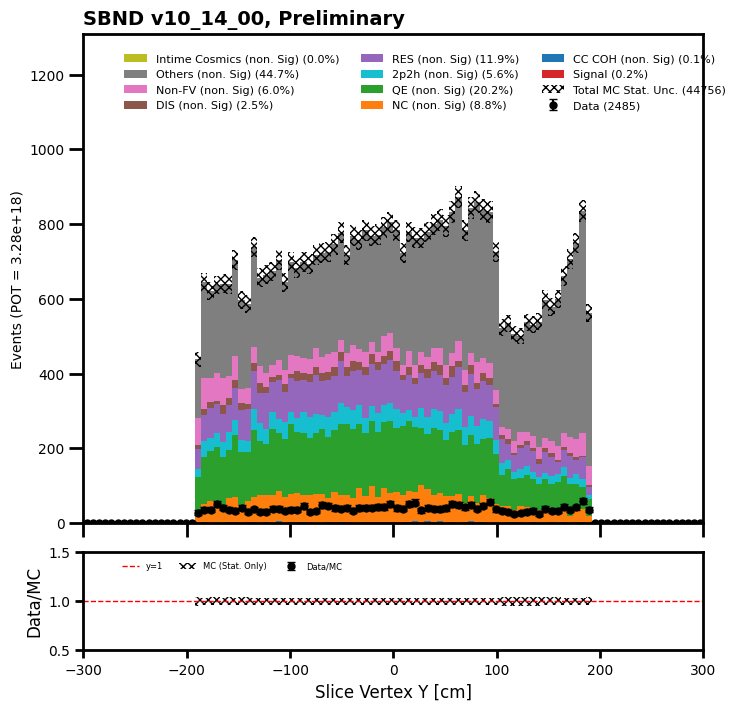

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17 66 52 45 47 51 55 41 36
 41 50 46 52 36 43 60 30 53 40 49 50 44 50 52 46 41 45 52 37 36 51 39 46
 45 39 32 29 30 24 27 30 22 31 41 37 34 25 27 23 31 41 47 31 24 38 32 31
 28 37 45 25 26 37 17  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.  317. 1018.  965.  947.  910.  899.  919.  799.  846.
  865.  884.  853.  859.  809.  797.  844.  844.  821.  826.  788.  783.
  841.  768.  842.  825.  754.  770.  814.  771.  839.  789.  801.  810.
  840.  833.  570.  561.  539.  559.  555.  536.  540.  527.  517.  541.
  516.  579.  542.  564.  589.  581.  593.  534.  545.  505.  549.  562.
  548.  552.  539.  579.  581.  601.  362.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.]
data ratio  [       nan        nan        nan        nan        n

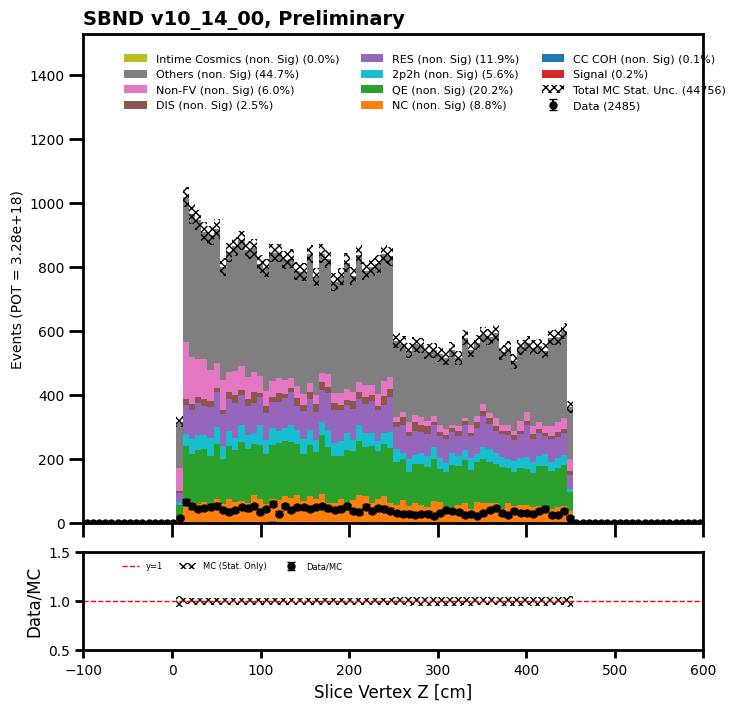

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2485
[  0   0   0   0   0   0   0   0   0   0   1   1   2  14  28  31  61  83
 133 189 214 208 177 178 142 129 142 127 105  81  90 104  85  68  55  25
  11   0   1   0   0   0   0   0   0   0   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 9.000e+00 2.100e+01 1.030e+02 2.370e+02
 4.670e+02 7.980e+02 1.170e+03 1.539e+03 2.203e+03 2.641e+03 3.192e+03
 3.248e+03 3.075e+03 2.889e+03 2.573e+03 2.397e+03 2.134e+03 2.061e+03
 1.950e+03 1.990e+03 1.930e+03 2.013e+03 1.924e+03 1.779e+03 1.333e+03
 7.100e+02 3.000e+02 6.000e+01 8.000e+00 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.11111111 0.04761905
 0.01941748 0.05907173 0.05995717 0.03884712 0.05213675 0.05393112
 0.06037222 0.0715638  0.06704261 0.06403941 0.05756098

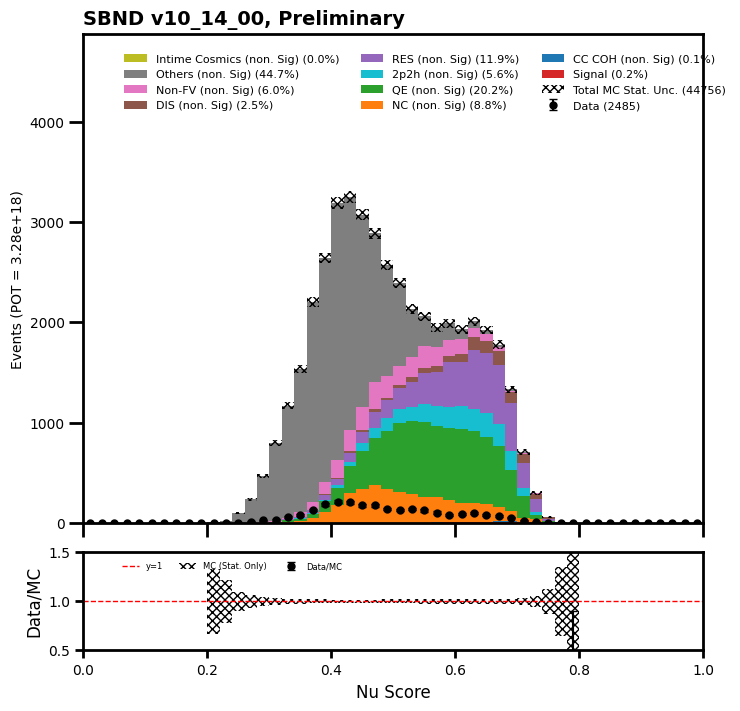

total data =  2443
[1516  180  154  118   79   58   58   47   33   18   25   18   19   11
   19    8    4    9    6    9    4    5    5    1    4    4    2    4
    2    1    4    2    2    3    1    1    1    3    1    4]
[2.3131e+04 5.6820e+03 4.1920e+03 2.7590e+03 1.9160e+03 1.3930e+03
 1.0330e+03 7.7800e+02 6.0300e+02 4.3700e+02 3.5900e+02 2.8600e+02
 2.7000e+02 1.8900e+02 1.7900e+02 1.5900e+02 1.3000e+02 1.2900e+02
 9.6000e+01 8.1000e+01 7.5000e+01 7.5000e+01 5.2000e+01 4.3000e+01
 5.0000e+01 3.7000e+01 5.0000e+01 3.7000e+01 3.7000e+01 2.1000e+01
 2.6000e+01 2.8000e+01 1.5000e+01 2.0000e+01 2.1000e+01 1.6000e+01
 1.5000e+01 1.3000e+01 1.4000e+01 1.1000e+01]
data ratio  [0.06553975 0.03167899 0.03673664 0.04276912 0.04123173 0.04163676
 0.05614714 0.06041131 0.05472637 0.04118993 0.06963788 0.06293706
 0.07037037 0.05820106 0.10614525 0.05031447 0.03076923 0.06976744
 0.0625     0.11111111 0.05333333 0.06666667 0.09615385 0.02325581
 0.08       0.10810811 0.04       0.10810811 0.05

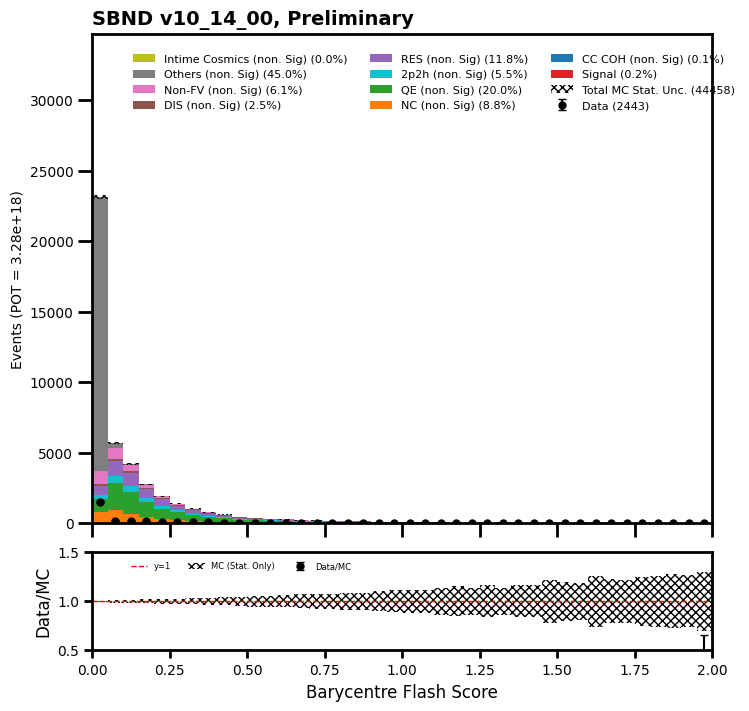

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2484
[  0   0   0   0   0   0   0   0   0   0   1   0   1   1   7   7   8   8
  20  29  43  49  64  85  69  73  57  80  90  96 113 106  96 124 149 106
 144 130 130 134 124 125 110  66  38   1   0   0   0   0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    6.   15.
   31.   50.   84.  120.  237.  307.  420.  565.  746.  926. 1241. 1297.
 1127.  955.  998. 1361. 1620. 1768. 1942. 2011. 2040. 2061. 2233. 2251.
 2429. 2519. 2506. 2426. 2380. 2247. 1963. 1371.  470.   24.    0.    0.
    0.    0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.16666667 0.
 0.03225806 0.02       0.08333333 0.05833333 0.03375527 0.02605863
 0.04761905 0.05132743 0.05764075 0.05291577 0.05157131 0.06553585
 0.06122449 0.07643979 0.05711423 0.05878031 0.05555556 0.05429864
 0.05818744 0.05271009 0.04705882 0.06016497 0.06672638 0.04709018
 0.05928366 0.05160778 0.0518755  0.05523495 0.05210084 0.0556297

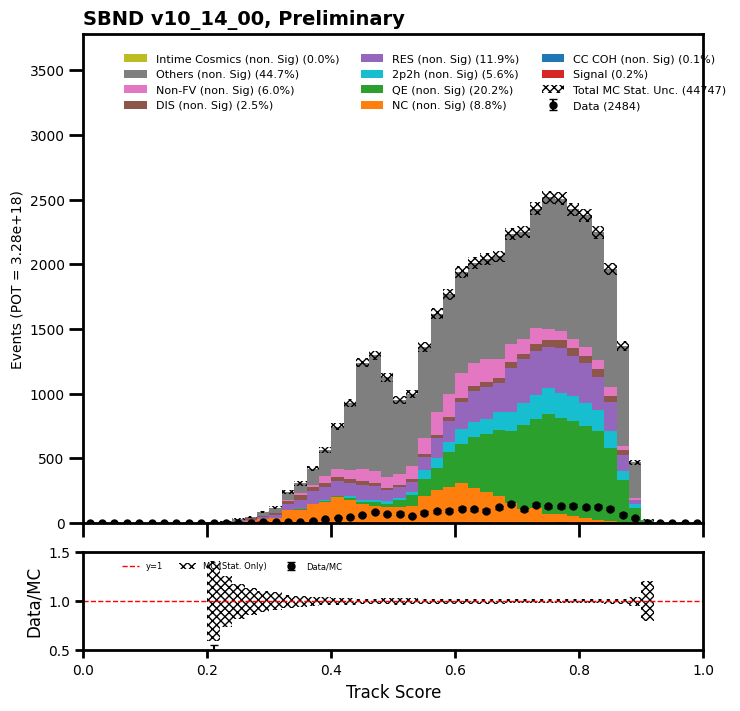

total data =  2476
[535 515 374 304 250 140 132  95  51  34  19   9   5   2   3   1   0   3
   0   0   0   3   0   0   1]
[9.039e+03 9.803e+03 7.777e+03 5.882e+03 4.056e+03 2.793e+03 2.009e+03
 1.353e+03 8.260e+02 4.330e+02 2.780e+02 1.300e+02 6.900e+01 4.200e+01
 2.500e+01 2.100e+01 1.100e+01 1.000e+01 1.000e+01 7.000e+00 1.600e+01
 8.000e+00 1.000e+01 1.200e+01 1.000e+01]
data ratio  [0.05918796 0.05253494 0.04809052 0.0516831  0.06163708 0.05012531
 0.06570433 0.07021434 0.06174334 0.07852194 0.06834532 0.06923077
 0.07246377 0.04761905 0.12       0.04761905 0.         0.3
 0.         0.         0.         0.375      0.         0.
 0.1       ]
mode sums =  [97.0, 33.0, 3949.0, 9037.0, 2489.0, 5322.0, 1112.0, 2699.0, 19892.0, 0.0]
fractions =  [0.2173425946672642, 0.07394129509298678, 8.848308312794085, 20.24871162894914, 5.576966166255882, 11.924714317723504, 2.4915975801030696, 6.047501680483979, 44.57091642393009, 0.0]
total sums =  44630.0
['Signal', 'CC COH (non. Sig)', 'NC (non

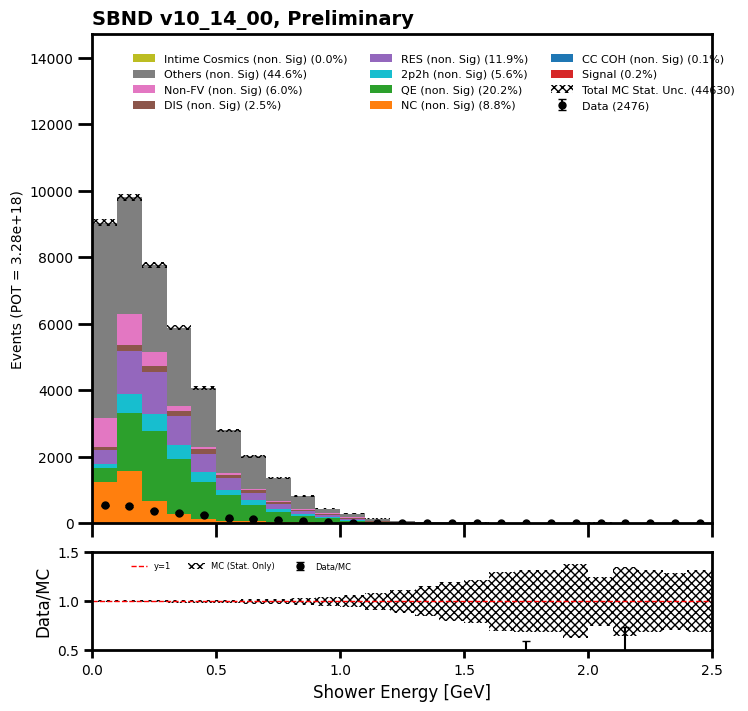

total data =  2414
[173 214 143 115 104 104 102  97  74  84  75  74  67  76  65  72  69  58
  43  57  48  44  44  42  32  29  30  32  43  31  16  23  23  24  12  13
  16  23  11  12]
[2930. 4255. 2350. 2099. 1941. 1863. 1830. 1715. 1666. 1607. 1588. 1465.
 1389. 1347. 1241. 1178. 1154. 1068.  930.  888.  864.  783.  719.  692.
  583.  578.  525.  522.  484.  428.  412.  353.  325.  345.  309.  275.
  248.  231.  228.  179.]
data ratio  [0.05904437 0.05029377 0.06085106 0.05478799 0.05358063 0.05582394
 0.0557377  0.05655977 0.04441777 0.05227131 0.04722922 0.05051195
 0.04823614 0.05642168 0.05237712 0.06112054 0.05979203 0.05430712
 0.04623656 0.06418919 0.05555556 0.05619413 0.06119611 0.06069364
 0.05488851 0.05017301 0.05714286 0.06130268 0.08884298 0.07242991
 0.03883495 0.06515581 0.07076923 0.06956522 0.03883495 0.04727273
 0.06451613 0.0995671  0.04824561 0.06703911]
mode sums =  [95.0, 31.0, 3912.0, 8783.0, 2414.0, 5178.0, 1010.0, 2636.0, 19528.0, 0.0]
fractions =  [0.21795489

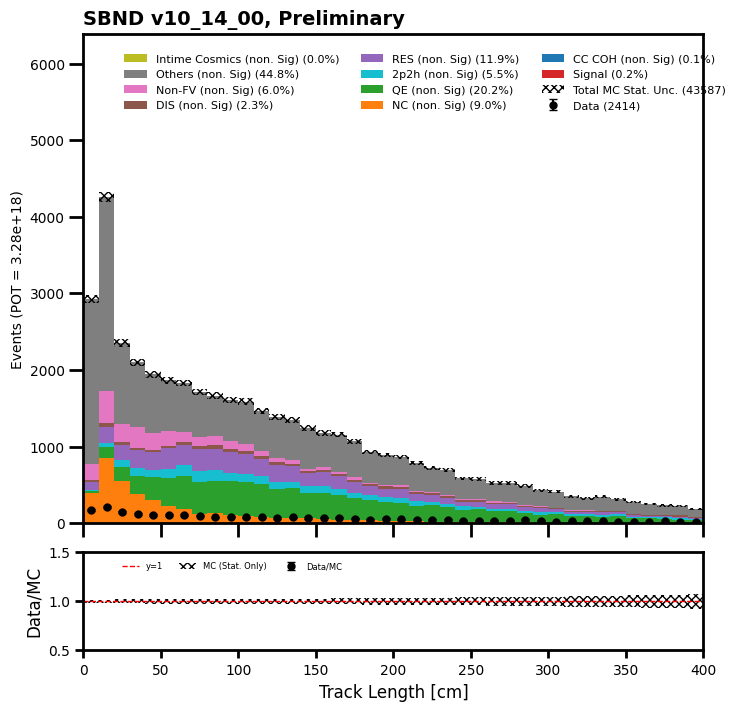

total data =  2355
[1325  608  183   54   32   22   22   11   12    6    5    6    0    3
    4    2    3    4    3    2    3    3    4    2    4    2    1    3
    1    2    3    2    3    1    5    3    1    1    3    1]
[25006.  9479.  3119.  1161.   617.   415.   299.   251.   178.   155.
   122.   107.    85.    78.    86.    80.    87.    69.    50.    68.
    53.    65.    76.    79.    51.    49.    43.    41.    53.    36.
    44.    43.    35.    35.    36.    36.    29.    32.    35.    28.]
data ratio  [0.05298728 0.06414179 0.05867265 0.04651163 0.05186386 0.05301205
 0.0735786  0.0438247  0.06741573 0.03870968 0.04098361 0.05607477
 0.         0.03846154 0.04651163 0.025      0.03448276 0.05797101
 0.06       0.02941176 0.05660377 0.04615385 0.05263158 0.02531646
 0.07843137 0.04081633 0.02325581 0.07317073 0.01886792 0.05555556
 0.06818182 0.04651163 0.08571429 0.02857143 0.13888889 0.08333333
 0.03448276 0.03125    0.08571429 0.03571429]
mode sums =  [91.0, 31.0, 3586.0

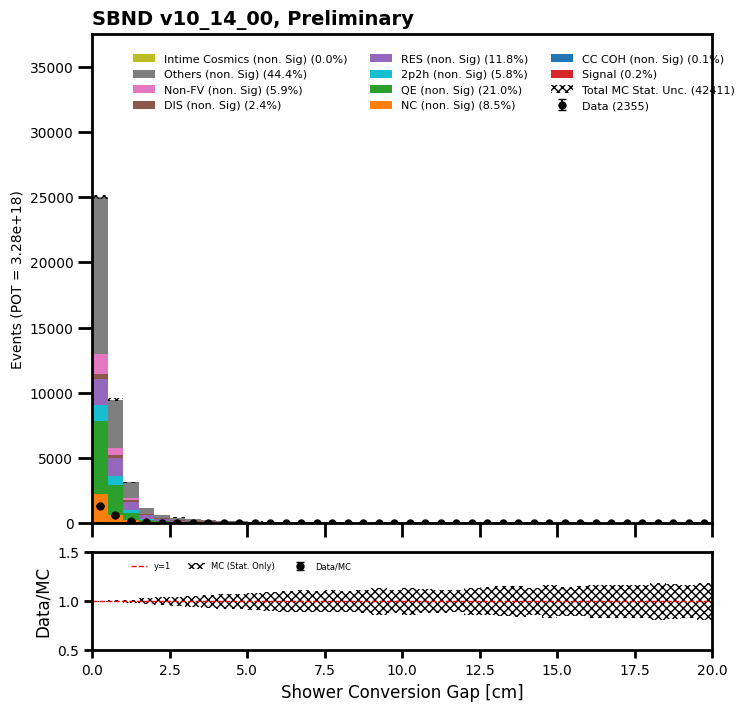

total data =  2410
[  6  35 203 836 302 108 109 118 139 140 123  71  42  26  15  20  15  10
  11   5   6   5   9   3  13   5   5   8   1   4   3   3   3   0   1   3
   0   0   3   1]
[   95.   333.  2968. 16357.  4648.  2379.  1739.  1951.  2188.  2280.
  2132.  1401.   837.   601.   385.   267.   225.   167.   172.   137.
   122.   142.   160.   174.   209.   211.   190.   165.   130.    84.
    77.    65.    56.    47.    31.    37.    37.    31.    24.    35.]
data ratio  [0.06315789 0.10510511 0.06839623 0.05110962 0.06497418 0.04539723
 0.0626797  0.0604818  0.06352834 0.06140351 0.05769231 0.05067809
 0.05017921 0.04326123 0.03896104 0.07490637 0.06666667 0.05988024
 0.06395349 0.03649635 0.04918033 0.03521127 0.05625    0.01724138
 0.06220096 0.02369668 0.02631579 0.04848485 0.00769231 0.04761905
 0.03896104 0.04615385 0.05357143 0.         0.03225806 0.08108108
 0.         0.         0.125      0.02857143]
mode sums =  [96.0, 33.0, 3806.0, 8770.0, 2361.0, 5012.0, 1027.0, 2627.0

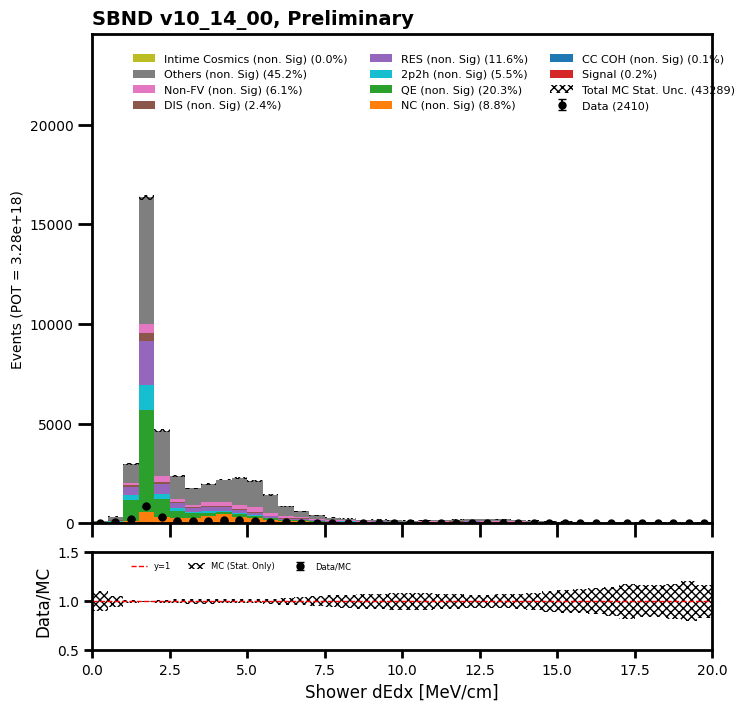

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2480
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0 1692  428  141   68   58   34   14   12
   10    5    7    5    2    0    0    1    0    2    1    0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 3.1034e+04 7.2770e+03 2.4420e+03 1.3610e+03
 7.8100e+02 5.2100e+02 3.6600e+02 2.4300e+02 1.7100e+02 1.4100e+02
 8.7000e+01 6.5000e+01 7.0000e+01 4.0000e+01 3.0000e+01 3.5000e+01
 2.2000e+01 1.7000e+01 1.1000e+01 8.0000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.05452085 0.05881545 0.05773956 0.04996326
 0.07426376 0.06525912 0.03825137 0.04938272 0.05

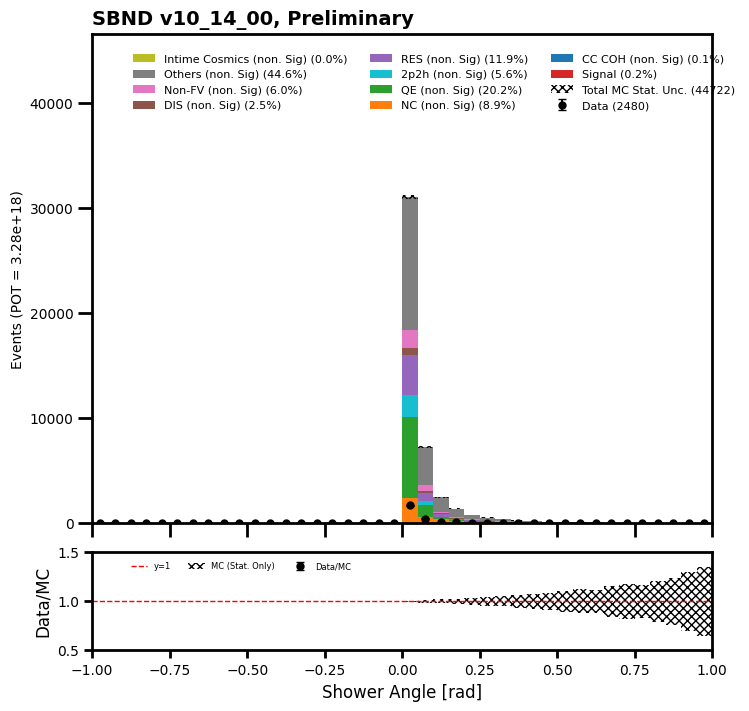

total data =  2325
[ 5 13 45 78 80 61 47 38 33 41 34 32 33 26 29 30 24 22 43 25 28 19 18 16
 20 20 32 25 20 23 31 20 24 28 13 15 23 26 12 18 15 19 20 19 23 16 20 14
 12 25 16 14 14 16 21 12 13 11 19 23 12 13 18 16 12 15 16 20 12 10 17 16
 17 15 14  9 15 15 10 13 13  5  8 17  9  9 16  4 12 10 15 12  6 10  6 15
  6 10  6 13 13 11  7  7 14  4  9  7  5  7 10  4  6  2  6  6 11  2  8  6
  7 10  8  7  3  8  7 10 10  8  4  6  6  8  5  3  6  3  6  4  4  5  6  4
  4  5 11  4  6  3]
[  45.  300.  617. 1265. 1441. 1310.  902.  851.  696.  627.  618.  548.
  535.  543.  501.  514.  523.  461.  510.  448.  473.  436.  427.  466.
  434.  477.  435.  458.  444.  438.  430.  389.  438.  414.  416.  391.
  373.  384.  427.  369.  354.  357.  384.  390.  388.  361.  356.  359.
  370.  311.  323.  324.  289.  332.  306.  302.  335.  301.  290.  287.
  288.  264.  292.  251.  285.  244.  247.  244.  245.  271.  250.  229.
  265.  223.  230.  214.  233.  204.  215.  228.  227.  195.  167.  199.
  209.  213.

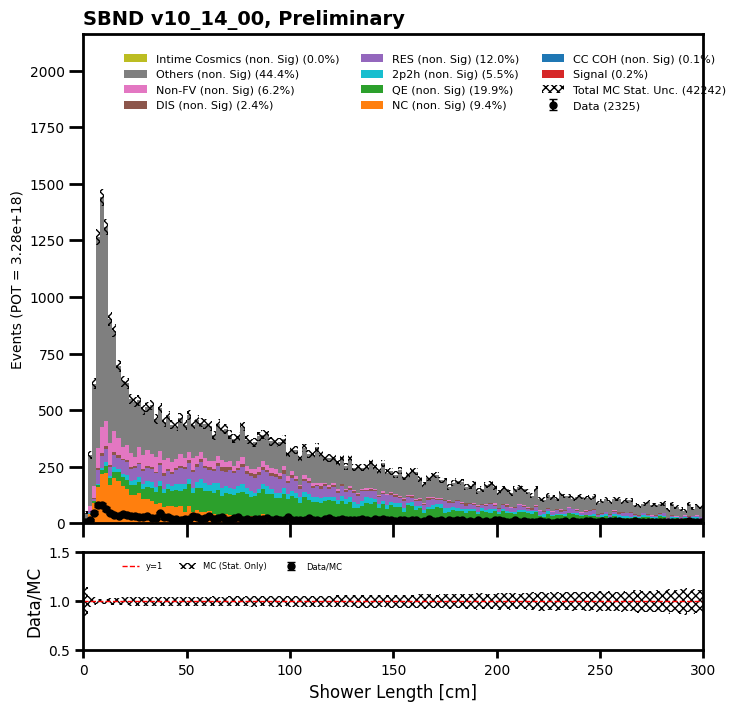

In [113]:
#Vertex Cut

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][InFV_nohiyz_pm10(mc_bnb_cosmic_dfs["evt"].slc.vertex)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][InFV_nohiyz_pm10(data_offbeam_light_dfs["evt"].slc.vertex)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][InFV_nohiyz_pm10(data_bnb_light_dfs["evt"].slc.vertex)]

#plot

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_b_vtxfvcut")

In [114]:
purity = 71.68204498291016/32081.107650756836
efficiency = 71.68204498291016/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.22 % and efficiency =  90.09 %


In [115]:
mc_bnb_cosmic_dfs["evt"].track_counter.value_counts()

track_counter
2     53080
1     46489
3     26924
4     11570
0      9646
5      3365
6      1160
7       463
8       135
10       24
9        23
Name: count, dtype: int64

In [116]:
mc_bnb_cosmic_dfs["evt"].shower_counter.value_counts()

shower_counter
1     67661
2     48543
3     22398
4      8941
5      3482
6      1134
7       439
8       207
9        61
10       13
Name: count, dtype: int64

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  1023
[   0 1023]
[    0 20591]
data ratio  [      nan 0.0496819]
mode sums =  [93.0, 33.0, 2217.0, 6986.0, 2080.0, 4645.0, 991.0, 1332.0, 2214.0, 0.0]
fractions =  [0.45165363508328876, 0.16026419309407022, 10.766839881501628, 33.927444028944684, 10.101500655626245, 22.55839930066534, 4.812782283521927, 6.468845612160652, 10.752270409402167, 0.0]
total sums =  20591.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


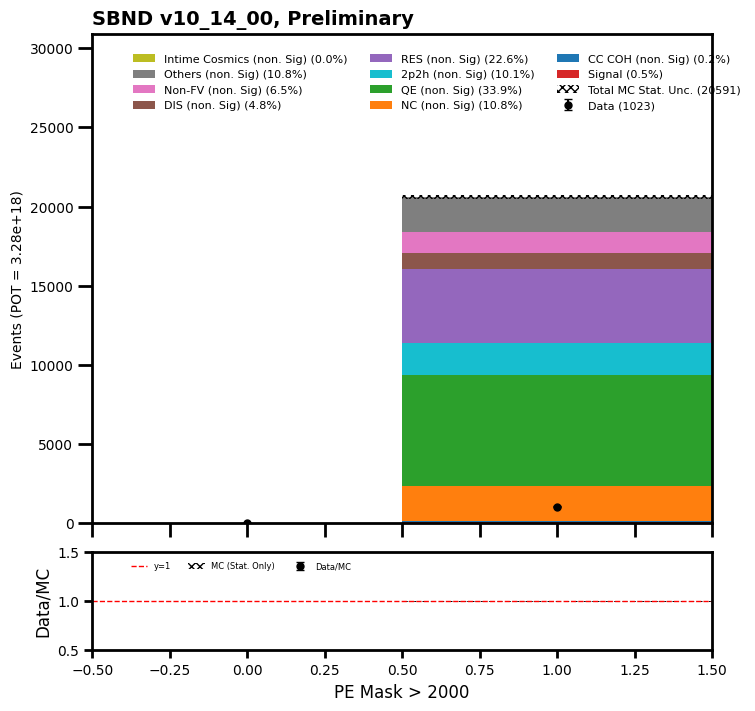

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[  0   0   0   0   0   0   0   0   0   0 289 377 299  58   0   0   0   0
   0   0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0. 4547. 7320.
 7337. 1387.    0.    0.    0.    0.    0.    0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.06355839 0.05150273
 0.04075235 0.04181687        nan        nan        nan        nan
        nan        nan]
mode sums =  [93.0, 33.0, 2217.0, 6986.0, 2080.0, 4645.0, 991.0, 1332.0, 2214.0, 0.0]
fractions =  [0.45165363508328876, 0.16026419309407022, 10.766839881501628, 33.927444028944684, 10.101500655626245, 22.55839930066534, 4.812782283521927, 6.468845612160652, 10.752270409402167, 0.0]
total sums =  20591.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


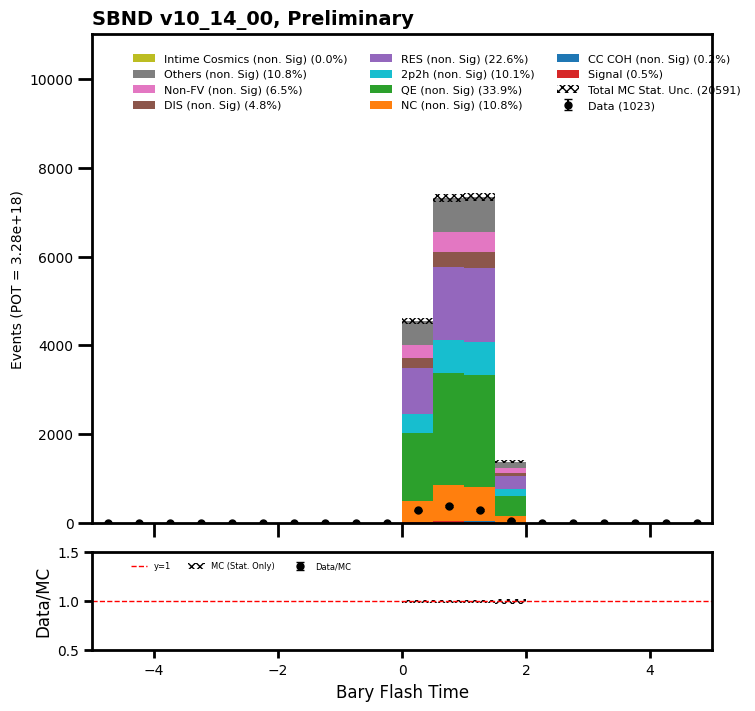

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[1023    0]
[111   0]
data ratio  [9.21621622        nan]
mode sums =  [93.0, 33.0, -87.0, 74.0, 32.0, 37.0, -33.0, 52.0, -90.0, 0.0]
fractions =  [83.78378378378379, 29.72972972972973, -78.37837837837837, 66.66666666666666, 28.82882882882883, 33.33333333333333, -29.72972972972973, 46.846846846846844, -81.08108108108108, 0.0]
total sums =  111.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


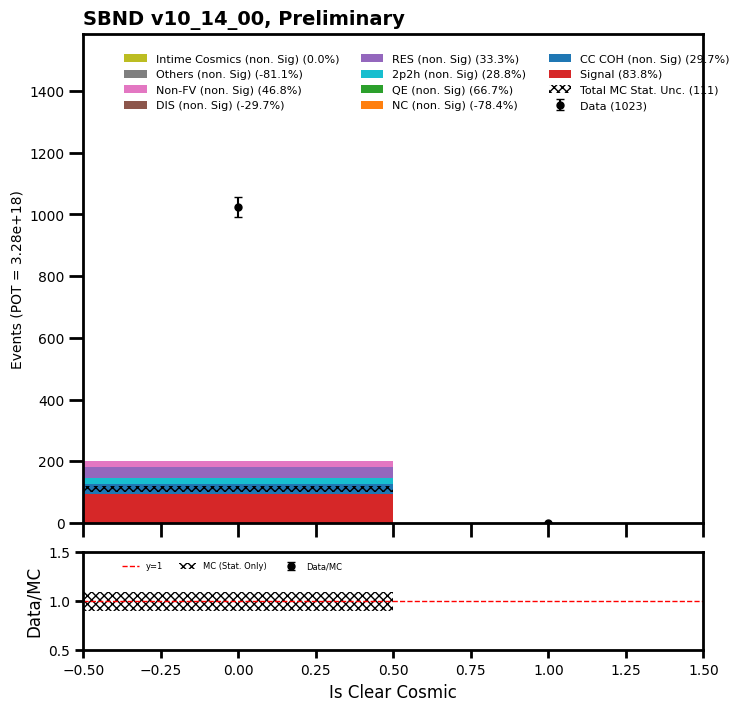

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  9 18 12 21 19 16
 19 28 22 17 14 21 19 16 19 23 18 10 21 16 28 20 12 17 15 13 15 18 24 18
 10 13 13 13 13 16 19 11 15 17 17 19 12 12 17 13 19 16 15 15 17 17 13 13
 15 17 16 11 13 13 11 14 17  3  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0. 227. 312. 327. 350. 357. 363. 345. 345. 369. 345.
 339. 346. 345. 341. 392. 364. 362. 346. 350. 367. 357. 400. 323. 333.
 342. 360. 356. 304. 364. 355. 346. 393. 378. 319. 371. 344. 332. 361.
 312. 322. 359. 315. 327. 291. 343. 283. 298. 311. 336. 312. 271. 285.
 287. 290. 256. 264. 290. 251. 251. 249. 259. 245. 223. 131.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

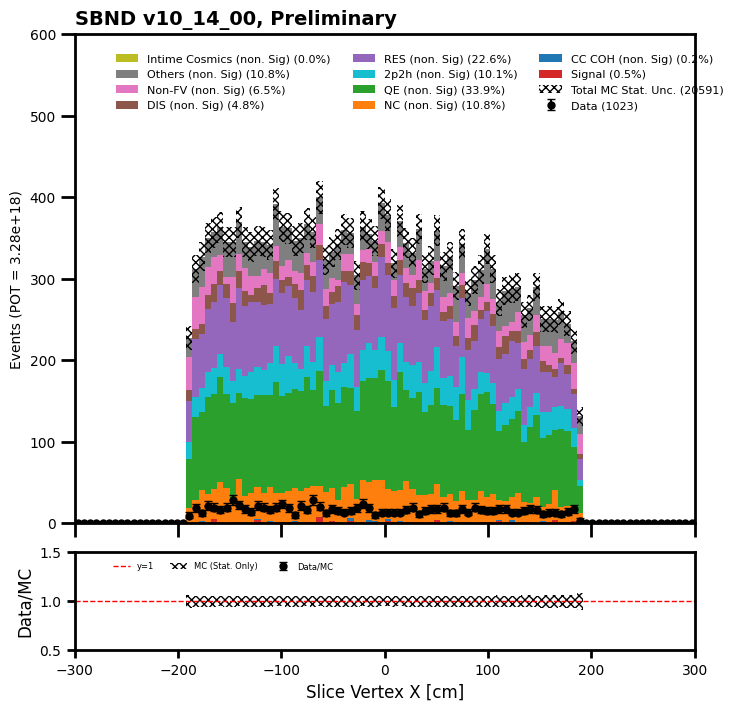

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  9 11 22 26 20 16
 18 24 13 19 13 10 20 22 10 14 10 16 12 17 23 26 20 14 21 18 15 23 19 15
 22 24 20 15 23 24 10 20 16 21 17 22 22 23 20 13 17 23 14 13  8 13 11  7
 14 12  7 13  3  8  9  8 11  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0. 220. 333. 326. 342. 330. 316. 366. 294. 306. 391.
 371. 326. 341. 368. 344. 373. 377. 381. 378. 397. 363. 386. 397. 401.
 396. 425. 395. 386. 418. 406. 425. 435. 386. 348. 383. 329. 370. 378.
 391. 388. 376. 381. 410. 365. 403. 366. 373. 346. 304. 209. 215. 197.
 195. 195. 179. 166. 197. 172. 159. 160. 161. 139. 148.  89.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

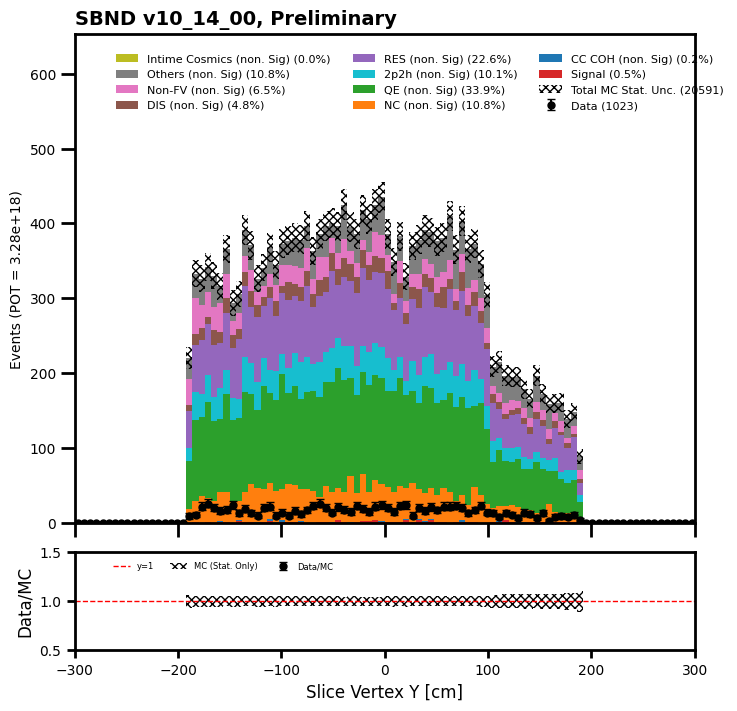

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  7 18 23 22 23 22 16 22 14
 17 22 23 17 18 15 29 14 21 11 25 15 18 24 18 19 16 15 28 15 12 20 12 17
 16 12 11 12 15 11 13 11  9 17 18 16 15 13 13  9 11 15 24 16 10 14  9 13
 11 18 15 12 16 15  5  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0. 126. 435. 413. 418. 404. 409. 406. 339. 362. 371. 380. 377. 378.
 386. 342. 365. 385. 355. 369. 336. 344. 363. 349. 391. 392. 328. 332.
 350. 339. 368. 339. 361. 349. 376. 372. 275. 277. 280. 280. 271. 281.
 276. 255. 244. 276. 245. 311. 278. 283. 316. 310. 286. 273. 262. 259.
 269. 280. 265. 271. 244. 283. 271. 295. 166.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

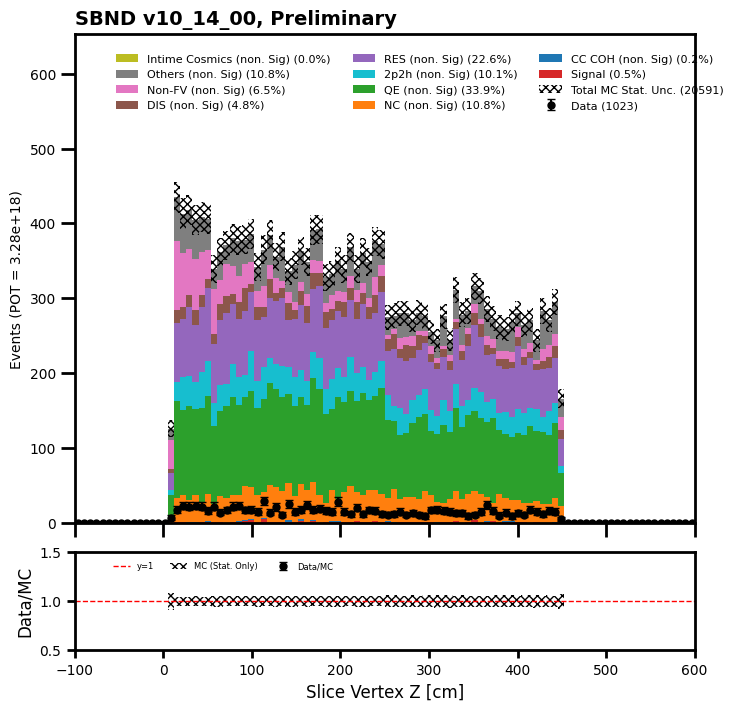

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0 129 142 127 105  81  90 104  85  68  55  25
  11   0   1   0   0   0   0   0   0   0   0   0   0   0]
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.397e+03 2.134e+03 2.061e+03
 1.950e+03 1.990e+03 1.930e+03 2.013e+03 1.924e+03 1.779e+03 1.333e+03
 7.100e+02 3.000e+02 6.000e+01 8.000e+00 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan

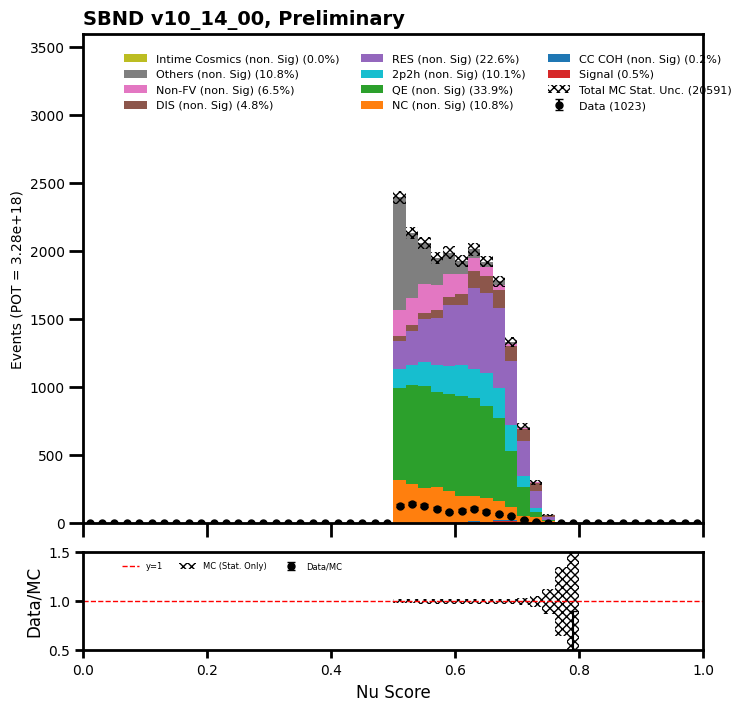

total data =  984
[304 128 103  78  58  46  49  37  25  14  14  14  15  11  16   7   2   8
   3   8   2   4   5   0   2   3   1   4   2   1   4   2   2   3   1   1
   0   2   1   4]
[3889. 3806. 3125. 2171. 1561. 1136.  878.  654.  528.  373.  304.  248.
  237.  165.  148.  132.  122.  115.   80.   75.   62.   61.   46.   40.
   42.   30.   48.   31.   34.   20.   21.   25.   12.   20.   20.   15.
   14.   13.   13.    9.]
data ratio  [0.0781692  0.03363111 0.03296    0.03592814 0.03715567 0.04049296
 0.05580866 0.05657492 0.04734848 0.03753351 0.04605263 0.05645161
 0.06329114 0.06666667 0.10810811 0.0530303  0.01639344 0.06956522
 0.0375     0.10666667 0.03225806 0.06557377 0.10869565 0.
 0.04761905 0.1        0.02083333 0.12903226 0.05882353 0.05
 0.19047619 0.08       0.16666667 0.15       0.05       0.06666667
 0.         0.15384615 0.07692308 0.44444444]
mode sums =  [93.0, 33.0, 2189.0, 6872.0, 2037.0, 4591.0, 972.0, 1323.0, 2213.0, 0.0]
fractions =  [0.4576096048811691, 0.16237

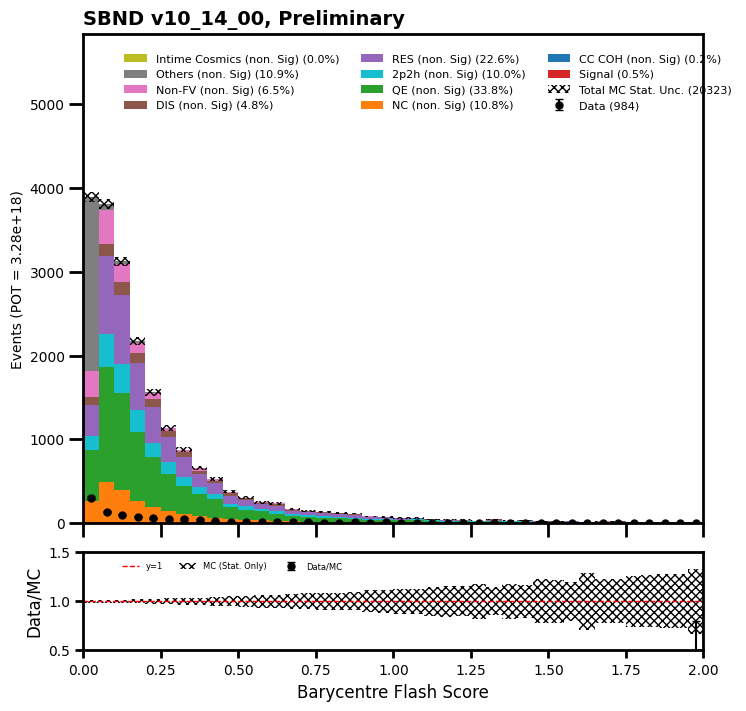

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1023
[ 0  0  0  0  0  0  0  0  0  0  1  0  1  1  5  6  8  6 15 19 15 14 16 10
 12 17 14 20 25 36 45 50 48 60 84 48 69 60 75 51 52 59 46 25 10  0  0  0
  0  0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    4.    8.
   25.   41.   65.  101.  203.  246.  311.  348.  388.  310.  253.  241.
  198.  217.  251.  375.  463.  612.  775.  904.  990. 1036. 1240. 1270.
 1364. 1393. 1371. 1340. 1308. 1223.  980.  555.  169.   12.    0.    0.
    0.    0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.25       0.
 0.04       0.02439024 0.07692308 0.05940594 0.03940887 0.02439024
 0.04823151 0.0545977  0.03865979 0.04516129 0.06324111 0.04149378
 0.06060606 0.07834101 0.05577689 0.05333333 0.05399568 0.05882353
 0.05806452 0.05530973 0.04848485 0.05791506 0.06774194 0.03779528
 0.05058651 0.04307251 0.0547046  0.0380597  0.03975535 0.04824203
 0.04693878 0.04504505 0.0591716  0.            

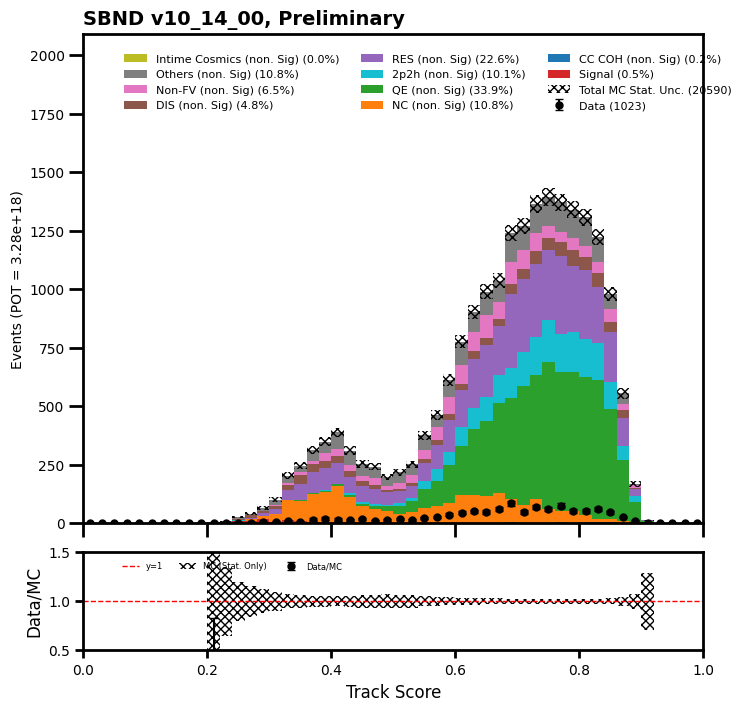

total data =  1016
[ 81 241 196 169 114  53  55  37  26  19  11   4   5   0   1   1   0   2
   0   0   0   1   0   0   0]
[1.085e+03 4.892e+03 4.777e+03 3.360e+03 2.209e+03 1.446e+03 1.009e+03
 6.290e+02 4.150e+02 3.020e+02 1.890e+02 6.400e+01 3.600e+01 2.500e+01
 1.600e+01 1.600e+01 9.000e+00 5.000e+00 6.000e+00 4.000e+00 1.200e+01
 5.000e+00 8.000e+00 6.000e+00 6.000e+00]
data ratio  [0.07465438 0.0492641  0.04102994 0.05029762 0.05160706 0.03665284
 0.05450942 0.05882353 0.0626506  0.06291391 0.05820106 0.0625
 0.13888889 0.         0.0625     0.0625     0.         0.4
 0.         0.         0.         0.2        0.         0.
 0.        ]
mode sums =  [90.0, 33.0, 2211.0, 6982.0, 2078.0, 4643.0, 989.0, 1331.0, 2174.0, 0.0]
fractions =  [0.43836150211874725, 0.16073255077687398, 10.769080902050558, 34.00711119770104, 10.121280015586187, 22.614582825970484, 4.8171058399493445, 6.482879548000585, 10.588865617846183, 0.0]
total sums =  20531.0
['Signal', 'CC COH (non. Sig)', 'NC (non. 

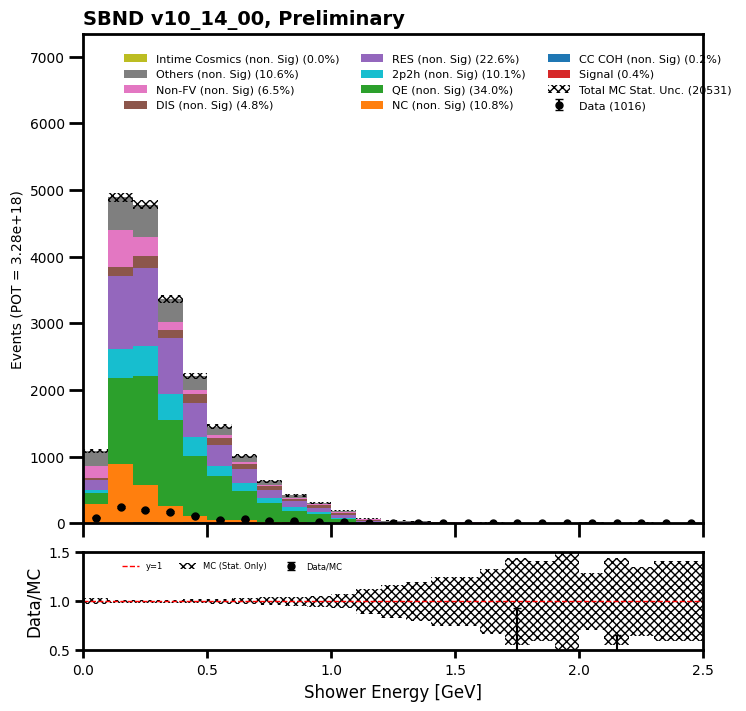

total data =  988
[ 8 28 44 48 52 48 50 56 46 43 37 34 32 46 28 46 32 32 25 28 20 21 22 15
 16 10 12 12 15 11  6 11 10 12  3  6  7  6  4  6]
[  51.  509.  748.  870.  958. 1020. 1080. 1028. 1026. 1005. 1018.  872.
  803.  788.  714.  697.  620.  563.  506.  484.  480.  406.  380.  356.
  310.  300.  266.  265.  223.  219.  194.  164.  152.  149.  149.  121.
  100.  107.  105.   78.]
data ratio  [0.15686275 0.05500982 0.05882353 0.05517241 0.05427975 0.04705882
 0.0462963  0.05447471 0.04483431 0.04278607 0.03634578 0.03899083
 0.03985056 0.05837563 0.03921569 0.06599713 0.0516129  0.05683837
 0.04940711 0.05785124 0.04166667 0.05172414 0.05789474 0.04213483
 0.0516129  0.03333333 0.04511278 0.04528302 0.06726457 0.05022831
 0.03092784 0.06707317 0.06578947 0.08053691 0.02013423 0.04958678
 0.07       0.05607477 0.03809524 0.07692308]
mode sums =  [89.0, 31.0, 2173.0, 6758.0, 2006.0, 4506.0, 895.0, 1279.0, 2147.0, 0.0]
fractions =  [0.4475960571313619, 0.15590424461878896, 10.9283846308

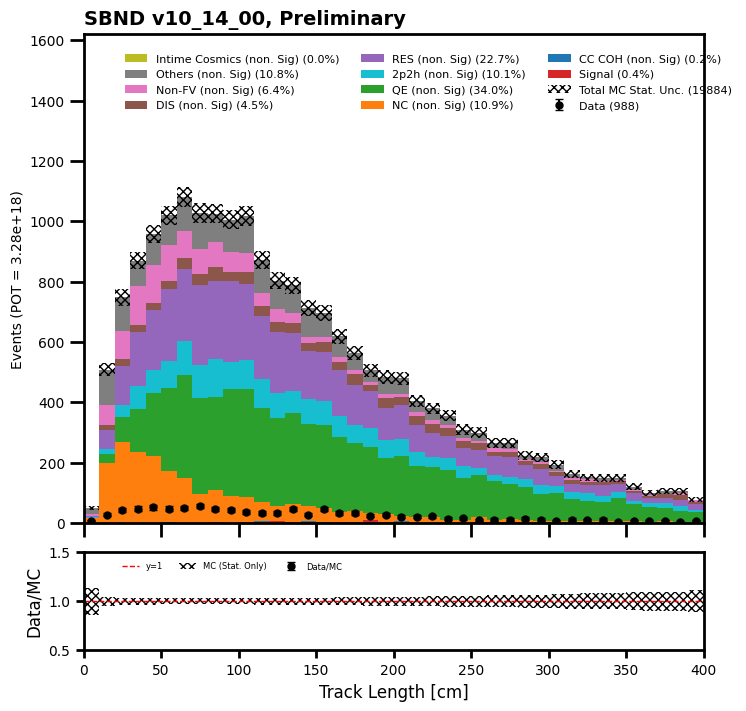

total data =  975
[544 256  85  26  14   6   6   4   5   3   3   0   0   2   2   1   0   0
   2   0   0   0   2   1   2   1   0   1   0   0   2   0   0   0   0   3
   0   1   2   1]
[10424.  5011.  1706.   619.   324.   218.   149.   132.    81.    87.
    56.    51.    32.    37.    39.    33.    41.    38.    30.    35.
    33.    32.    39.    38.    27.    23.    20.    14.    24.    21.
    25.    24.    16.    21.    17.    18.    15.    16.    17.    19.]
data ratio  [0.05218726 0.05108761 0.04982415 0.04200323 0.04320988 0.02752294
 0.04026846 0.03030303 0.0617284  0.03448276 0.05357143 0.
 0.         0.05405405 0.05128205 0.03030303 0.         0.
 0.06666667 0.         0.         0.         0.05128205 0.02631579
 0.07407407 0.04347826 0.         0.07142857 0.         0.
 0.08       0.         0.         0.         0.         0.16666667
 0.         0.0625     0.11764706 0.05263158]
mode sums =  [85.0, 31.0, 1966.0, 6902.0, 2058.0, 4408.0, 909.0, 1219.0, 2024.0, 0.0]
fractions =

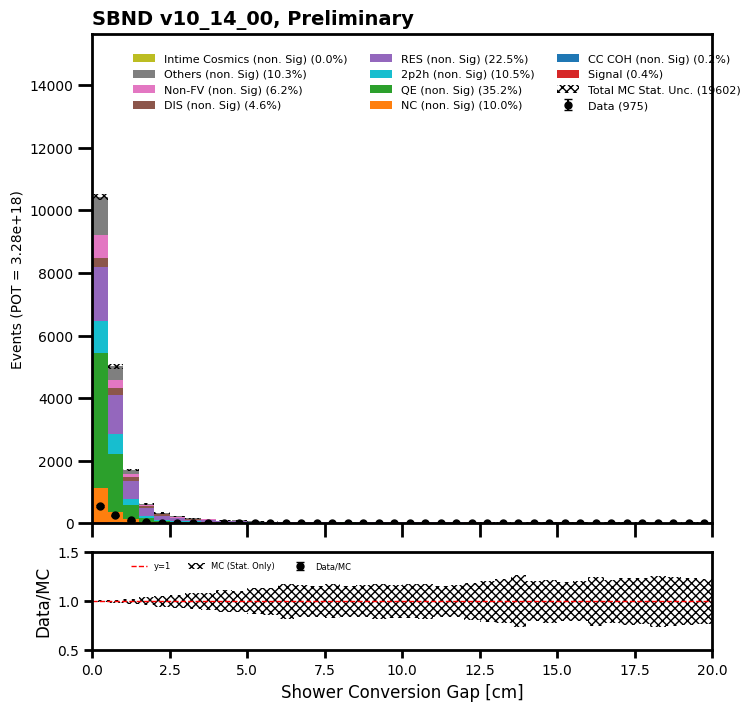

total data =  985
[  4  14  89 411 121  45  40  56  45  40  26  19  12   7   2   6   4   4
   3   3   2   1   5   2   1   2   4   4   1   2   3   3   1   0   1   0
   0   0   1   1]
[  62.  148. 1689. 8721. 1964. 1043.  791.  868.  929.  800.  609.  403.
  231.  202.  123.   94.   85.   63.   77.   64.   50.   67.   54.   64.
   72.   56.   51.   48.   44.   36.   40.   40.   27.   25.   14.   25.
   17.   15.   18.   22.]
data ratio  [0.06451613 0.09459459 0.0526939  0.04712762 0.06160896 0.04314477
 0.0505689  0.06451613 0.04843918 0.05       0.04269294 0.0471464
 0.05194805 0.03465347 0.01626016 0.06382979 0.04705882 0.06349206
 0.03896104 0.046875   0.04       0.01492537 0.09259259 0.03125
 0.01388889 0.03571429 0.07843137 0.08333333 0.02272727 0.05555556
 0.075      0.075      0.03703704 0.         0.07142857 0.
 0.         0.         0.05555556 0.04545455]
mode sums =  [89.0, 33.0, 2134.0, 6822.0, 1976.0, 4374.0, 915.0, 1291.0, 2117.0, 0.0]
fractions =  [0.4506100956913574, 0.167

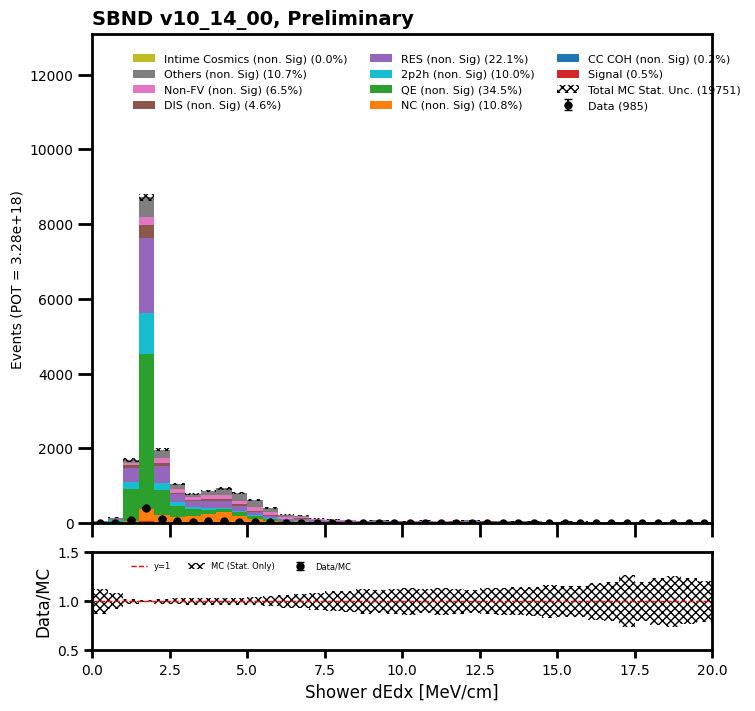

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1021
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0 779 133  43  20  18   9   3   6   3   1   1   3   0   0   0   0
   0   1   1   0]
[0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 1.5208e+04 3.1110e+03 8.9000e+02 4.8600e+02
 2.7600e+02 1.8000e+02 1.4100e+02 8.1000e+01 5.9000e+01 4.7000e+01
 2.8000e+01 1.7000e+01 1.8000e+01 7.0000e+00 7.0000e+00 7.0000e+00
 8.0000e+00 5.0000e+00 4.0000e+00 3.0000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.05122304 0.04275153 0.04831461 0.04115226
 0.06521739 0.05       0.0212766  0.07407407 0.05084746 0.0212766
 0.03571429 0.17647059 

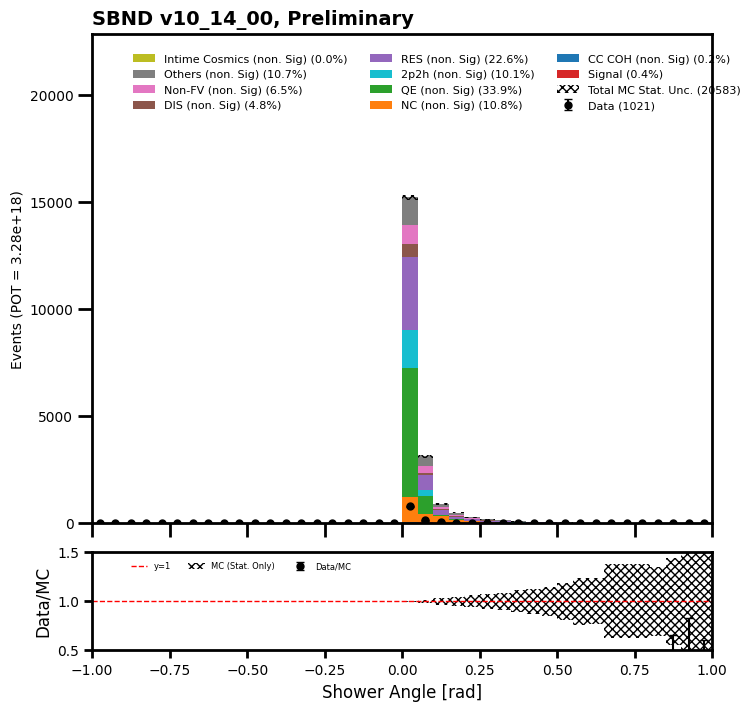

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  957
[ 0  1  4  0  9  6  4  9  7 10  8 11 13 11 15 16 12 12 20 13 12 12  8  7
 10 10 15 14 11 10 17 11 16 17  5 10 10 22  8 12  8 13 10 10 13  7 10 10
  5 14  5  9  5  7  6  5  9  8 14 11  6  5 13  7  5  3  9 12  7  5 10 11
  7  5  8  1  8  8  2 12 10  3  5  7  4  1  9  1  2  6  8  4  2  6  1  9
  2  4  1  7  7  7  1  1  5  2  2  3  3  3  4  1  2  1  1  3  5  1  3  3
  1  3  3  4  1  4  2  2  2  3  1  2  4  2  0  2  2  1  4  2  3  0  4  1
  1  2  6  1  3  0]
[  0.   0.   8.  24.  59.  99. 105. 152. 172. 200. 187. 186. 199. 247.
 204. 247. 235. 213. 259. 238. 252. 243. 259. 254. 250. 284. 262. 270.
 276. 265. 268. 258. 284. 275. 257. 248. 233. 255. 268. 229. 232. 222.
 251. 261. 258. 242. 219. 229. 235. 207. 209. 191. 158. 184. 179. 173.
 179. 175. 171. 153. 163. 155. 170. 140. 157. 143. 140. 148. 135. 147.
 150. 107. 136. 120. 113. 117. 117. 104. 110. 119. 108. 107.  83. 103.
 105. 110.  99. 100.  95.  85. 102.  89.  88.  91.  87.  80.  83.  72.
  83.  72.  65.  81.  77.  

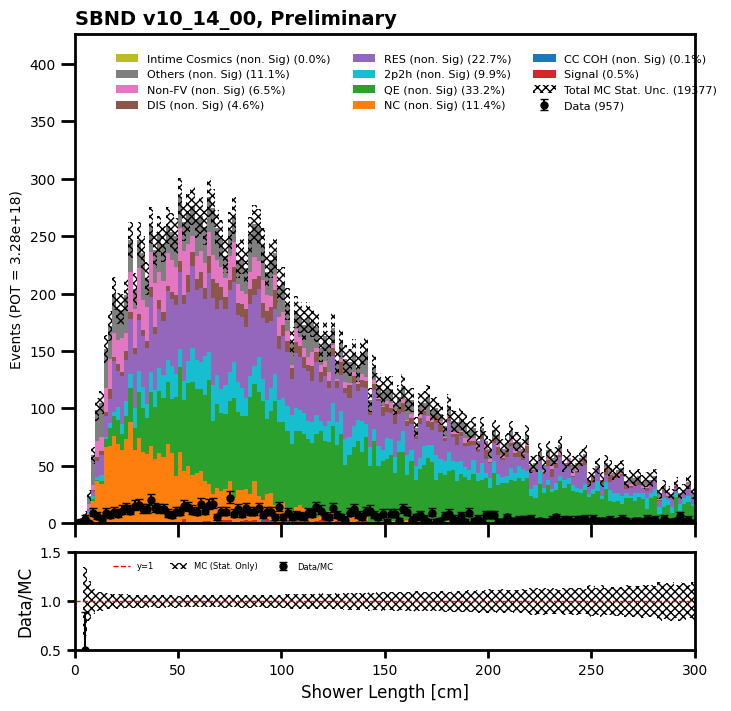

In [117]:
#nuscore

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].slc.nu_score > 0.5)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.nu_score > 0.5)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.nu_score > 0.5)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

In [118]:
purity = 66.664306640625/14759.71100616455
efficiency = 66.664306640625/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.45 % and efficiency =  83.78 %


In [119]:
mc_bnb_cosmic_dfs["evt"].track_counter.value_counts()

track_counter
2     30674
3     20456
1     14001
4      9737
5      2984
0      2415
6      1016
7       409
8       112
10       24
9        23
Name: count, dtype: int64

In [120]:
mc_bnb_cosmic_dfs["evt"].shower_counter.value_counts()

shower_counter
1    33986
2    23637
3    13926
4     6353
5     2626
6      811
7      322
8      150
9       40
Name: count, dtype: int64

In [121]:
mc_bnb_cosmic_dfs["evt"].pfp.trackScore

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
58        3      0               0                          0.865565
                                 1                          0.586195
                                 2                         -5.000000
          10     2               0                          0.650013
                                 1                          0.419478
                                                              ...   
193       462    1               11                         0.449429
                                 12                        -5.000000
          466    0               0                          0.760116
                                 1                          0.594343
                                 2                         -5.000000
Name: trackScore, Length: 81851, dtype: float32

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  744
[  0 744]
[    0 17289]
data ratio  [       nan 0.04303314]
mode sums =  [86.0, 31.0, 2012.0, 6574.0, 1968.0, 4401.0, 917.0, 1084.0, 216.0, 0.0]
fractions =  [0.49742610908670254, 0.17930476025218345, 11.637457342819134, 38.024177222511426, 11.382960263751517, 25.45549193128579, 5.303950488750072, 6.269882584302157, 1.2493492972410203, 0.0]
total sums =  17289.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


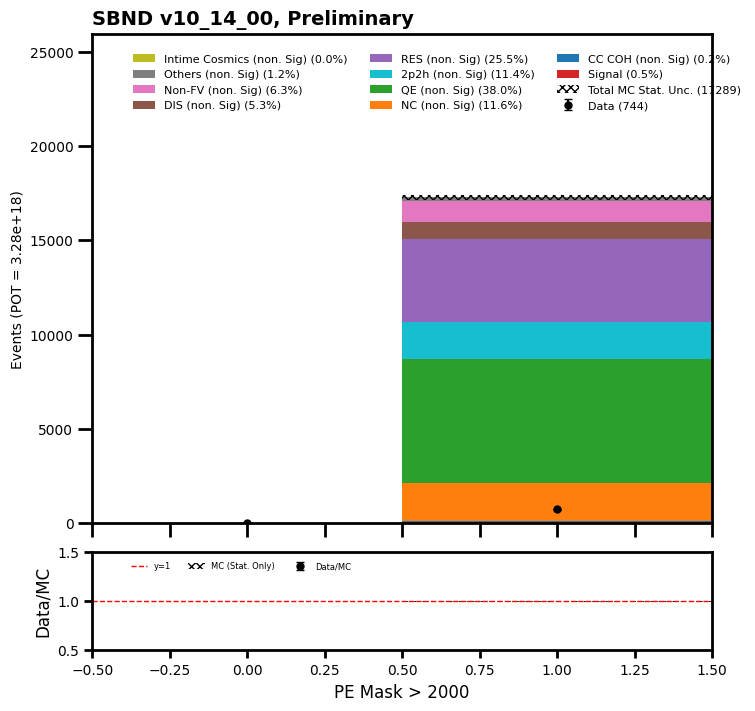

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  744
[  0   0   0   0   0   0   0   0   0   0 201 271 225  47   0   0   0   0
   0   0]
[   0.    0.    0.    0.    0.    0.    0.    0.    0.    0. 3768. 6161.
 6187. 1173.    0.    0.    0.    0.    0.    0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.05334395 0.04398637
 0.03636658 0.0400682         nan        nan        nan        nan
        nan        nan]
mode sums =  [86.0, 31.0, 2012.0, 6574.0, 1968.0, 4401.0, 917.0, 1084.0, 216.0, 0.0]
fractions =  [0.49742610908670254, 0.17930476025218345, 11.637457342819134, 38.024177222511426, 11.382960263751517, 25.45549193128579, 5.303950488750072, 6.269882584302157, 1.2493492972410203, 0.0]
total sums =  17289.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


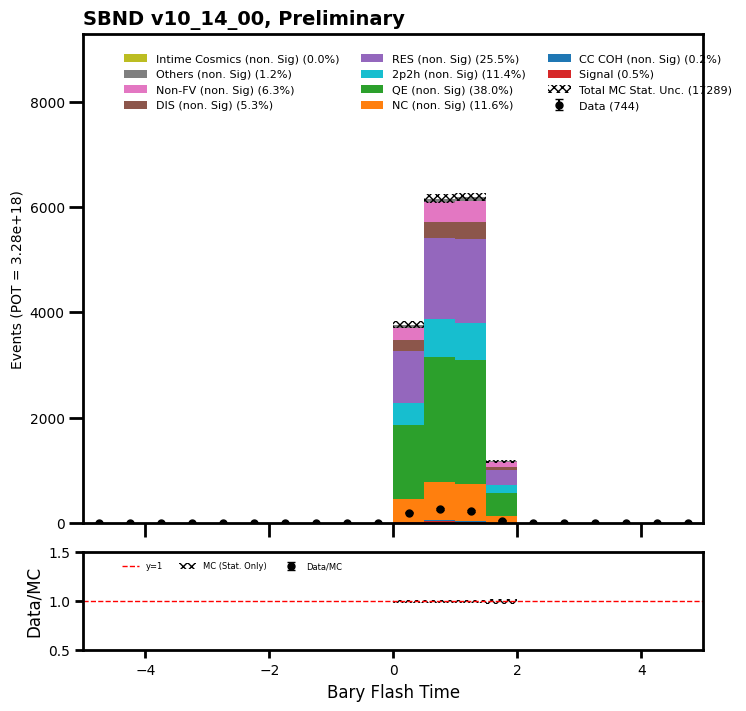

total data =  744
[744   0]
[-119    0]
data ratio  [-6.25210084         nan]


/tmp/ipykernel_3794/1280684055.py:94: RuntimeWarning: invalid value encountered in sqrt
  mc_stat_err = np.sqrt(total_mc_err2)
/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


ValueError: 'yerr' must not contain negative values

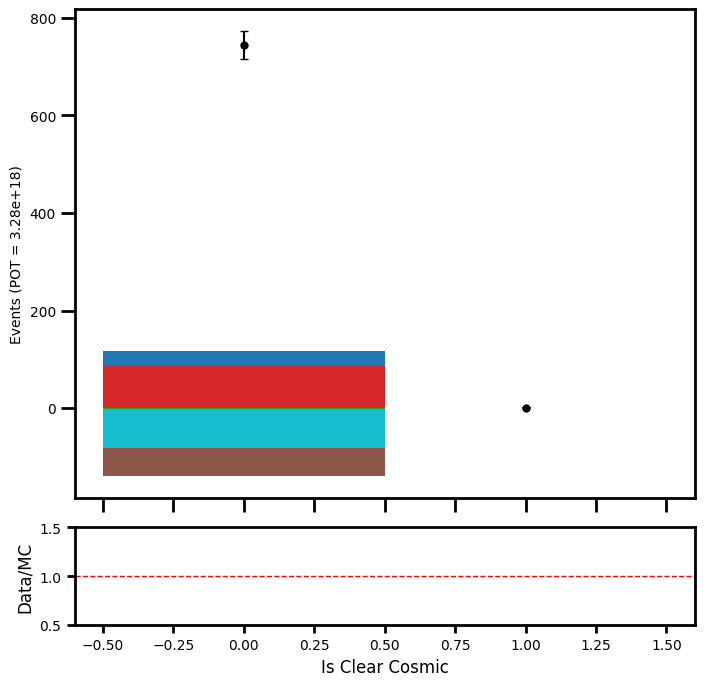

In [122]:
#bary score

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][ (mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.score > 0.02)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.barycenterFM.score > 0.02)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.barycenterFM.score > 0.02)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_bscore")

In [123]:
purity = 61.646568298339844/12392.832302093506
efficiency = 61.646568298339844/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  0.5 % and efficiency =  77.48 %


In [124]:
## Since evt DataFrame has more level in labels, we should make a mask for considering the difference
def get_evt_pe_mask(mask, df):
    sel_idx = mask[mask].index
    #pairs = df.index.droplevel([-2, -1])
    pairs = df.index
    mask2 = pairs.isin(sel_idx)
    return mask2

In [125]:
def make_lsc_filtered_df(df):
    lse_cut = df[(df.pfp.trackScore < 0.5) & (df.pfp.shw.maxplane_energy > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','shw','maxplane_energy','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    lse_mask = (lse_cut == True)

    mc_bnb_cosmic_evt_lse_mask = get_evt_pe_mask(lse_mask, df)
    df[('lead_shower_energy_p05', '', '', '', '', '')] = mc_bnb_cosmic_evt_lse_mask

    valid_slices2 = df.lead_shower_energy_p05[df.lead_shower_energy_p05 == True].index

    filtered_df2 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices2.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df2

In [126]:
filtered_df2 = make_lsc_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df2b = make_lsc_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df2c = make_lsc_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/4240300049.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_shower_energy_p05', '', '', '', '', '')] = mc_bnb_cosmic_evt_lse_mask


In [127]:
mc_bnb_cosmic_dfs["evt"] = filtered_df2
data_offbeam_light_dfs["evt"] = filtered_df2b
data_bnb_light_dfs["evt"] = filtered_df2c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  15
[ 0 15]
[  0 524]
data ratio  [       nan 0.02862595]
mode sums =  [70.0, 1.0, 102.0, 6.0, 2.0, 112.0, 205.0, 18.0, 8.0, 0.0]
fractions =  [13.358778625954198, 0.19083969465648853, 19.46564885496183, 1.1450381679389312, 0.38167938931297707, 21.374045801526716, 39.12213740458015, 3.435114503816794, 1.5267175572519083, 0.0]
total sums =  524.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


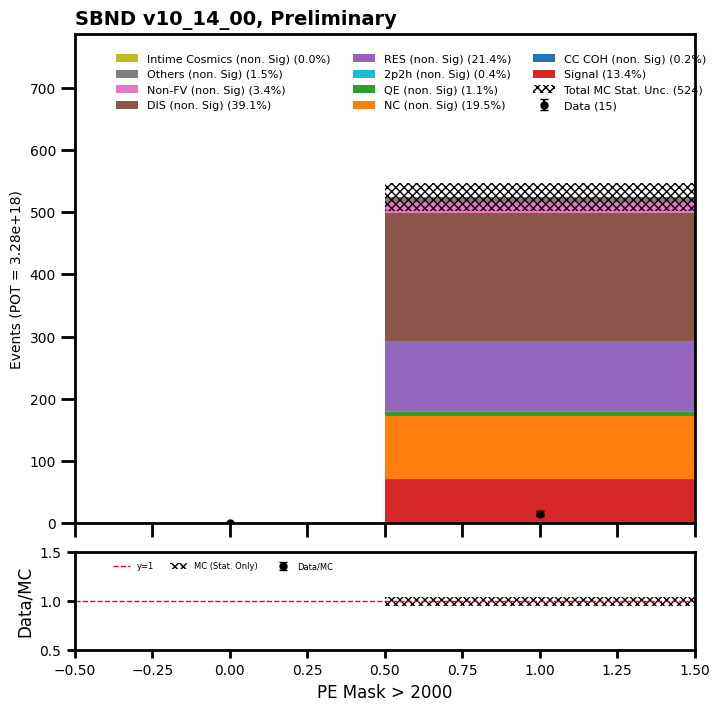

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 5 3 7 0 0 0 0 0 0 0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 106. 194. 186.  38.
   0.   0.   0.   0.   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.04716981 0.01546392
 0.03763441 0.                nan        nan        nan        nan
        nan        nan]
mode sums =  [70.0, 1.0, 102.0, 6.0, 2.0, 112.0, 205.0, 18.0, 8.0, 0.0]
fractions =  [13.358778625954198, 0.19083969465648853, 19.46564885496183, 1.1450381679389312, 0.38167938931297707, 21.374045801526716, 39.12213740458015, 3.435114503816794, 1.5267175572519083, 0.0]
total sums =  524.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


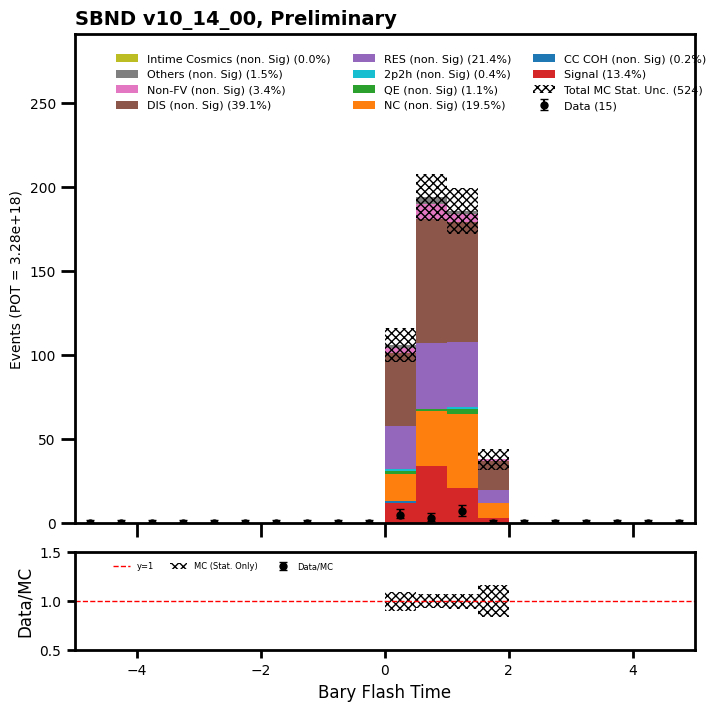

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[15  0]
[268   0]
data ratio  [0.05597015        nan]
mode sums =  [70.0, 1.0, 102.0, 6.0, 2.0, 112.0, -51.0, 18.0, 8.0, 0.0]
fractions =  [26.119402985074625, 0.3731343283582089, 38.059701492537314, 2.2388059701492535, 0.7462686567164178, 41.7910447761194, -19.029850746268657, 6.7164179104477615, 2.9850746268656714, 0.0]
total sums =  268.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


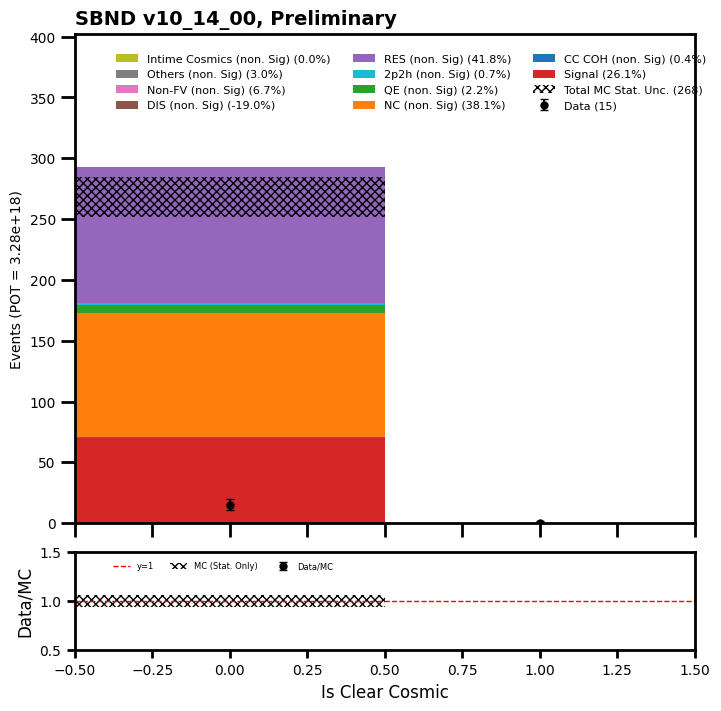

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 2 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  6.  6.  8.  8. 11. 14.  5.  7.  5. 11.  8.  6.  6.  9. 10.  8.  5. 11.
 12.  7. 10. 12. 10.  9.  4.  9.  9.  6. 11. 11.  9. 13.  7.  9. 10. 11.
 13. 11.  7. 10. 14.  2. 14.  5. 11.  7.  8.  6.  9.  6.  6. 11.  6. 11.
 11.  7.  8.  4.  2.  7.  7.  4.  3.  1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 0.16666667 0.         0.         0.         0.09090909 0.
 0.         0.         0.         0.         0.         0.
 0.16666667 0.22222222 0.         0.     

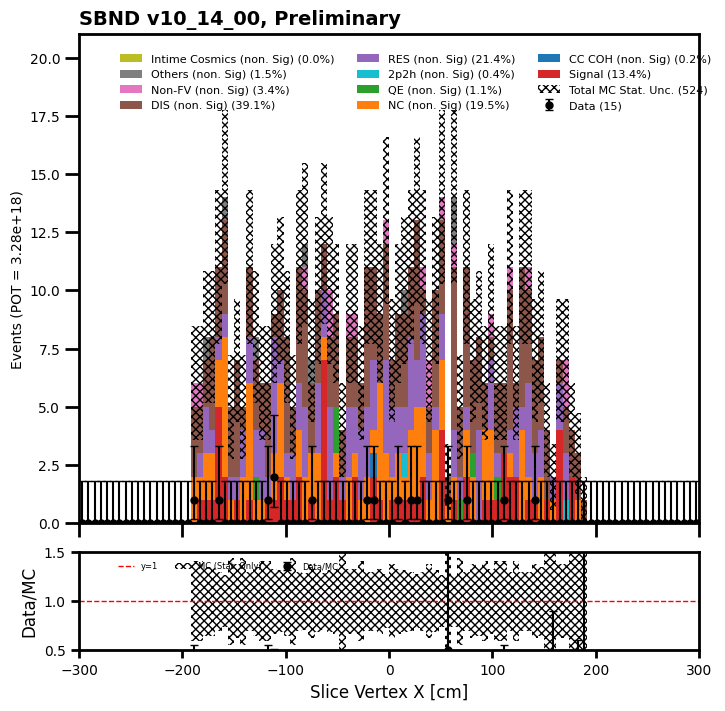

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 2 0 1 0 0 0 0 0 0
 0 1 0 2 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  6.  9.  2.  8. 10. 14.  2. 10. 10.  6.  6.  6.  9.  6.  7. 17. 11.
 11.  8. 12. 11.  8. 12. 19. 14.  5. 14. 14. 10.  9. 10. 13.  3.  8.  7.
 11. 10.  8. 13.  8. 15. 12.  6. 10.  8.  8.  8.  3.  5.  4.  4.  8.  5.
  7.  3. 10. 11.  3.  5.  4.  4.  2.  1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 1.         0.         0.11111111 0.         0.         0.
 0.         0.5        0.         0.         0.33333333 0.
 0.16666667 0.         0.         0.     

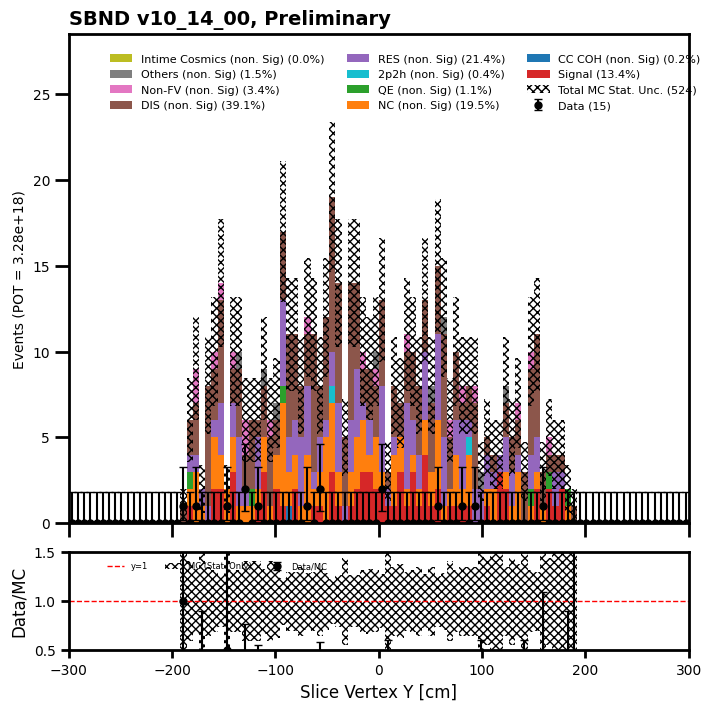

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 2 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 2
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7. 14. 12.
  4.  9. 11. 10.  5. 15. 10.  6.  7. 15.  6. 10. 16. 11.  9.  6. 10. 11.
 12. 10.  7.  7. 10. 10.  8.  8.  6. 11.  8.  9. 12.  7.  9.  6. 10. 10.
  3.  7. 11.  8.  2.  4.  9.  6.  6. 11. 11. 13.  8.  2.  4.  7.  3.  8.
  7.  5.  2.  4.  7.  8.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.         0.         0.
 0.         0.         0.09090909 0.         0.         0.
 0.1        0.         0.         0.         0.         0.
 0.         0.         0.11111111 0.         0.  

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


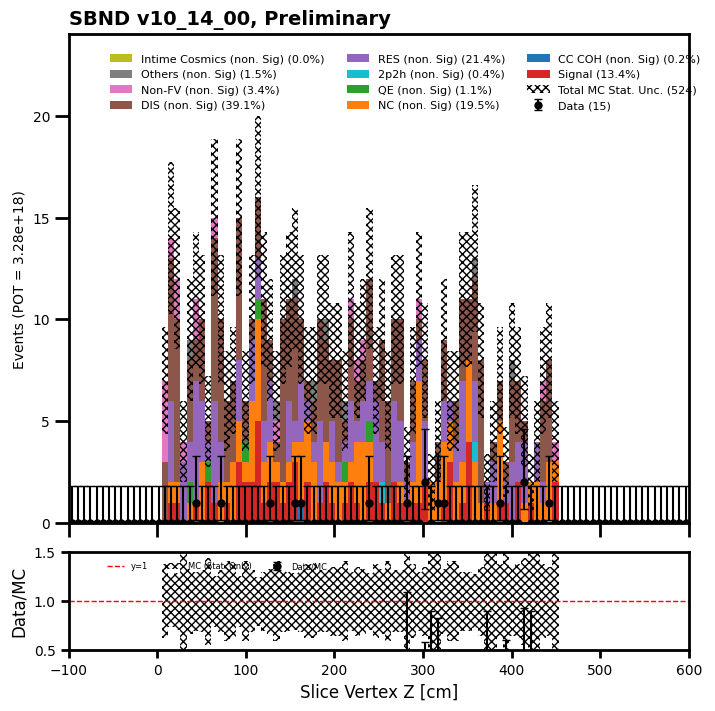

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 2 2 3 1 2
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0. 13. 13. 14. 31. 23. 49. 38. 64. 76. 59. 62.
 57. 20.  4.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan 0.07692308 0.         0.07142857 0.03225806 0.
 0.02040816 0.02631579 0.03125    0.02631579 0.05084746 0.01612903
 0.03508772 0.         0.         0.                nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [70.0, 1.0, 102.0, 6.0, 2.0, 112.0, 205.0, 18.0, 8.0, 0.0]
fractions =  [13.358778625954198, 0.1908

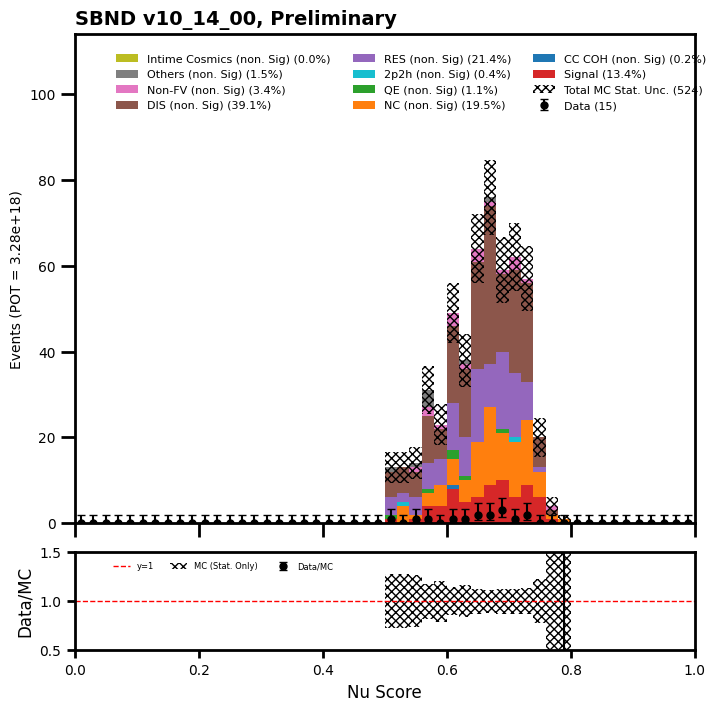

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  15
[0 3 3 2 1 0 2 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0]
[12. 64. 85. 85. 45. 33. 37. 21. 24. 14.  8.  9. 13.  9.  6.  5.  7.  7.
  6.  1.  1.  3.  5.  2.  2.  1.  2.  0.  3.  0.  1.  1.  0.  0.  1.  1.
  0.  1.  0.  0.]
data ratio  [0.         0.046875   0.03529412 0.02352941 0.02222222 0.
 0.05405405 0.         0.         0.         0.         0.11111111
 0.07692308 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.                nan 0.                nan
 1.         0.                nan        inf 0.         0.
        nan 0.                nan        nan]
mode sums =  [70.0, 1.0, 101.0, 6.0, 2.0, 111.0, 199.0, 17.0, 8.0, 0.0]
fractions =  [13.592233009708737, 0.1941747572815534, 19.611650485436893, 1.1650485436893203, 0.3883495145631068, 21.553398058252426, 38.640776699029125, 3.300970873786408, 1.5533980582524272, 0.0]
total sums =  515.0
['Signal', 'CC COH

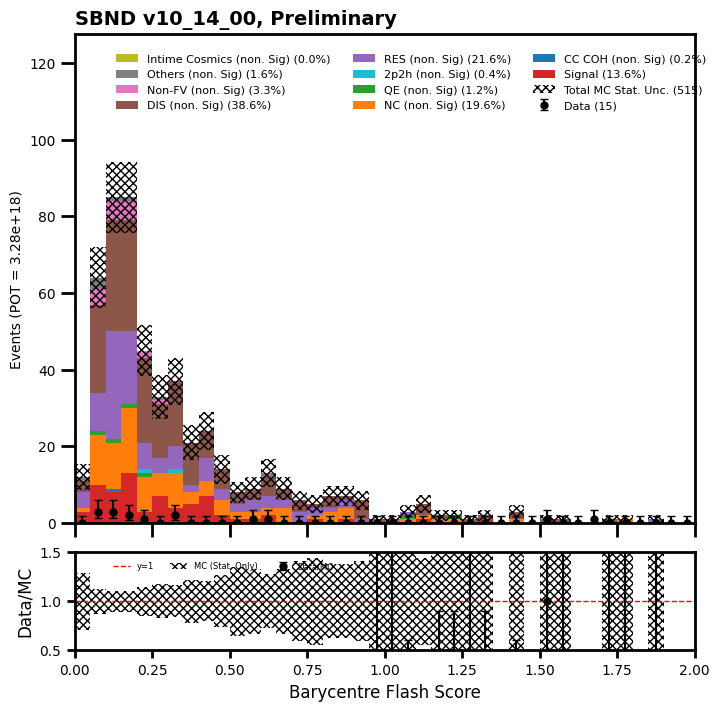

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 2 0 1 3 0 0 2 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 1 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.  5. 18. 29. 39. 37. 50. 58.
 47. 50. 29. 17. 20. 17.  9.  0.  0.  1.  0.  1.  0.  1.  0.  1.  2.  1.
 10.  5.  8. 11. 13. 16. 13.  9.  2.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.         0.
 0.05555556 0.         0.05128205 0.05405405 0.         0.01724138
 0.06382979 0.         0.         0.11764706 0.         0.
 0.11111111        nan        nan 0.                nan 0.
        nan 0.                nan 0.         0.         0.
 0.1        0.         0.         0.09090909 0.         0.
 0.07692308 0.         0.                nan        nan        nan
        nan        nan]
mode sums =  [70.0, 1.0, 102.0, 5.0, 2.0, 112.0, 205.0, 18.0, 8.0, 0.0]
fractions =  [13.38432122370937, 0.19120458891013384, 19.50286806883365,

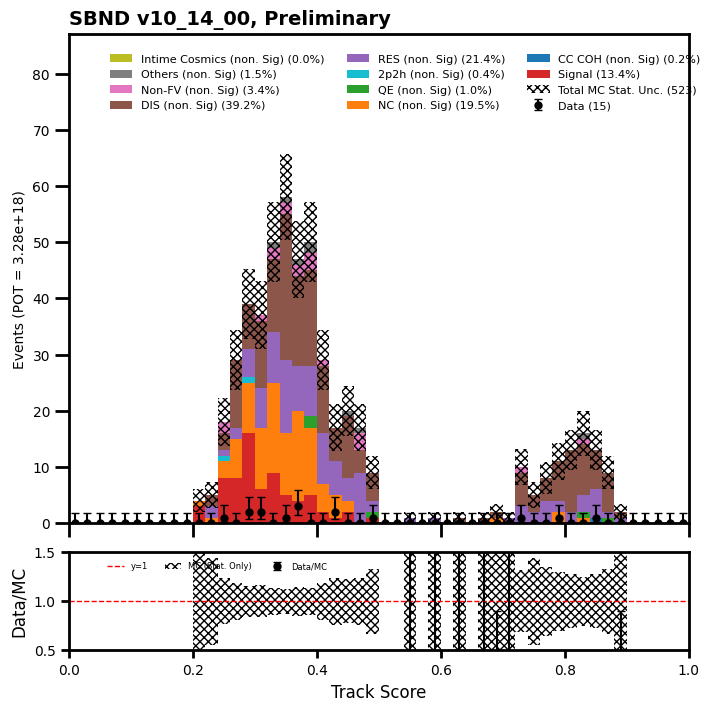

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 1 3 2 4 1 2 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
[  1.   0.   0.   8.  10. 117. 100.  52.  54.  33.  28.  23.  18.  13.
  11.  10.   8.   3.   2.   3.   9.   3.   4.   4.   3.]
data ratio  [0.                nan        nan 0.         0.         0.00854701
 0.03       0.03846154 0.07407407 0.03030303 0.07142857 0.
 0.05555556 0.         0.09090909 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.        ]
mode sums =  [68.0, 1.0, 100.0, 6.0, 2.0, 112.0, 203.0, 18.0, 7.0, 0.0]
fractions =  [13.152804642166343, 0.19342359767891684, 19.342359767891683, 1.160541586073501, 0.3868471953578337, 21.663442940038685, 39.26499032882012, 3.481624758220503, 1.3539651837524178, 0.0]
total sums =  517.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


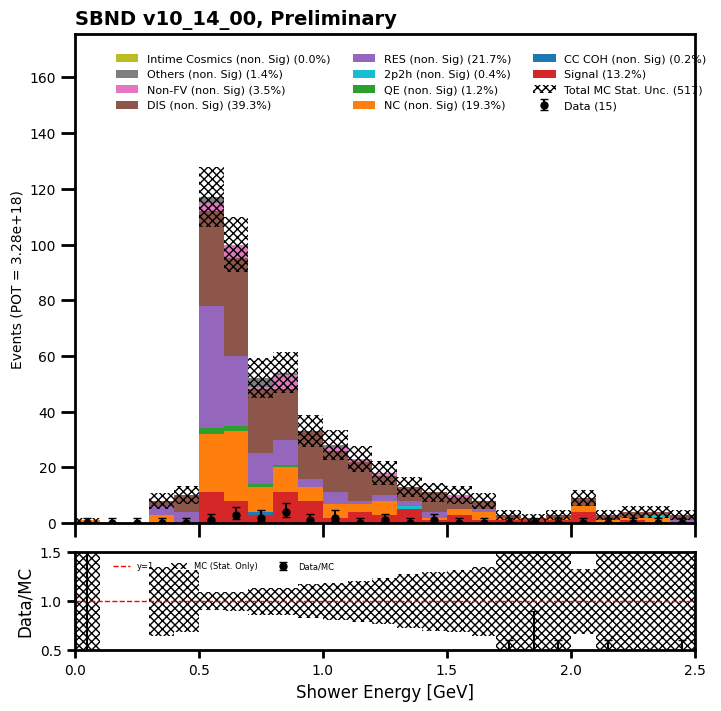

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  12
[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 2 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0
 1 1 0]
[ 0.  0.  0.  1.  0.  2.  6.  3.  8.  5.  8. 14. 15. 16. 18. 13. 23. 12.
 18. 13. 15. 18. 12. 11. 12. 15. 11. 16. 13. 11. 15. 16. 15. 13.  8. 10.
  5. 11.  5.  8.]
data ratio  [       nan        nan        nan 0.                nan 0.
 0.         0.         0.         0.         0.         0.
 0.         0.0625     0.         0.07692308 0.         0.08333333
 0.         0.07692308 0.13333333 0.         0.         0.
 0.         0.         0.09090909 0.         0.07692308 0.
 0.06666667 0.0625     0.         0.         0.         0.
 0.         0.09090909 0.2        0.        ]
mode sums =  [66.0, 1.0, 79.0, 6.0, 2.0, 92.0, 154.0, 9.0, 6.0, 0.0]
fractions =  [15.903614457831324, 0.24096385542168677, 19.03614457831325, 1.4457831325301205, 0.48192771084337355, 22.16867469879518, 37.10843373493976, 2.1686746987951806, 1.4457831325301205, 0.0]
total sums =  415.0
['Signal', 'CC COH (non. Sig)

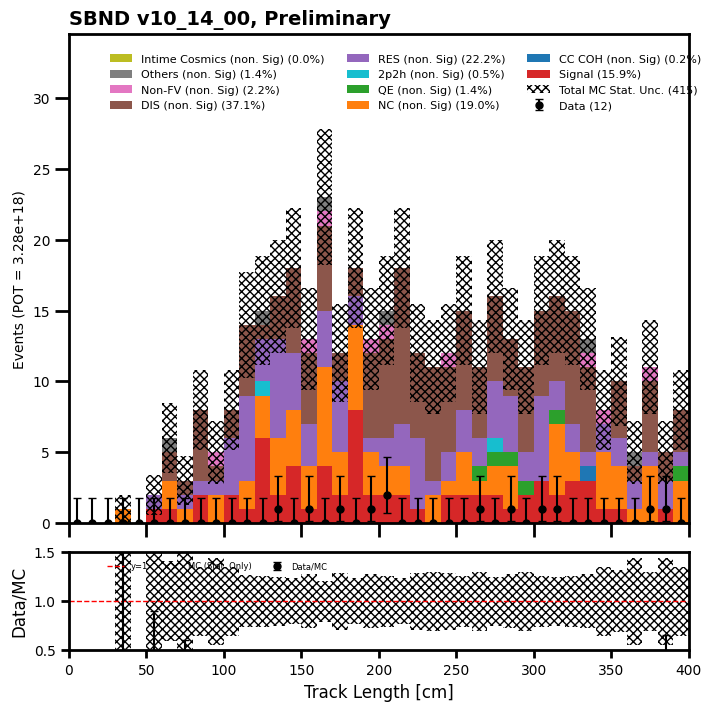

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[6 1 3 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[136.  77.  40.  29.  24.  16.  14.   8.   9.  10.   6.   7.   4.   6.
   4.   3.   3.   5.   4.   4.   4.   4.   2.   3.   2.   4.   1.   0.
   1.   2.   4.   4.   0.   3.   1.   2.   3.   2.   1.   3.]
data ratio  [0.04411765 0.01298701 0.075      0.         0.04166667 0.0625
 0.         0.125      0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.25       0.         0.         0.         0.         0.
 0.5        0.         0.                nan 0.         0.
 0.         0.                nan 0.         0.         0.
 0.         0.         0.         0.        ]
mode sums =  [66.0, 1.0, 94.0, 4.0, 2.0, 94.0, 174.0, 17.0, 3.0, 0.0]
fractions =  [14.505494505494507, 0.21978021978021978, 20.659340659340657, 0.8791208791208791, 0.43956043956043955, 20.659340659340657, 38.24175824175824, 3.7362637362637363, 0.6593406593406593, 0.0]
total sums

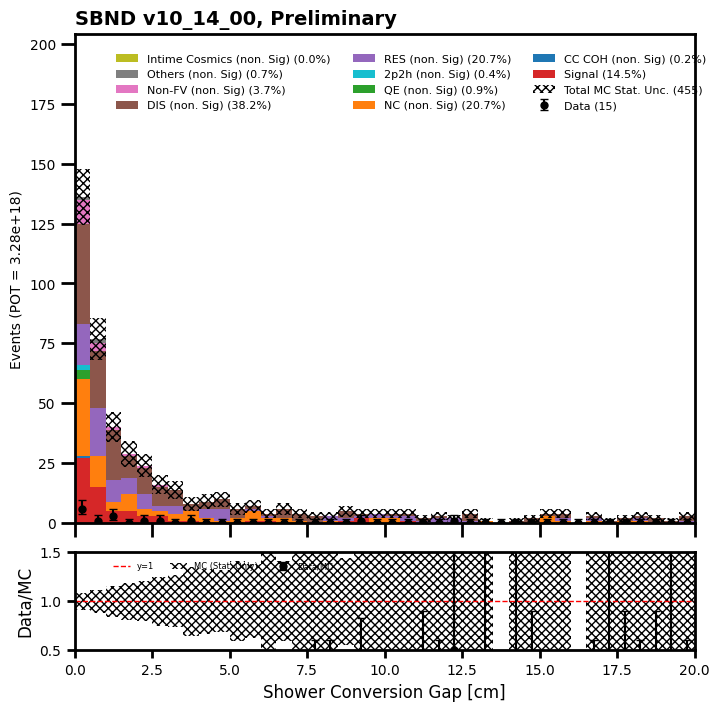

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  13
[0 0 0 3 0 0 1 1 0 4 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0]
[  2.   6.  13. 116.  39.  17.  20.  43.  52.  31.  24.  17.   4.  11.
   5.   7.   4.   5.   5.   3.   2.   4.   3.   5.   4.   1.   0.   2.
   1.   1.   2.   3.   1.   1.   0.   3.   1.   1.   2.   2.]
data ratio  [0.         0.         0.         0.02586207 0.         0.
 0.05       0.02325581 0.         0.12903226 0.         0.05882353
 0.25       0.         0.         0.         0.         0.
 0.         0.33333333 0.         0.         0.         0.
 0.         0.                nan 0.         0.         0.
 0.         0.33333333 0.         0.                nan 0.
 0.         0.         0.         0.        ]
mode sums =  [68.0, 1.0, 94.0, 5.0, 1.0, 98.0, 175.0, 16.0, 5.0, 0.0]
fractions =  [14.686825053995682, 0.21598272138228944, 20.302375809935207, 1.079913606911447, 0.21598272138228944, 21.166306695464364, 37.79697624190065, 3.455723542116631, 1.079913606911447, 0.0]
total sum

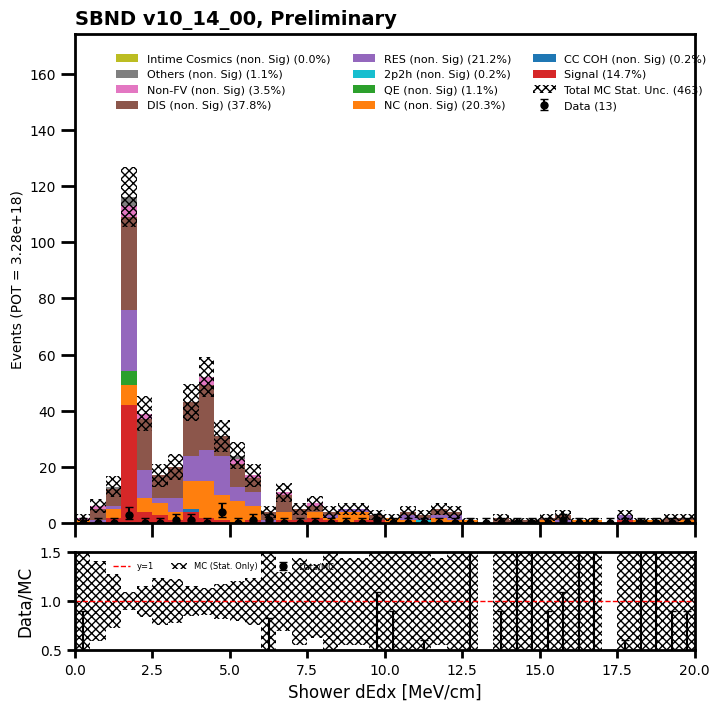

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 5 1 2 1 2 1 0 1 1 1 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. 98. 71. 92. 79. 50. 36. 29. 18. 19.  9.  2.  2.  5.  1.  0.  5.
  2.  1.  1.  1.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.05102041 0.01408451 0.02173913 0.01265823
 0.04       0.02777778 0.         0.05555556 0.05263158 0.11111111
 0.         0.         0.         0.                nan 0.
 0.         0.         0.         0.        ]
mode sums =  [70.0, 1.0, 102.0, 5.0, 2.0, 111.0, 205.0, 17.0, 8.0, 0.0]
fractions =  [13.43570057581574, 0.19193857965451055, 19.577735124760075, 0.9596928982725527, 0.3838771593090211, 21.30518234165067, 39.34740882917466, 3.262955854126679, 1.5355086372360844, 0.0]
total sums =  52

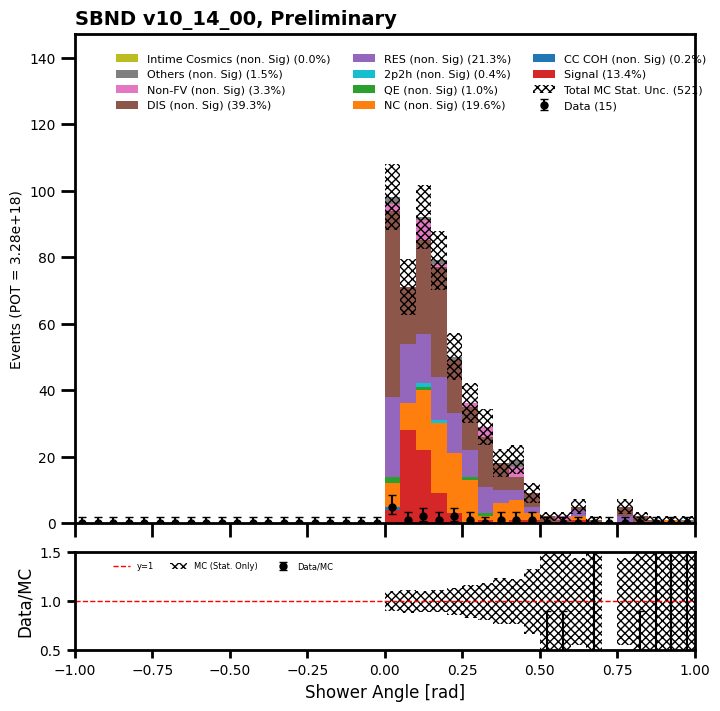

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  12
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  1.  1.  2.  0.
  3.  0.  2.  3.  3.  3.  6.  8.  9.  4.  6.  8. 11. 10.  9. 10. 11. 10.
 10.  6.  8. 12.  7. 12. 14. 15. 11. 10. 12.  9. 11. 10. 11. 12.  5.  7.
 10.  6.  5.  6. 10.  9.  6.  7.  4.  4.  8.  4.  6.  4.  5.  4.  2.  1.
  5.  0.  1.  2.  2.  1.  2.  0.  1.  1.  1.  2.  2.  2.  2.  3.  0.  0.
  1.  0.  1.  2.  1.  2.  1.  1.  2.  0.  0.  1.  1.  1.  0.  2.  0.  0.
  1.  1.  0.  1.  0.  0.  1.  2.  2.  0.  0.  1.  1.  0.  0.  3.  4.  0.
  1.  1.  2.  2.  0.  1.  1.  1.  1.  0.  1.  0.  1.  1.  1.  1.  0.  0.
  2.  0.  1.  0.  1.  1.]
data ratio  [       nan        nan        nan        nan        nan

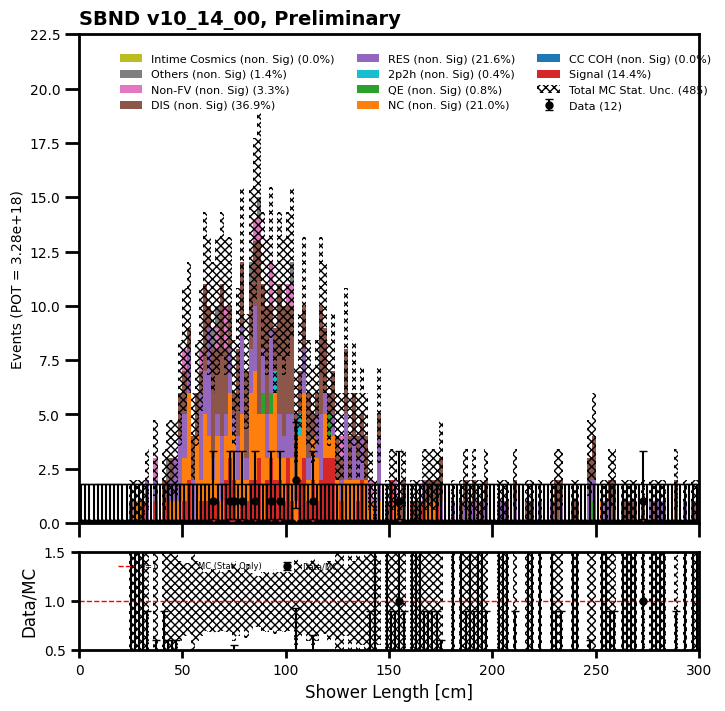

In [128]:
#reconstructed leading shower energy
# need 1.17 multiplier?

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

In [129]:
purity = 50.177452087402344/375.61407405138016
efficiency = 50.177452087402344/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  13.36 % and efficiency =  63.06 %


## Electron Selection + Muon Rejection

In [130]:
def make_ltlen_filtered_df(df):
    #say what I want to look at (pfps with trackScore < 0,5) and what I want to order them by (pfp.trk.len) then pick out the longest one (.nth(-1))
    ltlen_cut = df[(df.pfp.trackScore > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','trk','len','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    # of those longest pfps, I only want to accept those which are shorter than 200cm or nan
    ltlen_cut = ltlen_cut[(ltlen_cut.pfp.trk.len < 200) | (np.isnan(ltlen_cut.pfp.trk.len))]
    #make a mask for the slices with the pfps I want
    ltlen_mask = (ltlen_cut == True)

    #apply my mask
    mc_bnb_cosmic_evt_ltlen_mask = get_evt_pe_mask(ltlen_mask, df)
    #add a variable from my mask
    df[('lead_track_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_ltlen_mask

    #get all the valid slices which have my longest pfp less than 200cm
    valid_slices3 = df.lead_track_len_m200[df.lead_track_len_m200 == True].index

    #filter my df so it only has my valid slices
    filtered_df3 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices3.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df3

In [131]:
#use my valid slices filter-er
filtered_df3 = make_ltlen_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df3b = make_ltlen_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df3c = make_ltlen_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/1819608944.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_track_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_ltlen_mask
/tmp/ipykernel_3794/1819608944.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[('lead_track_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_ltlen_mask
/tmp/ipykernel_3794/1819608944.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [132]:
#make my filtered dfs my regular dfs
mc_bnb_cosmic_dfs["evt"] = filtered_df3
data_offbeam_light_dfs["evt"] = filtered_df3b
data_bnb_light_dfs["evt"] = filtered_df3c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  9
[0 9]
[  0 321]
data ratio  [       nan 0.02803738]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 72.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.38006230529595, 0.0, 19.937694704049843, 0.6230529595015576, 0.0, 22.429906542056074, 36.13707165109034, 1.8691588785046727, 0.6230529595015576, 0.0]
total sums =  321.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


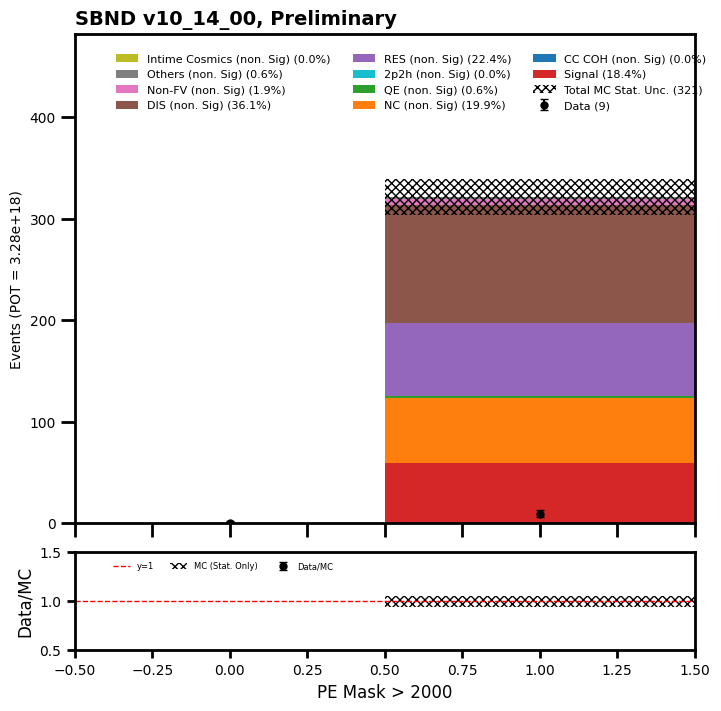

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 2 2 5 0 0 0 0 0 0 0]
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  58. 127. 114.  22.
   0.   0.   0.   0.   0.   0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.03448276 0.01574803
 0.04385965 0.                nan        nan        nan        nan
        nan        nan]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 72.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.38006230529595, 0.0, 19.937694704049843, 0.6230529595015576, 0.0, 22.429906542056074, 36.13707165109034, 1.8691588785046727, 0.6230529595015576, 0.0]
total sums =  321.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


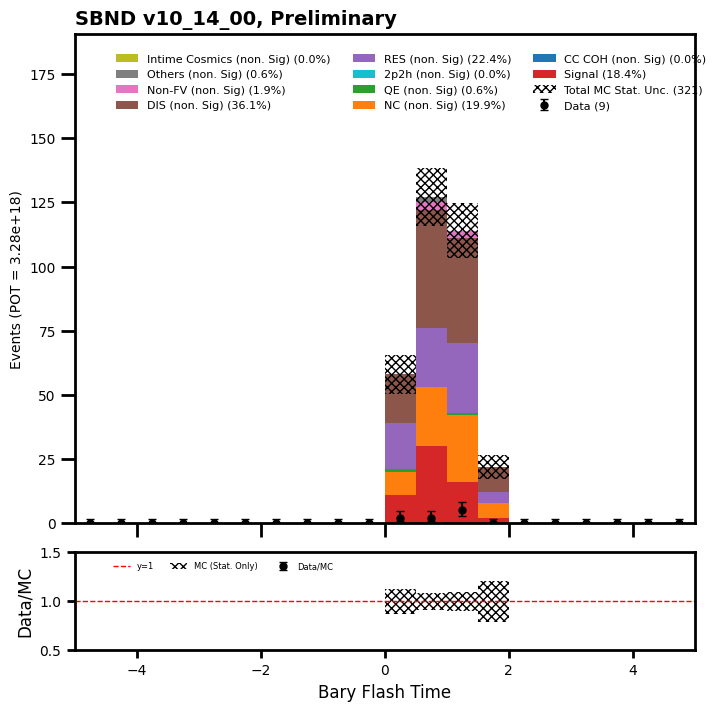

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[9 0]
[321   0]
data ratio  [0.02803738        nan]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 72.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.38006230529595, 0.0, 19.937694704049843, 0.6230529595015576, 0.0, 22.429906542056074, 36.13707165109034, 1.8691588785046727, 0.6230529595015576, 0.0]
total sums =  321.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


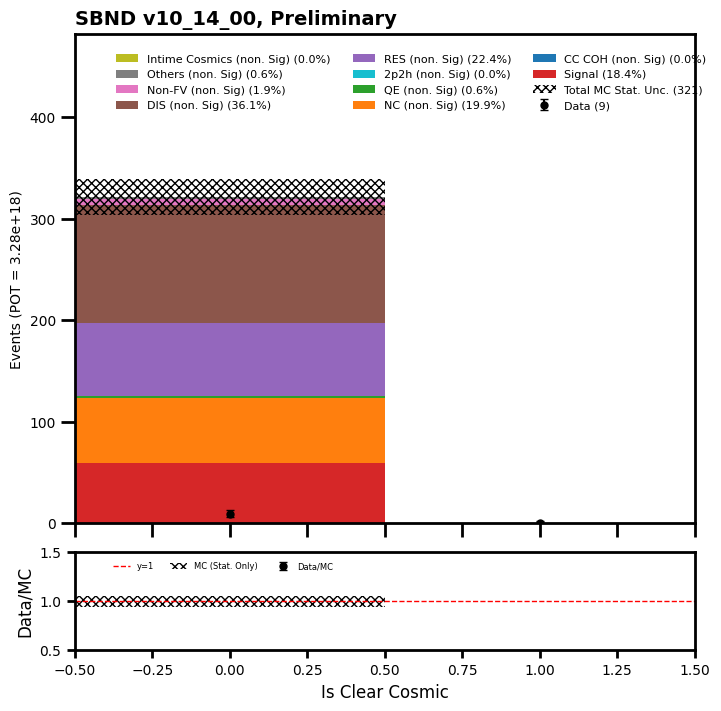

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 4. 7. 7. 8. 9.
 4. 2. 4. 4. 4. 4. 1. 6. 6. 6. 1. 9. 8. 4. 6. 8. 5. 6. 2. 4. 8. 4. 6. 4.
 5. 8. 5. 5. 7. 6. 8. 7. 2. 7. 7. 1. 6. 2. 9. 4. 4. 5. 5. 3. 4. 6. 5. 8.
 5. 6. 5. 2. 2. 5. 6. 4. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.16666667 0.         0.         0.         0.
 0.         0.25       0.         0.         0.         0.
 0.         0.         0.

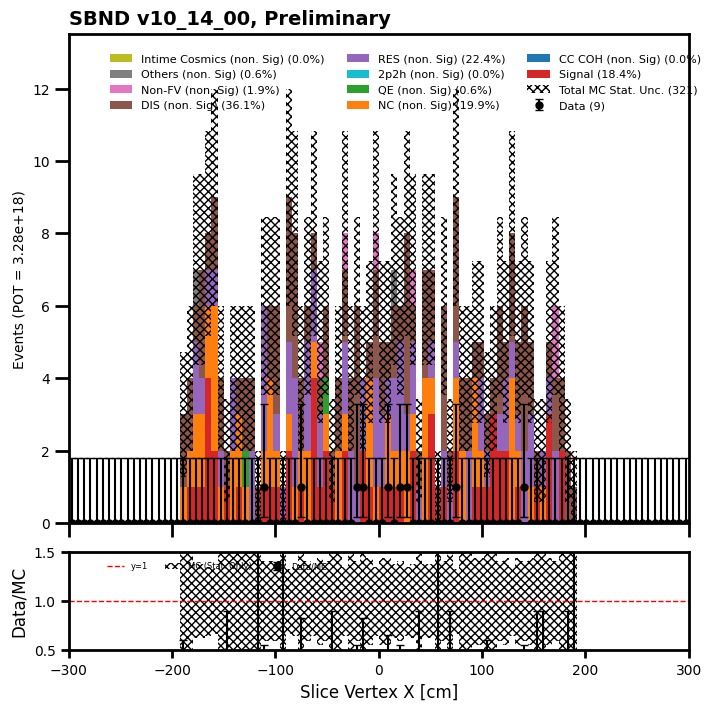

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  4.  5.  1.  4.  7.  9.  1.  5.  6.  5.  3.  1.  8.  4.  5. 10.  6.
  6.  6.  9.  7.  6.  6. 12.  9.  2. 10.  9.  9.  7.  6.  9.  3.  3.  3.
  6.  4.  4.  7.  6. 11.  6.  6.  5.  5.  5.  2.  2.  4.  2.  4.  5.  2.
  4.  1.  5.  7.  2.  2.  3.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.2        0.
 0.         0.         0.         0.      

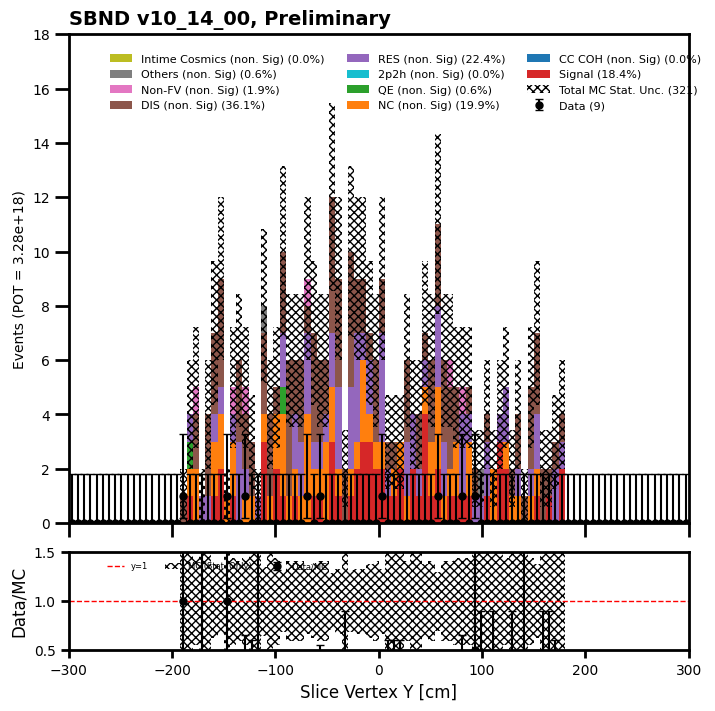

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 2
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  6.  5.
  2.  5.  5.  7.  2.  4.  6.  2.  4. 10.  4.  4. 11.  7.  6.  4.  6. 11.
  5.  5.  6.  5.  5.  4.  1.  5.  4.  7.  4.  5.  8.  3.  4.  4.  7.  7.
  2.  3.  7.  3.  1.  3.  5.  5.  5.  9. 10. 11.  7.  1.  3.  5.  2.  8.
  7.  4.  2.  1.  6.  6.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


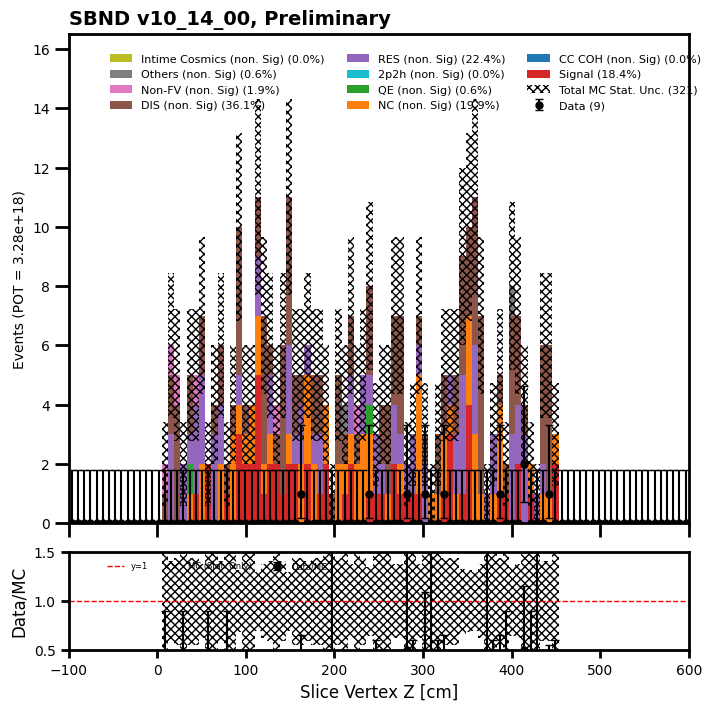

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 2 1 1 2
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  7. 11. 15. 12. 29. 22. 36. 44. 36. 44.
 44. 15.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan 0.25       0.         0.09090909 0.         0.
 0.03448276 0.         0.         0.04545455 0.02777778 0.02272727
 0.04545455 0.         0.                nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 72.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.38006230529595, 0.0, 19.937

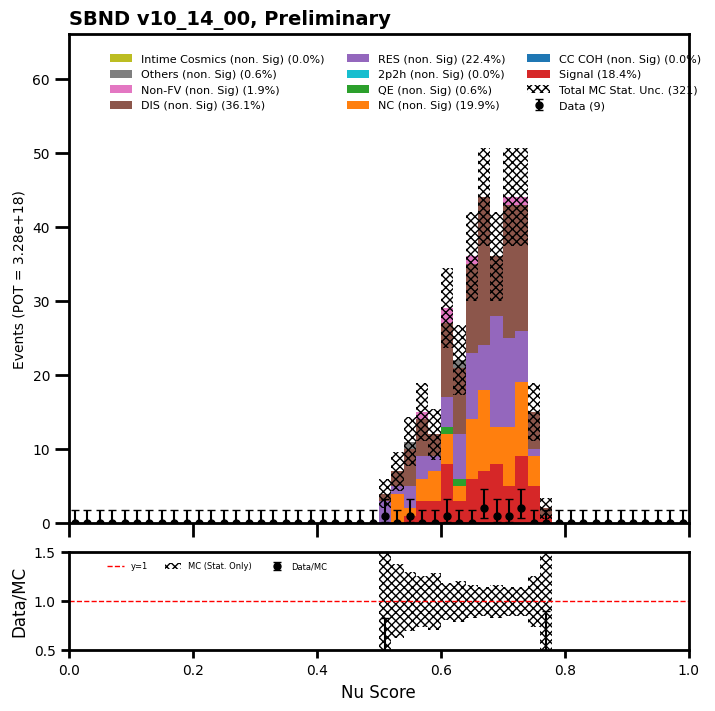

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  9
[0 2 3 0 1 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0]
[ 9. 37. 61. 54. 26. 21. 20. 15. 18.  7.  6.  3.  6.  3.  4.  3.  3.  5.
  4.  1.  1.  2.  4.  1.  1.  1.  0.  0.  2.  0.  0.  0.  0.  0.  1.  0.
  0.  0.  0.  0.]
data ratio  [0.         0.05405405 0.04918033 0.         0.03846154 0.
 0.1        0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.                nan        nan 0.                nan
        inf        nan        nan        nan 0.                nan
        nan        nan        nan        nan]
mode sums =  [59.0, 0.0, 63.0, 2.0, 0.0, 71.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.495297805642632, 0.0, 19.74921630094044, 0.6269592476489028, 0.0, 22.25705329153605, 36.36363636363637, 1.8808777429467085, 0.6269592476489028, 0.0]
total sums =  319.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (

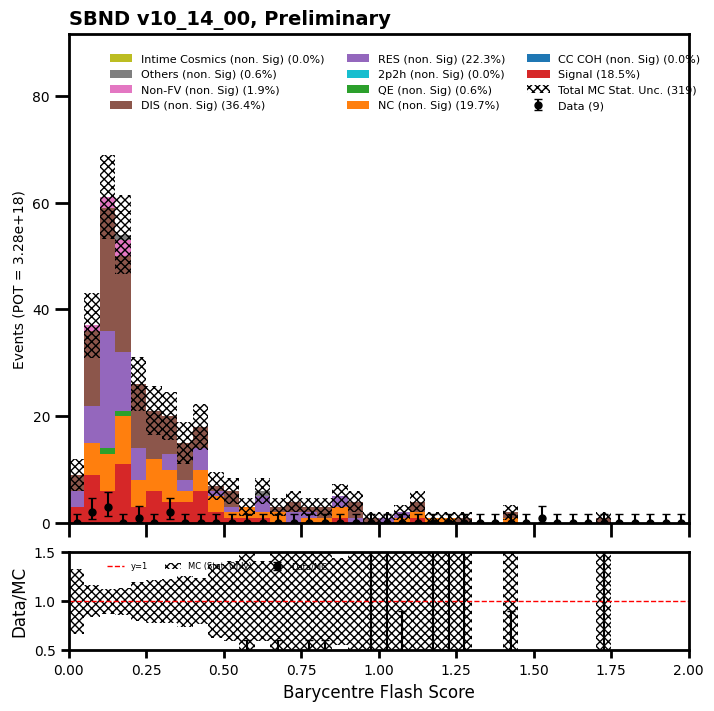

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 2 0 1 1 0 0 2 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  3. 12. 17. 25. 28. 37. 49.
 31. 34. 22. 13. 13. 11.  7.  0.  0.  1.  0.  1.  0.  1.  0.  0.  1.  0.
  4.  0.  1.  2.  3.  2.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.         0.
 0.08333333 0.         0.04       0.07142857 0.         0.02040816
 0.03225806 0.         0.         0.15384615 0.         0.
 0.14285714        nan        nan 0.                nan 0.
        nan 0.                nan        nan 0.                nan
 0.                nan 0.         0.         0.         0.
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 72.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.38006230529595, 0.0, 19.937694704049843, 0.62305295

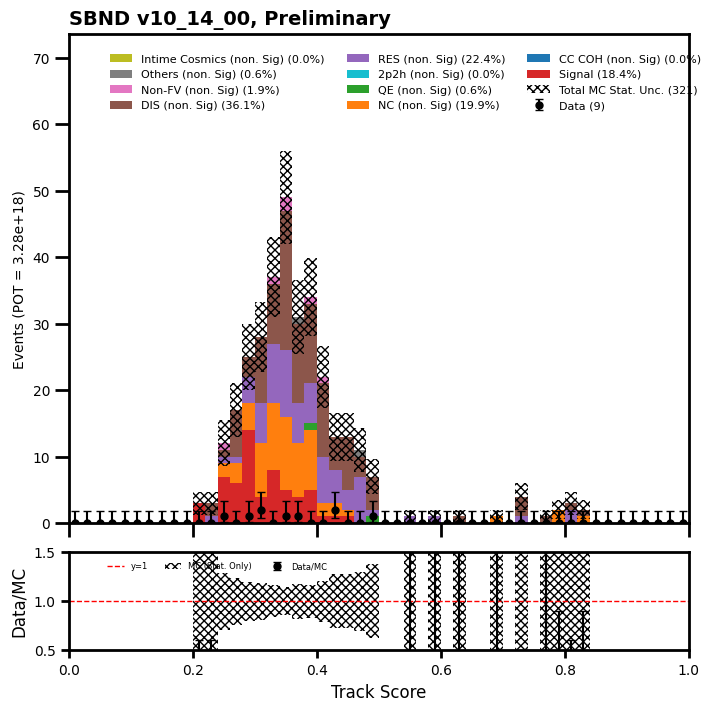

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 2 2 2 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
[ 1.  0.  0.  8.  3. 87. 60. 28. 30. 23. 13.  9.  6.  6.  7.  8.  5.  1.
  2.  2.  9.  1.  4.  1.  1.]
data ratio  [0.                nan        nan 0.         0.         0.
 0.03333333 0.07142857 0.06666667 0.04347826 0.         0.
 0.16666667 0.         0.14285714 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.        ]
mode sums =  [57.0, 0.0, 62.0, 2.0, 0.0, 72.0, 114.0, 6.0, 2.0, 0.0]
fractions =  [18.095238095238095, 0.0, 19.682539682539684, 0.6349206349206349, 0.0, 22.857142857142858, 36.19047619047619, 1.9047619047619049, 0.6349206349206349, 0.0]
total sums =  315.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


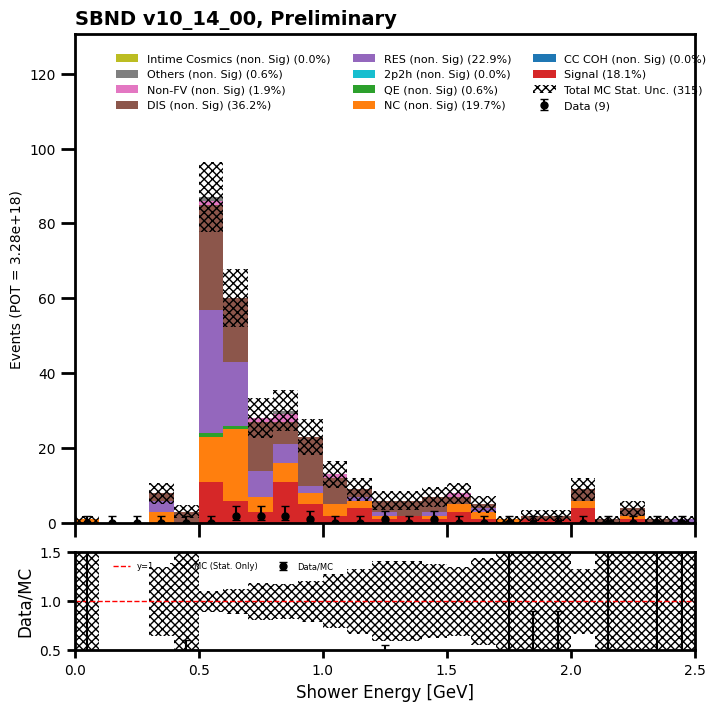

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  8
[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 2 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  1.  0.  2.  5.  2.  8.  2.  6. 12. 10. 12. 13. 11. 17. 11.
 17. 10.  5. 13.  7.  7.  7. 10.  7.  8.  8.  6.  7.  8.  8.  6.  5.  4.
  1.  4.  1.  3.]
data ratio  [       nan        nan        nan 0.                nan 0.
 0.         0.         0.         0.         0.         0.
 0.         0.08333333 0.         0.         0.         0.09090909
 0.         0.1        0.4        0.         0.         0.
 0.         0.         0.14285714 0.         0.125      0.
 0.         0.125      0.         0.         0.         0.
 0.         0.         0.         0.        ]
mode sums =  [57.0, 0.0, 48.0, 2.0, 0.0, 59.0, 95.0, 2.0, 1.0, 0.0]
fractions =  [21.59090909090909, 0.0, 18.181818181818183, 0.7575757575757576, 0.0, 22.348484848484848, 35.984848484848484, 0.7575757575757576, 0.3787878787878788, 0.0]
total sums =  264.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Si

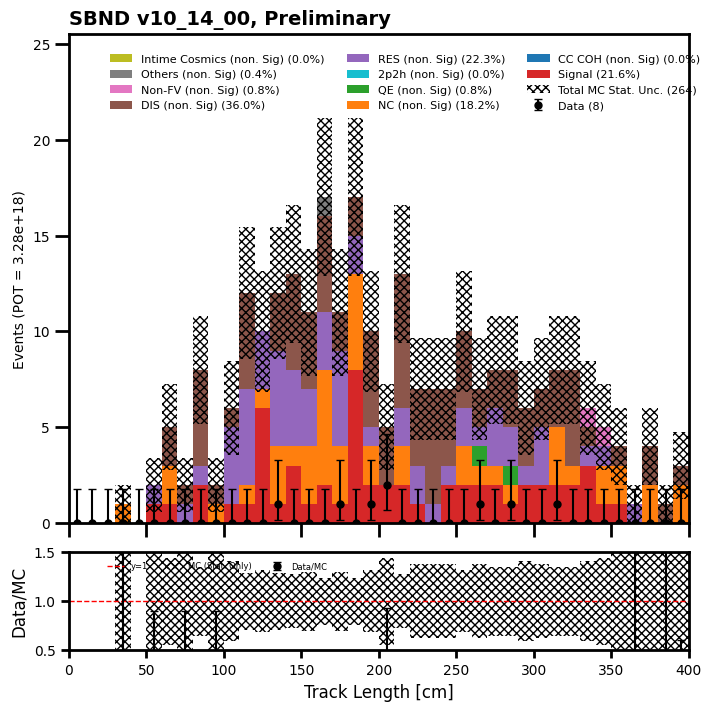

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[2 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[57. 37. 27. 20. 17. 10.  9.  5.  7.  7.  4.  7.  4.  5.  3.  2.  3.  4.
  3.  3.  3.  3.  2.  3.  2.  3.  1.  0.  1.  2.  3.  3.  0.  2.  1.  2.
  3.  2.  1.  2.]
data ratio  [0.03508772 0.02702703 0.03703704 0.         0.05882353 0.1
 0.         0.2        0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.33333333 0.         0.         0.         0.         0.
 0.5        0.         0.                nan 0.         0.
 0.         0.                nan 0.         0.         0.
 0.         0.         0.         0.        ]
mode sums =  [56.0, 0.0, 57.0, 1.0, 0.0, 58.0, 95.0, 6.0, 0.0, 0.0]
fractions =  [20.51282051282051, 0.0, 20.87912087912088, 0.3663003663003663, 0.0, 21.245421245421245, 34.798534798534796, 2.197802197802198, 0.0, 0.0]
total sums =  273.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 

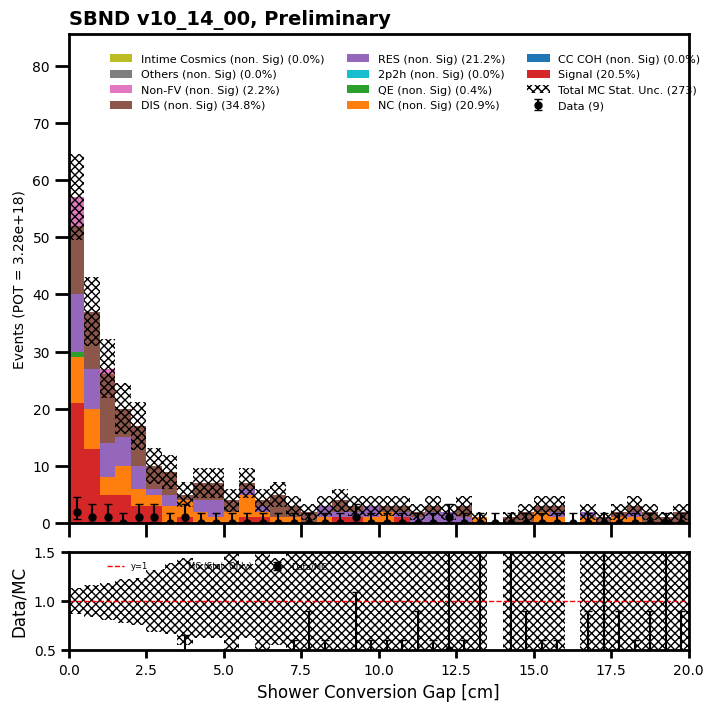

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  7
[0 0 0 1 0 0 1 0 0 4 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  5.  7. 65. 23. 11. 11. 32. 31. 21. 14. 10.  4.  8.  3.  5.  3.  4.
  3.  1.  1.  3.  2.  3.  2.  0.  0.  2.  1.  1.  2.  3.  0.  0.  0.  2.
  1.  0.  2.  2.]
data ratio  [       nan 0.         0.         0.01538462 0.         0.
 0.09090909 0.         0.         0.19047619 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.                nan        nan 0.         0.         0.
 0.         0.                nan        nan        nan 0.
 0.                nan 0.         0.        ]
mode sums =  [57.0, 0.0, 59.0, 2.0, 0.0, 60.0, 103.0, 6.0, 1.0, 0.0]
fractions =  [19.791666666666664, 0.0, 20.48611111111111, 0.6944444444444444, 0.0, 20.833333333333336, 35.76388888888889, 2.083333333333333, 0.3472222222222222, 0.0]
total sums =  288.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2

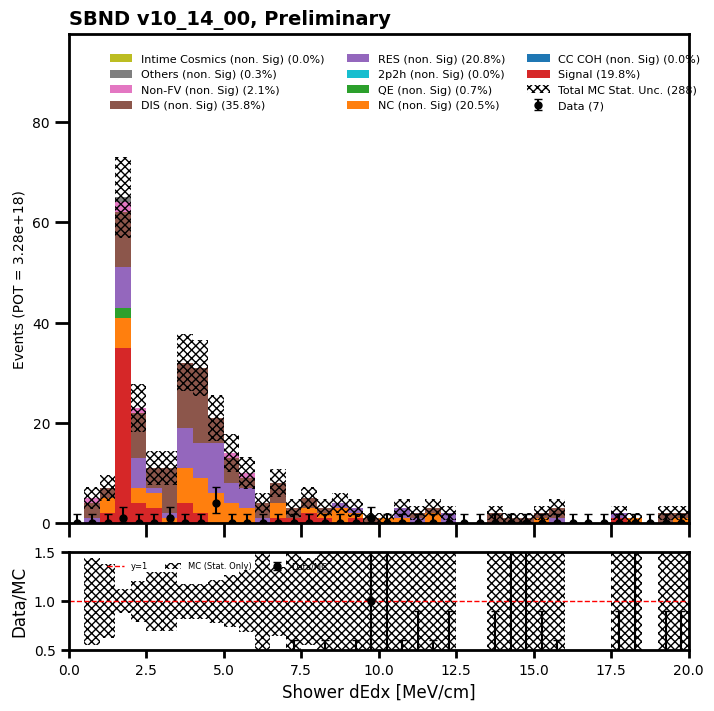

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 1 2 1 0 1 1 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. 24. 53. 61. 55. 33. 27. 23. 14. 13.  5.  2.  2.  2.  1.  0.  1.
  1.  1.  1.  1.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.04166667 0.         0.03278689 0.01818182
 0.06060606 0.03703704 0.         0.07142857 0.07692308 0.
 0.         0.         0.         0.                nan 0.
 0.         0.         0.         0.        ]
mode sums =  [59.0, 0.0, 64.0, 2.0, 0.0, 71.0, 116.0, 6.0, 2.0, 0.0]
fractions =  [18.4375, 0.0, 20.0, 0.625, 0.0, 22.1875, 36.25, 1.875, 0.625, 0.0]
total sums =  320.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'N

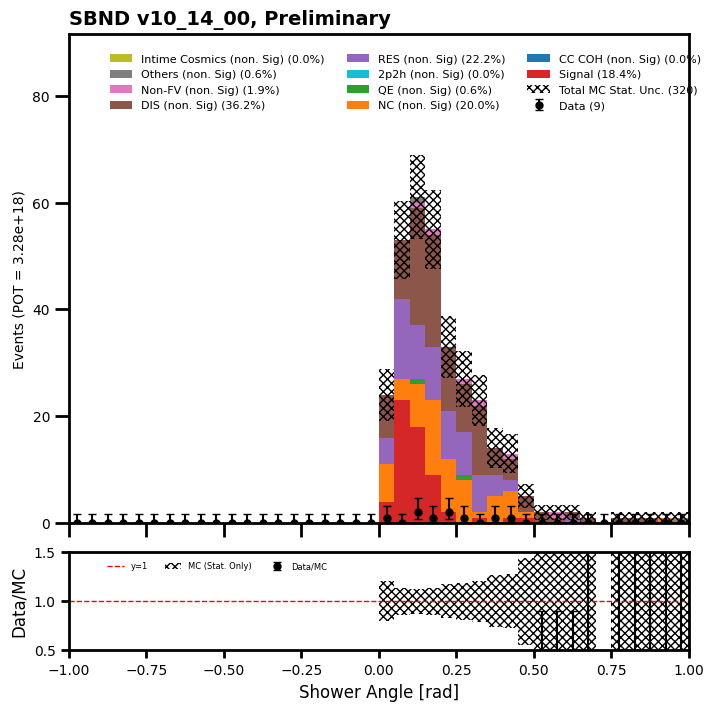

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  9
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  0.  1.  0.  0.
  1.  0.  1.  2.  2.  1.  6.  7.  7.  4.  6.  7.  9.  8.  7.  7.  9.  7.
  8.  5.  5.  8.  6.  8. 11. 13.  7. 10.  7.  6.  8.  7.  7.  7.  4.  5.
  7.  5.  4.  5.  8.  6.  4.  6.  2.  2.  4.  3.  4.  3.  3.  3.  0.  1.
  4.  0.  0.  2.  2.  0.  2.  0.  1.  1.  0.  1.  1.  1.  1.  1.  0.  0.
  0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan 

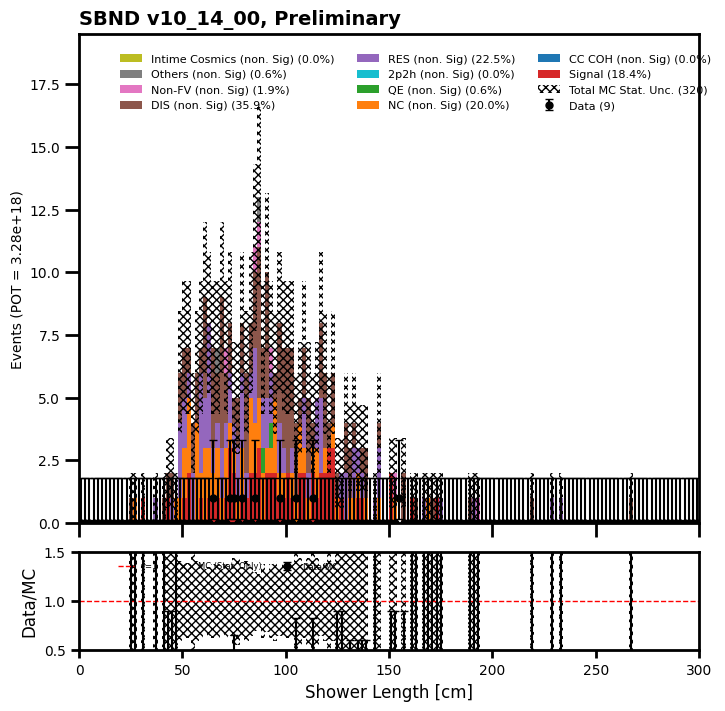

In [133]:
#track length

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_len")

In [134]:
purity = 42.29243469238281/230.09943222999573
efficiency = 42.29243469238281/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  18.38 % and efficiency =  53.15 %


In [135]:
mc_bnb_cosmic_dfs["evt"].pfp.shw.conversion_gap

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
58        403    0               0                           16.595425
                                 1                            0.354936
                                 2                           17.665321
                                 3                            2.859874
                                 4                           -5.000000
                                                               ...    
184       361    0               4                          274.763580
                                 5                           -5.000000
183       43     0               0                           78.285805
                                 1                            0.059509
                                 2                           -5.000000
Name: conversion_gap, Length: 1717, dtype: float32

In [136]:
def make_lsconv_filtered_df(df):
    lsconv_cut = df[(df.pfp.trackScore < 0.5) & (df.pfp.shw.maxplane_energy > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','shw','maxplane_energy','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    lsconv_cut = lsconv_cut[(lsconv_cut.pfp.shw.conversion_gap < 2) & (lsconv_cut.pfp.shw.conversion_gap > 0.001)]
    lsconv_mask = (lsconv_cut == True)

    mc_bnb_cosmic_evt_lsconv_mask = get_evt_pe_mask(lsconv_mask, df)
    df[('lead_shower_convgap_m15', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsconv_mask

    valid_slices4 = df.lead_shower_convgap_m15[df.lead_shower_convgap_m15 == True].index

    filtered_df4 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices4.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df4

In [137]:
filtered_df4 = make_lsconv_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df4b = make_lsconv_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df4c = make_lsconv_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/163699305.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_shower_convgap_m15', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsconv_mask
/tmp/ipykernel_3794/163699305.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[('lead_shower_convgap_m15', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsconv_mask
/tmp/ipykernel_3794/163699305.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [138]:
mc_bnb_cosmic_dfs["evt"] = filtered_df4
data_offbeam_light_dfs["evt"] = filtered_df4b
data_bnb_light_dfs["evt"] = filtered_df4c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  4
[0 4]
[  0 123]
data ratio  [       nan 0.03252033]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626014, 0.8130081300813009, 0.0, 19.51219512195122, 26.01626016260163, 1.6260162601626018, 0.0, 0.0]
total sums =  123.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


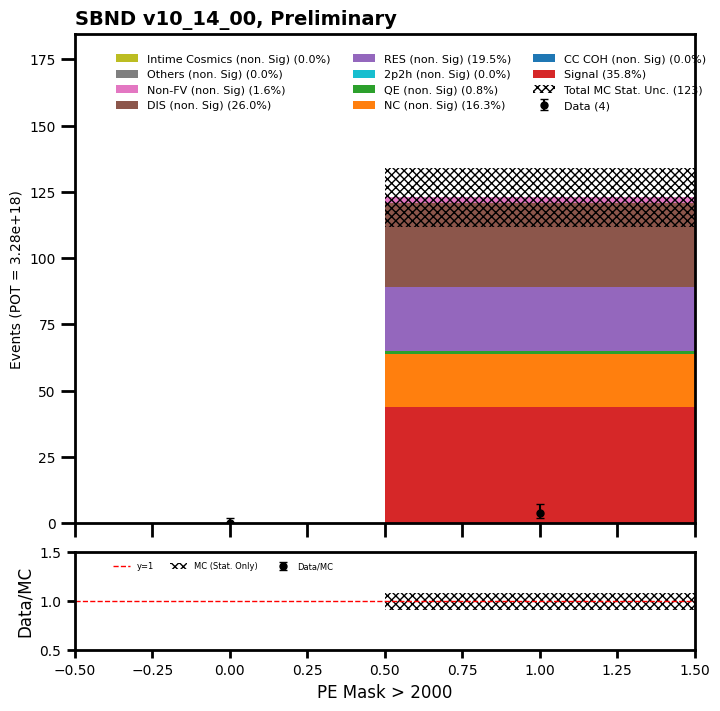

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 1 1 2 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 18. 56. 45.  4.  0.  0.  0.  0.
  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.05555556 0.01785714
 0.04444444 0.                nan        nan        nan        nan
        nan        nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626014, 0.8130081300813009, 0.0, 19.51219512195122, 26.01626016260163, 1.6260162601626018, 0.0, 0.0]
total sums =  123.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


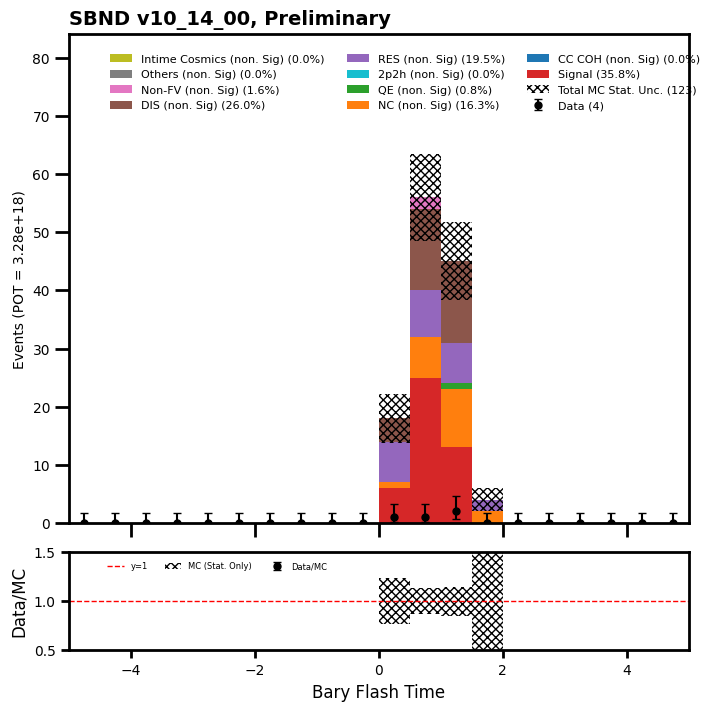

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[4 0]
[123   0]
data ratio  [0.03252033        nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626014, 0.8130081300813009, 0.0, 19.51219512195122, 26.01626016260163, 1.6260162601626018, 0.0, 0.0]
total sums =  123.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


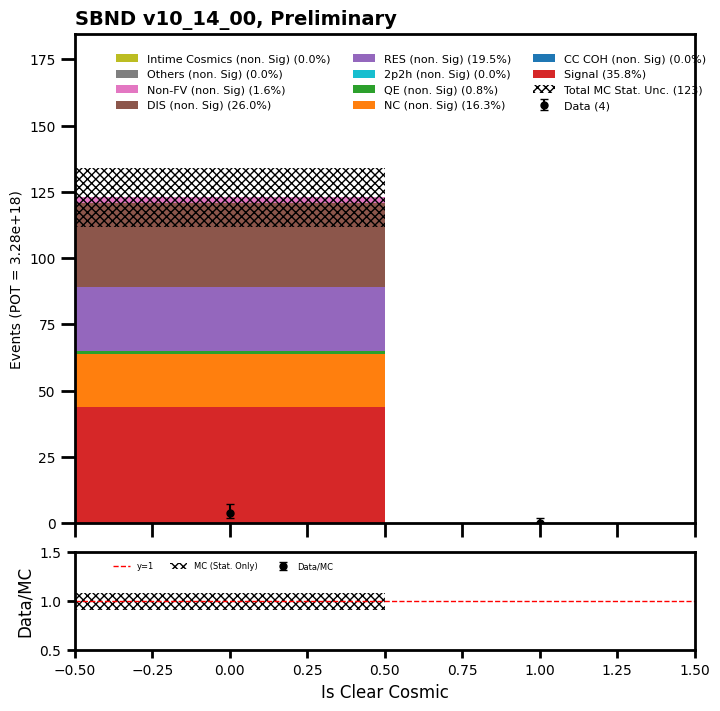

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 2. 1. 2. 5. 3.
 2. 2. 2. 2. 0. 1. 1. 2. 2. 4. 1. 2. 4. 2. 3. 5. 2. 2. 0. 1. 3. 1. 1. 1.
 3. 2. 2. 3. 2. 2. 1. 4. 1. 1. 5. 1. 3. 0. 6. 1. 2. 1. 1. 1. 4. 2. 1. 2.
 0. 1. 3. 0. 0. 3. 3. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  nan 0.  0.  0.  0.  0.  0.  0.
 0.  0.5 0.  0.  0.  0.  nan 0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.5
 0.  0.  0.  0.  0.  0.  0.  nan 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan 0.  0.  nan nan 0.  0.  0.  nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0,

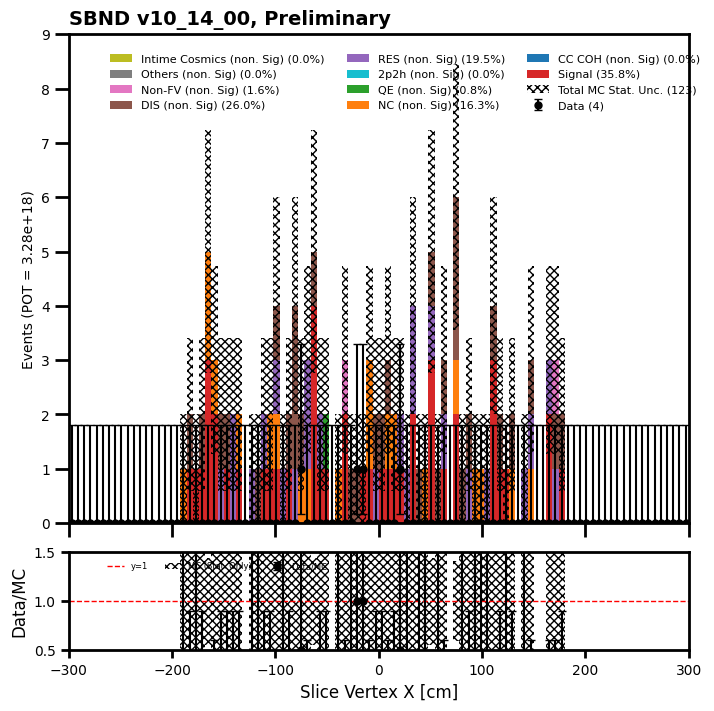

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 2. 1. 0. 3.
 3. 0. 3. 3. 1. 2. 1. 5. 1. 2. 2. 2. 4. 1. 0. 3. 3. 1. 6. 4. 0. 4. 2. 4.
 2. 4. 5. 1. 0. 2. 2. 2. 1. 4. 1. 4. 2. 3. 4. 2. 0. 0. 0. 2. 1. 3. 3. 0.
 2. 0. 0. 2. 1. 1. 1. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 inf 0.  0.  0.  nan 0.  0.  inf 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  inf 0.  0.  0.  0.  0.  nan 0.  0.  0.  0.  0.  0.2 0.  nan 0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  nan nan nan 0.  0.  0.  0.  nan
 0.  nan nan 0.  0.  0.  0.  0.  nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0,

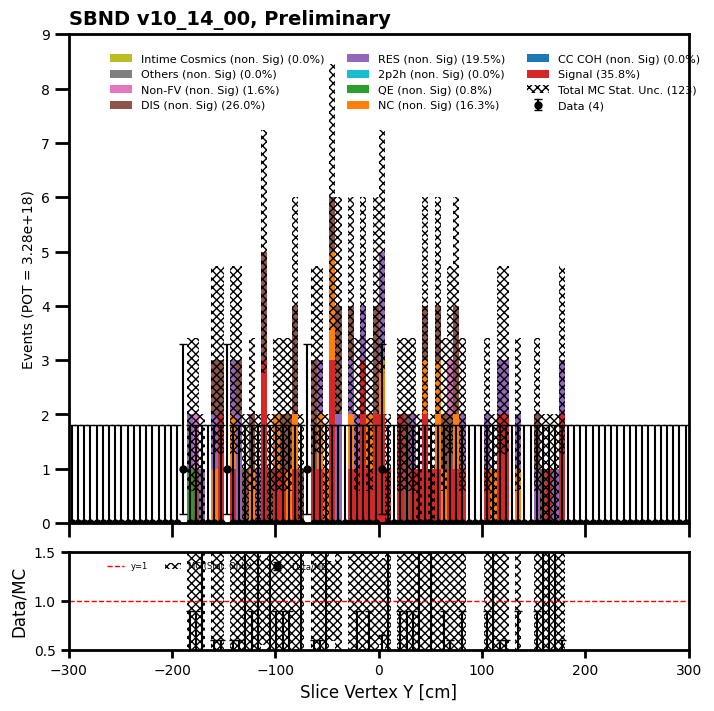

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 3. 0. 1. 0.
 0. 0. 1. 5. 2. 2. 6. 2. 4. 3. 2. 6. 1. 4. 4. 3. 3. 3. 1. 1. 1. 5. 1. 1.
 3. 0. 2. 0. 4. 0. 1. 1. 4. 2. 1. 0. 1. 2. 1. 2. 3. 4. 0. 0. 1. 2. 2. 5.
 4. 1. 1. 0. 3. 3. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.         0.
 0.                nan 0.                nan 0.                nan
        nan        nan 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.25       0.         0.         0.         0.
 0.         0.         0.

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


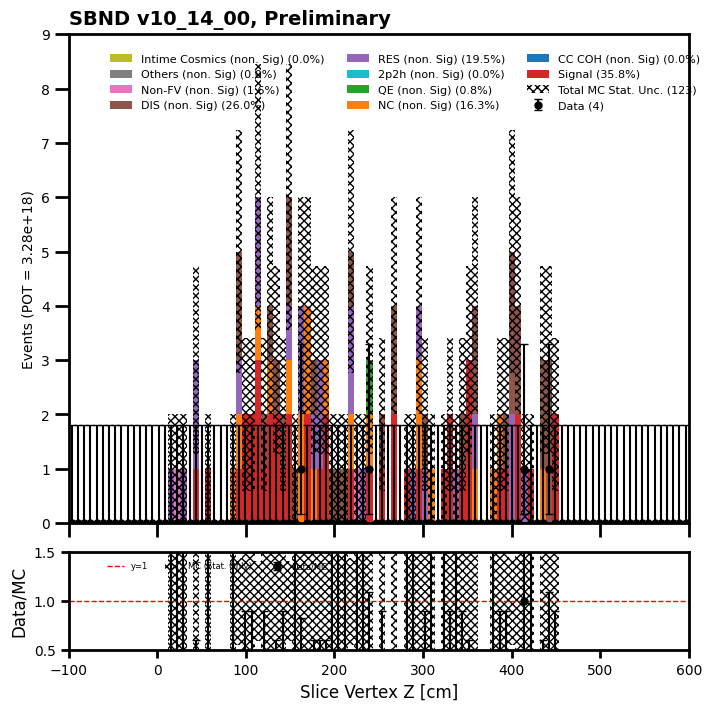

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 2
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  3.  3.  2.  3.  4. 12.  6. 11. 18. 13. 16.
 22.  9.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan 0.         0.         0.         0.         0.
 0.08333333 0.         0.         0.05555556 0.         0.
 0.09090909 0.         0.                nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626

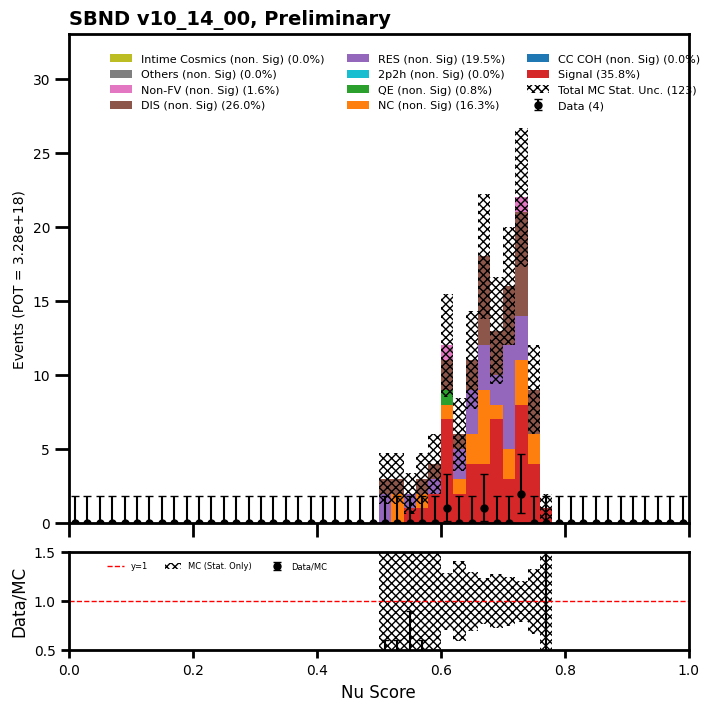

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 2. 14. 20. 26.  9.  7.  5.  4.  9.  3.  2.  2.  3.  1.  2.  0.  1.  2.
  2.  0.  1.  0.  2.  1.  1.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [0.         0.07142857 0.05       0.         0.11111111 0.
 0.2        0.         0.         0.         0.         0.
 0.         0.         0.                nan 0.         0.
 0.                nan 0.                nan 0.         0.
 0.         0.                nan        nan 0.                nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [44.0, 0.0, 19.0, 1.0, 0.0, 23.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [36.36363636363637, 0.0, 15.702479338842975, 0.8264462809917356, 0.0, 19.00826446280992, 26.446280991735538, 1.6528925619834711, 0.0, 0.0]
total sums =  121.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p

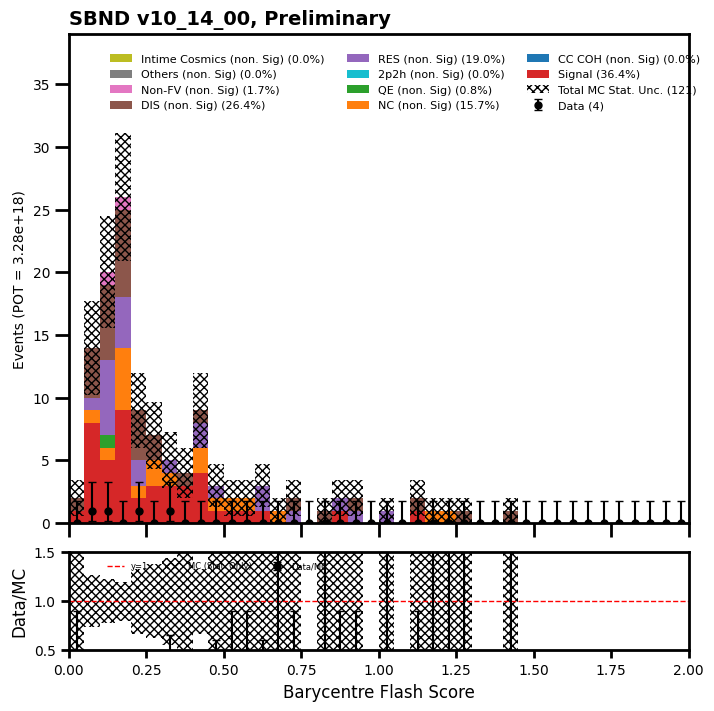

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 2 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  1. 10.  8. 15.  8. 12. 20.
  9. 11. 10.  3.  5.  4.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [ nan  nan  nan  nan  nan  nan  nan  nan  nan  nan 0.   0.   0.1  0.
 0.   0.25 0.   0.   0.   0.   0.   0.   0.   0.   0.5   nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan 0.    nan  nan  nan 0.    nan
  nan  nan  nan  nan  nan  nan  nan  nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626014, 0.8130081300813009, 0.0, 19.51219512195122, 26.01626016260163, 1.6260162601626018, 0.0, 0.0]
total sums =  123.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Co

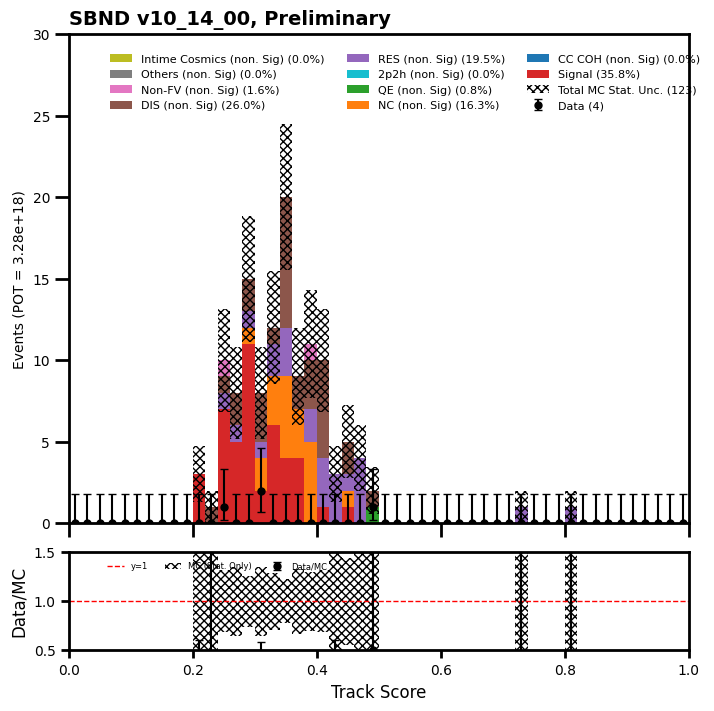

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  3.  0. 33. 22.  8. 13.  6.  7.  3.  3.  2.  4.  2.  4.  0.
  1.  2.  2.  1.  2.  0.  0.]
data ratio  [       nan        nan        nan 0.                nan 0.
 0.         0.         0.07692308 0.16666667 0.         0.
 0.33333333 0.         0.25       0.         0.                nan
 0.         0.         0.         0.         0.                nan
        nan]
mode sums =  [42.0, 0.0, 19.0, 1.0, 0.0, 24.0, 30.0, 2.0, 0.0, 0.0]
fractions =  [35.59322033898305, 0.0, 16.101694915254235, 0.847457627118644, 0.0, 20.33898305084746, 25.423728813559322, 1.694915254237288, 0.0, 0.0]
total sums =  118.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


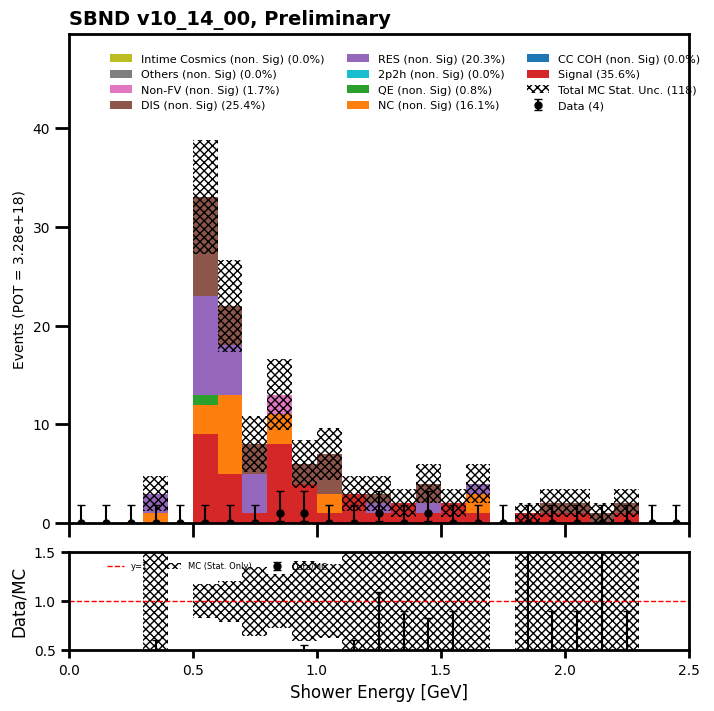

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0]
[0. 0. 0. 0. 0. 1. 2. 0. 3. 1. 2. 7. 6. 4. 2. 3. 6. 4. 9. 2. 4. 6. 2. 3.
 2. 3. 5. 4. 0. 3. 2. 3. 3. 6. 2. 3. 1. 0. 0. 0.]
data ratio  [ nan  nan  nan  nan  nan 0.   0.    nan 0.   0.   0.   0.   0.   0.25
 0.   0.   0.   0.25 0.   0.   0.25 0.   0.   0.   0.   0.   0.   0.
  inf 0.   0.   0.   0.   0.   0.   0.   0.    nan  nan  nan]
mode sums =  [42.0, 0.0, 11.0, 1.0, 0.0, 21.0, 27.0, 2.0, 0.0, 0.0]
fractions =  [40.38461538461539, 0.0, 10.576923076923077, 0.9615384615384616, 0.0, 20.192307692307693, 25.961538461538463, 1.9230769230769231, 0.0, 0.0]
total sums =  104.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


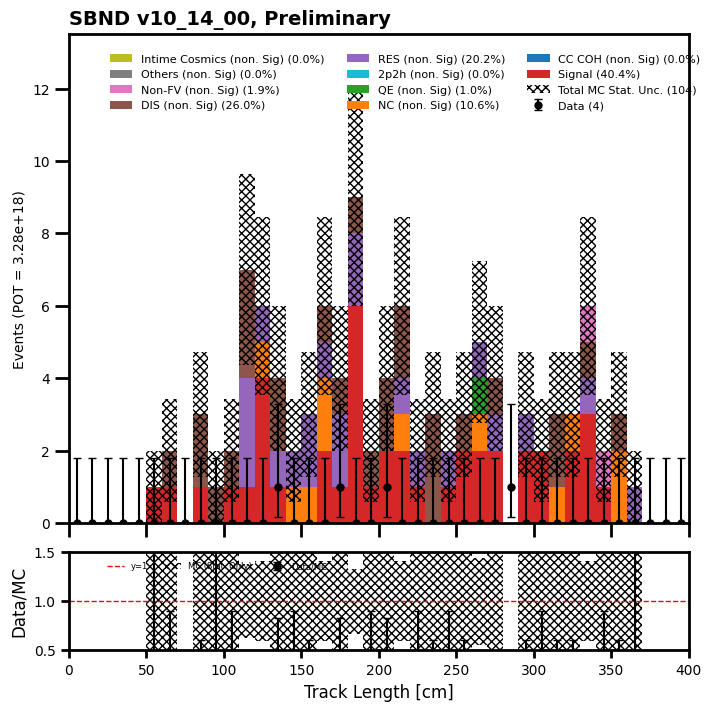

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[2 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[44. 35. 23. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [0.04545455 0.02857143 0.04347826 0.                nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [44.0, 0.0, 19.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [36.0655737704918, 0.0, 15.573770491803279, 0.819672131147541, 0.0, 19.672131147540984, 26.229508196721312, 1.639344262295082, 0.0, 0.0]
total sums =  122.0
['Signal', 'CC COH (non. Sig)', 'NC (no

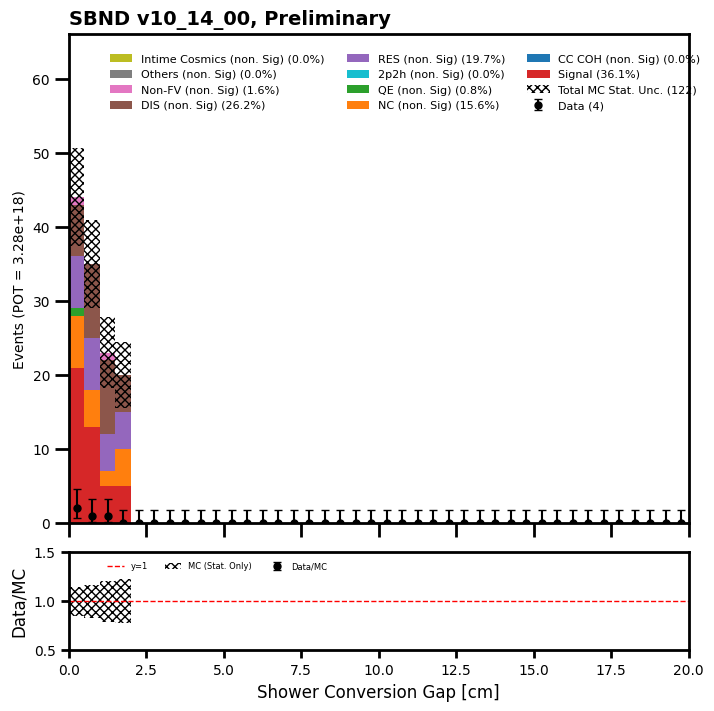

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  3
[0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  1.  3. 28. 14.  1.  2. 11.  5.  8.  5.  3.  1.  3.  2.  4.  1.  0.
  1.  1.  0.  2.  1.  1.  1.  0.  0.  1.  0.  0.  1.  2.  0.  0.  0.  0.
  1.  0.  2.  2.]
data ratio  [       nan 0.         0.         0.03571429 0.         0.
 0.5        0.         0.         0.125      0.         0.
 0.         0.         0.         0.         0.                nan
 0.         0.                nan 0.         0.         0.
 0.                nan        nan 0.                nan        nan
 0.         0.                nan        nan        nan        nan
 0.                nan 0.         0.        ]
mode sums =  [42.0, 0.0, 19.0, 1.0, 0.0, 18.0, 26.0, 2.0, 0.0, 0.0]
fractions =  [38.88888888888889, 0.0, 17.59259259259259, 0.9259259259259258, 0.0, 16.666666666666664, 24.074074074074073, 1.8518518518518516, 0.0, 0.0]
total sums =  108.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Si

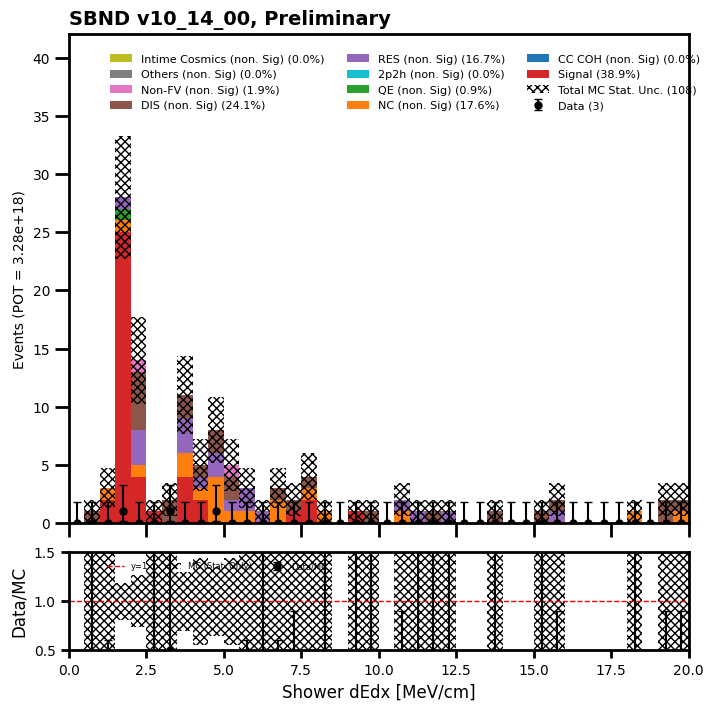

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  5. 23. 28. 23. 14. 13.  5.  5.  3.  1.  0.  1.  1.  0.  0.  0.
  1.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.2        0.         0.03571429 0.
 0.07142857 0.         0.         0.         0.33333333 0.
        nan 0.         0.                nan        nan        nan
 0.                nan        nan        nan]
mode sums =  [44.0, 0.0, 20.0, 1.0, 0.0, 24.0, 32.0, 2.0, 0.0, 0.0]
fractions =  [35.77235772357724, 0.0, 16.260162601626014, 0.8130081300813009, 0.0, 19.51219512195122, 26.01626016260163, 1.6260162601626018, 0.0, 0.0]
total sums =  123.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (

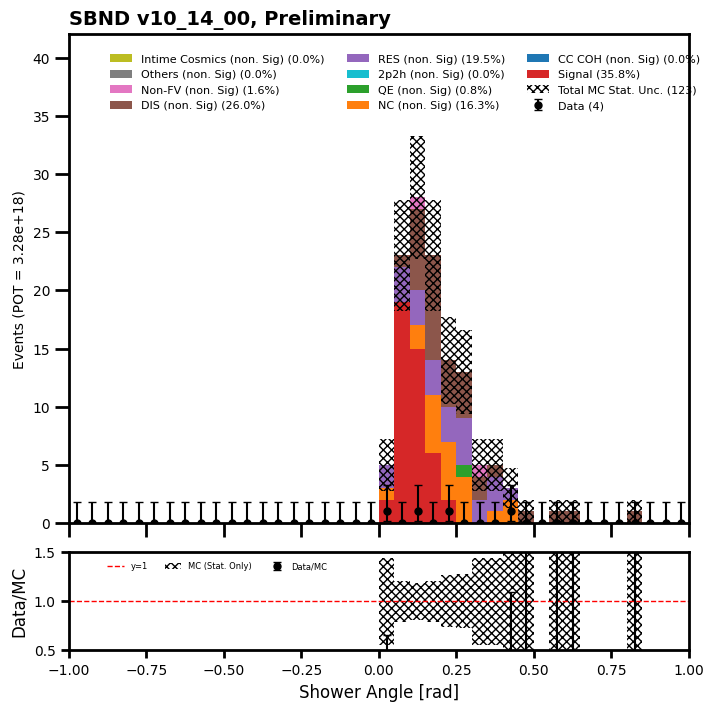

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.
 2. 1. 4. 2. 3. 4. 0. 3. 4. 1. 3. 1. 4. 3. 2. 3. 2. 2. 3. 4. 4. 4. 5. 5.
 2. 1. 3. 4. 2. 1. 2. 1. 4. 5. 3. 4. 3. 2. 0. 1. 0. 0. 2. 0. 2. 1. 0. 0.
 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 0.                nan        nan        nan        nan        nan
       

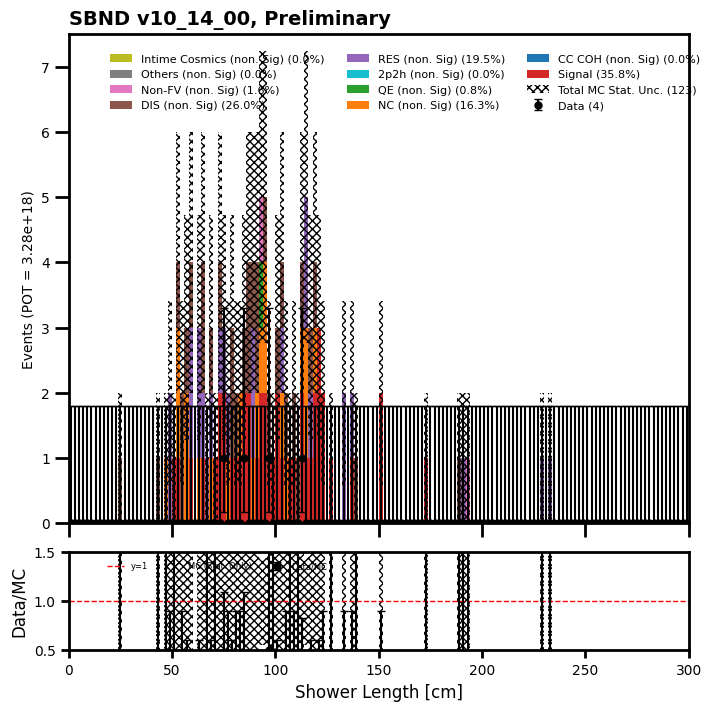

In [139]:
#shr conv length

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_conv")

In [140]:
purity = 31.540136337280273/88.16899806261063
efficiency = 31.540136337280273/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  35.77 % and efficiency =  39.64 %


In [141]:
def make_lsdedx_filtered_df(df):
    lsdedx_cut = df[(df.pfp.trackScore < 0.5) & (df.pfp.shw.maxplane_energy > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','shw','maxplane_energy','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    lsdedx_cut = lsdedx_cut[(lsdedx_cut.pfp.shw.bestplane_dEdx < 2.5) & (lsdedx_cut.pfp.shw.bestplane_dEdx > 1)]
    lsdedx_mask = (lsdedx_cut == True)

    mc_bnb_cosmic_evt_lsdedx_mask = get_evt_pe_mask(lsdedx_mask, df)
    df[('lead_shower_dedx_m051', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsdedx_mask

    valid_slices5 = df.lead_shower_dedx_m051[df.lead_shower_dedx_m051 == True].index

    filtered_df5 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices5.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df5

In [142]:
filtered_df5 = make_lsdedx_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df5b = make_lsdedx_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df5c = make_lsdedx_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/147850387.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_shower_dedx_m051', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsdedx_mask
/tmp/ipykernel_3794/147850387.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[('lead_shower_dedx_m051', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsdedx_mask
/tmp/ipykernel_3794/147850387.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [143]:
mc_bnb_cosmic_dfs["evt"] = filtered_df5
data_offbeam_light_dfs["evt"] = filtered_df5b
data_bnb_light_dfs["evt"] = filtered_df5c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  1
[0 1]
[ 0 46]
data ratio  [       nan 0.02173913]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869565217391305, 2.1739130434782608, 0.0, 0.0]
total sums =  46.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


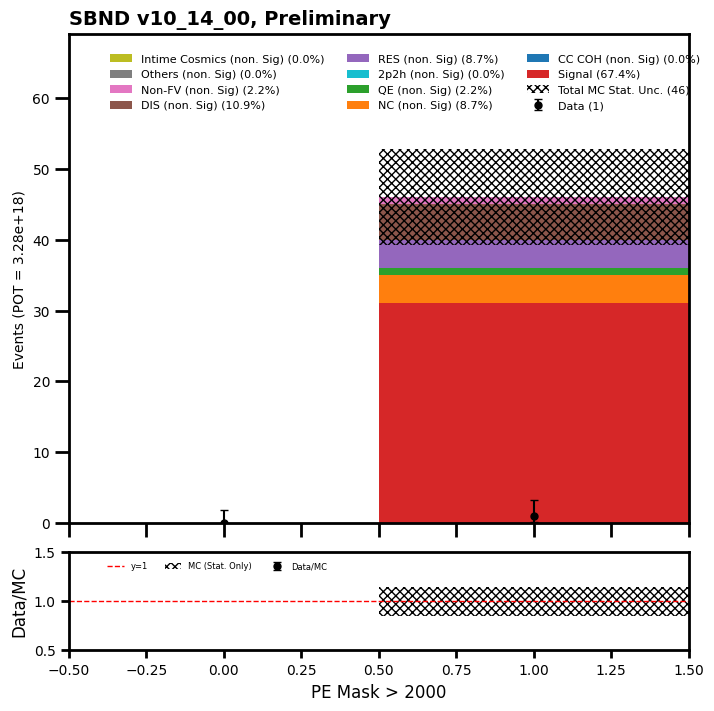

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6. 25. 14.  1.  0.  0.  0.  0.
  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.16666667 0.
 0.         0.                nan        nan        nan        nan
        nan        nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869565217391305, 2.1739130434782608, 0.0, 0.0]
total sums =  46.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


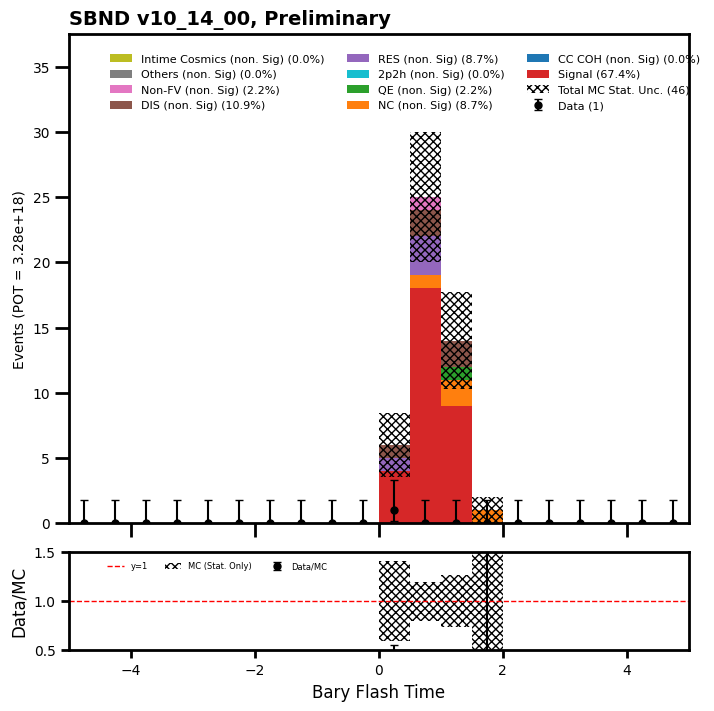

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[1 0]
[46  0]
data ratio  [0.02173913        nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869565217391305, 2.1739130434782608, 0.0, 0.0]
total sums =  46.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


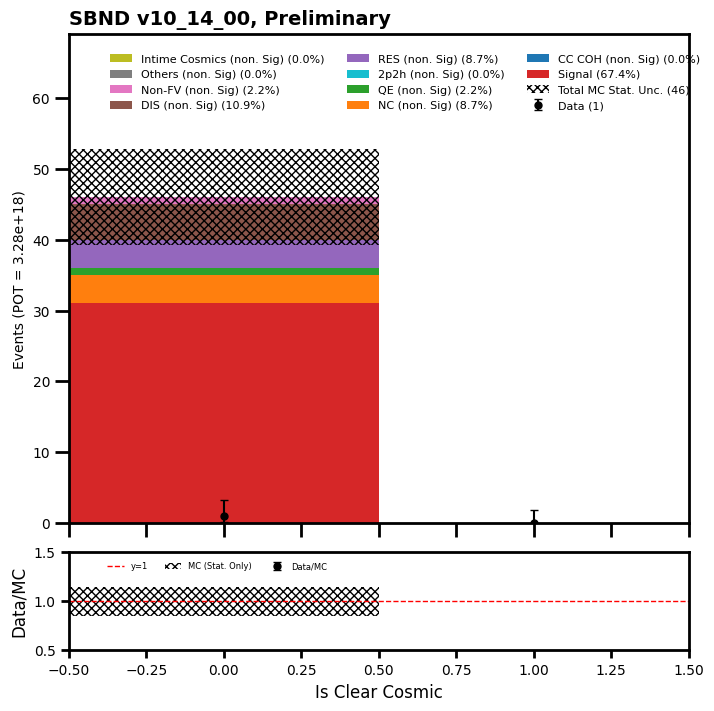

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 3. 1.
 1. 0. 0. 1. 0. 0. 0. 1. 0. 2. 0. 0. 1. 0. 2. 3. 1. 1. 0. 0. 2. 0. 0. 0.
 2. 0. 0. 0. 1. 0. 0. 2. 0. 1. 3. 0. 1. 0. 4. 0. 0. 0. 0. 0. 3. 1. 1. 1.
 0. 0. 0. 0. 0. 2. 1. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan  0.  0. nan  0.  0.  0. nan nan  0. nan nan nan  0. nan  0. nan nan
  0. nan  0.  0.  0.  0. nan nan  0. nan nan inf  0. nan nan nan  0. nan
 nan  0. nan  0.  0. nan  0. nan  0. nan nan nan nan nan  0.  0.  0.  0.
 nan nan nan nan nan  0.  0.  0. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 

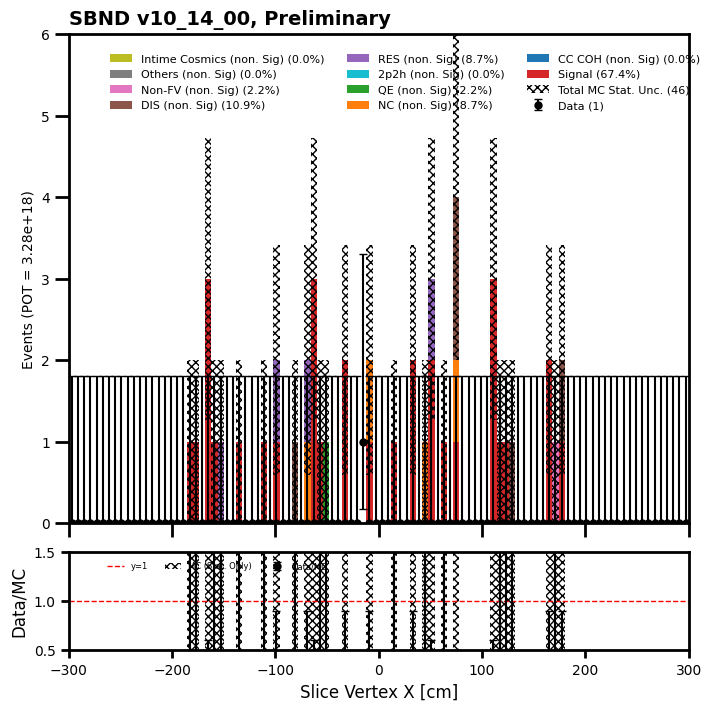

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0.
 2. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 3. 2. 0. 1. 0. 3.
 2. 1. 2. 0. 0. 1. 1. 0. 1. 2. 0. 1. 1. 2. 1. 1. 0. 0. 0. 1. 0. 1. 2. 0.
 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 inf  0.  0.  0. nan nan  0. nan  0.  0. nan nan nan  0.  0.  0.  0.  0.
 nan nan nan  0.  0. nan  0.  0. nan  0. nan  0.  0.  0.  0. nan nan  0.
  0. nan  0.  0. nan  0.  0.  0.  0.  0. nan nan nan  0. nan  0.  0. nan
  0. nan nan nan nan  0. nan  0. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 

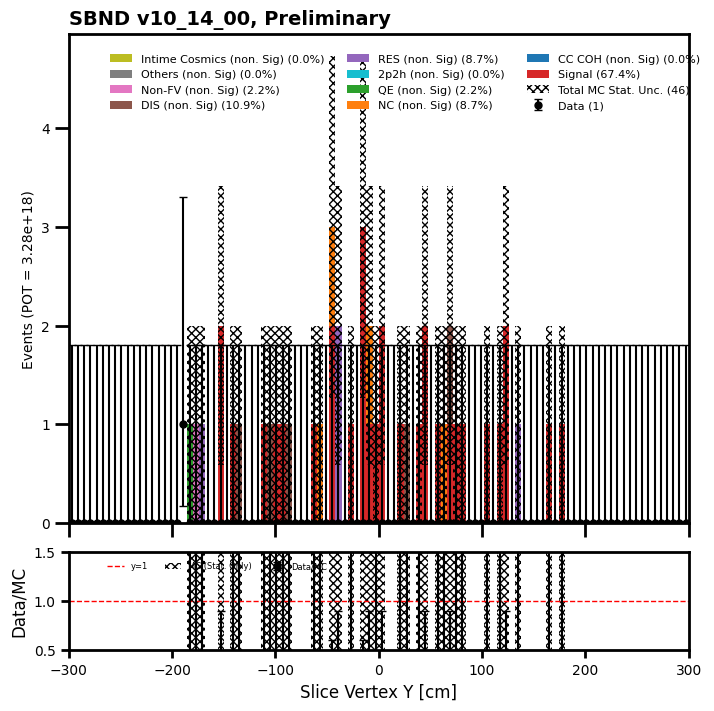

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 2. 2. 3. 2. 2. 2. 1. 2. 0. 0. 2. 1. 1. 1. 1. 0. 0. 3. 1. 0.
 1. 0. 0. 0. 2. 0. 0. 0. 2. 0. 1. 0. 0. 2. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1.
 2. 0. 1. 0. 0. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  0. nan  0. nan nan nan nan nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan  0.  0.  0.  0.  0. nan nan  0.  0. nan  1. nan nan nan  0. nan
 nan nan  0. nan  0. nan nan  0. nan  0.  0. nan nan nan nan  0. nan  0.
  0. nan  0. nan nan  0.  0. nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


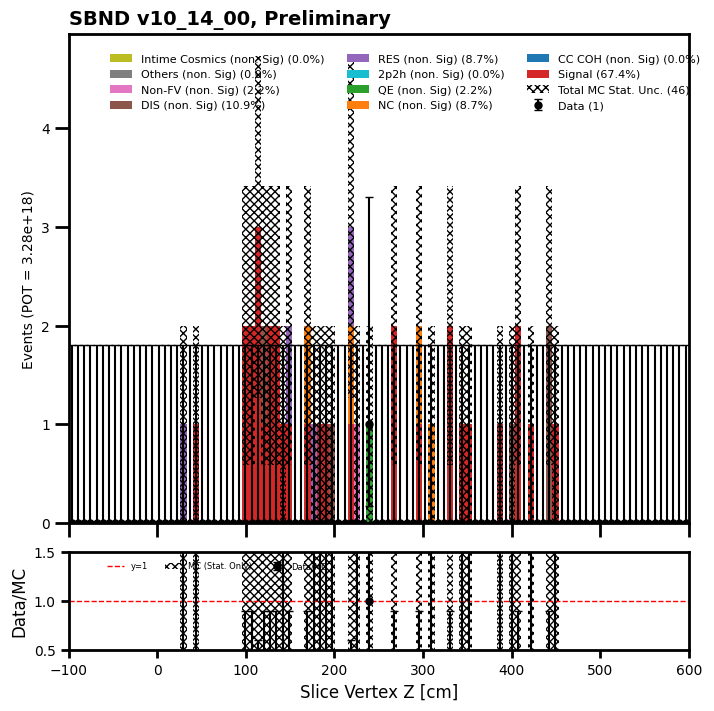

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  3.  5.  2.  3.  4.  6.  7.
 11.  2.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.09090909 0.         0.                nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 

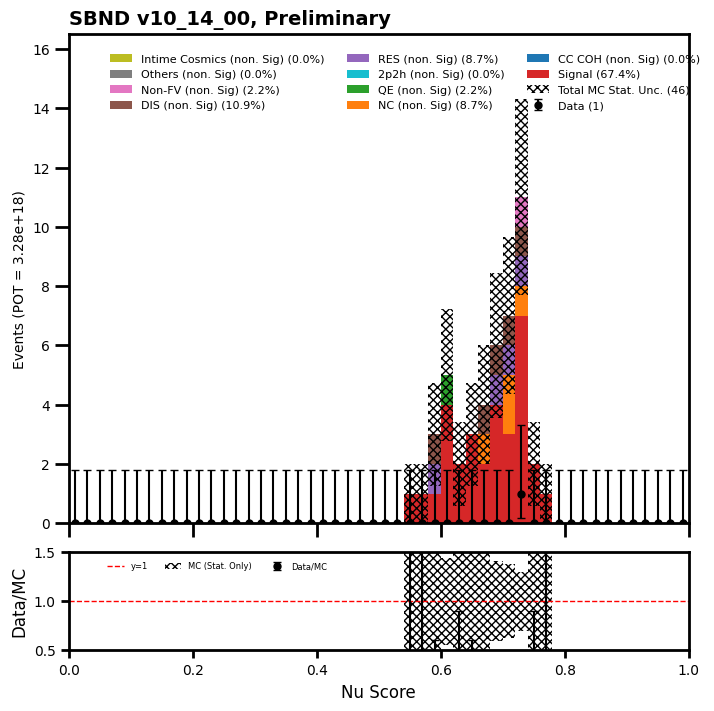

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[1. 7. 6. 9. 3. 3. 5. 4. 2. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
data ratio  [0.  0.  0.  0.  0.  0.  0.2 0.  0.  0.  0.  nan 0.  nan nan nan nan nan
 nan nan 0.  nan nan nan 0.  nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan]
mode sums =  [31.0, 0.0, 3.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [68.88888888888889, 0.0, 6.666666666666667, 2.2222222222222223, 0.0, 8.88888888888889, 11.11111111111111, 2.2222222222222223, 0.0, 0.0]
total sums =  45.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


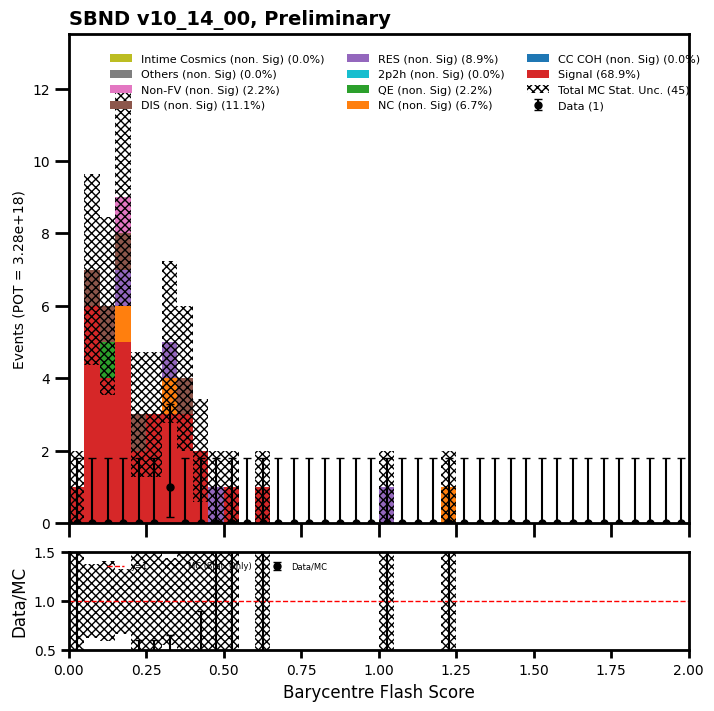

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 5. 3. 9. 3. 3. 5. 5. 3. 3. 0. 1. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.                nan
 0.         0.         0.         0.33333333 0.         0.
 0.         0.         0.                nan 0.         0.
 0.                nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
 0.                nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869

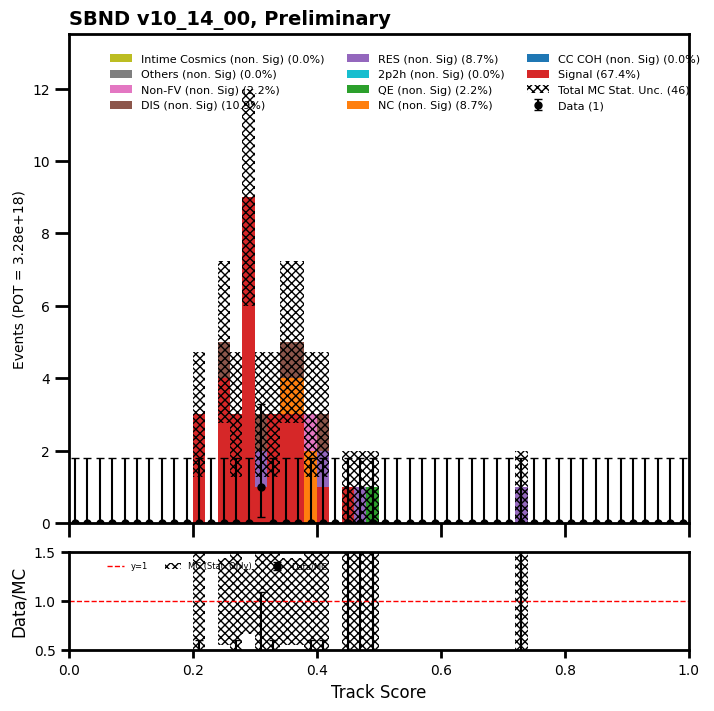

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  2.  0. 10.  6.  1.  6.  5.  1.  3.  1.  1.  1.  2.  1.  0.
  1.  1.  1.  0.  2.  0.  0.]
data ratio  [nan nan nan 0.  nan 0.  0.  0.  0.  0.2 0.  0.  0.  0.  0.  0.  0.  nan
 0.  0.  0.  nan 0.  nan nan]
mode sums =  [30.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [66.66666666666666, 0.0, 8.88888888888889, 2.2222222222222223, 0.0, 8.88888888888889, 11.11111111111111, 2.2222222222222223, 0.0, 0.0]
total sums =  45.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


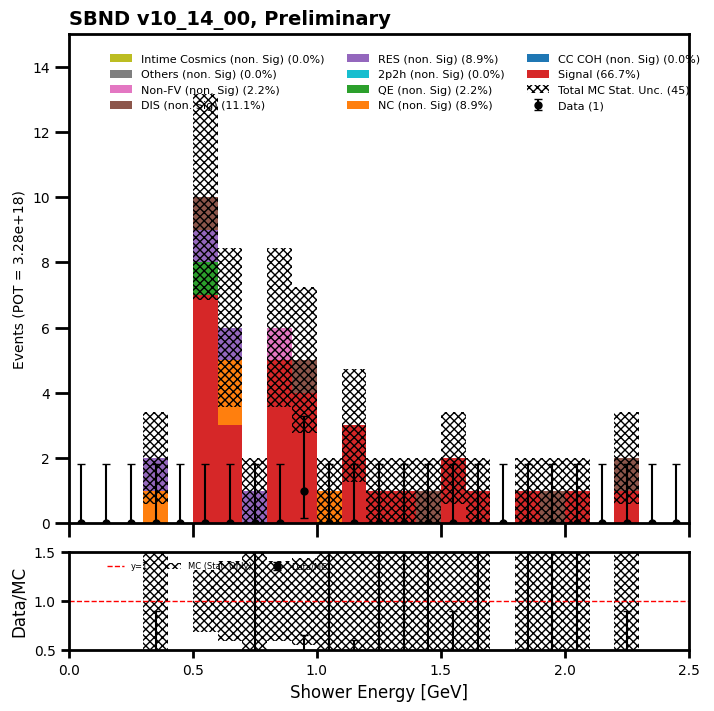

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[0. 0. 0. 0. 0. 0. 1. 0. 2. 0. 1. 2. 4. 1. 0. 0. 3. 1. 5. 1. 1. 2. 1. 0.
 1. 2. 3. 2. 0. 0. 1. 1. 1. 4. 0. 2. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan  0. nan  0. nan  0.  0.  0.  0. nan nan  0.  1.
  0.  0.  0.  0.  0. nan  0.  0.  0.  0. nan nan  0.  0.  0.  0. nan  0.
 nan nan nan nan]
mode sums =  [30.0, 0.0, 2.0, 1.0, 0.0, 4.0, 4.0, 1.0, 0.0, 0.0]
fractions =  [71.42857142857143, 0.0, 4.761904761904762, 2.380952380952381, 0.0, 9.523809523809524, 9.523809523809524, 2.380952380952381, 0.0, 0.0]
total sums =  42.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


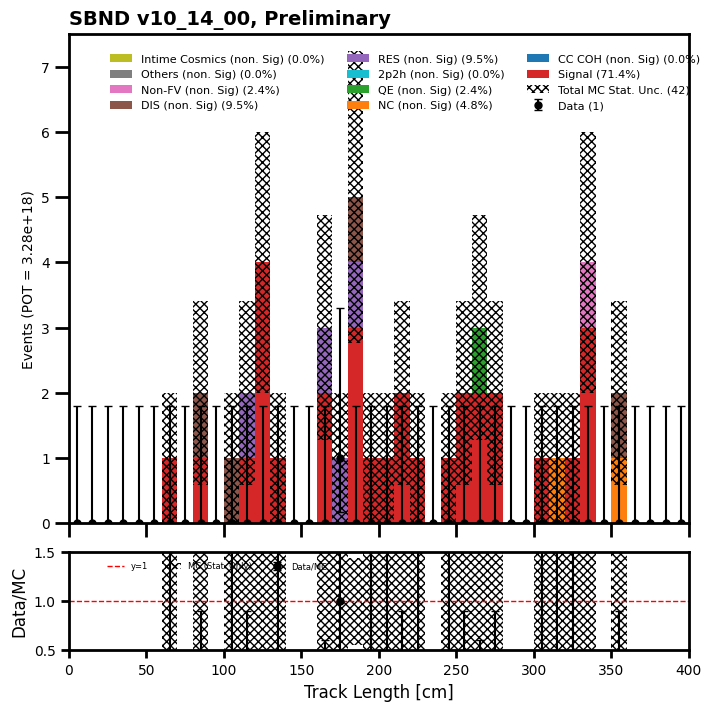

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[18. 15.  8.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [0.         0.06666667 0.         0.                nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [31.0, 0.0, 3.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [68.88888888888889, 0.0, 6.666666666666667, 2.2222222222222223, 0.0, 8.88888888888889, 11.11111111111111, 2.2222222222222223, 0.0, 0.0]
total sums =  45.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Si

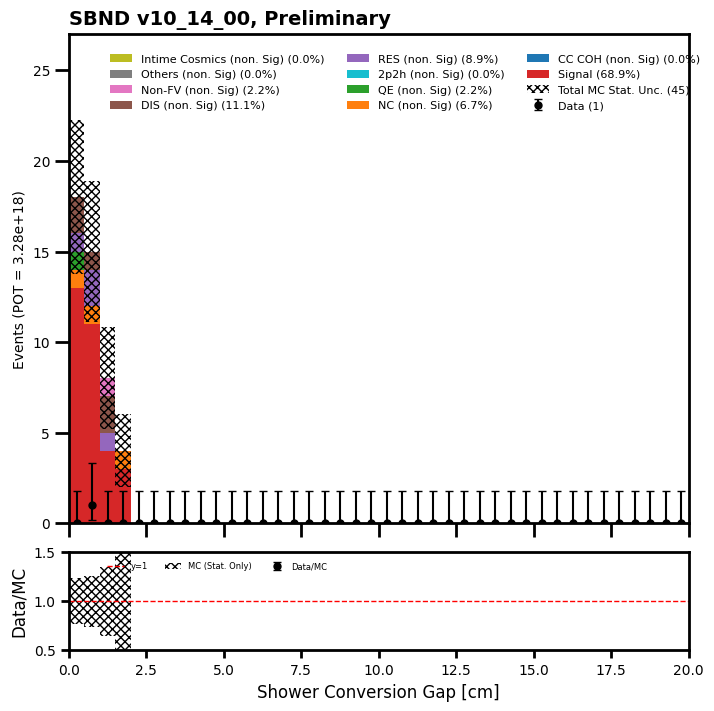

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  3. 27. 14.  0.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [       nan        nan 0.         0.03703704 0.                nan
        nan        nan        nan 0.                nan 0.
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869565217391305, 2.1739130434782608, 0.0, 0.0]
total sums =  46.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'Q

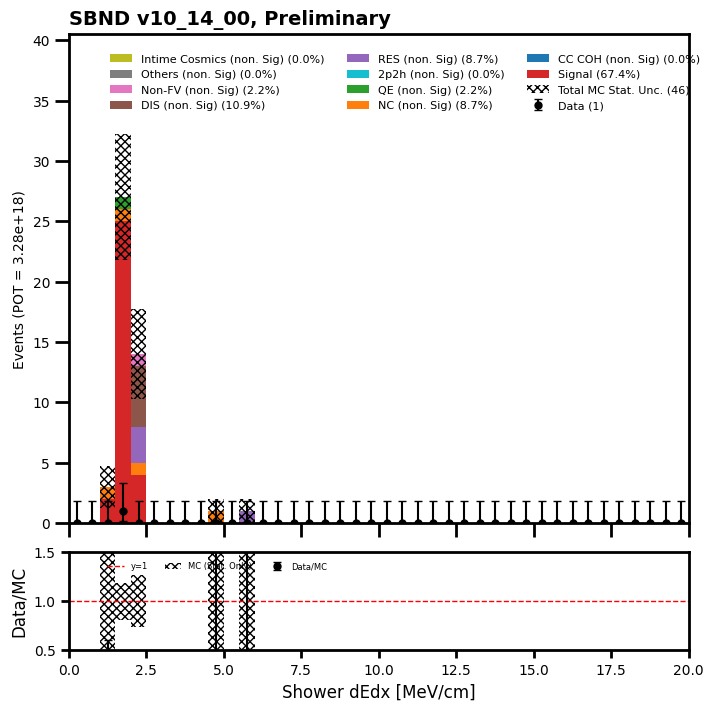

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  2. 16.  8.  8.  6.  4.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 0.5 0.  0.  0.  0.  0.  0.  nan nan nan nan nan nan nan nan nan
 nan nan nan nan]
mode sums =  [31.0, 0.0, 4.0, 1.0, 0.0, 4.0, 5.0, 1.0, 0.0, 0.0]
fractions =  [67.3913043478261, 0.0, 8.695652173913043, 2.1739130434782608, 0.0, 8.695652173913043, 10.869565217391305, 2.1739130434782608, 0.0, 0.0]
total sums =  46.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


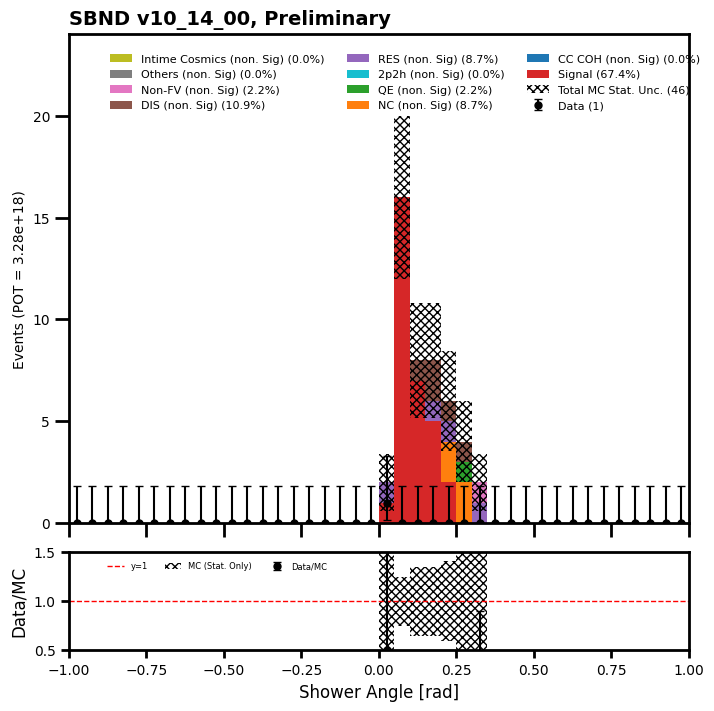

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 1. 0. 1. 2. 0. 0. 1. 1. 0. 1. 3. 2. 0. 0. 0. 1. 3. 2. 1. 1. 2. 2.
 1. 1. 0. 2. 0. 1. 0. 0. 1. 1. 1. 3. 2. 2. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan  0. nan nan  0. nan  0.  0. nan nan  0.  0. nan  0.
  0.  0. nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.  0. nan  

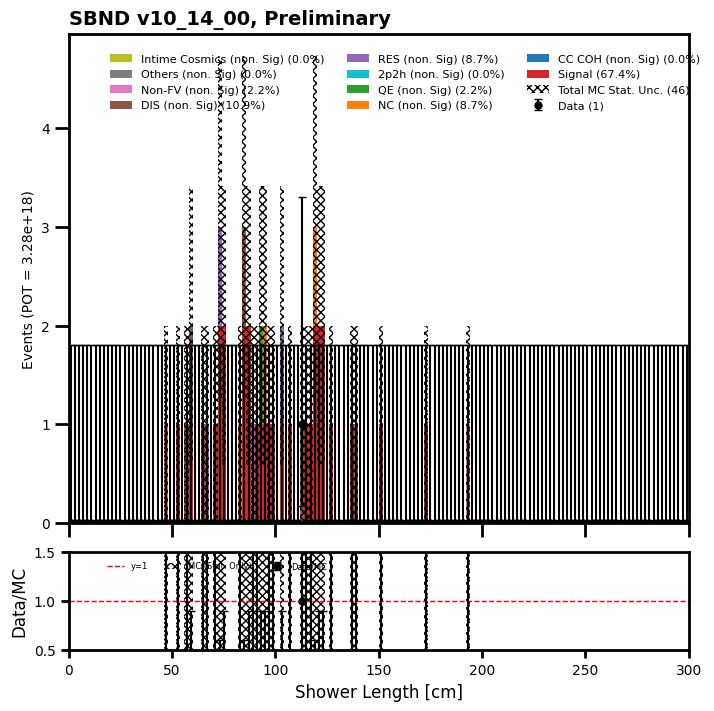

In [144]:
#dedx

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_dedx")

In [145]:
purity = 22.221454620361328/32.97377169132233
efficiency = 22.221454620361328/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  67.39 % and efficiency =  27.93 %


In [146]:
def make_lsopen_filtered_df(df):
    lsopen_cut = df[(df.pfp.trackScore < 0.5) & (df.pfp.shw.maxplane_energy > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','shw','maxplane_energy','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    lsopen_cut = lsopen_cut[(lsopen_cut.pfp.shw.open_angle < 0.15) & (lsopen_cut.pfp.shw.open_angle > 0.03)]
    lsopen_mask = (lsopen_cut == True)

    mc_bnb_cosmic_evt_lsopen_mask = get_evt_pe_mask(lsopen_mask, df)
    df[('lead_shower_open_m02', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsopen_mask

    valid_slices6 = df.lead_shower_open_m02[df.lead_shower_open_m02 == True].index

    filtered_df6 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices6.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df6

In [147]:
filtered_df6 = make_lsopen_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df6b = make_lsopen_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df6c = make_lsopen_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/4071304017.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_shower_open_m02', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsopen_mask
/tmp/ipykernel_3794/4071304017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[('lead_shower_open_m02', '', '', '', '', '')] = mc_bnb_cosmic_evt_lsopen_mask
/tmp/ipykernel_3794/4071304017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the c

In [148]:
mc_bnb_cosmic_dfs["evt"] = filtered_df6
data_offbeam_light_dfs["evt"] = filtered_df6b
data_bnb_light_dfs["evt"] = filtered_df6c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  1
[0 1]
[ 0 25]
data ratio  [ nan 0.04]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


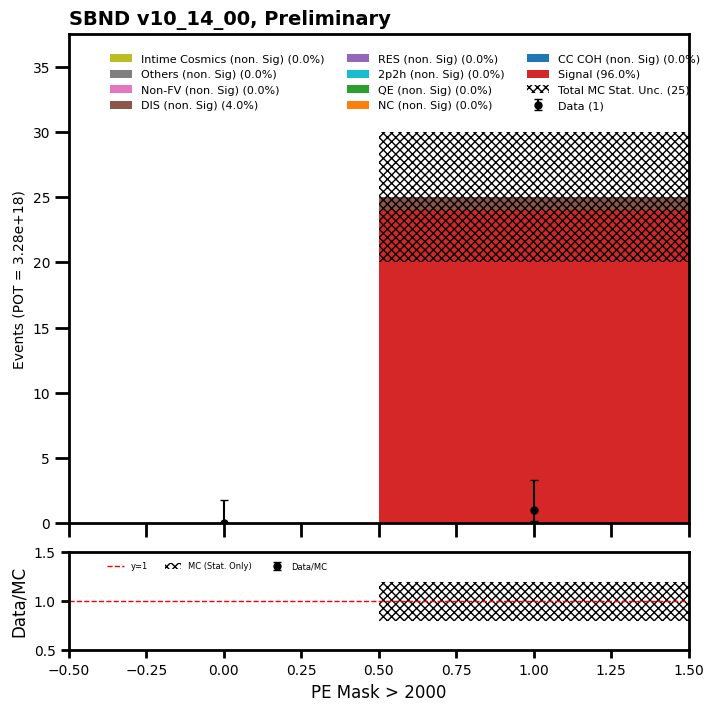

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2. 15.  8.  0.  0.  0.  0.  0.
  0.  0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan 0.5 0.  0.  nan nan nan nan nan
 nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


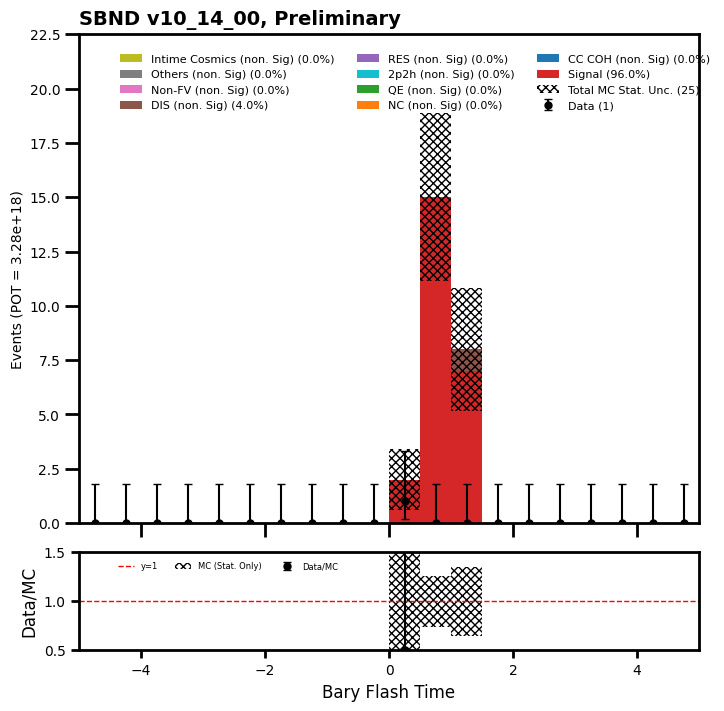

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[1 0]
[25  0]
data ratio  [0.04  nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


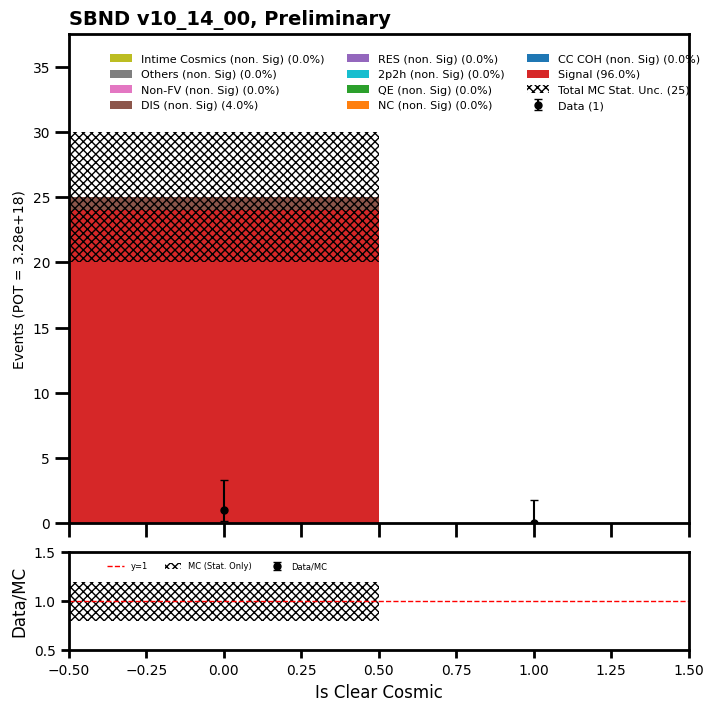

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 2. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 2. 1. 0. 0. 0. 2. 0. 0. 0.
 1. 0. 0. 0. 1. 0. 0. 2. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 2. 1. 1. 0.
 0. 0. 0. 0. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan  0.  0. nan  0. nan nan nan nan  0. nan nan nan nan nan  0. nan nan
 nan nan nan  0.  0. nan nan nan  0. nan nan inf  0. nan nan nan  0. nan
 nan  0. nan nan  0. nan  0. nan nan nan nan nan nan nan  0.  0.  0. nan
 nan nan nan nan nan  0. nan  0. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

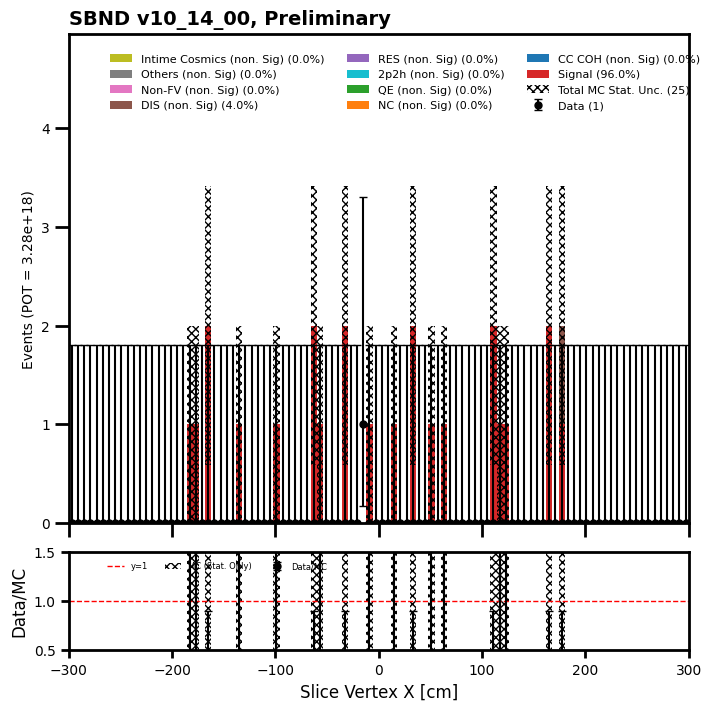

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 2. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 2.
 1. 0. 2. 0. 0. 1. 0. 0. 0. 2. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 2. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 inf nan nan nan nan nan  0. nan  0.  0. nan nan nan  0. nan  0.  0. nan
 nan nan nan  0. nan nan  0. nan nan  0. nan  0.  0. nan  0. nan nan  0.
 nan nan nan  0. nan  0. nan nan  0. nan nan nan nan  0. nan  0.  0. nan
 nan nan nan nan nan  0. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

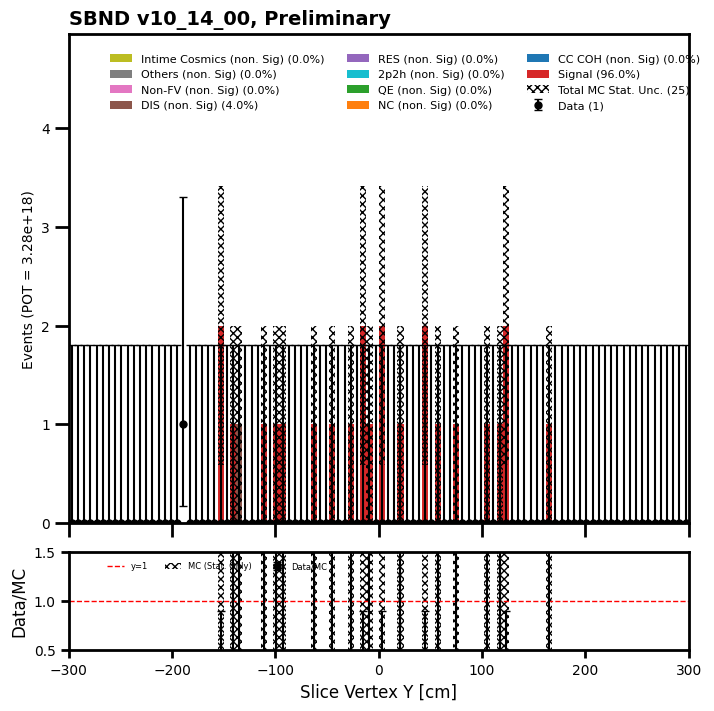

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 1. 2. 3. 0. 2. 2. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 2. 0. 0. 0. 1. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan  0. nan nan nan nan nan nan nan  0.  0.  0. nan  0.  0.  0.  0.
 nan nan nan nan  0.  0.  0. nan nan nan nan nan inf nan nan nan  0. nan
 nan nan  0. nan nan nan nan  0. nan nan nan nan nan nan nan  0. nan nan
  0. nan  0. nan nan nan  0. nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 - lolims), 1 - uplims]) * err


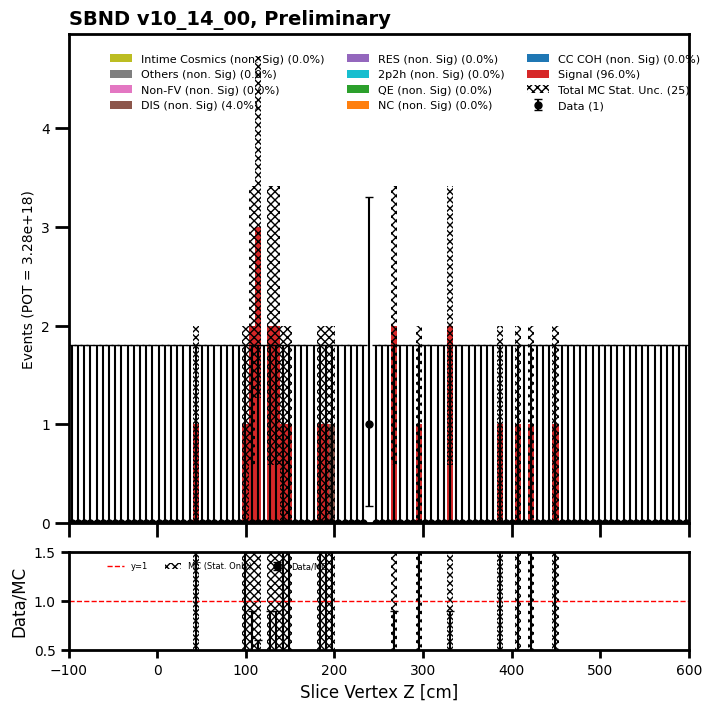

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 1. 4. 1. 2. 2. 2. 2. 7. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.                nan 0.
 0.         0.         0.         0.         0.         0.
 0.14285714 0.         0.                nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (no

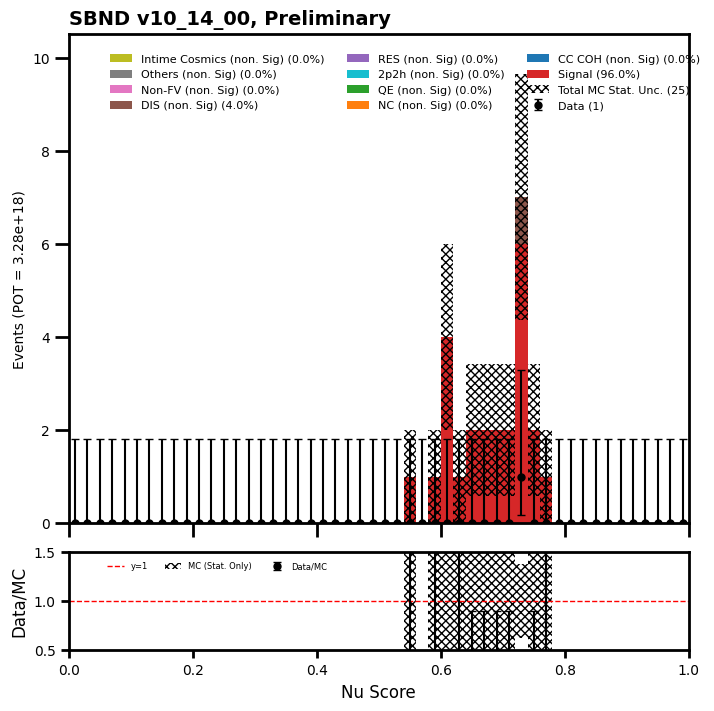

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[1. 4. 3. 4. 2. 3. 3. 1. 2. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
data ratio  [0.         0.         0.         0.         0.         0.
 0.33333333 0.         0.                nan 0.                nan
 0.                nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmic

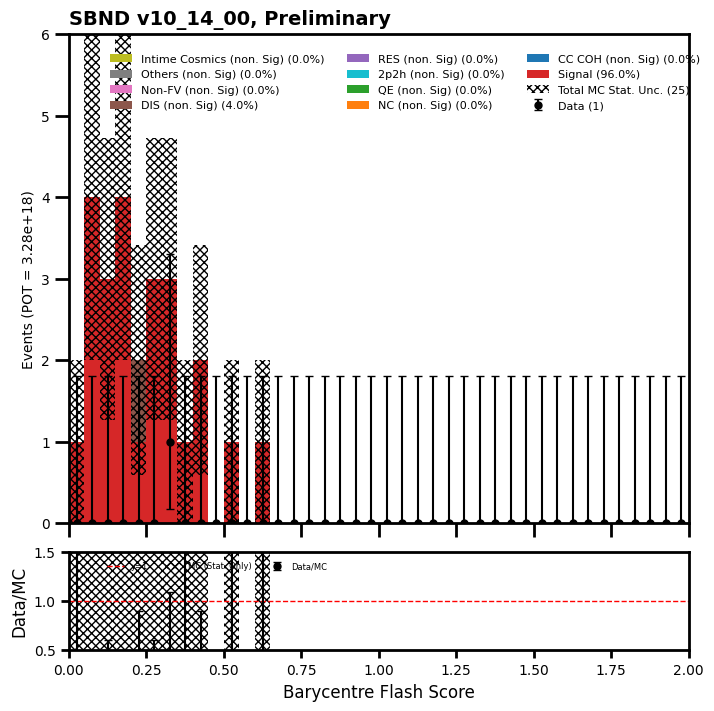

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 5. 3. 7. 1. 2. 1. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan  0. nan  0.  0.  0.  1.  0.  0.
  0. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


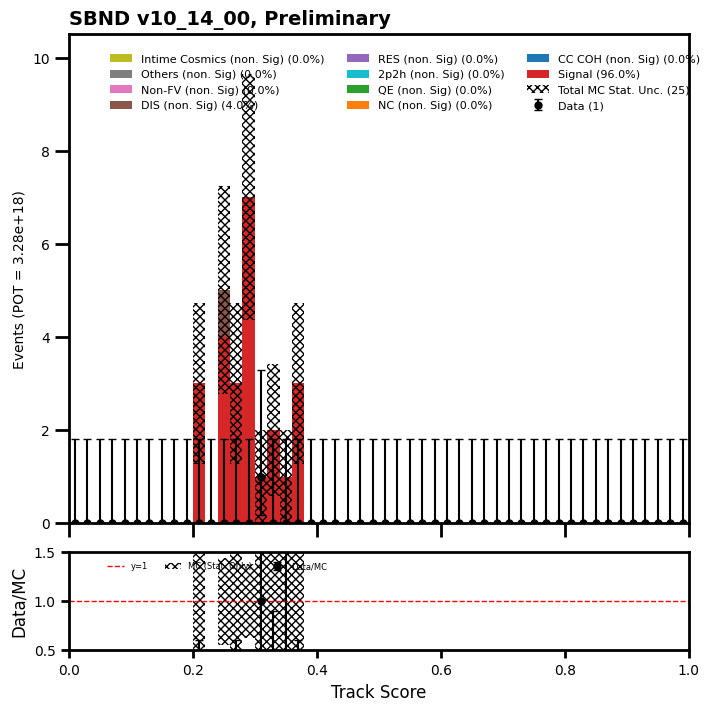

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 4. 3. 0. 4. 4. 0. 3. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 0.
 0.]
data ratio  [ nan  nan  nan  nan  nan 0.   0.    nan 0.   0.25  nan 0.   0.    nan
  nan 0.    nan  nan 0.   0.   0.    nan 0.    nan  nan]
mode sums =  [23.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [95.83333333333334, 0.0, 0.0, 0.0, 0.0, 0.0, 4.166666666666666, 0.0, 0.0, 0.0]
total sums =  24.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


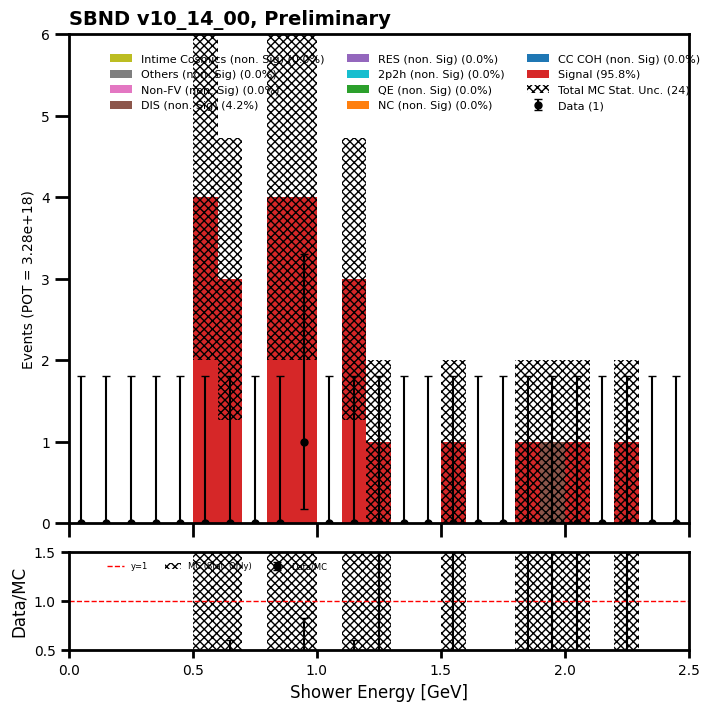

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 3. 1. 0. 0. 2. 0. 1. 1. 0. 1. 1. 0.
 1. 2. 2. 2. 0. 0. 1. 0. 1. 3. 0. 0. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan  0. nan nan nan nan  0.  0.  0. nan nan  0. inf
  0.  0. nan  0.  0. nan  0.  0.  0.  0. nan nan  0. nan  0.  0. nan nan
 nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
fractions =  [100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
total sums =  24.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


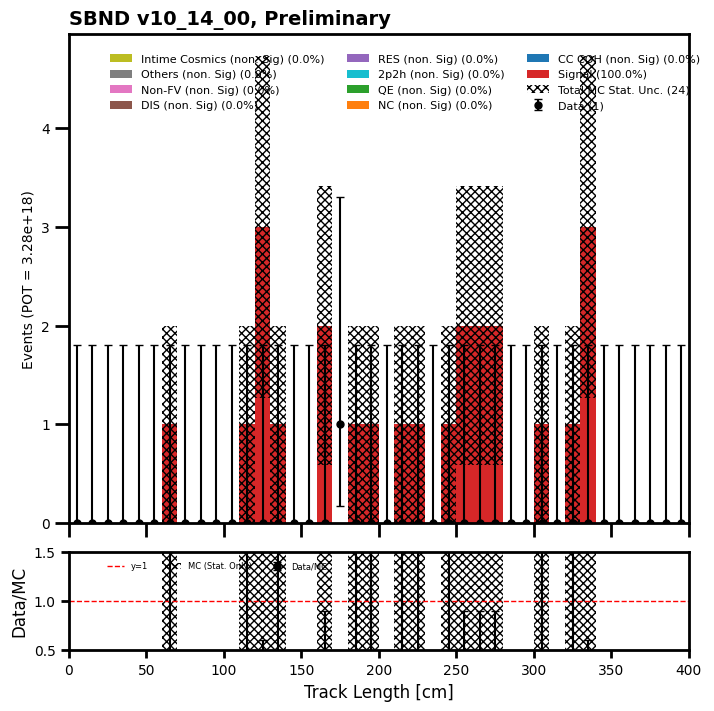

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[10.  7.  5.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [0.         0.14285714 0.         0.                nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV

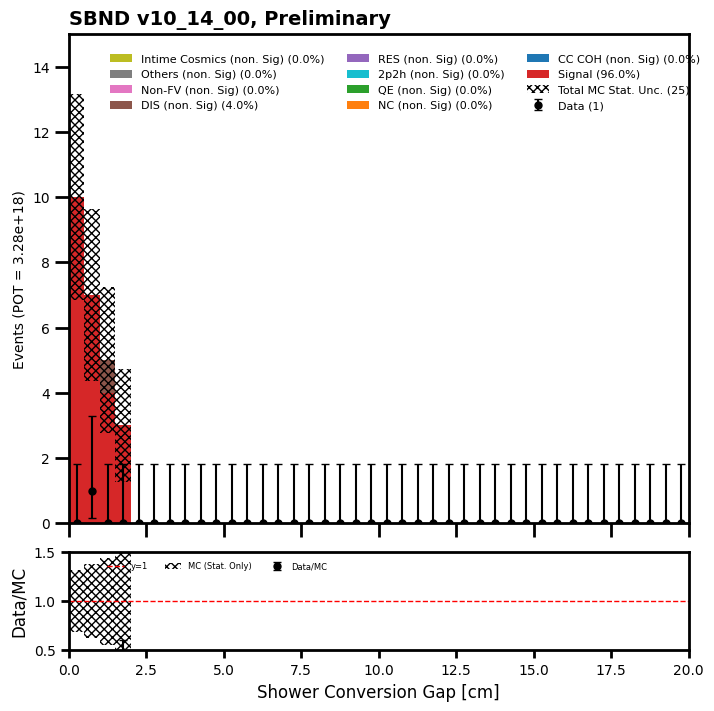

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  1. 20.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [ nan  nan 0.   0.05 0.    nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


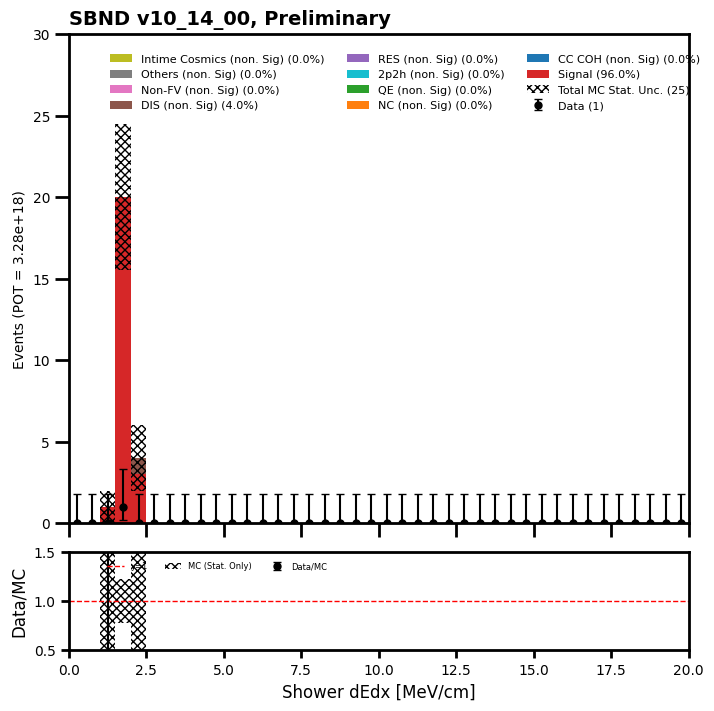

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1. 16.  8.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan  1.  0.  0. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


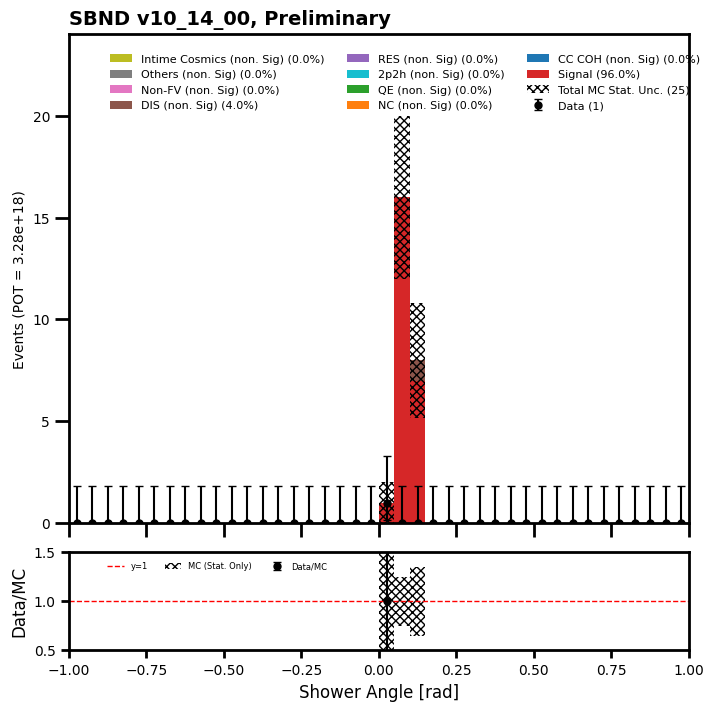

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 2. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1.
 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 2. 2. 2. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan  0. nan nan nan nan nan  0.
  0.  0. nan nan nan nan  0.  0. nan  0. nan  0.  0.  0. nan  

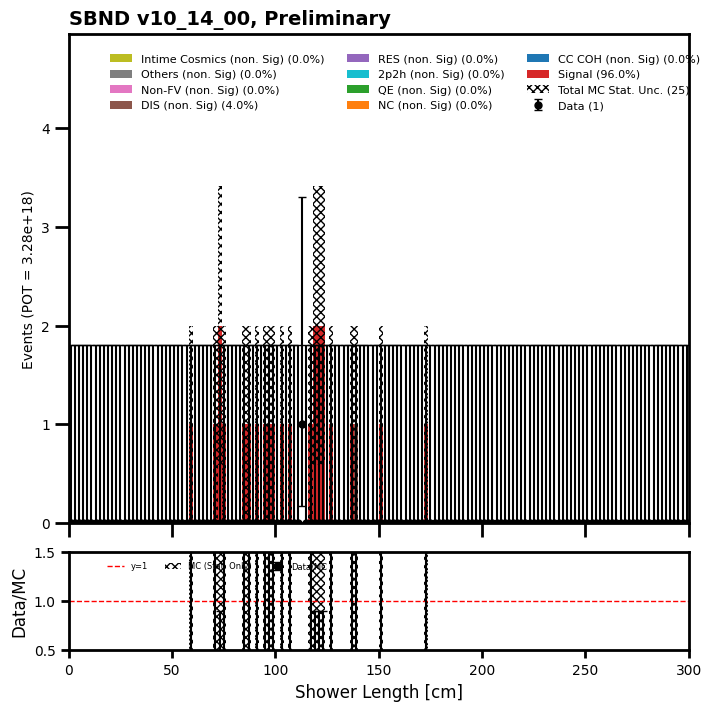

In [149]:
#shr opening angle

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_conv")

In [150]:
purity = 17.203702926635742/17.920524060726166
efficiency = 17.203702926635742/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  96.0 % and efficiency =  21.62 %


In [151]:
def make_lslen_filtered_df(df):
    lslen_cut = df[(df.pfp.trackScore < 0.5) & (df.pfp.shw.maxplane_energy > 0.5)].sort_values(df.pfp.index.names[:-1] + [('pfp','shw','maxplane_energy','','','')], ascending=True).groupby(level=[0,1]).nth(-1)
    lslen_cut = lslen_cut[(lslen_cut.pfp.shw.len < 200) & (lslen_cut.pfp.shw.len > 10)]
    lslen_mask = (lslen_cut == True)

    mc_bnb_cosmic_evt_lslen_mask = get_evt_pe_mask(lslen_mask, df)
    df[('lead_shower_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_lslen_mask

    valid_slices7 = df.lead_shower_len_m200[df.lead_shower_len_m200 == True].index

    filtered_df7 = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices7.droplevel('rec.slc.reco.pfp..index'))]

    return filtered_df7

In [152]:
filtered_df7 = make_lslen_filtered_df(mc_bnb_cosmic_dfs["evt"])
filtered_df7b = make_lslen_filtered_df(data_offbeam_light_dfs["evt"])
filtered_df7c = make_lslen_filtered_df(data_bnb_light_dfs["evt"])

/tmp/ipykernel_3794/1968921050.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[('lead_shower_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_lslen_mask
/tmp/ipykernel_3794/1968921050.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[('lead_shower_len_m200', '', '', '', '', '')] = mc_bnb_cosmic_evt_lslen_mask


In [153]:
mc_bnb_cosmic_dfs["evt"] = filtered_df7
data_offbeam_light_dfs["evt"] = filtered_df7b
data_bnb_light_dfs["evt"] = filtered_df7c

/tmp/ipykernel_3794/1280684055.py:65: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6986: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bins = np.histogram_bin_edges(
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7001: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
/tmp/ipykernel_3794/1280684055.py:87: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist_vals, _ = np.histogram(data, bins=bins, weights=w)
/tmp/ipykernel_3794/1280684055.py:88: RuntimeWarning

total data =  1
[0 1]
[ 0 25]
data ratio  [ nan 0.04]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


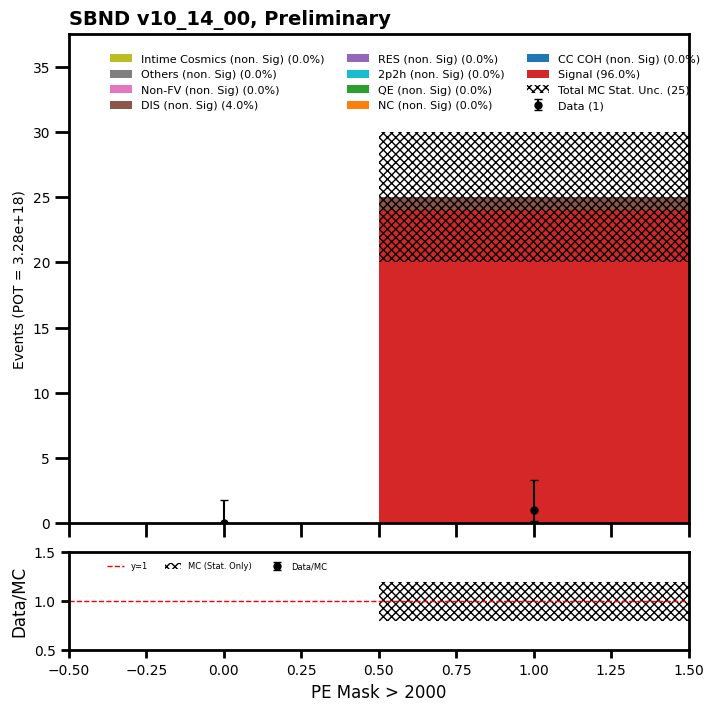

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2. 15.  8.  0.  0.  0.  0.  0.
  0.  0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan 0.5 0.  0.  nan nan nan nan nan
 nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


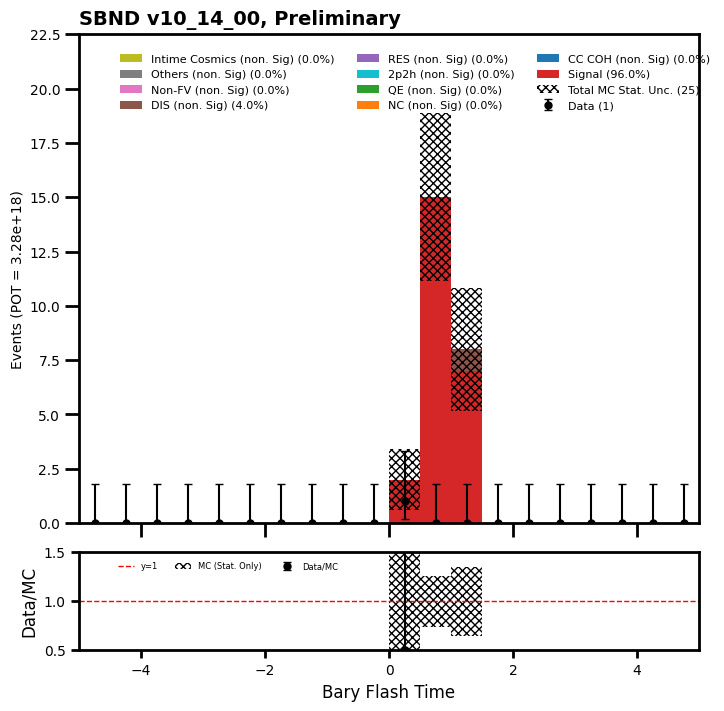

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[1 0]
[25  0]
data ratio  [0.04  nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


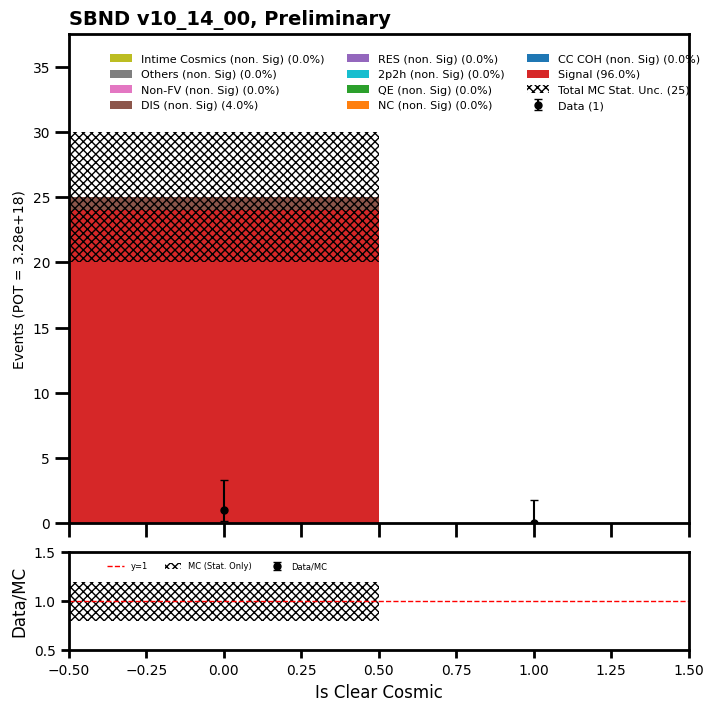

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 2. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 2. 1. 0. 0. 0. 2. 0. 0. 0.
 1. 0. 0. 0. 1. 0. 0. 2. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 2. 1. 1. 0.
 0. 0. 0. 0. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan  0.  0. nan  0. nan nan nan nan  0. nan nan nan nan nan  0. nan nan
 nan nan nan  0.  0. nan nan nan  0. nan nan inf  0. nan nan nan  0. nan
 nan  0. nan nan  0. nan  0. nan nan nan nan nan nan nan  0.  0.  0. nan
 nan nan nan nan nan  0. nan  0. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

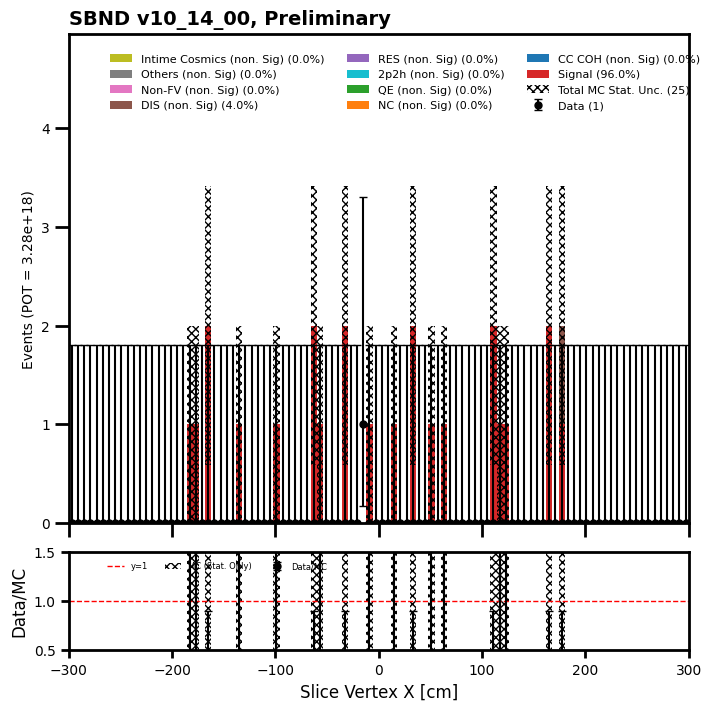

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 2. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 2.
 1. 0. 2. 0. 0. 1. 0. 0. 0. 2. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 2. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 inf nan nan nan nan nan  0. nan  0.  0. nan nan nan  0. nan  0.  0. nan
 nan nan nan  0. nan nan  0. nan nan  0. nan  0.  0. nan  0. nan nan  0.
 nan nan nan  0. nan  0. nan nan  0. nan nan nan nan  0. nan  0.  0. nan
 nan nan nan nan nan  0. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

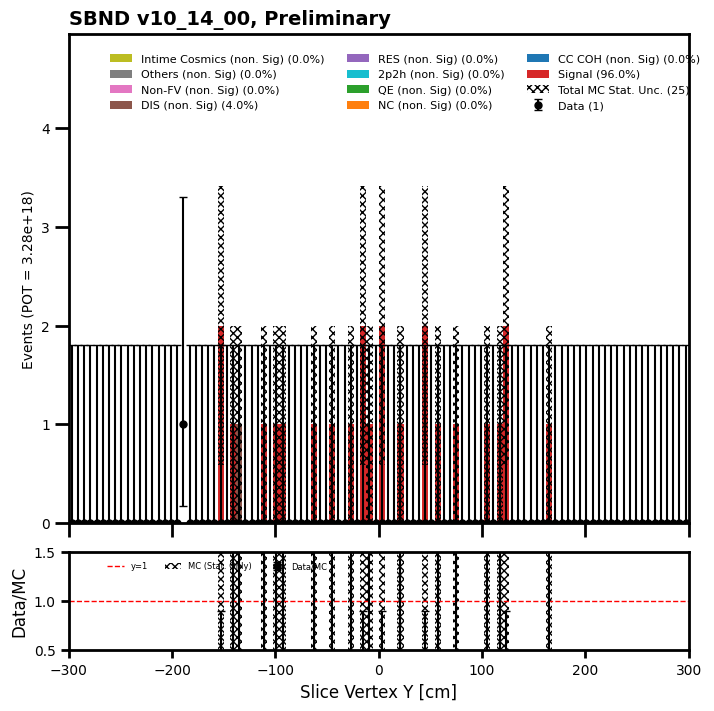

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 1. 2. 3. 0. 2. 2. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 2. 0. 0. 0. 1. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan  0. nan nan nan nan nan nan nan  0.  0.  0. nan  0.  0.  0.  0.
 nan nan nan nan  0.  0.  0. nan nan nan nan nan inf nan nan nan  0. nan
 nan nan  0. nan nan nan nan  0. nan nan nan nan nan nan nan  0. nan nan
  0. nan  0. nan nan nan  0. nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 

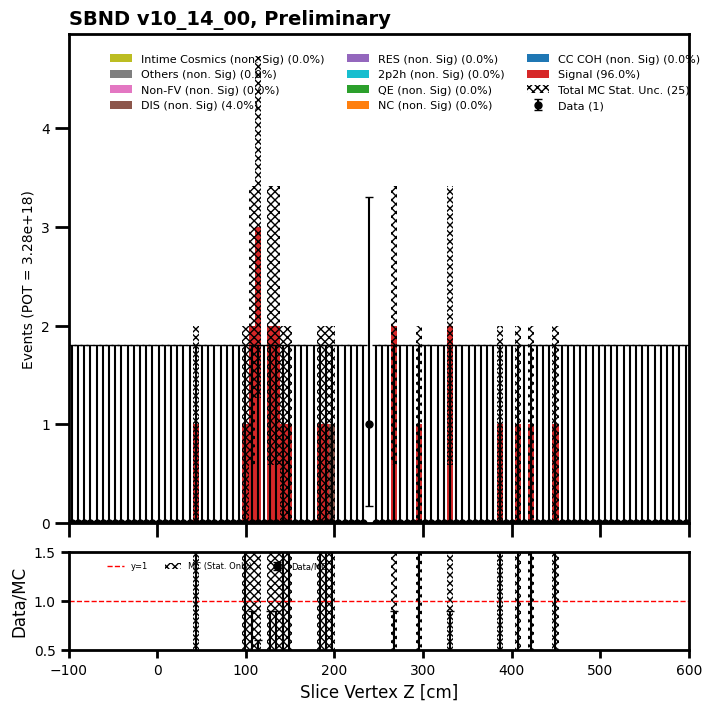

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 1. 4. 1. 2. 2. 2. 2. 7. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.                nan 0.
 0.         0.         0.         0.         0.         0.
 0.14285714 0.         0.                nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (no

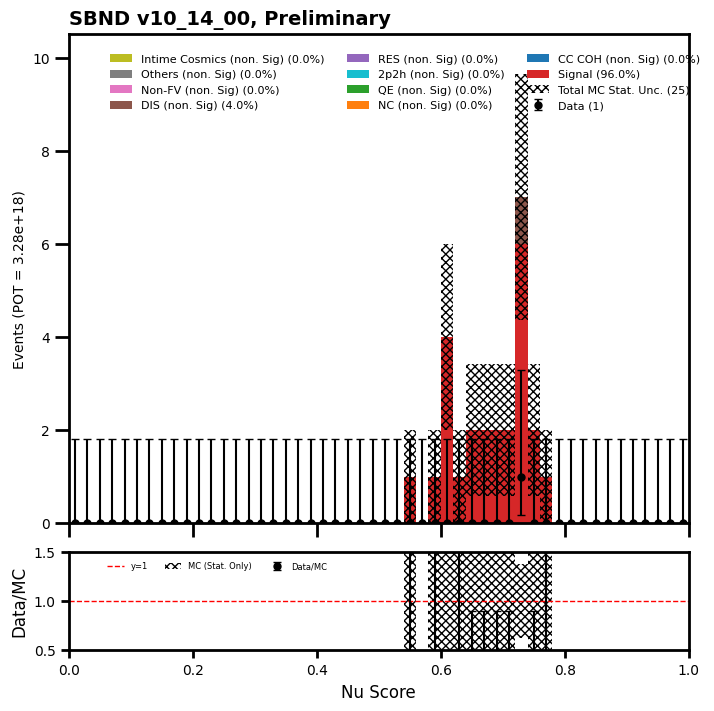

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[1. 4. 3. 4. 2. 3. 3. 1. 2. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
data ratio  [0.         0.         0.         0.         0.         0.
 0.33333333 0.         0.                nan 0.                nan
 0.                nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmic

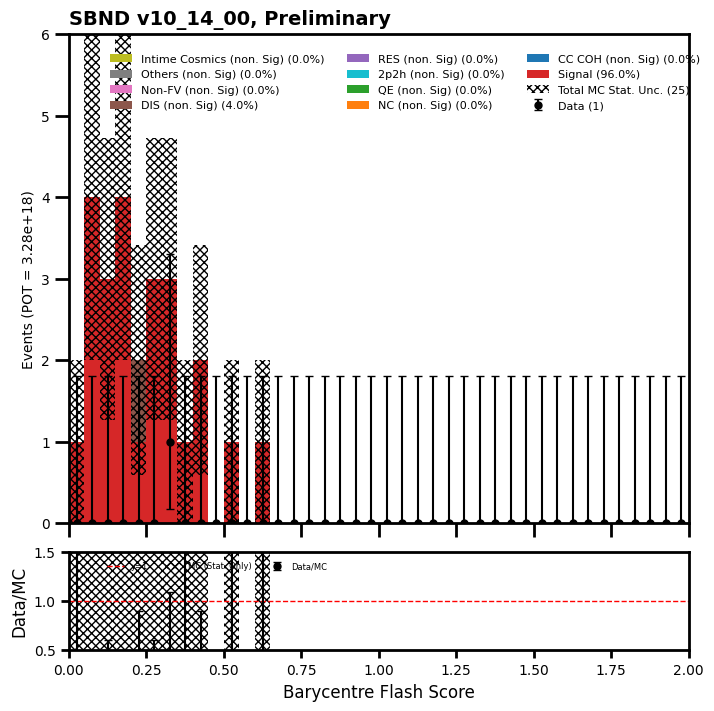

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 5. 3. 7. 1. 2. 1. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan  0. nan  0.  0.  0.  1.  0.  0.
  0. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


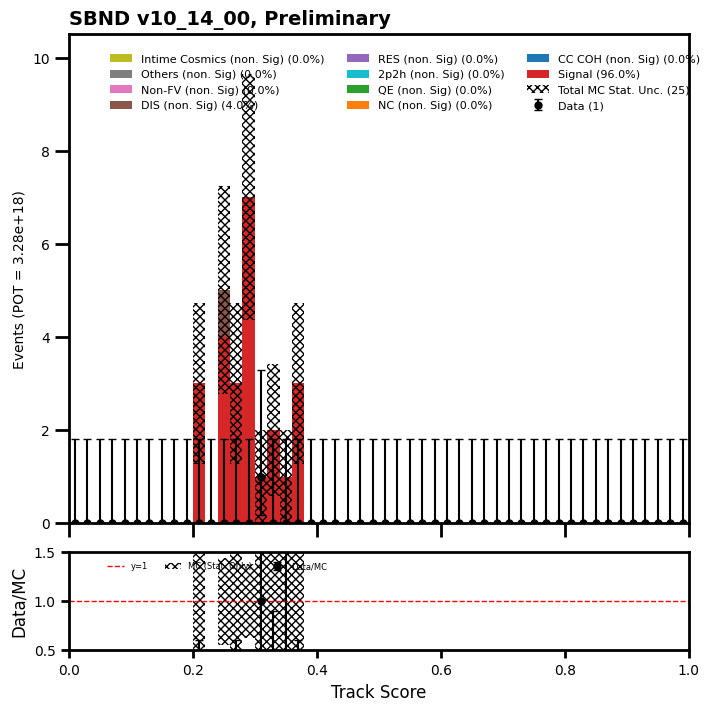

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 4. 3. 0. 4. 4. 0. 3. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 0.
 0.]
data ratio  [ nan  nan  nan  nan  nan 0.   0.    nan 0.   0.25  nan 0.   0.    nan
  nan 0.    nan  nan 0.   0.   0.    nan 0.    nan  nan]
mode sums =  [23.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [95.83333333333334, 0.0, 0.0, 0.0, 0.0, 0.0, 4.166666666666666, 0.0, 0.0, 0.0]
total sums =  24.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


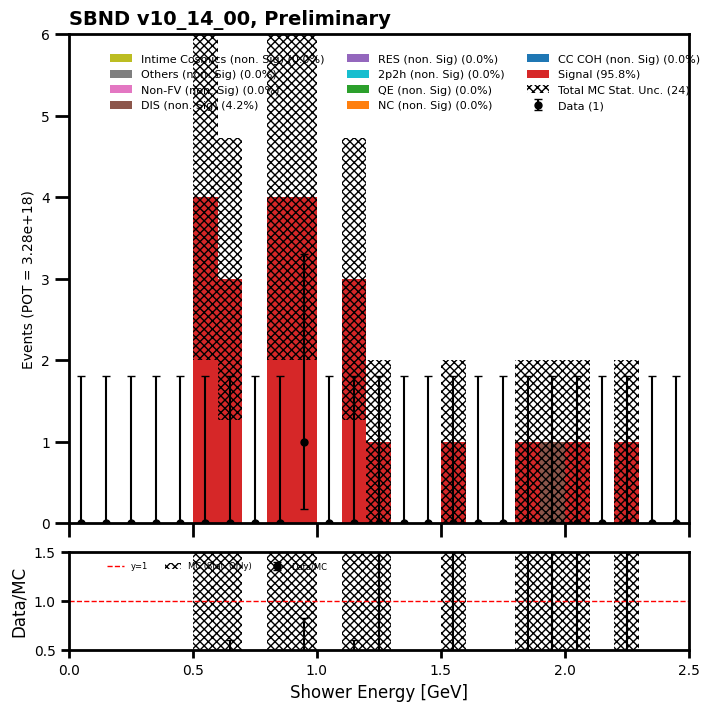

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 3. 1. 0. 0. 2. 0. 1. 1. 0. 1. 1. 0.
 1. 2. 2. 2. 0. 0. 1. 0. 1. 3. 0. 0. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan  0. nan nan nan nan  0.  0.  0. nan nan  0. inf
  0.  0. nan  0.  0. nan  0.  0.  0.  0. nan nan  0. nan  0.  0. nan nan
 nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
fractions =  [100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
total sums =  24.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


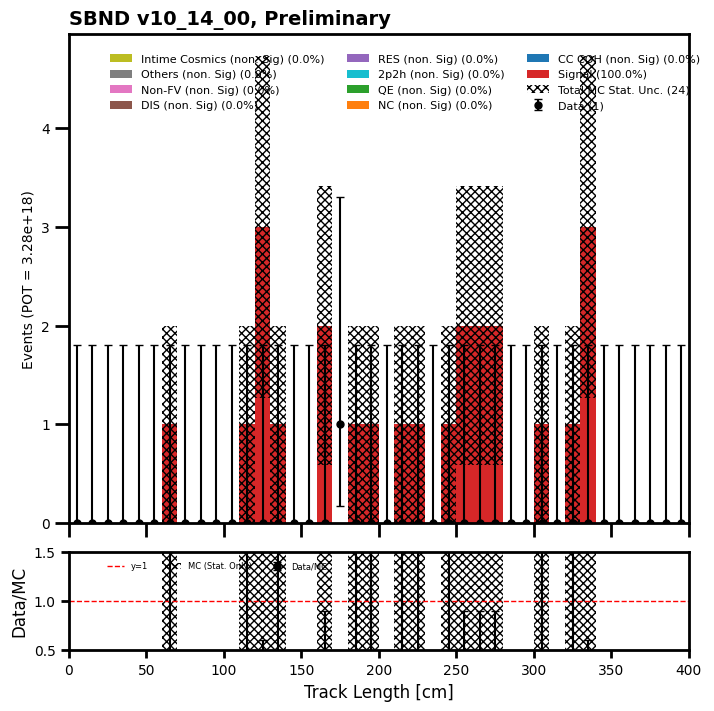

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[10.  7.  5.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [0.         0.14285714 0.         0.                nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV

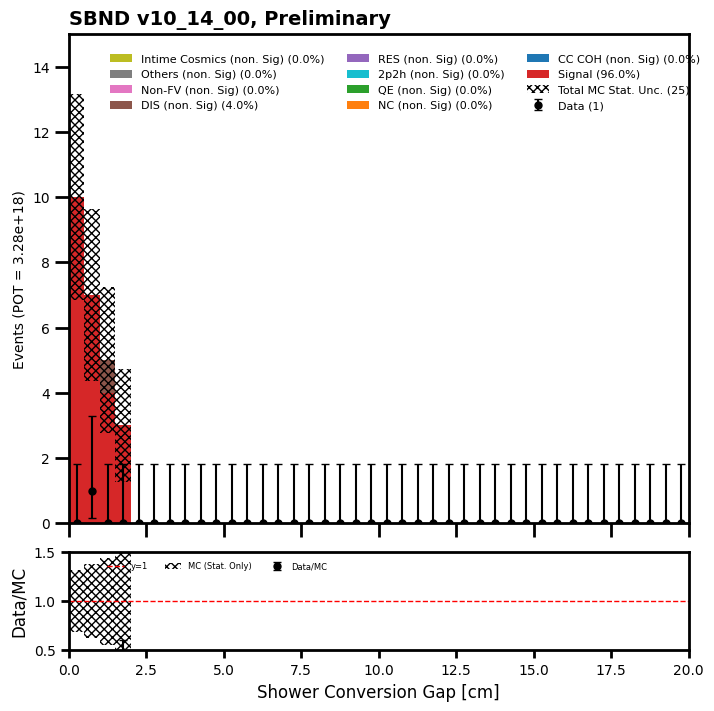

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  1. 20.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [ nan  nan 0.   0.05 0.    nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


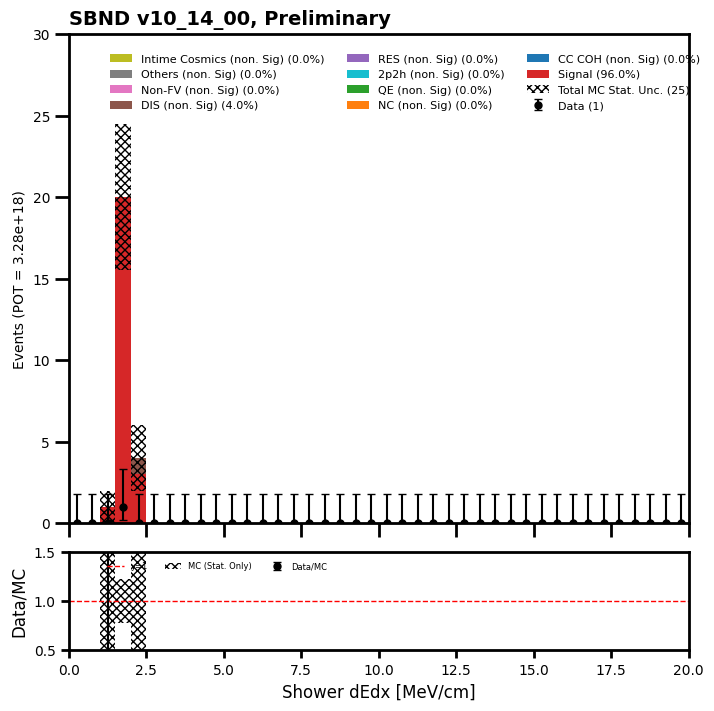

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1. 16.  8.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan  1.  0.  0. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan]
mode sums =  [24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
fractions =  [96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0]
total sums =  25.0
['Signal', 'CC COH (non. Sig)', 'NC (non. Sig)', 'QE (non. Sig)', '2p2h (non. Sig)', 'RES (non. Sig)', 'DIS (non. Sig)', 'Non-FV (non. Sig)', 'Others (non. Sig)', 'Intime Cosmics (non. Sig)']


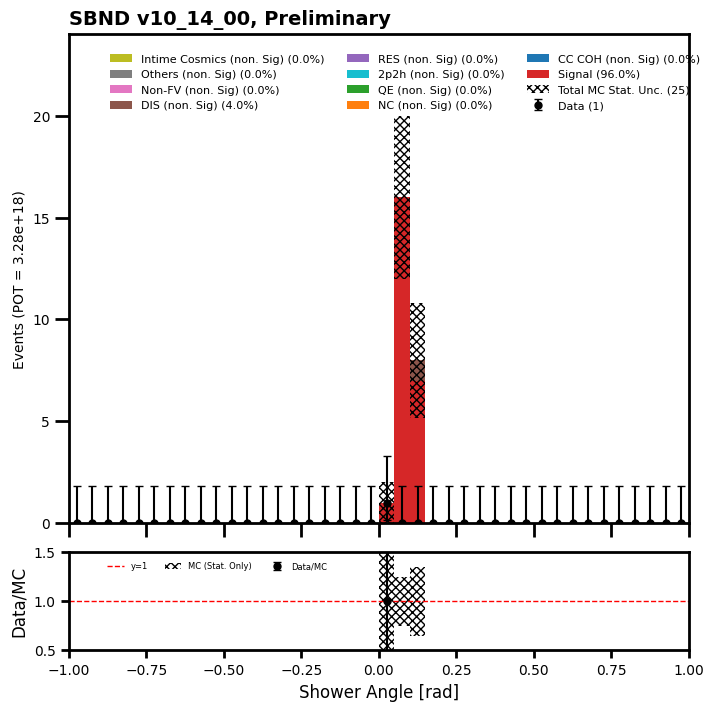

/tmp/ipykernel_3794/1280684055.py:114: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_3794/1280684055.py:115: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  1
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 2. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1.
 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 2. 2. 2. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
data ratio  [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan  0. nan nan nan nan nan  0.
  0.  0. nan nan nan nan  0.  0. nan  0. nan  0.  0.  0. nan  

/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:169: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_3794/1280684055.py:173: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_3794/1280684055.py:174: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 - lolims), 1 - uplims]) * err


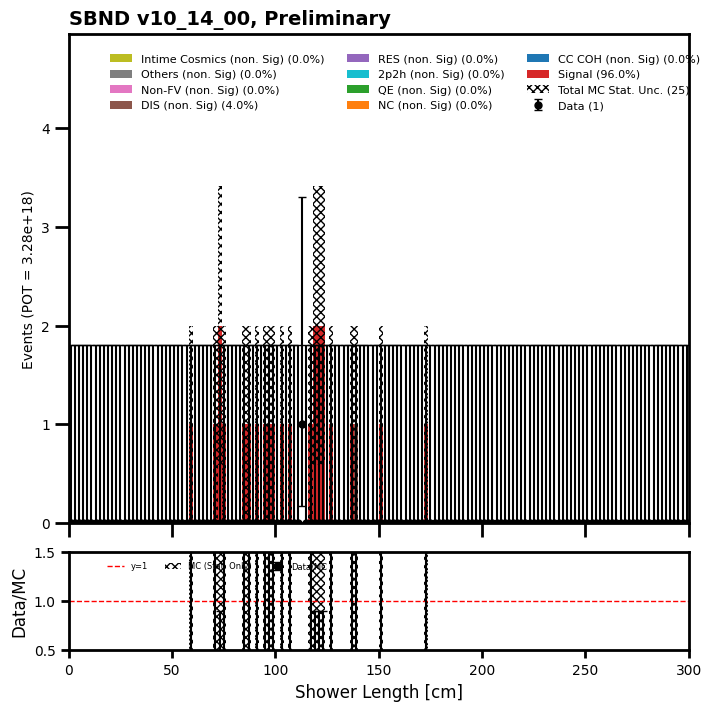

In [154]:
#shr len

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_conv")

In [114]:
purity = 17.203702926635742/17.920524060726166
efficiency = 17.203702926635742/79.56706237792969
print("purity = ", round(purity*100,2), "% and efficiency = ", round(efficiency*100,2), "%")

purity =  96.0 % and efficiency =  21.62 %


In [115]:
#how many pfps in a slice
group_levels = ['entry', 'rec.slc..index']
mc_bnb_cosmic_dfs["evt"].groupby(level=group_levels).size()

entry  rec.slc..index
3      0                 3
14     1                 3
22     1                 4
26     1                 4
27     0                 5
46     0                 4
85     0                 5
89     1                 4
129    0                 4
153    0                 4
161    0                 5
163    0                 5
       1                 4
164    1                 3
177    1                 3
192    0                 3
194    1                 4
233    0                 3
249    1                 6
256    1                 4
287    0                 5
378    1                 4
412    2                 3
413    1                 7
424    0                 4
dtype: int64

In [156]:
nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')
column = ('pfp', 'shw', 'len', '', '', '')
mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()

,,,pfp,gen
,,,shw,nuint_categ
,,,len,
,,,,
,,,,
,,,,
__ntuple,entry,rec.slc..index,,
1,192,0,86.950394,1.0
13,22,1,126.331810,1.0
21,424,0,58.799866,1.0
24,3,0,123.967560,1.0


In [76]:
mc_bnb_cosmic_dfs["evt"].groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first().value_counts()

(pfp, shw, len, , , )  (gen, nuint_categ, , , , )
-5.000000              -2.0                          286
                       -1.0                           17
 363.082642            -2.0                            4
 85.810425             -2.0                            3
 229.818298            -2.0                            3
                                                    ... 
 100.372437            -2.0                            1
 100.372513            -2.0                            1
 100.372620            -2.0                            1
 100.372787            -2.0                            1
 652.866394            -2.0                            1
Name: count, Length: 724886, dtype: int64

In [157]:
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts()

#25 vs 98 - missing something with numc counting too?

nuint_categ
1.0    98
6.0     5
Name: count, dtype: int64

In [158]:
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64